Deliverable 1: Preprocessing the Data for a Neural Network

# Optimization Attempt 2: Adding a 3rd hidden layer and increasing epochs to 150

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import pandas as pd
import tensorflow as tf

#  Import and read the charity_data.csv.
import pandas as pd 
application_df = pd.read_csv("./Resources/charity_data.csv")
application_df.head()

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages

,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [2]:
# Drop the non-beneficial ID columns, 'EIN' and 'NAME'.
application_df = application_df.drop(columns=["EIN","NAME"])
application_df.head()

,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [3]:
# Determine the number of unique values in each column.
application_df.nunique()

APPLICATION_TYPE            17
AFFILIATION                  6
CLASSIFICATION              71
USE_CASE                     5
ORGANIZATION                 4
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [4]:
# Look at APPLICATION_TYPE value counts for binning
application_type_counts = application_df.APPLICATION_TYPE.value_counts()
application_type_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T25        3
T14        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

<AxesSubplot:ylabel='Density'>

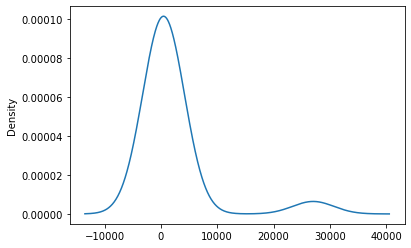

In [5]:
# Visualize the value counts of APPLICATION_TYPE
application_type_counts.plot.density()

In [6]:

# Determine which values to replace if counts are less than ...?
replace_application = list(application_type_counts[application_type_counts < 500].index)

# Replace in dataframe
for app in replace_application:
    application_df.APPLICATION_TYPE = application_df.APPLICATION_TYPE.replace(app,"Other")
    
# Check to make sure binning was successful
application_df.APPLICATION_TYPE.value_counts()

T3       27037
T4        1542
T6        1216
T5        1173
T19       1065
T8         737
T7         725
T10        528
Other      276
Name: APPLICATION_TYPE, dtype: int64

In [7]:
# Look at CLASSIFICATION value counts for binning
calssification_counts = application_df.CLASSIFICATION.value_counts()
calssification_counts

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
         ...  
C4120        1
C8210        1
C2561        1
C4500        1
C2150        1
Name: CLASSIFICATION, Length: 71, dtype: int64

<AxesSubplot:ylabel='Density'>

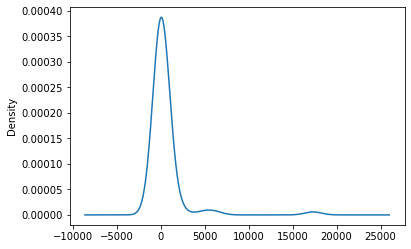

In [8]:
# Visualize the value counts of CLASSIFICATION
calssification_counts.plot.density()

In [9]:
# Determine which values to replace if counts are less than ..?
replace_class = list(calssification_counts[calssification_counts < 1800].index)

# Replace in dataframe
for cls in replace_class:
    application_df.CLASSIFICATION = application_df.CLASSIFICATION.replace(cls,"Other")
    
# Check to make sure binning was successful
application_df.CLASSIFICATION.value_counts()

C1000    17326
C2000     6074
C1200     4837
Other     2261
C3000     1918
C2100     1883
Name: CLASSIFICATION, dtype: int64

In [10]:
# Generate our categorical variable lists
application_cat = application_df.dtypes[application_df.dtypes == "object"].index.tolist()
application_cat

['APPLICATION_TYPE',
 'AFFILIATION',
 'CLASSIFICATION',
 'USE_CASE',
 'ORGANIZATION',
 'INCOME_AMT',
 'SPECIAL_CONSIDERATIONS']

In [11]:
# Create a OneHotEncoder instance
enc = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df = pd.DataFrame(enc.fit_transform(application_df[application_cat]))

# Add the encoded variable names to the dataframe
encode_df.columns = enc.get_feature_names(application_cat)
encode_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,APPLICATION_TYPE_T7,APPLICATION_TYPE_T8,AFFILIATION_CompanySponsored,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [12]:
# Merge one-hot encoded features and drop the originals
application_df = application_df.merge(encode_df,left_index=True, right_index=True)
application_df = application_df.drop(application_cat,1)
application_df.head()

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


,STATUS,ASK_AMT,IS_SUCCESSFUL,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# Split our preprocessed data into our features and target arrays
y = application_df["IS_SUCCESSFUL"].values
X = application_df.drop(["IS_SUCCESSFUL"],1).values
# Split the preprocessed data into a training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


In [14]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

Deliverable 2: Compile, Train, and Evaluate the Model

In [15]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 40
hidden_nodes_layer3 = 20
nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu"))

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Third hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer3, activation="relu"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 80)                3520      
_________________________________________________________________
dense_1 (Dense)              (None, 40)                3240      
_________________________________________________________________
dense_2 (Dense)              (None, 20)                820       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 21        
Total params: 7,601
Trainable params: 7,601
Non-trainable params: 0
_________________________________________________________________


In [16]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [17]:
# Import checkpoint dependencies
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint path and filenames
os.makedirs("checkpoints/",exist_ok=True)
checkpoint_path = "checkpoints/weights.{epoch:02d}.hdf5"

# Create a callback that saves the model's weights every 5 epochs
# Syntax for saving every 5 epochs found at: 
#https://towardsdatascience.com/checkpointing-deep-learning-models-in-keras-a652570b8de6
cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=5)

In [18]:
# Train the model
fit_model = nn.fit(X_train_scaled,y_train,epochs=150,callbacks=[cp_callback])

Epoch 1/150

Epoch 00001: saving model to checkpoints/weights.01.hdf5
   32/25724 [..............................] - ETA: 2:19 - loss: 0.7386 - acc: 0.5625
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  160/25724 [..............................] - ETA: 37s - loss: 0.7183 - acc: 0.5813 
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  288/25724 [..............................] - ETA: 25s - loss: 0.7058 - acc: 0.5556
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoi

 3264/25724 [==>...........................] - ETA: 11s - loss: 0.6285 - acc: 0.6765
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3392/25724 [==>...........................] - ETA: 11s - loss: 0.6277 - acc: 0.6760
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3520/25724 [===>..........................] - ETA: 11s - loss: 0.6264 - acc: 0.6767
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3648/25724 [===>..........................] - ETA: 

 6592/25724 [======>.......................] - ETA: 9s - loss: 0.5975 - acc: 0.7033
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6720/25724 [======>.......................] - ETA: 9s - loss: 0.5965 - acc: 0.7043
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6848/25724 [======>.......................] - ETA: 9s - loss: 0.5958 - acc: 0.7052
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6976/25724 [=======>......................] - ETA: 9s 


Epoch 00001: saving model to checkpoints/weights.01.hdf5
 9888/25724 [==========>...................] - ETA: 7s - loss: 0.5895 - acc: 0.7083
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
10016/25724 [==========>...................] - ETA: 7s - loss: 0.5885 - acc: 0.7089
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
10112/25724 [==========>...................] - ETA: 7s - loss: 0.5884 - acc: 0.7081
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
10240/25724 [==========>...................] - ETA: 7s 

13120/25724 [==============>...............] - ETA: 6s - loss: 0.5835 - acc: 0.7103
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13248/25724 [==============>...............] - ETA: 6s - loss: 0.5829 - acc: 0.7108
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13376/25724 [==============>...............] - ETA: 6s - loss: 0.5834 - acc: 0.7105
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13504/25724 [==============>...............] - ETA: 5s 

16416/25724 [==================>...........] - ETA: 4s - loss: 0.5780 - acc: 0.7156
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
16544/25724 [==================>...........] - ETA: 4s - loss: 0.5778 - acc: 0.7158
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
16672/25724 [==================>...........] - ETA: 4s - loss: 0.5779 - acc: 0.7153
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
16800/25724 [==================>...........] - ETA: 4s 


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
19808/25724 [======================>.......] - ETA: 2s - loss: 0.5765 - acc: 0.7162
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
19936/25724 [======================>.......] - ETA: 2s - loss: 0.5763 - acc: 0.7162
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
20064/25724 [======================>.......] - ETA: 2s - loss: 0.5760 - acc: 0.7165
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hd

23040/25724 [=========================>....] - ETA: 1s - loss: 0.5731 - acc: 0.7185
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.5728 - acc: 0.7186
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
23296/25724 [==========================>...] - ETA: 1s - loss: 0.5727 - acc: 0.7188
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.5729 - acc: 0.7185
Epoch 00001: saving model to 

  512/25724 [..............................] - ETA: 12s - loss: 0.5633 - acc: 0.7402
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.5670 - acc: 0.7375
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
  768/25724 [..............................] - ETA: 11s - loss: 0.5624 - acc: 0.7396
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
  896/25724 [>.............................] - ETA: 

 3808/25724 [===>..........................] - ETA: 10s - loss: 0.5581 - acc: 0.7279
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 3936/25724 [===>..........................] - ETA: 10s - loss: 0.5570 - acc: 0.7297
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 4064/25724 [===>..........................] - ETA: 9s - loss: 0.5565 - acc: 0.7293 
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 4192/25724 [===>..........................] - ETA: 

 7104/25724 [=======>......................] - ETA: 8s - loss: 0.5542 - acc: 0.7307
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 7232/25724 [=======>......................] - ETA: 8s - loss: 0.5532 - acc: 0.7317
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 7360/25724 [=======>......................] - ETA: 8s - loss: 0.5528 - acc: 0.7318
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 7488/25724 [=======>......................] - ETA: 8s 


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.5563 - acc: 0.7294
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.5561 - acc: 0.7296
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
10720/25724 [===========>..................] - ETA: 7s - loss: 0.5559 - acc: 0.7296
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
13760/25724 [===============>..............] - ETA: 5s - loss: 0.5544 - acc: 0.7305
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
13888/25724 [===============>..............] - ETA: 5s - loss: 0.5543 - acc: 0.7309
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
14016/25724 [===============>..............] - ETA: 5s - loss: 0.5541 - acc: 0.7312
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd

17024/25724 [==================>...........] - ETA: 4s - loss: 0.5537 - acc: 0.7323
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
17152/25724 [===================>..........] - ETA: 4s - loss: 0.5537 - acc: 0.7323
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
17280/25724 [===================>..........] - ETA: 3s - loss: 0.5536 - acc: 0.7325
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
17408/25724 [===================>..........] - ETA: 3s 


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5531 - acc: 0.7327
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5536 - acc: 0.7321
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.5538 - acc: 0.7320
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd

23648/25724 [==========================>...] - ETA: 0s - loss: 0.5547 - acc: 0.7316
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
23776/25724 [==========================>...] - ETA: 0s - loss: 0.5547 - acc: 0.7317
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5549 - acc: 0.7315
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
24032/25724 [===========================>..] - ETA: 0s 

 1184/25724 [>.............................] - ETA: 11s - loss: 0.5554 - acc: 0.7213
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 1312/25724 [>.............................] - ETA: 11s - loss: 0.5517 - acc: 0.7210
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 1440/25724 [>.............................] - ETA: 11s - loss: 0.5479 - acc: 0.7264
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 1568/25724 [>.............................] - ETA: 

 4480/25724 [====>.........................] - ETA: 9s - loss: 0.5481 - acc: 0.7328
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 4608/25724 [====>.........................] - ETA: 9s - loss: 0.5491 - acc: 0.7316
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 4736/25724 [====>.........................] - ETA: 9s - loss: 0.5487 - acc: 0.7323
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 4864/25724 [====>.........................] - ETA: 9s 

 7776/25724 [========>.....................] - ETA: 8s - loss: 0.5473 - acc: 0.7360
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 7904/25724 [========>.....................] - ETA: 8s - loss: 0.5468 - acc: 0.7366
Epoch 00003: saving model to checkpoints/weights.03.hdf5
 7936/25724 [========>.....................] - ETA: 8s - loss: 0.5467 - acc: 0.7366
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 8096/25724 [========>.....................] - ETA: 8s - loss: 0.5457 - acc: 0.7374
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to 


Epoch 00003: saving model to checkpoints/weights.03.hdf5
11104/25724 [===========>..................] - ETA: 6s - loss: 0.5510 - acc: 0.7326
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
11232/25724 [============>.................] - ETA: 6s - loss: 0.5513 - acc: 0.7319
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
11328/25724 [============>.................] - ETA: 6s - loss: 0.5511 - acc: 0.7320
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
11456/25724 [============>.................] - ETA: 6s 


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
14432/25724 [===============>..............] - ETA: 5s - loss: 0.5510 - acc: 0.7319
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
14528/25724 [===============>..............] - ETA: 5s - loss: 0.5518 - acc: 0.7316
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
14656/25724 [================>.............] - ETA: 5s - loss: 0.5514 - acc: 0.7320
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
17728/25724 [===================>..........] - ETA: 3s - loss: 0.5514 - acc: 0.7312
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
17856/25724 [===================>..........] - ETA: 3s - loss: 0.5512 - acc: 0.7312
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
17984/25724 [===================>..........] - ETA: 3s - loss: 0.5511 - acc: 0.7314
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd

21024/25724 [=======================>......] - ETA: 2s - loss: 0.5504 - acc: 0.7322
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.5511 - acc: 0.7316
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21280/25724 [=======================>......] - ETA: 2s - loss: 0.5511 - acc: 0.7315
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.5513 - acc: 0.7312
Epoch 00003: saving model to 


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5512 - acc: 0.7312
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.5511 - acc: 0.7313
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5511 - acc: 0.7314
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd

 1920/25724 [=>............................] - ETA: 11s - loss: 0.5524 - acc: 0.7312
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2048/25724 [=>............................] - ETA: 11s - loss: 0.5531 - acc: 0.7300
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2176/25724 [=>............................] - ETA: 10s - loss: 0.5504 - acc: 0.7335
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2304/25724 [=>............................] - ETA: 


Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5248/25724 [=====>........................] - ETA: 9s - loss: 0.5527 - acc: 0.7302
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5376/25724 [=====>........................] - ETA: 9s - loss: 0.5542 - acc: 0.7292
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5472/25724 [=====>........................] - ETA: 9s - loss: 0.5540 - acc: 0.7295
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5568/25724 [=====>........................] - ETA: 9s - loss: 0.5535 - acc: 0.7299
Epoch 00004: saving model to 


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 8576/25724 [=========>....................] - ETA: 8s - loss: 0.5523 - acc: 0.7304
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 8704/25724 [=========>....................] - ETA: 8s - loss: 0.5525 - acc: 0.7301
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 8832/25724 [=========>....................] - ETA: 8s - loss: 0.5541 - acc: 0.7288
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
11968/25724 [============>.................] - ETA: 6s - loss: 0.5531 - acc: 0.7303
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
12096/25724 [=============>................] - ETA: 6s - loss: 0.5529 - acc: 0.7302
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
12224/25724 [=============>................] - ETA: 6s - loss: 0.5525 - acc: 0.7305
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
15328/25724 [================>.............] - ETA: 4s - loss: 0.5532 - acc: 0.7300
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
15456/25724 [=================>............] - ETA: 4s - loss: 0.5532 - acc: 0.7299
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
15584/25724 [=================>............] - ETA: 4s - loss: 0.5530 - acc: 0.7304
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd

18656/25724 [====================>.........] - ETA: 3s - loss: 0.5516 - acc: 0.7303
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.5515 - acc: 0.7302
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.5516 - acc: 0.7300
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
19040/25724 [=====================>........] - ETA: 3s 


Epoch 00004: saving model to checkpoints/weights.04.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.5512 - acc: 0.7316
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.5515 - acc: 0.7313
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5513 - acc: 0.7314
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd

25312/25724 [============================>.] - ETA: 0s - loss: 0.5502 - acc: 0.7323
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5507 - acc: 0.7317
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5505 - acc: 0.7318
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
25696/25724 [============================>.] - ETA: 0s 


Epoch 00005: saving model to checkpoints/weights.05.hdf5
 2752/25724 [==>...........................] - ETA: 12s - loss: 0.5571 - acc: 0.7257
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 2880/25724 [==>...........................] - ETA: 12s - loss: 0.5568 - acc: 0.7260
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 2976/25724 [==>...........................] - ETA: 12s - loss: 0.5568 - acc: 0.7265
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 3072/25724 [==>...........................] - ETA: 12s - loss: 0.5569 - acc: 0.7253
Epoch 00005: saving model

 5952/25724 [=====>........................] - ETA: 10s - loss: 0.5529 - acc: 0.7290
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 6080/25724 [======>.......................] - ETA: 10s - loss: 0.5526 - acc: 0.7291
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 6176/25724 [======>.......................] - ETA: 10s - loss: 0.5529 - acc: 0.7283
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5542 - acc: 0.7269
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model

 9280/25724 [=========>....................] - ETA: 8s - loss: 0.5515 - acc: 0.7320
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9408/25724 [=========>....................] - ETA: 8s - loss: 0.5508 - acc: 0.7325
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.5501 - acc: 0.7332
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9664/25724 [==========>...................] - ETA: 7s 


Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
12736/25724 [=============>................] - ETA: 6s - loss: 0.5514 - acc: 0.7321
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
12864/25724 [==============>...............] - ETA: 6s - loss: 0.5506 - acc: 0.7330
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
12992/25724 [==============>...............] - ETA: 6s - loss: 0.5505 - acc: 0.7331
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd

16096/25724 [=================>............] - ETA: 4s - loss: 0.5477 - acc: 0.7355
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
16224/25724 [=================>............] - ETA: 4s - loss: 0.5472 - acc: 0.7361
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
16352/25724 [==================>...........] - ETA: 4s - loss: 0.5470 - acc: 0.7361
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
16480/25724 [==================>...........] - ETA: 4s 

19424/25724 [=====================>........] - ETA: 2s - loss: 0.5483 - acc: 0.7350
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
19552/25724 [=====================>........] - ETA: 2s - loss: 0.5482 - acc: 0.7353
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.5481 - acc: 0.7352
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd

22816/25724 [=========================>....] - ETA: 1s - loss: 0.5493 - acc: 0.7341
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5494 - acc: 0.7342
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
23072/25724 [=========================>....] - ETA: 1s - loss: 0.5490 - acc: 0.7344
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.5490 - acc: 0.7342
Epoch 00005: saving model to 


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
  416/25724 [..............................] - ETA: 11s - loss: 0.5434 - acc: 0.7308
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
  544/25724 [..............................] - ETA: 11s - loss: 0.5401 - acc: 0.7353
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
  672/25724 [..............................] - ETA: 11s - loss: 0.5417 - acc: 0.7336
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06

 3552/25724 [===>..........................] - ETA: 10s - loss: 0.5395 - acc: 0.7365
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 3680/25724 [===>..........................] - ETA: 10s - loss: 0.5412 - acc: 0.7356
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 3808/25724 [===>..........................] - ETA: 10s - loss: 0.5402 - acc: 0.7366
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 3936/25724 [===>..........................] - ETA: 

 6880/25724 [=======>......................] - ETA: 8s - loss: 0.5390 - acc: 0.7420
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 7008/25724 [=======>......................] - ETA: 8s - loss: 0.5390 - acc: 0.7424
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.5398 - acc: 0.7416
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 7264/25724 [=======>......................] - ETA: 8s 

10240/25724 [==========>...................] - ETA: 7s - loss: 0.5486 - acc: 0.7354
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10368/25724 [===========>..................] - ETA: 6s - loss: 0.5493 - acc: 0.7348
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10496/25724 [===========>..................] - ETA: 6s - loss: 0.5489 - acc: 0.7348
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10624/25724 [===========>..................] - ETA: 6s 


Epoch 00006: saving model to checkpoints/weights.06.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.5477 - acc: 0.7359
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.5484 - acc: 0.7355
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
13888/25724 [===============>..............] - ETA: 5s - loss: 0.5493 - acc: 0.7347
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hd

16864/25724 [==================>...........] - ETA: 3s - loss: 0.5484 - acc: 0.7354
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
16992/25724 [==================>...........] - ETA: 3s - loss: 0.5480 - acc: 0.7356
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
17120/25724 [==================>...........] - ETA: 3s - loss: 0.5483 - acc: 0.7355
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
17216/25724 [===================>..........] - ETA: 3s - loss: 0.5484 - acc: 0.7356
Epoch 00006: saving model to 

20128/25724 [======================>.......] - ETA: 2s - loss: 0.5496 - acc: 0.7328
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.5497 - acc: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5497 - acc: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20512/25724 [======================>.......] - ETA: 2s 

23456/25724 [==========================>...] - ETA: 1s - loss: 0.5493 - acc: 0.7332
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23584/25724 [==========================>...] - ETA: 0s - loss: 0.5490 - acc: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.5490 - acc: 0.7333
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23840/25724 [==========================>...] - ETA: 0s 


Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1056/25724 [>.............................] - ETA: 11s - loss: 0.5227 - acc: 0.7500
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1152/25724 [>.............................] - ETA: 11s - loss: 0.5196 - acc: 0.7509
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1280/25724 [>.............................] - ETA: 11s - loss: 0.5134 - acc: 0.7555
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1408/25724 [>.............................] - ETA: 


Epoch 00007: saving model to checkpoints/weights.07.hdf5
 4416/25724 [====>.........................] - ETA: 9s - loss: 0.5357 - acc: 0.7439
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 4544/25724 [====>.........................] - ETA: 9s - loss: 0.5390 - acc: 0.7412
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 4704/25724 [====>.........................] - ETA: 9s - loss: 0.5407 - acc: 0.7396
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd


Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7872/25724 [========>.....................] - ETA: 7s - loss: 0.5356 - acc: 0.7433
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8000/25724 [========>.....................] - ETA: 7s - loss: 0.5360 - acc: 0.7430
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8128/25724 [========>.....................] - ETA: 7s - loss: 0.5365 - acc: 0.7422
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

11200/25724 [============>.................] - ETA: 6s - loss: 0.5380 - acc: 0.7421
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11328/25724 [============>.................] - ETA: 6s - loss: 0.5374 - acc: 0.7424
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11456/25724 [============>.................] - ETA: 6s - loss: 0.5375 - acc: 0.7421
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

14592/25724 [================>.............] - ETA: 4s - loss: 0.5403 - acc: 0.7401
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
14720/25724 [================>.............] - ETA: 4s - loss: 0.5405 - acc: 0.7399
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
14816/25724 [================>.............] - ETA: 4s - loss: 0.5403 - acc: 0.7400
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
14912/25724 [================>.............] - ETA: 4s - loss: 0.5403 - acc: 0.7398
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to 


Epoch 00007: saving model to checkpoints/weights.07.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.5427 - acc: 0.7376
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
18080/25724 [====================>.........] - ETA: 3s - loss: 0.5431 - acc: 0.7369
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
18208/25724 [====================>.........] - ETA: 3s - loss: 0.5429 - acc: 0.7371
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd


Epoch 00007: saving model to checkpoints/weights.07.hdf5
21344/25724 [=======================>......] - ETA: 1s - loss: 0.5453 - acc: 0.7338
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
21472/25724 [========================>.....] - ETA: 1s - loss: 0.5451 - acc: 0.7338
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
21600/25724 [========================>.....] - ETA: 1s - loss: 0.5457 - acc: 0.7334
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

24736/25724 [===========================>..] - ETA: 0s - loss: 0.5477 - acc: 0.7321
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.5474 - acc: 0.7323
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.5473 - acc: 0.7322
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
25120/25724 [============================>.] - ETA: 0s 

 2304/25724 [=>............................] - ETA: 9s - loss: 0.5564 - acc: 0.7313
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 2400/25724 [=>............................] - ETA: 9s - loss: 0.5541 - acc: 0.7325
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 2560/25724 [=>............................] - ETA: 9s - loss: 0.5585 - acc: 0.7297
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd


Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 5824/25724 [=====>........................] - ETA: 7s - loss: 0.5468 - acc: 0.7332
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 5984/25724 [=====>........................] - ETA: 7s - loss: 0.5479 - acc: 0.7323
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 6112/25724 [======>.......................] - ETA: 7s - loss: 0.5476 - acc: 0.7328
Epoch 00008: saving model to checkpoints/weights.08.hd

 9152/25724 [=========>....................] - ETA: 6s - loss: 0.5519 - acc: 0.7312
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9280/25724 [=========>....................] - ETA: 6s - loss: 0.5517 - acc: 0.7314
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9408/25724 [=========>....................] - ETA: 6s - loss: 0.5515 - acc: 0.7315
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9536/25724 [==========>...................] - ETA: 6s 

12512/25724 [=============>................] - ETA: 5s - loss: 0.5512 - acc: 0.7301
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
12672/25724 [=============>................] - ETA: 5s - loss: 0.5513 - acc: 0.7300
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
12800/25724 [=============>................] - ETA: 5s - loss: 0.5517 - acc: 0.7298
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd

15904/25724 [=================>............] - ETA: 3s - loss: 0.5506 - acc: 0.7312
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
16032/25724 [=================>............] - ETA: 3s - loss: 0.5509 - acc: 0.7307
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
16160/25724 [=================>............] - ETA: 3s - loss: 0.5507 - acc: 0.7308
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd

19264/25724 [=====================>........] - ETA: 2s - loss: 0.5487 - acc: 0.7323
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
19392/25724 [=====================>........] - ETA: 2s - loss: 0.5481 - acc: 0.7327
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
19520/25724 [=====================>........] - ETA: 2s - loss: 0.5494 - acc: 0.7317
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
19648/25724 [=====================>........] - ETA: 2s 

22656/25724 [=========================>....] - ETA: 1s - loss: 0.5488 - acc: 0.7327
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5490 - acc: 0.7327
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5489 - acc: 0.7329
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd


Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.5017 - acc: 0.7812
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
  416/25724 [..............................] - ETA: 10s - loss: 0.5144 - acc: 0.7596
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
  544/25724 [..............................] - ETA: 10s - loss: 0.5280 - acc: 0.7537
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09


Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3584/25724 [===>..........................] - ETA: 10s - loss: 0.5509 - acc: 0.7347
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3712/25724 [===>..........................] - ETA: 10s - loss: 0.5503 - acc: 0.7346
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3840/25724 [===>..........................] - ETA: 10s - loss: 0.5501 - acc: 0.7357
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09

 6816/25724 [======>.......................] - ETA: 8s - loss: 0.5453 - acc: 0.7374
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 6944/25724 [=======>......................] - ETA: 8s - loss: 0.5455 - acc: 0.7370
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 7072/25724 [=======>......................] - ETA: 8s - loss: 0.5447 - acc: 0.7378
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 7200/25724 [=======>......................] - ETA: 8s 


Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
10176/25724 [==========>...................] - ETA: 7s - loss: 0.5451 - acc: 0.7383
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
10304/25724 [===========>..................] - ETA: 7s - loss: 0.5455 - acc: 0.7382
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
10432/25724 [===========>..................] - ETA: 7s - loss: 0.5461 - acc: 0.7376
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd


Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
13536/25724 [==============>...............] - ETA: 5s - loss: 0.5451 - acc: 0.7380
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
13664/25724 [==============>...............] - ETA: 5s - loss: 0.5452 - acc: 0.7384
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.5444 - acc: 0.7393
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

16832/25724 [==================>...........] - ETA: 4s - loss: 0.5452 - acc: 0.7375
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
16960/25724 [==================>...........] - ETA: 3s - loss: 0.5449 - acc: 0.7377
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
17120/25724 [==================>...........] - ETA: 3s - loss: 0.5452 - acc: 0.7374
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

20224/25724 [======================>.......] - ETA: 2s - loss: 0.5442 - acc: 0.7379
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5438 - acc: 0.7381
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5437 - acc: 0.7381
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

23584/25724 [==========================>...] - ETA: 0s - loss: 0.5457 - acc: 0.7367
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23744/25724 [==========================>...] - ETA: 0s - loss: 0.5458 - acc: 0.7367
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5456 - acc: 0.7368
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

 1184/25724 [>.............................] - ETA: 11s - loss: 0.5283 - acc: 0.7508
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 1312/25724 [>.............................] - ETA: 11s - loss: 0.5224 - acc: 0.7561
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 1440/25724 [>.............................] - ETA: 11s - loss: 0.5217 - acc: 0.7590
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 1568/25724 [>.............................] - ETA: 

 4480/25724 [====>.........................] - ETA: 9s - loss: 0.5363 - acc: 0.7429
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 4608/25724 [====>.........................] - ETA: 9s - loss: 0.5360 - acc: 0.7435
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 4736/25724 [====>.........................] - ETA: 9s - loss: 0.5357 - acc: 0.7439
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 4864/25724 [====>.........................] - ETA: 9s 

 7808/25724 [========>.....................] - ETA: 8s - loss: 0.5384 - acc: 0.7440
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 7936/25724 [========>.....................] - ETA: 8s - loss: 0.5392 - acc: 0.7434
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 8032/25724 [========>.....................] - ETA: 8s - loss: 0.5391 - acc: 0.7437
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 8160/25724 [========>.....................] - ETA: 7s - loss: 0.5387 - acc: 0.7440
Epoch 00010: saving model to 

11104/25724 [===========>..................] - ETA: 6s - loss: 0.5435 - acc: 0.7388
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11232/25724 [============>.................] - ETA: 6s - loss: 0.5433 - acc: 0.7387
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11360/25724 [============>.................] - ETA: 6s - loss: 0.5429 - acc: 0.7389
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11456/25724 [============>.................] - ETA: 6s - loss: 0.5424 - acc: 0.7395
Epoch 00010: saving model to 

14496/25724 [===============>..............] - ETA: 5s - loss: 0.5470 - acc: 0.7345
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
14624/25724 [================>.............] - ETA: 4s - loss: 0.5467 - acc: 0.7346
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
14752/25724 [================>.............] - ETA: 4s - loss: 0.5465 - acc: 0.7345
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
14880/25724 [================>.............] - ETA: 4s 

17856/25724 [===================>..........] - ETA: 3s - loss: 0.5483 - acc: 0.7334
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
17984/25724 [===================>..........] - ETA: 3s - loss: 0.5487 - acc: 0.7330
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.5491 - acc: 0.7328
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18240/25724 [====================>.........] - ETA: 3s 


Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21312/25724 [=======================>......] - ETA: 1s - loss: 0.5474 - acc: 0.7347
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21472/25724 [========================>.....] - ETA: 1s - loss: 0.5476 - acc: 0.7343
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21600/25724 [========================>.....] - ETA: 1s - loss: 0.5477 - acc: 0.7341
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd

24640/25724 [===========================>..] - ETA: 0s - loss: 0.5477 - acc: 0.7341
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5473 - acc: 0.7344
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.5470 - acc: 0.7346
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
25024/25724 [============================>.] - ETA: 0s 


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2304/25724 [=>............................] - ETA: 10s - loss: 0.5484 - acc: 0.7331
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2432/25724 [=>............................] - ETA: 10s - loss: 0.5444 - acc: 0.7373
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2592/25724 [==>...........................] - ETA: 10s - loss: 0.5511 - acc: 0.7350
Epoch 00011: saving model to checkpoints/weights.11

 5696/25724 [=====>........................] - ETA: 8s - loss: 0.5508 - acc: 0.7324
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 5856/25724 [=====>........................] - ETA: 8s - loss: 0.5500 - acc: 0.7331
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 5984/25724 [=====>........................] - ETA: 8s - loss: 0.5502 - acc: 0.7326
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd

 9056/25724 [=========>....................] - ETA: 7s - loss: 0.5456 - acc: 0.7366
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 9184/25724 [=========>....................] - ETA: 7s - loss: 0.5469 - acc: 0.7358
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 9312/25724 [=========>....................] - ETA: 6s - loss: 0.5469 - acc: 0.7357
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 9440/25724 [==========>...................] - ETA: 6s 


Epoch 00011: saving model to checkpoints/weights.11.hdf5
12448/25724 [=============>................] - ETA: 5s - loss: 0.5461 - acc: 0.7363
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
12608/25724 [=============>................] - ETA: 5s - loss: 0.5459 - acc: 0.7368
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
12736/25724 [=============>................] - ETA: 5s - loss: 0.5461 - acc: 0.7367
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd

15776/25724 [=================>............] - ETA: 4s - loss: 0.5464 - acc: 0.7350
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
15904/25724 [=================>............] - ETA: 4s - loss: 0.5465 - acc: 0.7350
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16032/25724 [=================>............] - ETA: 4s - loss: 0.5465 - acc: 0.7352
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16160/25724 [=================>............] - ETA: 4s 

19136/25724 [=====================>........] - ETA: 2s - loss: 0.5476 - acc: 0.7339
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19264/25724 [=====================>........] - ETA: 2s - loss: 0.5476 - acc: 0.7339
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19360/25724 [=====================>........] - ETA: 2s - loss: 0.5477 - acc: 0.7337
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19488/25724 [=====================>........] - ETA: 2s - loss: 0.5477 - acc: 0.7338
Epoch 00011: saving model to 

22464/25724 [=========================>....] - ETA: 1s - loss: 0.5478 - acc: 0.7338
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5478 - acc: 0.7340
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5476 - acc: 0.7341
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.5473 - acc: 0.7344
Epoch 00011: saving model to 

   32/25724 [..............................] - ETA: 12s - loss: 0.5598 - acc: 0.6562
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
  160/25724 [..............................] - ETA: 11s - loss: 0.5297 - acc: 0.7437
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
  288/25724 [..............................] - ETA: 11s - loss: 0.5397 - acc: 0.7465
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
  416/25724 [..............................] - ETA: 


Epoch 00012: saving model to checkpoints/weights.12.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.5479 - acc: 0.7391 
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 3520/25724 [===>..........................] - ETA: 9s - loss: 0.5462 - acc: 0.7415
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 3648/25724 [===>..........................] - ETA: 9s - loss: 0.5459 - acc: 0.7423
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.h


Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 6848/25724 [======>.......................] - ETA: 8s - loss: 0.5444 - acc: 0.7376
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 7008/25724 [=======>......................] - ETA: 8s - loss: 0.5433 - acc: 0.7383
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.5437 - acc: 0.7

10112/25724 [==========>...................] - ETA: 6s - loss: 0.5419 - acc: 0.7386
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
10240/25724 [==========>...................] - ETA: 6s - loss: 0.5414 - acc: 0.7390
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
10400/25724 [===========>..................] - ETA: 6s - loss: 0.5414 - acc: 0.7394
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

13536/25724 [==============>...............] - ETA: 5s - loss: 0.5444 - acc: 0.7352
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
13696/25724 [==============>...............] - ETA: 5s - loss: 0.5440 - acc: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
13856/25724 [===============>..............] - ETA: 4s - loss: 0.5437 - acc: 0.7358
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd


Epoch 00012: saving model to checkpoints/weights.12.hdf5
16928/25724 [==================>...........] - ETA: 3s - loss: 0.5425 - acc: 0.7369
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
17056/25724 [==================>...........] - ETA: 3s - loss: 0.5424 - acc: 0.7370
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.5423 - acc: 0.7372
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

20288/25724 [======================>.......] - ETA: 2s - loss: 0.5433 - acc: 0.7363
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5435 - acc: 0.7360
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5434 - acc: 0.7360
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20672/25724 [=======================>......] - ETA: 2s 


Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.5451 - acc: 0.7353
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.5447 - acc: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.5448 - acc: 0.7357
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

 1216/25724 [>.............................] - ETA: 10s - loss: 0.5368 - acc: 0.7426
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1344/25724 [>.............................] - ETA: 10s - loss: 0.5375 - acc: 0.7411
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1472/25724 [>.............................] - ETA: 10s - loss: 0.5396 - acc: 0.7405
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1600/25724 [>.............................] - ETA: 

 4512/25724 [====>.........................] - ETA: 9s - loss: 0.5337 - acc: 0.7471
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4640/25724 [====>.........................] - ETA: 9s - loss: 0.5348 - acc: 0.7463
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4768/25724 [====>.........................] - ETA: 9s - loss: 0.5350 - acc: 0.7456
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4896/25724 [====>.........................] - ETA: 9s 


Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7904/25724 [========>.....................] - ETA: 7s - loss: 0.5359 - acc: 0.7449
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 8032/25724 [========>.....................] - ETA: 7s - loss: 0.5353 - acc: 0.7454
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 8160/25724 [========>.....................] - ETA: 7s - loss: 0.5359 - acc: 0.7446
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd

11232/25724 [============>.................] - ETA: 6s - loss: 0.5374 - acc: 0.7431
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
11360/25724 [============>.................] - ETA: 6s - loss: 0.5376 - acc: 0.7429
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
11488/25724 [============>.................] - ETA: 6s - loss: 0.5368 - acc: 0.7434
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
11616/25724 [============>.................] - ETA: 5s 

14656/25724 [================>.............] - ETA: 4s - loss: 0.5410 - acc: 0.7392
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
14816/25724 [================>.............] - ETA: 4s - loss: 0.5408 - acc: 0.7391
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
14944/25724 [================>.............] - ETA: 4s - loss: 0.5411 - acc: 0.7387
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.5418 - acc: 0.7374
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
18240/25724 [====================>.........] - ETA: 3s - loss: 0.5417 - acc: 0.7376
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
18400/25724 [====================>.........] - ETA: 3s - loss: 0.5418 - acc: 0.7371
Epoch 00013: saving model to checkpoints/weights.13.hd


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21408/25724 [=======================>......] - ETA: 1s - loss: 0.5428 - acc: 0.7367
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21504/25724 [========================>.....] - ETA: 1s - loss: 0.5426 - acc: 0.7369
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21632/25724 [========================>.....] - ETA: 1s - loss: 0.5428 - acc: 0.7367
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd

24704/25724 [===========================>..] - ETA: 0s - loss: 0.5443 - acc: 0.7352
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5443 - acc: 0.7351
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.5442 - acc: 0.7353
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd

 2208/25724 [=>............................] - ETA: 11s - loss: 0.5295 - acc: 0.7405
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 2336/25724 [=>............................] - ETA: 11s - loss: 0.5268 - acc: 0.7427
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 2464/25724 [=>............................] - ETA: 11s - loss: 0.5264 - acc: 0.7447
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 2592/25724 [==>...........................] - ETA: 


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 5568/25724 [=====>........................] - ETA: 9s - loss: 0.5291 - acc: 0.7468
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 5696/25724 [=====>........................] - ETA: 9s - loss: 0.5274 - acc: 0.7482
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 5824/25724 [=====>........................] - ETA: 9s - loss: 0.5296 - acc: 0.7471
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd

 8896/25724 [=========>....................] - ETA: 7s - loss: 0.5345 - acc: 0.7399
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 9024/25724 [=========>....................] - ETA: 7s - loss: 0.5344 - acc: 0.7404
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 9184/25724 [=========>....................] - ETA: 7s - loss: 0.5346 - acc: 0.7400
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
12352/25724 [=============>................] - ETA: 6s - loss: 0.5376 - acc: 0.7383
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
12480/25724 [=============>................] - ETA: 6s - loss: 0.5382 - acc: 0.7376
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
12640/25724 [=============>................] - ETA: 5s - loss: 0.5382 - acc: 0.7375
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd

15648/25724 [=================>............] - ETA: 4s - loss: 0.5426 - acc: 0.7357
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
15776/25724 [=================>............] - ETA: 4s - loss: 0.5427 - acc: 0.7357
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
15904/25724 [=================>............] - ETA: 4s - loss: 0.5424 - acc: 0.7359
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
16032/25724 [=================>............] - ETA: 4s 


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
19104/25724 [=====================>........] - ETA: 2s - loss: 0.5431 - acc: 0.7361
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.5430 - acc: 0.7364
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
19360/25724 [=====================>........] - ETA: 2s - loss: 0.5432 - acc: 0.7362
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd

22368/25724 [=========================>....] - ETA: 1s - loss: 0.5439 - acc: 0.7365
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5438 - acc: 0.7365
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5443 - acc: 0.7360
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
22752/25724 [=========================>....] - ETA: 1s 

25696/25724 [============================>.] - ETA: 0s - loss: 0.5451 - acc: 0.7358
Epoch 00014: saving model to checkpoints/weights.14.hdf5
25724/25724 [==============================] - 11s 438us/sample - loss: 0.5451 - acc: 0.7358
Epoch 15/150

Epoch 00015: saving model to checkpoints/weights.15.hdf5
   32/25724 [..............................] - ETA: 11s - loss: 0.6260 - acc: 0.6562
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.5220 - acc: 0.7812
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
  320

 3264/25724 [==>...........................] - ETA: 9s - loss: 0.5471 - acc: 0.7347
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.5449 - acc: 0.7358
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 3520/25724 [===>..........................] - ETA: 9s - loss: 0.5452 - acc: 0.7358
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 3616/25724 [===>..........................] - ETA: 9s - loss: 0.5451 - acc: 0.7353
Epoch 00015: saving model to 


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 6624/25724 [======>.......................] - ETA: 8s - loss: 0.5413 - acc: 0.7338
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 6784/25724 [======>.......................] - ETA: 8s - loss: 0.5419 - acc: 0.7332
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 6944/25724 [=======>......................] - ETA: 8s - loss: 0.5415 - acc: 0.7337
Epoch 00015: saving model to checkpoints/weights.15.hd


Epoch 00015: saving model to checkpoints/weights.15.hdf5
10016/25724 [==========>...................] - ETA: 6s - loss: 0.5446 - acc: 0.7332
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
10144/25724 [==========>...................] - ETA: 6s - loss: 0.5436 - acc: 0.7340
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
10272/25724 [==========>...................] - ETA: 6s - loss: 0.5437 - acc: 0.7343
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
10368/25724 [===========>..................] - ETA: 6s 


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
13344/25724 [==============>...............] - ETA: 5s - loss: 0.5457 - acc: 0.7328
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
13472/25724 [==============>...............] - ETA: 5s - loss: 0.5453 - acc: 0.7330
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.5454 - acc: 0.7329
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hd

16608/25724 [==================>...........] - ETA: 3s - loss: 0.5433 - acc: 0.7355
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
16736/25724 [==================>...........] - ETA: 3s - loss: 0.5438 - acc: 0.7350
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
16864/25724 [==================>...........] - ETA: 3s - loss: 0.5441 - acc: 0.7351
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
16992/25724 [==================>...........] - ETA: 3s 

19936/25724 [======================>.......] - ETA: 2s - loss: 0.5464 - acc: 0.7345
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20064/25724 [======================>.......] - ETA: 2s - loss: 0.5464 - acc: 0.7345
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.5466 - acc: 0.7343
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20320/25724 [======================>.......] - ETA: 2s 

23264/25724 [==========================>...] - ETA: 1s - loss: 0.5461 - acc: 0.7355
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.5461 - acc: 0.7354
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
23552/25724 [==========================>...] - ETA: 0s - loss: 0.5461 - acc: 0.7353
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hd

  864/25724 [>.............................] - ETA: 10s - loss: 0.5549 - acc: 0.7211
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
  960/25724 [>.............................] - ETA: 10s - loss: 0.5565 - acc: 0.7229
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 1056/25724 [>.............................] - ETA: 10s - loss: 0.5588 - acc: 0.7263
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 1184/25724 [>.............................] - ETA: 10s - loss: 0.5614 - acc: 0.7221
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model

 4000/25724 [===>..........................] - ETA: 10s - loss: 0.5514 - acc: 0.7272
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4096/25724 [===>..........................] - ETA: 10s - loss: 0.5518 - acc: 0.7278
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4224/25724 [===>..........................] - ETA: 10s - loss: 0.5509 - acc: 0.7287
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4352/25724 [====>.........................] - ETA: 10s - loss: 0.5510 - acc: 0.7275
Epoch 00016: saving model


Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7360/25724 [=======>......................] - ETA: 8s - loss: 0.5445 - acc: 0.7367
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7456/25724 [=======>......................] - ETA: 8s - loss: 0.5443 - acc: 0.7369
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7552/25724 [=======>......................] - ETA: 8s - loss: 0.5437 - acc: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7648/25724 [=======>......................] - ETA: 8s - loss: 0.5440 - acc: 0.7372
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to 


Epoch 00016: saving model to checkpoints/weights.16.hdf5
10688/25724 [===========>..................] - ETA: 7s - loss: 0.5418 - acc: 0.7391
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
10784/25724 [===========>..................] - ETA: 7s - loss: 0.5421 - acc: 0.7391
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
10912/25724 [===========>..................] - ETA: 7s - loss: 0.5427 - acc: 0.7384
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11008/25724 [===========>..................] - ETA: 7s - loss: 0.5419 - acc: 0.7388
Epoch 00016: saving model to 


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
14048/25724 [===============>..............] - ETA: 5s - loss: 0.5399 - acc: 0.7402
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
14176/25724 [===============>..............] - ETA: 5s - loss: 0.5399 - acc: 0.7402
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
14304/25724 [===============>..............] - ETA: 5s - loss: 0.5398 - acc: 0.7401
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17408/25724 [===================>..........] - ETA: 3s - loss: 0.5414 - acc: 0.7388
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17536/25724 [===================>..........] - ETA: 3s - loss: 0.5416 - acc: 0.7387
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17664/25724 [===================>..........] - ETA: 3s - loss: 0.5414 - acc: 0.7390
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.5423 - acc: 0.7377
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
20864/25724 [=======================>......] - ETA: 2s - loss: 0.5421 - acc: 0.7379
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.5421 - acc: 0.7379
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hd

24064/25724 [===========================>..] - ETA: 0s - loss: 0.5437 - acc: 0.7375
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.5436 - acc: 0.7374
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.5435 - acc: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5434 - acc: 0.7377
Epoch 00016: saving model to 

 1696/25724 [>.............................] - ETA: 10s - loss: 0.5365 - acc: 0.7400
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1824/25724 [=>............................] - ETA: 10s - loss: 0.5374 - acc: 0.7379
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1952/25724 [=>............................] - ETA: 10s - loss: 0.5387 - acc: 0.7372
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2048/25724 [=>............................] - ETA: 10s - loss: 0.5398 - acc: 0.7378
Epoch 00017: saving model


Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5056/25724 [====>.........................] - ETA: 9s - loss: 0.5367 - acc: 0.7437
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5184/25724 [=====>........................] - ETA: 9s - loss: 0.5362 - acc: 0.7442
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5312/25724 [=====>........................] - ETA: 9s - loss: 0.5353 - acc: 0.7455
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

 8288/25724 [========>.....................] - ETA: 7s - loss: 0.5341 - acc: 0.7460
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 8416/25724 [========>.....................] - ETA: 7s - loss: 0.5349 - acc: 0.7455
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 8544/25724 [========>.....................] - ETA: 7s - loss: 0.5349 - acc: 0.7459
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 8672/25724 [=========>....................] - ETA: 7s 


Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
11648/25724 [============>.................] - ETA: 6s - loss: 0.5395 - acc: 0.7430
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
11776/25724 [============>.................] - ETA: 6s - loss: 0.5392 - acc: 0.7430
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
11904/25724 [============>.................] - ETA: 6s - loss: 0.5389 - acc: 0.7434
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

14944/25724 [================>.............] - ETA: 4s - loss: 0.5396 - acc: 0.7413
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
15072/25724 [================>.............] - ETA: 4s - loss: 0.5399 - acc: 0.7412
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
15200/25724 [================>.............] - ETA: 4s - loss: 0.5404 - acc: 0.7409
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
15328/25724 [================>.............] - ETA: 4s 

18304/25724 [====================>.........] - ETA: 3s - loss: 0.5414 - acc: 0.7395
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.5414 - acc: 0.7394
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
18560/25724 [====================>.........] - ETA: 3s - loss: 0.5417 - acc: 0.7392
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
18688/25724 [====================>.........] - ETA: 3s 


Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21728/25724 [========================>.....] - ETA: 1s - loss: 0.5407 - acc: 0.7405
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.5409 - acc: 0.7404
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21984/25724 [========================>.....] - ETA: 1s - loss: 0.5406 - acc: 0.7407
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

24864/25724 [===========================>..] - ETA: 0s - loss: 0.5427 - acc: 0.7380
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.5427 - acc: 0.7380
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5428 - acc: 0.7379
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5430 - acc: 0.7378
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to 

 2304/25724 [=>............................] - ETA: 12s - loss: 0.5179 - acc: 0.7587
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 2432/25724 [=>............................] - ETA: 12s - loss: 0.5190 - acc: 0.7574
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 2560/25724 [=>............................] - ETA: 12s - loss: 0.5217 - acc: 0.7539
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 2656/25724 [==>...........................] - ETA: 12s - loss: 0.5226 - acc: 0.7534
Epoch 00018: saving model


Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 5632/25724 [=====>........................] - ETA: 10s - loss: 0.5441 - acc: 0.7337
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 5760/25724 [=====>........................] - ETA: 10s - loss: 0.5437 - acc: 0.7335
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 5888/25724 [=====>........................] - ETA: 10s - loss: 0.5432 - acc: 0.7339
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18

 8832/25724 [=========>....................] - ETA: 8s - loss: 0.5469 - acc: 0.7334
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 8928/25724 [=========>....................] - ETA: 8s - loss: 0.5469 - acc: 0.7333
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.5466 - acc: 0.7340
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9184/25724 [=========>....................] - ETA: 8s - loss: 0.5464 - acc: 0.7342
Epoch 00018: saving model to 

12032/25724 [=============>................] - ETA: 7s - loss: 0.5459 - acc: 0.7338
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
12160/25724 [=============>................] - ETA: 6s - loss: 0.5458 - acc: 0.7337
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.5461 - acc: 0.7337
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
12352/25724 [=============>................] - ETA: 6s - loss: 0.5454 - acc: 0.7341
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to 


Epoch 00018: saving model to checkpoints/weights.18.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5445 - acc: 0.7364
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.5445 - acc: 0.7365
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5440 - acc: 0.7367
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hd

18592/25724 [====================>.........] - ETA: 3s - loss: 0.5441 - acc: 0.7370
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.5444 - acc: 0.7366
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.5447 - acc: 0.7363
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18976/25724 [=====================>........] - ETA: 3s 

21792/25724 [========================>.....] - ETA: 2s - loss: 0.5459 - acc: 0.7355
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.5458 - acc: 0.7357
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.5455 - acc: 0.7359
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
22176/25724 [========================>.....] - ETA: 1s 

25120/25724 [============================>.] - ETA: 0s - loss: 0.5433 - acc: 0.7374
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.5433 - acc: 0.7373
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5435 - acc: 0.7372
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5432 - acc: 0.7374
Epoch 00018: saving model to 


Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 2688/25724 [==>...........................] - ETA: 11s - loss: 0.5488 - acc: 0.7392
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 2784/25724 [==>...........................] - ETA: 11s - loss: 0.5466 - acc: 0.7403
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 2912/25724 [==>...........................] - ETA: 11s - loss: 0.5477 - acc: 0.7390
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19

 5824/25724 [=====>........................] - ETA: 10s - loss: 0.5384 - acc: 0.7423
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 5952/25724 [=====>........................] - ETA: 10s - loss: 0.5385 - acc: 0.7419
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 6080/25724 [======>.......................] - ETA: 10s - loss: 0.5403 - acc: 0.7395
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 6208/25724 [======>.......................] - ETA: 


Epoch 00019: saving model to checkpoints/weights.19.hdf5
 9184/25724 [=========>....................] - ETA: 8s - loss: 0.5398 - acc: 0.7395
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 9312/25724 [=========>....................] - ETA: 8s - loss: 0.5405 - acc: 0.7394
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 9408/25724 [=========>....................] - ETA: 8s - loss: 0.5407 - acc: 0.7394
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 9536/25724 [==========>...................] - ETA: 8s 

12448/25724 [=============>................] - ETA: 6s - loss: 0.5363 - acc: 0.7426
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
12576/25724 [=============>................] - ETA: 6s - loss: 0.5366 - acc: 0.7420
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
12704/25724 [=============>................] - ETA: 6s - loss: 0.5370 - acc: 0.7420
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
12832/25724 [=============>................] - ETA: 6s 

15744/25724 [=================>............] - ETA: 5s - loss: 0.5401 - acc: 0.7397
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.5406 - acc: 0.7393
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
15936/25724 [=================>............] - ETA: 4s - loss: 0.5405 - acc: 0.7393
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16032/25724 [=================>............] - ETA: 4s - loss: 0.5404 - acc: 0.7396
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to 


Epoch 00019: saving model to checkpoints/weights.19.hdf5
19072/25724 [=====================>........] - ETA: 3s - loss: 0.5420 - acc: 0.7389
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5421 - acc: 0.7385
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.5422 - acc: 0.7385
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd


Epoch 00019: saving model to checkpoints/weights.19.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5424 - acc: 0.7388
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5425 - acc: 0.7387
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5425 - acc: 0.7385
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd


Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
25724/25724 [==============================] - 13s 491us/sample - loss: 0.5426 - acc: 0.7379
Epoch 20/150

Epoch 00020: saving model to checkpoints/weights.20.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.5482 - acc: 0.7188
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  160/25724 [..............................] - ETA: 12s - loss: 0.5059 - acc: 0.7875
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  288/25724 [..............................] - ETA: 11s - loss: 0.5143 - acc: 0.7847
Epo

 3264/25724 [==>...........................] - ETA: 9s - loss: 0.5388 - acc: 0.7439
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3424/25724 [==>...........................] - ETA: 9s - loss: 0.5402 - acc: 0.7418
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3552/25724 [===>..........................] - ETA: 9s - loss: 0.5436 - acc: 0.7387
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd

 6656/25724 [======>.......................] - ETA: 7s - loss: 0.5479 - acc: 0.7345
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 6784/25724 [======>.......................] - ETA: 7s - loss: 0.5482 - acc: 0.7339
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 6912/25724 [=======>......................] - ETA: 7s - loss: 0.5479 - acc: 0.7344
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7040/25724 [=======>......................] - ETA: 7s 


Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
10112/25724 [==========>...................] - ETA: 6s - loss: 0.5457 - acc: 0.7366
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
10240/25724 [==========>...................] - ETA: 6s - loss: 0.5458 - acc: 0.7365
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.5460 - acc: 0.7361
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd

13344/25724 [==============>...............] - ETA: 5s - loss: 0.5460 - acc: 0.7359
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
13472/25724 [==============>...............] - ETA: 5s - loss: 0.5467 - acc: 0.7357
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.5469 - acc: 0.7357
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
13728/25724 [===============>..............] - ETA: 5s 

16736/25724 [==================>...........] - ETA: 3s - loss: 0.5438 - acc: 0.7369
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
16864/25724 [==================>...........] - ETA: 3s - loss: 0.5440 - acc: 0.7369
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
16992/25724 [==================>...........] - ETA: 3s - loss: 0.5437 - acc: 0.7372
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
17120/25724 [==================>...........] - ETA: 3s 

20064/25724 [======================>.......] - ETA: 2s - loss: 0.5419 - acc: 0.7379
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.5422 - acc: 0.7379
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.5422 - acc: 0.7381
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
20448/25724 [======================>.......] - ETA: 2s 

23488/25724 [==========================>...] - ETA: 0s - loss: 0.5412 - acc: 0.7392
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
23616/25724 [==========================>...] - ETA: 0s - loss: 0.5415 - acc: 0.7389
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
23744/25724 [==========================>...] - ETA: 0s - loss: 0.5411 - acc: 0.7389
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
23872/25724 [==========================>...] - ETA: 0s 


Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1088/25724 [>.............................] - ETA: 11s - loss: 0.5189 - acc: 0.7537
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1216/25724 [>.............................] - ETA: 11s - loss: 0.5210 - acc: 0.7549
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1376/25724 [>.............................] - ETA: 10s - loss: 0.5268 - acc: 0.7522
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21

 4352/25724 [====>.........................] - ETA: 9s - loss: 0.5433 - acc: 0.7401
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 4480/25724 [====>.........................] - ETA: 9s - loss: 0.5415 - acc: 0.7417
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 4608/25724 [====>.........................] - ETA: 9s - loss: 0.5429 - acc: 0.7415
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 4736/25724 [====>.........................] - ETA: 9s 

 7648/25724 [=======>......................] - ETA: 8s - loss: 0.5425 - acc: 0.7393
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 7776/25724 [========>.....................] - ETA: 7s - loss: 0.5436 - acc: 0.7383
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 7904/25724 [========>.....................] - ETA: 7s - loss: 0.5438 - acc: 0.7386
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 8032/25724 [========>.....................] - ETA: 7s 


Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
11072/25724 [===========>..................] - ETA: 6s - loss: 0.5483 - acc: 0.7352
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
11168/25724 [============>.................] - ETA: 6s - loss: 0.5486 - acc: 0.7350
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
11296/25724 [============>.................] - ETA: 6s - loss: 0.5496 - acc: 0.7338
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hd


Epoch 00021: saving model to checkpoints/weights.21.hdf5
14400/25724 [===============>..............] - ETA: 4s - loss: 0.5464 - acc: 0.7362
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
14496/25724 [===============>..............] - ETA: 4s - loss: 0.5464 - acc: 0.7363
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
14624/25724 [================>.............] - ETA: 4s - loss: 0.5463 - acc: 0.7362
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
14752/25724 [================>.............] - ETA: 4s 

17728/25724 [===================>..........] - ETA: 3s - loss: 0.5434 - acc: 0.7388
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
17856/25724 [===================>..........] - ETA: 3s - loss: 0.5432 - acc: 0.7391
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
17984/25724 [===================>..........] - ETA: 3s - loss: 0.5435 - acc: 0.7390
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
18112/25724 [====================>.........] - ETA: 3s 

21120/25724 [=======================>......] - ETA: 1s - loss: 0.5424 - acc: 0.7395
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
21248/25724 [=======================>......] - ETA: 1s - loss: 0.5427 - acc: 0.7391
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
21376/25724 [=======================>......] - ETA: 1s - loss: 0.5423 - acc: 0.7394
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
21504/25724 [========================>.....] - ETA: 1s 

24544/25724 [===========================>..] - ETA: 0s - loss: 0.5420 - acc: 0.7390
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5422 - acc: 0.7387
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5417 - acc: 0.7390
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24928/25724 [============================>.] - ETA: 0s 

 2048/25724 [=>............................] - ETA: 11s - loss: 0.5374 - acc: 0.7456
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2176/25724 [=>............................] - ETA: 11s - loss: 0.5369 - acc: 0.7472
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2304/25724 [=>............................] - ETA: 10s - loss: 0.5342 - acc: 0.7504
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2432/25724 [=>............................] - ETA: 

 5408/25724 [=====>........................] - ETA: 9s - loss: 0.5418 - acc: 0.7419
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 5536/25724 [=====>........................] - ETA: 8s - loss: 0.5426 - acc: 0.7408
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 5664/25724 [=====>........................] - ETA: 8s - loss: 0.5427 - acc: 0.7403
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 5792/25724 [=====>........................] - ETA: 8s 


Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 8800/25724 [=========>....................] - ETA: 7s - loss: 0.5438 - acc: 0.7367
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 8928/25724 [=========>....................] - ETA: 7s - loss: 0.5437 - acc: 0.7367
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9056/25724 [=========>....................] - ETA: 7s - loss: 0.5438 - acc: 0.7369
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

12064/25724 [=============>................] - ETA: 6s - loss: 0.5376 - acc: 0.7398
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
12192/25724 [=============>................] - ETA: 6s - loss: 0.5372 - acc: 0.7403
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
12320/25724 [=============>................] - ETA: 5s - loss: 0.5369 - acc: 0.7405
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
12448/25724 [=============>................] - ETA: 5s 

15392/25724 [================>.............] - ETA: 4s - loss: 0.5422 - acc: 0.7366
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
15520/25724 [=================>............] - ETA: 4s - loss: 0.5421 - acc: 0.7367
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
15648/25724 [=================>............] - ETA: 4s - loss: 0.5419 - acc: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
15776/25724 [=================>............] - ETA: 4s 

18816/25724 [====================>.........] - ETA: 3s - loss: 0.5429 - acc: 0.7360
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
18944/25724 [=====================>........] - ETA: 2s - loss: 0.5430 - acc: 0.7360
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
19072/25724 [=====================>........] - ETA: 2s - loss: 0.5434 - acc: 0.7358
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
19200/25724 [=====================>........] - ETA: 2s 


Epoch 00022: saving model to checkpoints/weights.22.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.5430 - acc: 0.7365
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.5430 - acc: 0.7364
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.5429 - acc: 0.7365
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd


Epoch 00022: saving model to checkpoints/weights.22.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5413 - acc: 0.7386
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
25724/25724 [==============================] - 11s 433us/sample - loss: 0.5416 - acc: 0.7382
Epoch 23/150

Epoch 00023: saving model to checkpoints/weights.23.hdf5
   32/25724 [..............................] - ETA: 12s - loss: 0.5909 - acc: 0.7500
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
  160/25724 [..............................] - ETA: 11s - loss: 0.5833 - acc: 0.7312
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoc

 3136/25724 [==>...........................] - ETA: 9s - loss: 0.5312 - acc: 0.7433
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 3264/25724 [==>...........................] - ETA: 9s - loss: 0.5336 - acc: 0.7411
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.5358 - acc: 0.7379
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 3520/25724 [===>..........................] - ETA: 9s 

 6560/25724 [======>.......................] - ETA: 7s - loss: 0.5413 - acc: 0.7361
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 6688/25724 [======>.......................] - ETA: 7s - loss: 0.5404 - acc: 0.7367
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 6816/25724 [======>.......................] - ETA: 7s - loss: 0.5412 - acc: 0.7356
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 6944/25724 [=======>......................] - ETA: 7s 

 9856/25724 [==========>...................] - ETA: 6s - loss: 0.5424 - acc: 0.7366
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 9984/25724 [==========>...................] - ETA: 6s - loss: 0.5435 - acc: 0.7359
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
10112/25724 [==========>...................] - ETA: 6s - loss: 0.5441 - acc: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
10240/25724 [==========>...................] - ETA: 6s 


Epoch 00023: saving model to checkpoints/weights.23.hdf5
13312/25724 [==============>...............] - ETA: 5s - loss: 0.5443 - acc: 0.7353
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
13472/25724 [==============>...............] - ETA: 5s - loss: 0.5444 - acc: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
13632/25724 [==============>...............] - ETA: 5s - loss: 0.5441 - acc: 0.7353
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hd


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
16704/25724 [==================>...........] - ETA: 3s - loss: 0.5441 - acc: 0.7354
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
16832/25724 [==================>...........] - ETA: 3s - loss: 0.5440 - acc: 0.7354
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
16960/25724 [==================>...........] - ETA: 3s - loss: 0.5441 - acc: 0.7354
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hd


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
20096/25724 [======================>.......] - ETA: 2s - loss: 0.5433 - acc: 0.7368
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.5440 - acc: 0.7363
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.5438 - acc: 0.7365
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hd

23360/25724 [==========================>...] - ETA: 1s - loss: 0.5414 - acc: 0.7383
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23488/25724 [==========================>...] - ETA: 0s - loss: 0.5417 - acc: 0.7382
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23616/25724 [==========================>...] - ETA: 0s - loss: 0.5415 - acc: 0.7384
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23744/25724 [==========================>...] - ETA: 0s 


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  928/25724 [>.............................] - ETA: 10s - loss: 0.5119 - acc: 0.7640
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 1056/25724 [>.............................] - ETA: 10s - loss: 0.5197 - acc: 0.7585
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 1184/25724 [>.............................] - ETA: 10s - loss: 0.5219 - acc: 0.7542
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24

 4224/25724 [===>..........................] - ETA: 9s - loss: 0.5334 - acc: 0.7462
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 4352/25724 [====>.........................] - ETA: 9s - loss: 0.5352 - acc: 0.7459
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 4480/25724 [====>.........................] - ETA: 9s - loss: 0.5364 - acc: 0.7449
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 4576/25724 [====>.........................] - ETA: 9s - loss: 0.5370 - acc: 0.7437
Epoch 00024: saving model to 

 7584/25724 [=======>......................] - ETA: 7s - loss: 0.5400 - acc: 0.7409
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7712/25724 [=======>......................] - ETA: 7s - loss: 0.5396 - acc: 0.7409
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7840/25724 [========>.....................] - ETA: 7s - loss: 0.5395 - acc: 0.7411
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7968/25724 [========>.....................] - ETA: 7s 

11008/25724 [===========>..................] - ETA: 6s - loss: 0.5437 - acc: 0.7387
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
11168/25724 [============>.................] - ETA: 6s - loss: 0.5433 - acc: 0.7388
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
11296/25724 [============>.................] - ETA: 6s - loss: 0.5432 - acc: 0.7388
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
14464/25724 [===============>..............] - ETA: 4s - loss: 0.5437 - acc: 0.7379
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
14592/25724 [================>.............] - ETA: 4s - loss: 0.5435 - acc: 0.7379
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
14720/25724 [================>.............] - ETA: 4s - loss: 0.5433 - acc: 0.7378
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd

17728/25724 [===================>..........] - ETA: 3s - loss: 0.5427 - acc: 0.7388
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
17824/25724 [===================>..........] - ETA: 3s - loss: 0.5429 - acc: 0.7386
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.5430 - acc: 0.7383
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.5424 - acc: 0.7386
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to 


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.5427 - acc: 0.7383
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
21280/25724 [=======================>......] - ETA: 1s - loss: 0.5424 - acc: 0.7383
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
21376/25724 [=======================>......] - ETA: 1s - loss: 0.5423 - acc: 0.7383
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5410 - acc: 0.7390
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.5409 - acc: 0.7392
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5412 - acc: 0.7388
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 2048/25724 [=>............................] - ETA: 10s - loss: 0.5416 - acc: 0.7319
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 2176/25724 [=>............................] - ETA: 10s - loss: 0.5432 - acc: 0.7316
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 2304/25724 [=>............................] - ETA: 10s - loss: 0.5435 - acc: 0.7309
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 5408/25724 [=====>........................] - ETA: 8s - loss: 0.5350 - acc: 0.7402
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 5536/25724 [=====>........................] - ETA: 8s - loss: 0.5345 - acc: 0.7401
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 5664/25724 [=====>........................] - ETA: 8s - loss: 0.5344 - acc: 0.7412
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hd

 8704/25724 [=========>....................] - ETA: 7s - loss: 0.5416 - acc: 0.7378
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 8832/25724 [=========>....................] - ETA: 7s - loss: 0.5430 - acc: 0.7366
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 8960/25724 [=========>....................] - ETA: 7s - loss: 0.5426 - acc: 0.7365
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 9088/25724 [=========>....................] - ETA: 7s 

12000/25724 [============>.................] - ETA: 5s - loss: 0.5422 - acc: 0.7376
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
12128/25724 [=============>................] - ETA: 5s - loss: 0.5424 - acc: 0.7371
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
12256/25724 [=============>................] - ETA: 5s - loss: 0.5425 - acc: 0.7369
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
12384/25724 [=============>................] - ETA: 5s 

15360/25724 [================>.............] - ETA: 4s - loss: 0.5405 - acc: 0.7385
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
15488/25724 [=================>............] - ETA: 4s - loss: 0.5404 - acc: 0.7385
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
15616/25724 [=================>............] - ETA: 4s - loss: 0.5401 - acc: 0.7388
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
15744/25724 [=================>............] - ETA: 4s 

18752/25724 [====================>.........] - ETA: 3s - loss: 0.5390 - acc: 0.7384
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
18880/25724 [=====================>........] - ETA: 2s - loss: 0.5393 - acc: 0.7380
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.5391 - acc: 0.7380
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
19136/25724 [=====================>........] - ETA: 2s 

22112/25724 [========================>.....] - ETA: 1s - loss: 0.5380 - acc: 0.7386
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.5387 - acc: 0.7380
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5386 - acc: 0.7381
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
22496/25724 [=========================>....] - ETA: 1s 

25408/25724 [============================>.] - ETA: 0s - loss: 0.5407 - acc: 0.7367
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5405 - acc: 0.7369
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5405 - acc: 0.7369
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5407 - acc: 0.7366
Epoch 00025: saving model to checkpoints/weights.25.hdf5
25724/25724 [==============================] - 11s 435us/sample - loss: 0.5409 - acc: 0.


Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 3008/25724 [==>...........................] - ETA: 9s - loss: 0.5359 - acc: 0.7434
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 3136/25724 [==>...........................] - ETA: 9s - loss: 0.5355 - acc: 0.7443
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 3296/25724 [==>...........................] - ETA: 9s - loss: 0.5342 - acc: 0.7439
Epoch 00026: saving model to checkpoints/weights.26.hd

 6272/25724 [======>.......................] - ETA: 8s - loss: 0.5383 - acc: 0.7372
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 6400/25724 [======>.......................] - ETA: 8s - loss: 0.5386 - acc: 0.7373
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 6528/25724 [======>.......................] - ETA: 8s - loss: 0.5387 - acc: 0.7371
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 6656/25724 [======>.......................] - ETA: 8s 

 9664/25724 [==========>...................] - ETA: 6s - loss: 0.5373 - acc: 0.7399
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 9792/25724 [==========>...................] - ETA: 6s - loss: 0.5367 - acc: 0.7405
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 9920/25724 [==========>...................] - ETA: 6s - loss: 0.5367 - acc: 0.7406
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
10048/25724 [==========>...................] - ETA: 6s 


Epoch 00026: saving model to checkpoints/weights.26.hdf5
13024/25724 [==============>...............] - ETA: 5s - loss: 0.5360 - acc: 0.7412
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13152/25724 [==============>...............] - ETA: 5s - loss: 0.5362 - acc: 0.7411
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13280/25724 [==============>...............] - ETA: 5s - loss: 0.5362 - acc: 0.7412
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00026: saving model to checkpoints/weights.26.hdf5
16384/25724 [==================>...........] - ETA: 4s - loss: 0.5397 - acc: 0.7384
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
16512/25724 [==================>...........] - ETA: 4s - loss: 0.5396 - acc: 0.7384
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
16672/25724 [==================>...........] - ETA: 3s - loss: 0.5399 - acc: 0.7380
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd

19776/25724 [======================>.......] - ETA: 2s - loss: 0.5411 - acc: 0.7373
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19904/25724 [======================>.......] - ETA: 2s - loss: 0.5412 - acc: 0.7371
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.5407 - acc: 0.7375
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.5407 - acc: 0.7376
Epoch 00026: saving model to 


Epoch 00026: saving model to checkpoints/weights.26.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.5397 - acc: 0.7393
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
23296/25724 [==========================>...] - ETA: 1s - loss: 0.5397 - acc: 0.7392
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
23424/25724 [==========================>...] - ETA: 0s - loss: 0.5397 - acc: 0.7393
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
  736/25724 [..............................] - ETA: 12s - loss: 0.5559 - acc: 0.7364
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
  864/25724 [>.............................] - ETA: 12s - loss: 0.5584 - acc: 0.7326
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
  992/25724 [>.............................] - ETA: 12s - loss: 0.5584 - acc: 0.7288
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27


Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4096/25724 [===>..........................] - ETA: 9s - loss: 0.5579 - acc: 0.7302 
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4224/25724 [===>..........................] - ETA: 9s - loss: 0.5569 - acc: 0.7306
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4352/25724 [====>.........................] - ETA: 9s - loss: 0.5537 - acc: 0.7332
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.h

 7360/25724 [=======>......................] - ETA: 8s - loss: 0.5504 - acc: 0.7333
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7456/25724 [=======>......................] - ETA: 8s - loss: 0.5508 - acc: 0.7335
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7584/25724 [=======>......................] - ETA: 8s - loss: 0.5503 - acc: 0.7335
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7712/25724 [=======>......................] - ETA: 8s - loss: 0.5505 - acc: 0.7329
Epoch 00027: saving model to 


Epoch 00027: saving model to checkpoints/weights.27.hdf5
10784/25724 [===========>..................] - ETA: 6s - loss: 0.5461 - acc: 0.7335
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
10912/25724 [===========>..................] - ETA: 6s - loss: 0.5456 - acc: 0.7342
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
11040/25724 [===========>..................] - ETA: 6s - loss: 0.5458 - acc: 0.7343
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hd

14016/25724 [===============>..............] - ETA: 5s - loss: 0.5442 - acc: 0.7357
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
14112/25724 [===============>..............] - ETA: 5s - loss: 0.5446 - acc: 0.7353
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
14240/25724 [===============>..............] - ETA: 5s - loss: 0.5453 - acc: 0.7343
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
14336/25724 [===============>..............] - ETA: 5s - loss: 0.5456 - acc: 0.7337
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to 

17120/25724 [==================>...........] - ETA: 4s - loss: 0.5445 - acc: 0.7352
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
17216/25724 [===================>..........] - ETA: 4s - loss: 0.5445 - acc: 0.7352
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
17312/25724 [===================>..........] - ETA: 4s - loss: 0.5438 - acc: 0.7358
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
17408/25724 [===================>..........] - ETA: 4s - loss: 0.5433 - acc: 0.7362
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to 

20192/25724 [======================>.......] - ETA: 2s - loss: 0.5443 - acc: 0.7354
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.5447 - acc: 0.7353
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5445 - acc: 0.7354
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5444 - acc: 0.7354
Epoch 00027: saving model to 


Epoch 00027: saving model to checkpoints/weights.27.hdf5
23296/25724 [==========================>...] - ETA: 1s - loss: 0.5419 - acc: 0.7374
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.5416 - acc: 0.7375
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23520/25724 [==========================>...] - ETA: 1s - loss: 0.5417 - acc: 0.7374
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5416 - acc: 0.7375
Epoch 00027: saving model to 


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  704/25724 [..............................] - ETA: 13s - loss: 0.5384 - acc: 0.7372
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  800/25724 [..............................] - ETA: 13s - loss: 0.5428 - acc: 0.7287
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  896/25724 [>.............................] - ETA: 13s - loss: 0.5517 - acc: 0.7277
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 1024/25724 [>.............................] - ETA: 

 3776/25724 [===>..........................] - ETA: 12s - loss: 0.5405 - acc: 0.7386
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 3904/25724 [===>..........................] - ETA: 12s - loss: 0.5404 - acc: 0.7387
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4032/25724 [===>..........................] - ETA: 11s - loss: 0.5406 - acc: 0.7381
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4128/25724 [===>..........................] - ETA: 11s - loss: 0.5417 - acc: 0.7369
Epoch 00028: saving model


Epoch 00028: saving model to checkpoints/weights.28.hdf5
 6976/25724 [=======>......................] - ETA: 10s - loss: 0.5378 - acc: 0.7415
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7072/25724 [=======>......................] - ETA: 10s - loss: 0.5388 - acc: 0.7408
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7200/25724 [=======>......................] - ETA: 10s - loss: 0.5378 - acc: 0.7418
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7328/25724 [=======>......................] - ETA: 


Epoch 00028: saving model to checkpoints/weights.28.hdf5
10176/25724 [==========>...................] - ETA: 8s - loss: 0.5391 - acc: 0.7393
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10272/25724 [==========>...................] - ETA: 8s - loss: 0.5386 - acc: 0.7397
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10368/25724 [===========>..................] - ETA: 8s - loss: 0.5380 - acc: 0.7401
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10464/25724 [===========>..................] - ETA: 8s - loss: 0.5381 - acc: 0.7399
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to 


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
13312/25724 [==============>...............] - ETA: 6s - loss: 0.5398 - acc: 0.7390
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
13440/25724 [==============>...............] - ETA: 6s - loss: 0.5404 - acc: 0.7385
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.5403 - acc: 0.7390
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hd

16384/25724 [==================>...........] - ETA: 5s - loss: 0.5402 - acc: 0.7395
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
16512/25724 [==================>...........] - ETA: 5s - loss: 0.5403 - acc: 0.7395
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
16640/25724 [==================>...........] - ETA: 5s - loss: 0.5399 - acc: 0.7397
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
16768/25724 [==================>...........] - ETA: 4s 

19584/25724 [=====================>........] - ETA: 3s - loss: 0.5400 - acc: 0.7390
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
19712/25724 [=====================>........] - ETA: 3s - loss: 0.5396 - acc: 0.7393
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
19808/25724 [======================>.......] - ETA: 3s - loss: 0.5395 - acc: 0.7395
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
19904/25724 [======================>.......] - ETA: 3s - loss: 0.5392 - acc: 0.7398
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to 

22752/25724 [=========================>....] - ETA: 1s - loss: 0.5392 - acc: 0.7394
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
22880/25724 [=========================>....] - ETA: 1s - loss: 0.5392 - acc: 0.7395
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.5392 - acc: 0.7395
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
23072/25724 [=========================>....] - ETA: 1s - loss: 0.5393 - acc: 0.7394
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to 

  160/25724 [..............................] - ETA: 13s - loss: 0.5127 - acc: 0.7625
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
  288/25724 [..............................] - ETA: 13s - loss: 0.4875 - acc: 0.7743
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
  384/25724 [..............................] - ETA: 13s - loss: 0.4938 - acc: 0.7656
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
  480/25724 [..............................] - ETA: 13s - loss: 0.4959 - acc: 0.7667
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model

 3392/25724 [==>...........................] - ETA: 11s - loss: 0.5236 - acc: 0.7500
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 3520/25724 [===>..........................] - ETA: 11s - loss: 0.5234 - acc: 0.7503
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 3648/25724 [===>..........................] - ETA: 11s - loss: 0.5245 - acc: 0.7495
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 3776/25724 [===>..........................] - ETA: 


Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6592/25724 [======>.......................] - ETA: 10s - loss: 0.5333 - acc: 0.7456
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6720/25724 [======>.......................] - ETA: 9s - loss: 0.5325 - acc: 0.7466 
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6816/25724 [======>.......................] - ETA: 9s - loss: 0.5313 - acc: 0.7478
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6912/25724 [=======>......................] - ETA: 9s - loss: 0.5307 - acc: 0.7483
Epoch 00029: saving model t


Epoch 00029: saving model to checkpoints/weights.29.hdf5
 9728/25724 [==========>...................] - ETA: 8s - loss: 0.5327 - acc: 0.7469
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 9824/25724 [==========>...................] - ETA: 8s - loss: 0.5341 - acc: 0.7457
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 9920/25724 [==========>...................] - ETA: 8s - loss: 0.5342 - acc: 0.7457
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
10016/25724 [==========>...................] - ETA: 8s - loss: 0.5346 - acc: 0.7453
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to 

12832/25724 [=============>................] - ETA: 6s - loss: 0.5338 - acc: 0.7448
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
12928/25724 [==============>...............] - ETA: 6s - loss: 0.5330 - acc: 0.7454
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13056/25724 [==============>...............] - ETA: 6s - loss: 0.5328 - acc: 0.7453
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13152/25724 [==============>...............] - ETA: 6s - loss: 0.5335 - acc: 0.7449
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to 

15936/25724 [=================>............] - ETA: 5s - loss: 0.5351 - acc: 0.7428
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
16064/25724 [=================>............] - ETA: 5s - loss: 0.5352 - acc: 0.7428
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
16160/25724 [=================>............] - ETA: 5s - loss: 0.5350 - acc: 0.7429
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
16256/25724 [=================>............] - ETA: 5s - loss: 0.5351 - acc: 0.7429
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to 

19040/25724 [=====================>........] - ETA: 3s - loss: 0.5374 - acc: 0.7417
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19168/25724 [=====================>........] - ETA: 3s - loss: 0.5371 - acc: 0.7420
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19264/25724 [=====================>........] - ETA: 3s - loss: 0.5376 - acc: 0.7413
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19392/25724 [=====================>........] - ETA: 3s - loss: 0.5376 - acc: 0.7415
Epoch 00029: saving model to 

22144/25724 [========================>.....] - ETA: 1s - loss: 0.5371 - acc: 0.7419
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.5374 - acc: 0.7416
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.5375 - acc: 0.7415
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.5375 - acc: 0.7414
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to 


Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5391 - acc: 0.7393
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5390 - acc: 0.7393
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5396 - acc: 0.7388
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
25600/25724 [============================>.] - ETA: 0s 


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2592/25724 [==>...........................] - ETA: 13s - loss: 0.5466 - acc: 0.7326
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2688/25724 [==>...........................] - ETA: 13s - loss: 0.5447 - acc: 0.7336
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2784/25724 [==>...........................] - ETA: 13s - loss: 0.5445 - acc: 0.7331
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2880/25724 [==>...........................] - ETA: 13s - loss: 0.5421 - acc: 0.7354
Epoch 00030: saving model

 5664/25724 [=====>........................] - ETA: 11s - loss: 0.5327 - acc: 0.7482
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5792/25724 [=====>........................] - ETA: 11s - loss: 0.5326 - acc: 0.7484
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5920/25724 [=====>........................] - ETA: 11s - loss: 0.5324 - acc: 0.7492
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 6048/25724 [======>.......................] - ETA: 


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8864/25724 [=========>....................] - ETA: 9s - loss: 0.5354 - acc: 0.7442
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8960/25724 [=========>....................] - ETA: 9s - loss: 0.5357 - acc: 0.7441
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 9056/25724 [=========>....................] - ETA: 9s - loss: 0.5363 - acc: 0.7436
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 9152/25724 [=========>....................] - ETA: 9s - loss: 0.5370 - acc: 0.7426
Epoch 00030: saving model to 

12000/25724 [============>.................] - ETA: 7s - loss: 0.5391 - acc: 0.7408
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12128/25724 [=============>................] - ETA: 7s - loss: 0.5393 - acc: 0.7403
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12224/25724 [=============>................] - ETA: 7s - loss: 0.5398 - acc: 0.7398
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12320/25724 [=============>................] - ETA: 7s - loss: 0.5400 - acc: 0.7393
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to 

15168/25724 [================>.............] - ETA: 5s - loss: 0.5407 - acc: 0.7395
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.5404 - acc: 0.7399
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.5412 - acc: 0.7393
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.5411 - acc: 0.7392
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to 

18304/25724 [====================>.........] - ETA: 4s - loss: 0.5396 - acc: 0.7396
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
18400/25724 [====================>.........] - ETA: 4s - loss: 0.5395 - acc: 0.7395
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
18496/25724 [====================>.........] - ETA: 3s - loss: 0.5396 - acc: 0.7395
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
18592/25724 [====================>.........] - ETA: 3s - loss: 0.5399 - acc: 0.7395
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to 

21472/25724 [========================>.....] - ETA: 2s - loss: 0.5399 - acc: 0.7402
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.5396 - acc: 0.7404
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
21664/25724 [========================>.....] - ETA: 2s - loss: 0.5398 - acc: 0.7401
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
21760/25724 [========================>.....] - ETA: 2s - loss: 0.5397 - acc: 0.7402
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to 

24640/25724 [===========================>..] - ETA: 0s - loss: 0.5410 - acc: 0.7384
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5409 - acc: 0.7387
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.5408 - acc: 0.7388
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.5408 - acc: 0.7387
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to 

 2016/25724 [=>............................] - ETA: 13s - loss: 0.5339 - acc: 0.7371
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 2112/25724 [=>............................] - ETA: 12s - loss: 0.5341 - acc: 0.7386
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 2240/25724 [=>............................] - ETA: 12s - loss: 0.5361 - acc: 0.7371
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 2336/25724 [=>............................] - ETA: 12s - loss: 0.5341 - acc: 0.7389
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 5248/25724 [=====>........................] - ETA: 10s - loss: 0.5398 - acc: 0.7365
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 5344/25724 [=====>........................] - ETA: 10s - loss: 0.5389 - acc: 0.7371
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 5472/25724 [=====>........................] - ETA: 10s - loss: 0.5390 - acc: 0.7367
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 8352/25724 [========>.....................] - ETA: 9s - loss: 0.5431 - acc: 0.7310
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 8448/25724 [========>.....................] - ETA: 9s - loss: 0.5435 - acc: 0.7312
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 8544/25724 [========>.....................] - ETA: 9s - loss: 0.5435 - acc: 0.7314
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 8640/25724 [=========>....................] - ETA: 9s - loss: 0.5440 - acc: 0.7309
Epoch 00031: saving model to 

11520/25724 [============>.................] - ETA: 7s - loss: 0.5469 - acc: 0.7307
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11616/25724 [============>.................] - ETA: 7s - loss: 0.5472 - acc: 0.7305
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11712/25724 [============>.................] - ETA: 7s - loss: 0.5465 - acc: 0.7310
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11840/25724 [============>.................] - ETA: 7s - loss: 0.5462 - acc: 0.7313
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to 

14720/25724 [================>.............] - ETA: 5s - loss: 0.5451 - acc: 0.7334
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.5449 - acc: 0.7335
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.5447 - acc: 0.7336
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
15040/25724 [================>.............] - ETA: 5s - loss: 0.5456 - acc: 0.7328
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to 


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
17888/25724 [===================>..........] - ETA: 4s - loss: 0.5422 - acc: 0.7361
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
17984/25724 [===================>..........] - ETA: 4s - loss: 0.5420 - acc: 0.7363
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
18112/25724 [====================>.........] - ETA: 4s - loss: 0.5417 - acc: 0.7363
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
18208/25724 [====================>.........] - ETA: 4s 

21056/25724 [=======================>......] - ETA: 2s - loss: 0.5421 - acc: 0.7366
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.5420 - acc: 0.7365
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21248/25724 [=======================>......] - ETA: 2s - loss: 0.5419 - acc: 0.7365
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21344/25724 [=======================>......] - ETA: 2s - loss: 0.5417 - acc: 0.7366
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to 


Epoch 00031: saving model to checkpoints/weights.31.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.5409 - acc: 0.7382
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.5406 - acc: 0.7385
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24384/25724 [===========================>..] - ETA: 0s - loss: 0.5407 - acc: 0.7384
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5407 - acc: 0.7383
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to 

 1536/25724 [>.............................] - ETA: 12s - loss: 0.5403 - acc: 0.7487
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1664/25724 [>.............................] - ETA: 12s - loss: 0.5421 - acc: 0.7452
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1792/25724 [=>............................] - ETA: 12s - loss: 0.5415 - acc: 0.7444
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1888/25724 [=>............................] - ETA: 12s - loss: 0.5432 - acc: 0.7426
Epoch 00032: saving model

 4736/25724 [====>.........................] - ETA: 11s - loss: 0.5375 - acc: 0.7445
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 4832/25724 [====>.........................] - ETA: 11s - loss: 0.5369 - acc: 0.7442
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 4960/25724 [====>.........................] - ETA: 10s - loss: 0.5364 - acc: 0.7442
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 5056/25724 [====>.........................] - ETA: 10s - loss: 0.5358 - acc: 0.7441
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model

 7872/25724 [========>.....................] - ETA: 9s - loss: 0.5370 - acc: 0.7429
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 7968/25724 [========>.....................] - ETA: 9s - loss: 0.5376 - acc: 0.7422
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.5374 - acc: 0.7426
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 8160/25724 [========>.....................] - ETA: 9s - loss: 0.5376 - acc: 0.7425
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to 


Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
11040/25724 [===========>..................] - ETA: 7s - loss: 0.5406 - acc: 0.7398
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
11136/25724 [===========>..................] - ETA: 7s - loss: 0.5410 - acc: 0.7394
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.5403 - acc: 0.7400
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5411 - acc: 0.7390
Epoch 00032: saving model to 

14144/25724 [===============>..............] - ETA: 6s - loss: 0.5418 - acc: 0.7378
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
14240/25724 [===============>..............] - ETA: 6s - loss: 0.5415 - acc: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
14368/25724 [===============>..............] - ETA: 6s - loss: 0.5416 - acc: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
14496/25724 [===============>..............] - ETA: 6s - loss: 0.5415 - acc: 0.7381
Epoch 00032: saving model to 

17280/25724 [===================>..........] - ETA: 4s - loss: 0.5376 - acc: 0.7415
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.5377 - acc: 0.7415
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
17472/25724 [===================>..........] - ETA: 4s - loss: 0.5375 - acc: 0.7416
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
17600/25724 [===================>..........] - ETA: 4s - loss: 0.5372 - acc: 0.7418
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to 

20448/25724 [======================>.......] - ETA: 2s - loss: 0.5393 - acc: 0.7395
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5392 - acc: 0.7396
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5389 - acc: 0.7398
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.5388 - acc: 0.7401
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to 

23584/25724 [==========================>...] - ETA: 1s - loss: 0.5390 - acc: 0.7398
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
23680/25724 [==========================>...] - ETA: 1s - loss: 0.5388 - acc: 0.7399
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
23776/25724 [==========================>...] - ETA: 1s - loss: 0.5386 - acc: 0.7400
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5389 - acc: 0.7398
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to 

  960/25724 [>.............................] - ETA: 14s - loss: 0.5314 - acc: 0.7406
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 1056/25724 [>.............................] - ETA: 14s - loss: 0.5368 - acc: 0.7377
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 1152/25724 [>.............................] - ETA: 13s - loss: 0.5421 - acc: 0.7318
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 1280/25724 [>.............................] - ETA: 13s - loss: 0.5449 - acc: 0.7297
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model

 4064/25724 [===>..........................] - ETA: 11s - loss: 0.5407 - acc: 0.7360
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4160/25724 [===>..........................] - ETA: 11s - loss: 0.5408 - acc: 0.7361
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4256/25724 [===>..........................] - ETA: 11s - loss: 0.5404 - acc: 0.7364
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4352/25724 [====>.........................] - ETA: 11s - loss: 0.5397 - acc: 0.7364
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model


Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7232/25724 [=======>......................] - ETA: 10s - loss: 0.5419 - acc: 0.7342
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.5417 - acc: 0.7342 
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7456/25724 [=======>......................] - ETA: 9s - loss: 0.5419 - acc: 0.7347
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7552/25724 [=======>......................] - ETA: 9s - loss: 0.5410 - acc: 0.7356
Epoch 00033: saving model t


Epoch 00033: saving model to checkpoints/weights.33.hdf5
10400/25724 [===========>..................] - ETA: 8s - loss: 0.5398 - acc: 0.7372
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10496/25724 [===========>..................] - ETA: 8s - loss: 0.5399 - acc: 0.7375
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10592/25724 [===========>..................] - ETA: 8s - loss: 0.5402 - acc: 0.7370
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10688/25724 [===========>..................] - ETA: 8s - loss: 0.5410 - acc: 0.7368
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to 


Epoch 00033: saving model to checkpoints/weights.33.hdf5
13600/25724 [==============>...............] - ETA: 6s - loss: 0.5401 - acc: 0.7394
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.5412 - acc: 0.7389
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
13856/25724 [===============>..............] - ETA: 6s - loss: 0.5409 - acc: 0.7390
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hd

16768/25724 [==================>...........] - ETA: 4s - loss: 0.5413 - acc: 0.7384
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.5413 - acc: 0.7383
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.5412 - acc: 0.7383
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.5410 - acc: 0.7387
Epoch 00033: saving model to 


Epoch 00033: saving model to checkpoints/weights.33.hdf5
19968/25724 [======================>.......] - ETA: 3s - loss: 0.5407 - acc: 0.7393
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
20096/25724 [======================>.......] - ETA: 3s - loss: 0.5407 - acc: 0.7392
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.5409 - acc: 0.7391
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hd

23136/25724 [=========================>....] - ETA: 1s - loss: 0.5394 - acc: 0.7403
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5391 - acc: 0.7406
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23360/25724 [==========================>...] - ETA: 1s - loss: 0.5394 - acc: 0.7404
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.5399 - acc: 0.7402
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to 


Epoch 00034: saving model to checkpoints/weights.34.hdf5
  544/25724 [..............................] - ETA: 14s - loss: 0.5171 - acc: 0.7518
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
  640/25724 [..............................] - ETA: 14s - loss: 0.5121 - acc: 0.7578
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
  736/25724 [..............................] - ETA: 14s - loss: 0.5234 - acc: 0.7554
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
  832/25724 [..............................] - ETA: 14s - loss: 0.5135 - acc: 0.7620
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model

 3616/25724 [===>..........................] - ETA: 12s - loss: 0.5284 - acc: 0.7528
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 3712/25724 [===>..........................] - ETA: 11s - loss: 0.5262 - acc: 0.7543
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 3808/25724 [===>..........................] - ETA: 11s - loss: 0.5255 - acc: 0.7555
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 3936/25724 [===>..........................] - ETA: 11s - loss: 0.5260 - acc: 0.7551
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model


Epoch 00034: saving model to checkpoints/weights.34.hdf5
 6784/25724 [======>.......................] - ETA: 10s - loss: 0.5284 - acc: 0.7529
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 6880/25724 [=======>......................] - ETA: 10s - loss: 0.5285 - acc: 0.7529
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 6976/25724 [=======>......................] - ETA: 10s - loss: 0.5295 - acc: 0.7524
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 7104/25724 [=======>......................] - ETA: 10s - loss: 0.5298 - acc: 0.7523
Epoch 00034: saving model

 9856/25724 [==========>...................] - ETA: 8s - loss: 0.5303 - acc: 0.7496
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 9952/25724 [==========>...................] - ETA: 8s - loss: 0.5299 - acc: 0.7497
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
10048/25724 [==========>...................] - ETA: 8s - loss: 0.5303 - acc: 0.7495
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
10144/25724 [==========>...................] - ETA: 8s - loss: 0.5306 - acc: 0.7490
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to 


Epoch 00034: saving model to checkpoints/weights.34.hdf5
13056/25724 [==============>...............] - ETA: 6s - loss: 0.5342 - acc: 0.7451
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
13152/25724 [==============>...............] - ETA: 6s - loss: 0.5343 - acc: 0.7453
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
13248/25724 [==============>...............] - ETA: 6s - loss: 0.5346 - acc: 0.7449
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
13344/25724 [==============>...............] - ETA: 6s - loss: 0.5352 - acc: 0.7445
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to 


Epoch 00034: saving model to checkpoints/weights.34.hdf5
16224/25724 [=================>............] - ETA: 5s - loss: 0.5382 - acc: 0.7415
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
16320/25724 [==================>...........] - ETA: 5s - loss: 0.5378 - acc: 0.7415
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
16416/25724 [==================>...........] - ETA: 5s - loss: 0.5385 - acc: 0.7410
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
16512/25724 [==================>...........] - ETA: 4s - loss: 0.5384 - acc: 0.7410
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to 

19328/25724 [=====================>........] - ETA: 3s - loss: 0.5384 - acc: 0.7403
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.5383 - acc: 0.7404
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
19552/25724 [=====================>........] - ETA: 3s - loss: 0.5386 - acc: 0.7402
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
19648/25724 [=====================>........] - ETA: 3s - loss: 0.5387 - acc: 0.7400
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to 

22432/25724 [=========================>....] - ETA: 1s - loss: 0.5393 - acc: 0.7394
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5395 - acc: 0.7393
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5396 - acc: 0.7391
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5394 - acc: 0.7394
Epoch 00034: saving model to 

25600/25724 [============================>.] - ETA: 0s - loss: 0.5397 - acc: 0.7392
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5398 - acc: 0.7391
Epoch 00034: saving model to checkpoints/weights.34.hdf5
25724/25724 [==============================] - 14s 542us/sample - loss: 0.5399 - acc: 0.7392
Epoch 35/150

Epoch 00035: saving model to checkpoints/weights.35.hdf5
   32/25724 [..............................] - ETA: 15s - loss: 0.3849 - acc: 0.8438
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
  128/25724 [..............................] - ETA: 14s - loss: 0.5341 - acc: 0.7422
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoi

 2944/25724 [==>...........................] - ETA: 12s - loss: 0.5511 - acc: 0.7276
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 3040/25724 [==>...........................] - ETA: 12s - loss: 0.5502 - acc: 0.7286
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 3136/25724 [==>...........................] - ETA: 12s - loss: 0.5529 - acc: 0.7245
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 3232/25724 [==>...........................] - ETA: 12s - loss: 0.5505 - acc: 0.7256
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model

 6048/25724 [======>.......................] - ETA: 10s - loss: 0.5440 - acc: 0.7343
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 6144/25724 [======>.......................] - ETA: 10s - loss: 0.5441 - acc: 0.7349
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5447 - acc: 0.7342
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.5447 - acc: 0.7340
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model


Epoch 00035: saving model to checkpoints/weights.35.hdf5
 9216/25724 [=========>....................] - ETA: 9s - loss: 0.5409 - acc: 0.7371
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 9312/25724 [=========>....................] - ETA: 9s - loss: 0.5407 - acc: 0.7370
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 9408/25724 [=========>....................] - ETA: 8s - loss: 0.5408 - acc: 0.7370
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.5414 - acc: 0.7371
Epoch 00035: saving model to 

12384/25724 [=============>................] - ETA: 7s - loss: 0.5415 - acc: 0.7369
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
12480/25724 [=============>................] - ETA: 7s - loss: 0.5417 - acc: 0.7369
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
12608/25724 [=============>................] - ETA: 7s - loss: 0.5420 - acc: 0.7367
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
12704/25724 [=============>................] - ETA: 7s - loss: 0.5417 - acc: 0.7370
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to 

15616/25724 [=================>............] - ETA: 5s - loss: 0.5426 - acc: 0.7370
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
15744/25724 [=================>............] - ETA: 5s - loss: 0.5427 - acc: 0.7366
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
15840/25724 [=================>............] - ETA: 5s - loss: 0.5429 - acc: 0.7364
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
15936/25724 [=================>............] - ETA: 5s - loss: 0.5429 - acc: 0.7363
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to 

18752/25724 [====================>.........] - ETA: 3s - loss: 0.5400 - acc: 0.7391
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.5399 - acc: 0.7392
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
18944/25724 [=====================>........] - ETA: 3s - loss: 0.5396 - acc: 0.7397
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
19040/25724 [=====================>........] - ETA: 3s - loss: 0.5396 - acc: 0.7397
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to 

21920/25724 [========================>.....] - ETA: 2s - loss: 0.5374 - acc: 0.7415
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
22016/25724 [========================>.....] - ETA: 2s - loss: 0.5374 - acc: 0.7415
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
22112/25724 [========================>.....] - ETA: 1s - loss: 0.5375 - acc: 0.7415
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.5376 - acc: 0.7415
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to 

25024/25724 [============================>.] - ETA: 0s - loss: 0.5393 - acc: 0.7398
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.5396 - acc: 0.7396
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5396 - acc: 0.7396
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5398 - acc: 0.7394
Epoch 00035: saving model to 

 2400/25724 [=>............................] - ETA: 12s - loss: 0.5260 - acc: 0.7500
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2496/25724 [=>............................] - ETA: 12s - loss: 0.5276 - acc: 0.7488
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2592/25724 [==>...........................] - ETA: 12s - loss: 0.5299 - acc: 0.7485
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2688/25724 [==>...........................] - ETA: 12s - loss: 0.5319 - acc: 0.7467
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 5568/25724 [=====>........................] - ETA: 11s - loss: 0.5385 - acc: 0.7441
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 5696/25724 [=====>........................] - ETA: 10s - loss: 0.5393 - acc: 0.7433
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 5792/25724 [=====>........................] - ETA: 10s - loss: 0.5396 - acc: 0.7429
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 5888/25724 [=====>........................] - ETA: 


Epoch 00036: saving model to checkpoints/weights.36.hdf5
 8672/25724 [=========>....................] - ETA: 9s - loss: 0.5380 - acc: 0.7420
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 8800/25724 [=========>....................] - ETA: 9s - loss: 0.5379 - acc: 0.7419
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 8928/25724 [=========>....................] - ETA: 9s - loss: 0.5381 - acc: 0.7418
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 9024/25724 [=========>....................] - ETA: 9s 


Epoch 00036: saving model to checkpoints/weights.36.hdf5
11904/25724 [============>.................] - ETA: 7s - loss: 0.5378 - acc: 0.7421
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
12000/25724 [============>.................] - ETA: 7s - loss: 0.5379 - acc: 0.7420
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
12096/25724 [=============>................] - ETA: 7s - loss: 0.5371 - acc: 0.7430
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
12192/25724 [=============>................] - ETA: 7s - loss: 0.5373 - acc: 0.7428
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to 


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
15040/25724 [================>.............] - ETA: 5s - loss: 0.5391 - acc: 0.7412
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
15168/25724 [================>.............] - ETA: 5s - loss: 0.5388 - acc: 0.7414
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.5386 - acc: 0.7415
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hd

18208/25724 [====================>.........] - ETA: 4s - loss: 0.5380 - acc: 0.7415
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.5379 - acc: 0.7414
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.5379 - acc: 0.7412
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
18560/25724 [====================>.........] - ETA: 3s - loss: 0.5378 - acc: 0.7415
Epoch 00036: saving model to 


Epoch 00036: saving model to checkpoints/weights.36.hdf5
21408/25724 [=======================>......] - ETA: 2s - loss: 0.5386 - acc: 0.7396
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
21504/25724 [========================>.....] - ETA: 2s - loss: 0.5387 - acc: 0.7396
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
21632/25724 [========================>.....] - ETA: 2s - loss: 0.5388 - acc: 0.7396
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
21760/25724 [========================>.....] - ETA: 2s 

24608/25724 [===========================>..] - ETA: 0s - loss: 0.5392 - acc: 0.7395
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5390 - acc: 0.7397
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5390 - acc: 0.7396
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5391 - acc: 0.7398
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to 


Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2048/25724 [=>............................] - ETA: 12s - loss: 0.5346 - acc: 0.7378
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2144/25724 [=>............................] - ETA: 12s - loss: 0.5374 - acc: 0.7360
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2240/25724 [=>............................] - ETA: 12s - loss: 0.5399 - acc: 0.7348
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2368/25724 [=>............................] - ETA: 12s - loss: 0.5446 - acc: 0.7293
Epoch 00037: saving model


Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5216/25724 [=====>........................] - ETA: 10s - loss: 0.5405 - acc: 0.7318
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5312/25724 [=====>........................] - ETA: 10s - loss: 0.5391 - acc: 0.7334
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5408/25724 [=====>........................] - ETA: 10s - loss: 0.5387 - acc: 0.7339
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5504/25724 [=====>........................] - ETA: 10s - loss: 0.5383 - acc: 0.7340
Epoch 00037: saving model

 8256/25724 [========>.....................] - ETA: 9s - loss: 0.5354 - acc: 0.7374
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 8352/25724 [========>.....................] - ETA: 9s - loss: 0.5356 - acc: 0.7374
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 8448/25724 [========>.....................] - ETA: 9s - loss: 0.5350 - acc: 0.7379
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 8576/25724 [=========>....................] - ETA: 9s - loss: 0.5340 - acc: 0.7388
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to 


Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5360 - acc: 0.7386
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.5350 - acc: 0.7393
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11616/25724 [============>.................] - ETA: 7s - loss: 0.5356 - acc: 0.7388
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11712/25724 [============>.................] - ETA: 7s - loss: 0.5349 - acc: 0.7394
Epoch 00037: saving model to 


Epoch 00037: saving model to checkpoints/weights.37.hdf5
14592/25724 [================>.............] - ETA: 6s - loss: 0.5373 - acc: 0.7390
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14688/25724 [================>.............] - ETA: 5s - loss: 0.5369 - acc: 0.7394
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14784/25724 [================>.............] - ETA: 5s - loss: 0.5368 - acc: 0.7395
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.5364 - acc: 0.7401
Epoch 00037: saving model to 


Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
17824/25724 [===================>..........] - ETA: 4s - loss: 0.5383 - acc: 0.7391
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
17952/25724 [===================>..........] - ETA: 4s - loss: 0.5391 - acc: 0.7386
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
18048/25724 [====================>.........] - ETA: 4s - loss: 0.5386 - acc: 0.7389
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
18144/25724 [====================>.........] - ETA: 4s 


Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.5390 - acc: 0.7392
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
21088/25724 [=======================>......] - ETA: 2s - loss: 0.5396 - acc: 0.7390
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
21184/25724 [=======================>......] - ETA: 2s - loss: 0.5401 - acc: 0.7385
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
21280/25724 [=======================>......] - ETA: 2s - loss: 0.5400 - acc: 0.7388
Epoch 00037: saving model to 

24096/25724 [===========================>..] - ETA: 0s - loss: 0.5388 - acc: 0.7397
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.5388 - acc: 0.7397
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.5385 - acc: 0.7399
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5390 - acc: 0.7396
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to 

 1504/25724 [>.............................] - ETA: 12s - loss: 0.5248 - acc: 0.7573
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1600/25724 [>.............................] - ETA: 12s - loss: 0.5250 - acc: 0.7544
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1728/25724 [=>............................] - ETA: 12s - loss: 0.5223 - acc: 0.7541
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1824/25724 [=>............................] - ETA: 12s - loss: 0.5214 - acc: 0.7533
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4672/25724 [====>.........................] - ETA: 11s - loss: 0.5348 - acc: 0.7408
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4768/25724 [====>.........................] - ETA: 11s - loss: 0.5349 - acc: 0.7404
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4864/25724 [====>.........................] - ETA: 11s - loss: 0.5362 - acc: 0.7389
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4992/25724 [====>.........................] - ETA: 1


Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7776/25724 [========>.....................] - ETA: 9s - loss: 0.5357 - acc: 0.7418
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7872/25724 [========>.....................] - ETA: 9s - loss: 0.5354 - acc: 0.7416
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7968/25724 [========>.....................] - ETA: 9s - loss: 0.5356 - acc: 0.7413
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.5363 - acc: 0.7406
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to 

10880/25724 [===========>..................] - ETA: 8s - loss: 0.5339 - acc: 0.7416
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
10976/25724 [===========>..................] - ETA: 8s - loss: 0.5336 - acc: 0.7419
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11072/25724 [===========>..................] - ETA: 7s - loss: 0.5343 - acc: 0.7415
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11168/25724 [============>.................] - ETA: 7s - loss: 0.5353 - acc: 0.7408
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to 


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
14048/25724 [===============>..............] - ETA: 6s - loss: 0.5361 - acc: 0.7408
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
14144/25724 [===============>..............] - ETA: 6s - loss: 0.5358 - acc: 0.7410
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
14240/25724 [===============>..............] - ETA: 6s - loss: 0.5364 - acc: 0.7410
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
14336/25724 [===============>..............] - ETA: 6s - loss: 0.5362 - acc: 0.7411
Epoch 00038: saving model to 


Epoch 00038: saving model to checkpoints/weights.38.hdf5
17184/25724 [===================>..........] - ETA: 4s - loss: 0.5373 - acc: 0.7408
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
17280/25724 [===================>..........] - ETA: 4s - loss: 0.5374 - acc: 0.7407
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
17344/25724 [===================>..........] - ETA: 4s - loss: 0.5373 - acc: 0.7407
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
17472/25724 [===================>..........] - ETA: 4s - loss: 0.5372 - acc: 0.7409
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to 

20320/25724 [======================>.......] - ETA: 2s - loss: 0.5370 - acc: 0.7410
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.5373 - acc: 0.7404
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.5373 - acc: 0.7403
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.5371 - acc: 0.7404
Epoch 00038: saving model to 


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5379 - acc: 0.7401
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.5383 - acc: 0.7398
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5383 - acc: 0.7396
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
23840/25724 [==========================>...] - ETA: 1s - loss: 0.5381 - acc: 0.7398
Epoch 00038: saving model to 


Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
  928/25724 [>.............................] - ETA: 13s - loss: 0.5002 - acc: 0.7737
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 1056/25724 [>.............................] - ETA: 13s - loss: 0.5017 - acc: 0.7727
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 1152/25724 [>.............................] - ETA: 13s - loss: 0.4975 - acc: 0.7752
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 1248/25724 [>.............................] - ETA: 


Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 4064/25724 [===>..........................] - ETA: 11s - loss: 0.5189 - acc: 0.7554
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 4160/25724 [===>..........................] - ETA: 11s - loss: 0.5184 - acc: 0.7555
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 4256/25724 [===>..........................] - ETA: 11s - loss: 0.5186 - acc: 0.7559
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 4352/25724 [====>.........................] - ETA: 11s - loss: 0.5194 - acc: 0.7555
Epoch 00039: saving model


Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7168/25724 [=======>......................] - ETA: 10s - loss: 0.5328 - acc: 0.7454
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7264/25724 [=======>......................] - ETA: 10s - loss: 0.5323 - acc: 0.7460
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.5328 - acc: 0.7454 
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7456/25724 [=======>......................] - ETA: 9s - loss: 0.5320 - acc: 0.7457
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model 

10240/25724 [==========>...................] - ETA: 8s - loss: 0.5372 - acc: 0.7420
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10368/25724 [===========>..................] - ETA: 8s - loss: 0.5375 - acc: 0.7418
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10496/25724 [===========>..................] - ETA: 8s - loss: 0.5380 - acc: 0.7409
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10592/25724 [===========>..................] - ETA: 8s - loss: 0.5374 - acc: 0.7415
Epoch 00039: saving model to 


Epoch 00039: saving model to checkpoints/weights.39.hdf5
13440/25724 [==============>...............] - ETA: 6s - loss: 0.5383 - acc: 0.7427
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13536/25724 [==============>...............] - ETA: 6s - loss: 0.5383 - acc: 0.7428
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.5385 - acc: 0.7431
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.5384 - acc: 0.7432
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to 

16544/25724 [==================>...........] - ETA: 4s - loss: 0.5356 - acc: 0.7444
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16640/25724 [==================>...........] - ETA: 4s - loss: 0.5359 - acc: 0.7440
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.5363 - acc: 0.7436
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16832/25724 [==================>...........] - ETA: 4s - loss: 0.5363 - acc: 0.7438
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to 

19648/25724 [=====================>........] - ETA: 3s - loss: 0.5381 - acc: 0.7422
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.5381 - acc: 0.7421
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19840/25724 [======================>.......] - ETA: 3s - loss: 0.5383 - acc: 0.7419
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19936/25724 [======================>.......] - ETA: 3s - loss: 0.5386 - acc: 0.7417
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to 

22784/25724 [=========================>....] - ETA: 1s - loss: 0.5387 - acc: 0.7412
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
22912/25724 [=========================>....] - ETA: 1s - loss: 0.5388 - acc: 0.7412
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23008/25724 [=========================>....] - ETA: 1s - loss: 0.5389 - acc: 0.7413
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.5389 - acc: 0.7412
Epoch 00039: saving model to 

  160/25724 [..............................] - ETA: 13s - loss: 0.5425 - acc: 0.7625
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.5222 - acc: 0.7708
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  416/25724 [..............................] - ETA: 12s - loss: 0.5434 - acc: 0.7524
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  512/25724 [..............................] - ETA: 12s - loss: 0.5230 - acc: 0.7637
Epoch 00040: saving model


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 3360/25724 [==>...........................] - ETA: 11s - loss: 0.5366 - acc: 0.7452
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 3488/25724 [===>..........................] - ETA: 11s - loss: 0.5357 - acc: 0.7448
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 3616/25724 [===>..........................] - ETA: 11s - loss: 0.5343 - acc: 0.7464
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40

 6464/25724 [======>.......................] - ETA: 10s - loss: 0.5352 - acc: 0.7423
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 6560/25724 [======>.......................] - ETA: 10s - loss: 0.5353 - acc: 0.7418
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 6656/25724 [======>.......................] - ETA: 10s - loss: 0.5339 - acc: 0.7428
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 6784/25724 [======>.......................] - ETA: 10s - loss: 0.5336 - acc: 0.7431
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model


Epoch 00040: saving model to checkpoints/weights.40.hdf5
 9664/25724 [==========>...................] - ETA: 8s - loss: 0.5375 - acc: 0.7412
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 9760/25724 [==========>...................] - ETA: 8s - loss: 0.5380 - acc: 0.7406
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 9856/25724 [==========>...................] - ETA: 8s - loss: 0.5380 - acc: 0.7408
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 9984/25724 [==========>...................] - ETA: 8s - loss: 0.5374 - acc: 0.7414
Epoch 00040: saving model to 


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
12800/25724 [=============>................] - ETA: 7s - loss: 0.5379 - acc: 0.7405
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
12896/25724 [==============>...............] - ETA: 6s - loss: 0.5374 - acc: 0.7406
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
12992/25724 [==============>...............] - ETA: 6s - loss: 0.5376 - acc: 0.7405
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
13088/25724 [==============>...............] - ETA: 6s - loss: 0.5376 - acc: 0.7400
Epoch 00040: saving model to 


Epoch 00040: saving model to checkpoints/weights.40.hdf5
15872/25724 [=================>............] - ETA: 5s - loss: 0.5382 - acc: 0.7394
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
15968/25724 [=================>............] - ETA: 5s - loss: 0.5377 - acc: 0.7399
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
16064/25724 [=================>............] - ETA: 5s - loss: 0.5377 - acc: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
16160/25724 [=================>............] - ETA: 5s - loss: 0.5377 - acc: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to 

18912/25724 [=====================>........] - ETA: 3s - loss: 0.5375 - acc: 0.7398
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19008/25724 [=====================>........] - ETA: 3s - loss: 0.5376 - acc: 0.7397
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19136/25724 [=====================>........] - ETA: 3s - loss: 0.5374 - acc: 0.7399
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19232/25724 [=====================>........] - ETA: 3s - loss: 0.5371 - acc: 0.7400
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to 

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
22144/25724 [========================>.....] - ETA: 2s - loss: 0.5373 - acc: 0.7404
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5375 - acc: 0.7403
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5372 - acc: 0.7404
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5379 - acc: 0.7400
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5383 - acc: 0.7397
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5383 - acc: 0.7397
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
25632/25724 [============================>.] - ETA: 0s 


Epoch 00041: saving model to checkpoints/weights.41.hdf5
 2656/25724 [==>...........................] - ETA: 12s - loss: 0.5173 - acc: 0.7575
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 2752/25724 [==>...........................] - ETA: 12s - loss: 0.5179 - acc: 0.7565
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 2880/25724 [==>...........................] - ETA: 12s - loss: 0.5175 - acc: 0.7573
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 2976/25724 [==>...........................] - ETA: 12s - loss: 0.5182 - acc: 0.7564
Epoch 00041: saving model

 5760/25724 [=====>........................] - ETA: 10s - loss: 0.5244 - acc: 0.7517
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 5856/25724 [=====>........................] - ETA: 10s - loss: 0.5254 - acc: 0.7510
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 5952/25724 [=====>........................] - ETA: 10s - loss: 0.5258 - acc: 0.7505
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 6048/25724 [======>.......................] - ETA: 10s - loss: 0.5255 - acc: 0.7510
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model


Epoch 00041: saving model to checkpoints/weights.41.hdf5
 8896/25724 [=========>....................] - ETA: 9s - loss: 0.5255 - acc: 0.7530
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 8992/25724 [=========>....................] - ETA: 9s - loss: 0.5250 - acc: 0.7531
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9088/25724 [=========>....................] - ETA: 9s - loss: 0.5251 - acc: 0.7531
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.5265 - acc: 0.7517
Epoch 00041: saving model to 

12032/25724 [=============>................] - ETA: 7s - loss: 0.5326 - acc: 0.7459
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.5323 - acc: 0.7461
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12256/25724 [=============>................] - ETA: 7s - loss: 0.5321 - acc: 0.7466
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5326 - acc: 0.7464
Epoch 00041: saving model to 

15104/25724 [================>.............] - ETA: 5s - loss: 0.5352 - acc: 0.7431
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15200/25724 [================>.............] - ETA: 5s - loss: 0.5355 - acc: 0.7431
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5357 - acc: 0.7428
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.5358 - acc: 0.7428
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to 

18176/25724 [====================>.........] - ETA: 4s - loss: 0.5354 - acc: 0.7439
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
18304/25724 [====================>.........] - ETA: 4s - loss: 0.5354 - acc: 0.7438
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
18400/25724 [====================>.........] - ETA: 3s - loss: 0.5358 - acc: 0.7434
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.5357 - acc: 0.7435
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to 

21312/25724 [=======================>......] - ETA: 2s - loss: 0.5349 - acc: 0.7438
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
21408/25724 [=======================>......] - ETA: 2s - loss: 0.5351 - acc: 0.7437
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
21536/25724 [========================>.....] - ETA: 2s - loss: 0.5355 - acc: 0.7431
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
21632/25724 [========================>.....] - ETA: 2s - loss: 0.5358 - acc: 0.7429
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to 

24480/25724 [===========================>..] - ETA: 0s - loss: 0.5377 - acc: 0.7413
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.5381 - acc: 0.7409
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5384 - acc: 0.7407
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5383 - acc: 0.7407
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to 

 1792/25724 [=>............................] - ETA: 13s - loss: 0.5411 - acc: 0.7439
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 1888/25724 [=>............................] - ETA: 13s - loss: 0.5367 - acc: 0.7452
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 1984/25724 [=>............................] - ETA: 13s - loss: 0.5359 - acc: 0.7455
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 2080/25724 [=>............................] - ETA: 13s - loss: 0.5338 - acc: 0.7486
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model


Epoch 00042: saving model to checkpoints/weights.42.hdf5
 4928/25724 [====>.........................] - ETA: 11s - loss: 0.5365 - acc: 0.7415
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5024/25724 [====>.........................] - ETA: 11s - loss: 0.5354 - acc: 0.7414
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5120/25724 [====>.........................] - ETA: 11s - loss: 0.5360 - acc: 0.7410
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5216/25724 [=====>........................] - ETA: 11s - loss: 0.5351 - acc: 0.7419
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model

 8000/25724 [========>.....................] - ETA: 9s - loss: 0.5361 - acc: 0.7429
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 8128/25724 [========>.....................] - ETA: 9s - loss: 0.5361 - acc: 0.7429
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 8224/25724 [========>.....................] - ETA: 9s - loss: 0.5364 - acc: 0.7425
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 8320/25724 [========>.....................] - ETA: 9s - loss: 0.5361 - acc: 0.7428
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to 


Epoch 00042: saving model to checkpoints/weights.42.hdf5
11136/25724 [===========>..................] - ETA: 7s - loss: 0.5389 - acc: 0.7398
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.5383 - acc: 0.7402
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5388 - acc: 0.7400
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5388 - acc: 0.7399
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to 

14208/25724 [===============>..............] - ETA: 6s - loss: 0.5375 - acc: 0.7422
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
14304/25724 [===============>..............] - ETA: 6s - loss: 0.5375 - acc: 0.7420
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
14400/25724 [===============>..............] - ETA: 6s - loss: 0.5383 - acc: 0.7415
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
14496/25724 [===============>..............] - ETA: 6s - loss: 0.5377 - acc: 0.7418
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to 

17280/25724 [===================>..........] - ETA: 4s - loss: 0.5381 - acc: 0.7406
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.5378 - acc: 0.7407
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17472/25724 [===================>..........] - ETA: 4s - loss: 0.5380 - acc: 0.7407
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17568/25724 [===================>..........] - ETA: 4s - loss: 0.5383 - acc: 0.7406
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to 

20352/25724 [======================>.......] - ETA: 2s - loss: 0.5384 - acc: 0.7407
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.5385 - acc: 0.7405
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5384 - acc: 0.7406
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5382 - acc: 0.7410
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to 

23488/25724 [==========================>...] - ETA: 1s - loss: 0.5394 - acc: 0.7395
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5390 - acc: 0.7396
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5393 - acc: 0.7394
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
23840/25724 [==========================>...] - ETA: 1s - loss: 0.5392 - acc: 0.7394
Epoch 00042: saving model to 

  928/25724 [>.............................] - ETA: 13s - loss: 0.5360 - acc: 0.7328
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1024/25724 [>.............................] - ETA: 14s - loss: 0.5346 - acc: 0.7324
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1120/25724 [>.............................] - ETA: 14s - loss: 0.5398 - acc: 0.7312
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1216/25724 [>.............................] - ETA: 14s - loss: 0.5377 - acc: 0.7327
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model

 4064/25724 [===>..........................] - ETA: 12s - loss: 0.5400 - acc: 0.7323
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4160/25724 [===>..........................] - ETA: 12s - loss: 0.5412 - acc: 0.7317
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4256/25724 [===>..........................] - ETA: 12s - loss: 0.5413 - acc: 0.7314
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4352/25724 [====>.........................] - ETA: 12s - loss: 0.5430 - acc: 0.7302
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model


Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7232/25724 [=======>......................] - ETA: 10s - loss: 0.5414 - acc: 0.7344
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7360/25724 [=======>......................] - ETA: 10s - loss: 0.5407 - acc: 0.7352
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7456/25724 [=======>......................] - ETA: 10s - loss: 0.5410 - acc: 0.7350
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7584/25724 [=======>......................] - ETA: 

10464/25724 [===========>..................] - ETA: 8s - loss: 0.5400 - acc: 0.7377
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
10592/25724 [===========>..................] - ETA: 8s - loss: 0.5395 - acc: 0.7382
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
10688/25724 [===========>..................] - ETA: 8s - loss: 0.5399 - acc: 0.7378
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
10784/25724 [===========>..................] - ETA: 8s - loss: 0.5390 - acc: 0.7389
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to 

13632/25724 [==============>...............] - ETA: 6s - loss: 0.5357 - acc: 0.7410
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.5357 - acc: 0.7410
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13824/25724 [===============>..............] - ETA: 6s - loss: 0.5356 - acc: 0.7411
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13920/25724 [===============>..............] - ETA: 6s - loss: 0.5358 - acc: 0.7409
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to 

16768/25724 [==================>...........] - ETA: 4s - loss: 0.5376 - acc: 0.7396
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.5377 - acc: 0.7390
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.5379 - acc: 0.7387
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.5381 - acc: 0.7385
Epoch 00043: saving model to 


Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
20032/25724 [======================>.......] - ETA: 3s - loss: 0.5386 - acc: 0.7384
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.5384 - acc: 0.7387
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
20288/25724 [======================>.......] - ETA: 3s - loss: 0.5383 - acc: 0.7389
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd

23232/25724 [==========================>...] - ETA: 1s - loss: 0.5379 - acc: 0.7402
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5380 - acc: 0.7401
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.5378 - acc: 0.7403
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5380 - acc: 0.7401
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to 

  640/25724 [..............................] - ETA: 13s - loss: 0.5295 - acc: 0.7609
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
  704/25724 [..............................] - ETA: 14s - loss: 0.5298 - acc: 0.7614
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
  800/25724 [..............................] - ETA: 14s - loss: 0.5329 - acc: 0.7550
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
  928/25724 [>.............................] - ETA: 13s - loss: 0.5366 - acc: 0.7500
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model

 3840/25724 [===>..........................] - ETA: 11s - loss: 0.5340 - acc: 0.7456
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 3936/25724 [===>..........................] - ETA: 11s - loss: 0.5348 - acc: 0.7447
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 4064/25724 [===>..........................] - ETA: 11s - loss: 0.5321 - acc: 0.7466
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 4192/25724 [===>..........................] - ETA: 11s - loss: 0.5333 - acc: 0.7448
Epoch 00044: saving model

 7104/25724 [=======>......................] - ETA: 9s - loss: 0.5392 - acc: 0.7400
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 7200/25724 [=======>......................] - ETA: 9s - loss: 0.5395 - acc: 0.7396
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 7296/25724 [=======>......................] - ETA: 9s - loss: 0.5392 - acc: 0.7403
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.5384 - acc: 0.7409
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to 


Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10368/25724 [===========>..................] - ETA: 7s - loss: 0.5370 - acc: 0.7412
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10496/25724 [===========>..................] - ETA: 7s - loss: 0.5361 - acc: 0.7422
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10624/25724 [===========>..................] - ETA: 7s - loss: 0.5360 - acc: 0.7422
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd


Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13600/25724 [==============>...............] - ETA: 6s - loss: 0.5332 - acc: 0.7436
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.5332 - acc: 0.7439
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13856/25724 [===============>..............] - ETA: 6s - loss: 0.5329 - acc: 0.7442
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd

16768/25724 [==================>...........] - ETA: 4s - loss: 0.5347 - acc: 0.7427
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.5346 - acc: 0.7430
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16960/25724 [==================>...........] - ETA: 4s - loss: 0.5344 - acc: 0.7431
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
17056/25724 [==================>...........] - ETA: 4s - loss: 0.5343 - acc: 0.7431
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to 


Epoch 00044: saving model to checkpoints/weights.44.hdf5
19936/25724 [======================>.......] - ETA: 3s - loss: 0.5369 - acc: 0.7419
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.5370 - acc: 0.7418
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.5369 - acc: 0.7418
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.5367 - acc: 0.7420
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to 


Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5371 - acc: 0.7425
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.5373 - acc: 0.7425
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
23264/25724 [==========================>...] - ETA: 1s - loss: 0.5374 - acc: 0.7423
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
23360/25724 [==========================>...] - ETA: 1s 


Epoch 00045: saving model to checkpoints/weights.45.hdf5
  416/25724 [..............................] - ETA: 15s - loss: 0.5484 - acc: 0.7332
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
  512/25724 [..............................] - ETA: 14s - loss: 0.5484 - acc: 0.7344
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
  608/25724 [..............................] - ETA: 14s - loss: 0.5474 - acc: 0.7352
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
  704/25724 [..............................] - ETA: 14s - loss: 0.5577 - acc: 0.7301
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model


Epoch 00045: saving model to checkpoints/weights.45.hdf5
 3488/25724 [===>..........................] - ETA: 12s - loss: 0.5513 - acc: 0.7279
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 3584/25724 [===>..........................] - ETA: 12s - loss: 0.5528 - acc: 0.7268
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 3680/25724 [===>..........................] - ETA: 12s - loss: 0.5524 - acc: 0.7269
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 3776/25724 [===>..........................] - ETA: 12s - loss: 0.5537 - acc: 0.7256
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model

 6560/25724 [======>.......................] - ETA: 10s - loss: 0.5428 - acc: 0.7354
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 6688/25724 [======>.......................] - ETA: 10s - loss: 0.5421 - acc: 0.7355
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 6816/25724 [======>.......................] - ETA: 10s - loss: 0.5424 - acc: 0.7356
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 6912/25724 [=======>......................] - ETA: 10s - loss: 0.5433 - acc: 0.7354
Epoch 00045: saving model


Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9760/25724 [==========>...................] - ETA: 8s - loss: 0.5425 - acc: 0.7362
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9856/25724 [==========>...................] - ETA: 8s - loss: 0.5422 - acc: 0.7363
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9952/25724 [==========>...................] - ETA: 8s - loss: 0.5424 - acc: 0.7360
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
10080/25724 [==========>...................] - ETA: 8s - loss: 0.5427 - acc: 0.7361
Epoch 00045: saving model to 

12896/25724 [==============>...............] - ETA: 7s - loss: 0.5446 - acc: 0.7335
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12992/25724 [==============>...............] - ETA: 7s - loss: 0.5444 - acc: 0.7336
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
13088/25724 [==============>...............] - ETA: 6s - loss: 0.5439 - acc: 0.7336
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.5438 - acc: 0.7336
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to 


Epoch 00045: saving model to checkpoints/weights.45.hdf5
16032/25724 [=================>............] - ETA: 5s - loss: 0.5431 - acc: 0.7345
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
16128/25724 [=================>............] - ETA: 5s - loss: 0.5434 - acc: 0.7346
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
16224/25724 [=================>............] - ETA: 5s - loss: 0.5433 - acc: 0.7348
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
16320/25724 [==================>...........] - ETA: 5s - loss: 0.5435 - acc: 0.7346
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to 


Epoch 00045: saving model to checkpoints/weights.45.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5423 - acc: 0.7360
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.5422 - acc: 0.7362
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.5415 - acc: 0.7370
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.5407 - acc: 0.7380
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.5404 - acc: 0.7382
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5408 - acc: 0.7380
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22752/25724 [=========================>....] - ETA: 1s 

25568/25724 [============================>.] - ETA: 0s - loss: 0.5383 - acc: 0.7400
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5382 - acc: 0.7401
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
25724/25724 [==============================] - 14s 555us/sample - loss: 0.5384 - acc: 0.7399
Epoch 46/150

Epoch 00046: saving model to checkpoints/weights.46.hdf5
   32/25724 [..............................] - ETA: 14s - loss: 0.6164 - acc: 0.6875
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  128/25724 [..............................] - ETA: 13s - loss: 0.5892 - acc: 0.7266
Epoch 00046: saving model to checkpoi

 2912/25724 [==>...........................] - ETA: 12s - loss: 0.5461 - acc: 0.7380
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3008/25724 [==>...........................] - ETA: 12s - loss: 0.5484 - acc: 0.7357
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3104/25724 [==>...........................] - ETA: 12s - loss: 0.5483 - acc: 0.7355
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3200/25724 [==>...........................] - ETA: 12s - loss: 0.5460 - acc: 0.7381
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model


Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6144/25724 [======>.......................] - ETA: 10s - loss: 0.5364 - acc: 0.7453
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5352 - acc: 0.7460
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.5339 - acc: 0.7472
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6464/25724 [======>.......................] - ETA: 


Epoch 00046: saving model to checkpoints/weights.46.hdf5
 9312/25724 [=========>....................] - ETA: 8s - loss: 0.5378 - acc: 0.7427
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 9408/25724 [=========>....................] - ETA: 8s - loss: 0.5372 - acc: 0.7429
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.5362 - acc: 0.7440
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 9664/25724 [==========>...................] - ETA: 8s 


Epoch 00046: saving model to checkpoints/weights.46.hdf5
12480/25724 [=============>................] - ETA: 7s - loss: 0.5370 - acc: 0.7415
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.5374 - acc: 0.7413
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
12672/25724 [=============>................] - ETA: 7s - loss: 0.5374 - acc: 0.7412
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
12800/25724 [=============>................] - ETA: 6s - loss: 0.5377 - acc: 0.7409
Epoch 00046: saving model to 

15616/25724 [=================>............] - ETA: 5s - loss: 0.5360 - acc: 0.7416
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.5355 - acc: 0.7420
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
15808/25724 [=================>............] - ETA: 5s - loss: 0.5354 - acc: 0.7420
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
15904/25724 [=================>............] - ETA: 5s - loss: 0.5358 - acc: 0.7416
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to 

18752/25724 [====================>.........] - ETA: 3s - loss: 0.5361 - acc: 0.7411
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.5364 - acc: 0.7407
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.5364 - acc: 0.7406
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5370 - acc: 0.7404
Epoch 00046: saving model to 


Epoch 00046: saving model to checkpoints/weights.46.hdf5
22016/25724 [========================>.....] - ETA: 2s - loss: 0.5387 - acc: 0.7398
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
22112/25724 [========================>.....] - ETA: 1s - loss: 0.5385 - acc: 0.7399
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.5383 - acc: 0.7399
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.5383 - acc: 0.7397
Epoch 00046: saving model to 

25184/25724 [============================>.] - ETA: 0s - loss: 0.5385 - acc: 0.7400
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.5384 - acc: 0.7400
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5384 - acc: 0.7399
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5383 - acc: 0.7401
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to 

 2528/25724 [=>............................] - ETA: 12s - loss: 0.5428 - acc: 0.7358
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 2656/25724 [==>...........................] - ETA: 12s - loss: 0.5429 - acc: 0.7349
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 2752/25724 [==>...........................] - ETA: 12s - loss: 0.5446 - acc: 0.7329
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 2848/25724 [==>...........................] - ETA: 12s - loss: 0.5422 - acc: 0.7349
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model

 5664/25724 [=====>........................] - ETA: 10s - loss: 0.5376 - acc: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5792/25724 [=====>........................] - ETA: 10s - loss: 0.5367 - acc: 0.7414
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5888/25724 [=====>........................] - ETA: 10s - loss: 0.5375 - acc: 0.7413
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 6016/25724 [======>.......................] - ETA: 10s - loss: 0.5377 - acc: 0.7415
Epoch 00047: saving model


Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8928/25724 [=========>....................] - ETA: 8s - loss: 0.5381 - acc: 0.7398
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 9024/25724 [=========>....................] - ETA: 8s - loss: 0.5376 - acc: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 9120/25724 [=========>....................] - ETA: 8s - loss: 0.5373 - acc: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.5374 - acc: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to 

12064/25724 [=============>................] - ETA: 7s - loss: 0.5404 - acc: 0.7372
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
12192/25724 [=============>................] - ETA: 7s - loss: 0.5398 - acc: 0.7377
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
12320/25724 [=============>................] - ETA: 7s - loss: 0.5401 - acc: 0.7370
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
12416/25724 [=============>................] - ETA: 7s - loss: 0.5400 - acc: 0.7372
Epoch 00047: saving model to 

15264/25724 [================>.............] - ETA: 5s - loss: 0.5405 - acc: 0.7376
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.5404 - acc: 0.7376
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.5402 - acc: 0.7376
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5401 - acc: 0.7377
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to 

18432/25724 [====================>.........] - ETA: 3s - loss: 0.5391 - acc: 0.7383
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5389 - acc: 0.7384
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.5388 - acc: 0.7384
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.5386 - acc: 0.7387
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to 


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21696/25724 [========================>.....] - ETA: 2s - loss: 0.5367 - acc: 0.7405
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21824/25724 [========================>.....] - ETA: 2s - loss: 0.5368 - acc: 0.7403
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21952/25724 [========================>.....] - ETA: 2s - loss: 0.5372 - acc: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hd

24800/25724 [===========================>..] - ETA: 0s - loss: 0.5381 - acc: 0.7396
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.5379 - acc: 0.7398
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.5380 - acc: 0.7398
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.5381 - acc: 0.7396
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to 

 2176/25724 [=>............................] - ETA: 12s - loss: 0.5469 - acc: 0.7307
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 2272/25724 [=>............................] - ETA: 12s - loss: 0.5508 - acc: 0.7258
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 2400/25724 [=>............................] - ETA: 12s - loss: 0.5467 - acc: 0.7296
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 2496/25724 [=>............................] - ETA: 12s - loss: 0.5480 - acc: 0.7300
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 5376/25724 [=====>........................] - ETA: 10s - loss: 0.5349 - acc: 0.7394
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 5472/25724 [=====>........................] - ETA: 10s - loss: 0.5335 - acc: 0.7407
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 5600/25724 [=====>........................] - ETA: 10s - loss: 0.5337 - acc: 0.7411
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.

 8480/25724 [========>.....................] - ETA: 9s - loss: 0.5336 - acc: 0.7425
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 8576/25724 [=========>....................] - ETA: 9s - loss: 0.5342 - acc: 0.7421
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 8672/25724 [=========>....................] - ETA: 9s - loss: 0.5340 - acc: 0.7422
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 8768/25724 [=========>....................] - ETA: 9s - loss: 0.5334 - acc: 0.7427
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to 


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
11712/25724 [============>.................] - ETA: 7s - loss: 0.5313 - acc: 0.7442
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
11808/25724 [============>.................] - ETA: 7s - loss: 0.5315 - acc: 0.7438
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
11904/25724 [============>.................] - ETA: 7s - loss: 0.5320 - acc: 0.7435
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
12000/25724 [============>.................] - ETA: 7s - loss: 0.5319 - acc: 0.7435
Epoch 00048: saving model to 

14848/25724 [================>.............] - ETA: 5s - loss: 0.5351 - acc: 0.7399
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
14944/25724 [================>.............] - ETA: 5s - loss: 0.5351 - acc: 0.7399
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15072/25724 [================>.............] - ETA: 5s - loss: 0.5350 - acc: 0.7398
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15168/25724 [================>.............] - ETA: 5s - loss: 0.5353 - acc: 0.7393
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to 

17952/25724 [===================>..........] - ETA: 4s - loss: 0.5340 - acc: 0.7411
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18048/25724 [====================>.........] - ETA: 4s - loss: 0.5343 - acc: 0.7410
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18144/25724 [====================>.........] - ETA: 4s - loss: 0.5341 - acc: 0.7412
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18240/25724 [====================>.........] - ETA: 4s - loss: 0.5338 - acc: 0.7414
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to 


Epoch 00048: saving model to checkpoints/weights.48.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.5343 - acc: 0.7407
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21248/25724 [=======================>......] - ETA: 2s - loss: 0.5340 - acc: 0.7410
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21344/25724 [=======================>......] - ETA: 2s - loss: 0.5341 - acc: 0.7409
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21472/25724 [========================>.....] - ETA: 2s - loss: 0.5348 - acc: 0.7404
Epoch 00048: saving model to 


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.5369 - acc: 0.7394
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24384/25724 [===========================>..] - ETA: 0s - loss: 0.5371 - acc: 0.7391
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5369 - acc: 0.7393
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5364 - acc: 0.7397
Epoch 00048: saving model to 


Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 1760/25724 [=>............................] - ETA: 12s - loss: 0.5346 - acc: 0.7398
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 1888/25724 [=>............................] - ETA: 12s - loss: 0.5334 - acc: 0.7405
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 2016/25724 [=>............................] - ETA: 12s - loss: 0.5294 - acc: 0.7440
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49


Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 4928/25724 [====>.........................] - ETA: 11s - loss: 0.5302 - acc: 0.7478
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.5303 - acc: 0.7484
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5152/25724 [=====>........................] - ETA: 10s - loss: 0.5328 - acc: 0.7467
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49

 8032/25724 [========>.....................] - ETA: 9s - loss: 0.5351 - acc: 0.7453
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8128/25724 [========>.....................] - ETA: 9s - loss: 0.5347 - acc: 0.7451
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8256/25724 [========>.....................] - ETA: 9s - loss: 0.5350 - acc: 0.7445
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8352/25724 [========>.....................] - ETA: 9s - loss: 0.5336 - acc: 0.7458
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to 

11200/25724 [============>.................] - ETA: 7s - loss: 0.5345 - acc: 0.7435
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5348 - acc: 0.7436
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5344 - acc: 0.7436
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11520/25724 [============>.................] - ETA: 7s - loss: 0.5340 - acc: 0.7440
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to 

14336/25724 [===============>..............] - ETA: 6s - loss: 0.5322 - acc: 0.7454
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
14432/25724 [===============>..............] - ETA: 6s - loss: 0.5323 - acc: 0.7454
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
14528/25724 [===============>..............] - ETA: 6s - loss: 0.5327 - acc: 0.7453
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
14656/25724 [================>.............] - ETA: 5s - loss: 0.5328 - acc: 0.7450
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to 


Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
17568/25724 [===================>..........] - ETA: 4s - loss: 0.5341 - acc: 0.7435
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
17696/25724 [===================>..........] - ETA: 4s - loss: 0.5336 - acc: 0.7438
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
17792/25724 [===================>..........] - ETA: 4s - loss: 0.5335 - acc: 0.7440
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

20704/25724 [=======================>......] - ETA: 2s - loss: 0.5361 - acc: 0.7424
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.5365 - acc: 0.7422
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
20896/25724 [=======================>......] - ETA: 2s - loss: 0.5366 - acc: 0.7422
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.5368 - acc: 0.7419
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to 


Epoch 00049: saving model to checkpoints/weights.49.hdf5
23872/25724 [==========================>...] - ETA: 0s - loss: 0.5375 - acc: 0.7404
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.5376 - acc: 0.7405
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24064/25724 [===========================>..] - ETA: 0s - loss: 0.5377 - acc: 0.7403
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.5376 - acc: 0.7405
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to 

 1152/25724 [>.............................] - ETA: 13s - loss: 0.5407 - acc: 0.7352
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1280/25724 [>.............................] - ETA: 13s - loss: 0.5392 - acc: 0.7344
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1408/25724 [>.............................] - ETA: 13s - loss: 0.5328 - acc: 0.7429
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1536/25724 [>.............................] - ETA: 


Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4416/25724 [====>.........................] - ETA: 11s - loss: 0.5448 - acc: 0.7330
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4512/25724 [====>.........................] - ETA: 11s - loss: 0.5436 - acc: 0.7343
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4608/25724 [====>.........................] - ETA: 11s - loss: 0.5438 - acc: 0.7342
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4736/25724 [====>.........................] - ETA: 


Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7552/25724 [=======>......................] - ETA: 9s - loss: 0.5445 - acc: 0.7356
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7648/25724 [=======>......................] - ETA: 9s - loss: 0.5436 - acc: 0.7367
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7776/25724 [========>.....................] - ETA: 9s - loss: 0.5447 - acc: 0.7356
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7872/25724 [========>.....................] - ETA: 9s 

10688/25724 [===========>..................] - ETA: 7s - loss: 0.5408 - acc: 0.7373
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
10816/25724 [===========>..................] - ETA: 7s - loss: 0.5406 - acc: 0.7372
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
10912/25724 [===========>..................] - ETA: 7s - loss: 0.5409 - acc: 0.7366
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
11008/25724 [===========>..................] - ETA: 7s - loss: 0.5408 - acc: 0.7366
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to 

13888/25724 [===============>..............] - ETA: 6s - loss: 0.5429 - acc: 0.7368
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14016/25724 [===============>..............] - ETA: 6s - loss: 0.5424 - acc: 0.7371
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14144/25724 [===============>..............] - ETA: 6s - loss: 0.5423 - acc: 0.7372
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14240/25724 [===============>..............] - ETA: 6s - loss: 0.5426 - acc: 0.7369
Epoch 00050: saving model to 

17056/25724 [==================>...........] - ETA: 4s - loss: 0.5398 - acc: 0.7378
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17152/25724 [===================>..........] - ETA: 4s - loss: 0.5397 - acc: 0.7378
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17248/25724 [===================>..........] - ETA: 4s - loss: 0.5394 - acc: 0.7380
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17344/25724 [===================>..........] - ETA: 4s - loss: 0.5394 - acc: 0.7379
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to 


Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.5382 - acc: 0.7409
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5384 - acc: 0.7407
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20480/25724 [======================>.......] - ETA: 2s - loss: 0.5382 - acc: 0.7408
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hd

23424/25724 [==========================>...] - ETA: 1s - loss: 0.5374 - acc: 0.7410
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5372 - acc: 0.7411
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.5371 - acc: 0.7412
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5374 - acc: 0.7408
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to 

  832/25724 [..............................] - ETA: 12s - loss: 0.5226 - acc: 0.7368
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
  928/25724 [>.............................] - ETA: 12s - loss: 0.5181 - acc: 0.7414
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 1024/25724 [>.............................] - ETA: 12s - loss: 0.5224 - acc: 0.7373
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 1120/25724 [>.............................] - ETA: 12s - loss: 0.5204 - acc: 0.7384
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model


Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4032/25724 [===>..........................] - ETA: 11s - loss: 0.5271 - acc: 0.7421
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4160/25724 [===>..........................] - ETA: 11s - loss: 0.5303 - acc: 0.7404
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4256/25724 [===>..........................] - ETA: 11s - loss: 0.5318 - acc: 0.7399
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4384/25724 [====>.........................] - ETA: 


Epoch 00051: saving model to checkpoints/weights.51.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.5381 - acc: 0.7372
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.5377 - acc: 0.7376
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 7488/25724 [=======>......................] - ETA: 9s - loss: 0.5383 - acc: 0.7373
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 7584/25724 [=======>......................] - ETA: 9s - loss: 0.5386 - acc: 0.7368
Epoch 00051: saving model to 

10336/25724 [===========>..................] - ETA: 8s - loss: 0.5374 - acc: 0.7384
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
10464/25724 [===========>..................] - ETA: 8s - loss: 0.5367 - acc: 0.7390
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.5371 - acc: 0.7387
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
10656/25724 [===========>..................] - ETA: 7s - loss: 0.5369 - acc: 0.7387
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to 


Epoch 00051: saving model to checkpoints/weights.51.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.5389 - acc: 0.7378
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.5393 - acc: 0.7373
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
13760/25724 [===============>..............] - ETA: 6s - loss: 0.5395 - acc: 0.7370
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
13856/25724 [===============>..............] - ETA: 6s - loss: 0.5396 - acc: 0.7369
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to 


Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.5384 - acc: 0.7392
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.5385 - acc: 0.7390
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.5382 - acc: 0.7395
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd

19840/25724 [======================>.......] - ETA: 3s - loss: 0.5389 - acc: 0.7392
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
19936/25724 [======================>.......] - ETA: 3s - loss: 0.5389 - acc: 0.7392
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
20032/25724 [======================>.......] - ETA: 3s - loss: 0.5389 - acc: 0.7394
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.5388 - acc: 0.7391
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to 


Epoch 00051: saving model to checkpoints/weights.51.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.5375 - acc: 0.7395
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
23104/25724 [=========================>....] - ETA: 1s - loss: 0.5379 - acc: 0.7394
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
23200/25724 [==========================>...] - ETA: 1s - loss: 0.5380 - acc: 0.7394
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
23296/25724 [==========================>...] - ETA: 1s - loss: 0.5381 - acc: 0.7394
Epoch 00051: saving model to 

  352/25724 [..............................] - ETA: 13s - loss: 0.5244 - acc: 0.7557
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
  448/25724 [..............................] - ETA: 13s - loss: 0.5303 - acc: 0.7545
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
  544/25724 [..............................] - ETA: 13s - loss: 0.5294 - acc: 0.7629
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
  640/25724 [..............................] - ETA: 13s - loss: 0.5346 - acc: 0.7578
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model

 3456/25724 [===>..........................] - ETA: 12s - loss: 0.5384 - acc: 0.7381
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 3552/25724 [===>..........................] - ETA: 12s - loss: 0.5383 - acc: 0.7387
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 3680/25724 [===>..........................] - ETA: 12s - loss: 0.5408 - acc: 0.7370
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 3808/25724 [===>..........................] - ETA: 11s - loss: 0.5408 - acc: 0.7366
Epoch 00052: saving model

 6592/25724 [======>.......................] - ETA: 10s - loss: 0.5283 - acc: 0.7468
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6688/25724 [======>.......................] - ETA: 10s - loss: 0.5294 - acc: 0.7463
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6816/25724 [======>.......................] - ETA: 10s - loss: 0.5296 - acc: 0.7459
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6912/25724 [=======>......................] - ETA: 10s - loss: 0.5312 - acc: 0.7445
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model


Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9760/25724 [==========>...................] - ETA: 8s - loss: 0.5356 - acc: 0.7425
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9888/25724 [==========>...................] - ETA: 8s - loss: 0.5354 - acc: 0.7427
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9984/25724 [==========>...................] - ETA: 8s - loss: 0.5352 - acc: 0.7427
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
10080/25724 [==========>...................] - ETA: 8s - loss: 0.5354 - acc: 0.7426
Epoch 00052: saving model to 

12896/25724 [==============>...............] - ETA: 7s - loss: 0.5404 - acc: 0.7395
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
12992/25724 [==============>...............] - ETA: 7s - loss: 0.5401 - acc: 0.7395
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.5401 - acc: 0.7392
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
13248/25724 [==============>...............] - ETA: 6s - loss: 0.5401 - acc: 0.7394
Epoch 00052: saving model to 

16128/25724 [=================>............] - ETA: 5s - loss: 0.5405 - acc: 0.7386
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16224/25724 [=================>............] - ETA: 5s - loss: 0.5406 - acc: 0.7387
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16352/25724 [==================>...........] - ETA: 5s - loss: 0.5403 - acc: 0.7390
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16480/25724 [==================>...........] - ETA: 5s - loss: 0.5403 - acc: 0.7391
Epoch 00052: saving model to 


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19360/25724 [=====================>........] - ETA: 3s - loss: 0.5383 - acc: 0.7401
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19488/25724 [=====================>........] - ETA: 3s - loss: 0.5384 - acc: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19616/25724 [=====================>........] - ETA: 3s - loss: 0.5375 - acc: 0.7405
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd

22496/25724 [=========================>....] - ETA: 1s - loss: 0.5372 - acc: 0.7407
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5372 - acc: 0.7407
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.5369 - acc: 0.7409
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.5370 - acc: 0.7408
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to 

25664/25724 [============================>.] - ETA: 0s - loss: 0.5371 - acc: 0.7409
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
25724/25724 [==============================] - 14s 541us/sample - loss: 0.5372 - acc: 0.7407
Epoch 53/150

Epoch 00053: saving model to checkpoints/weights.53.hdf5
   32/25724 [..............................] - ETA: 12s - loss: 0.6216 - acc: 0.6875
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
  160/25724 [..............................] - ETA: 12s - loss: 0.5096 - acc: 0.7688
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
  288

 3104/25724 [==>...........................] - ETA: 11s - loss: 0.5302 - acc: 0.7477
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3168/25724 [==>...........................] - ETA: 12s - loss: 0.5297 - acc: 0.7484
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3264/25724 [==>...........................] - ETA: 12s - loss: 0.5303 - acc: 0.7472
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3360/25724 [==>...........................] - ETA: 12s - loss: 0.5304 - acc: 0.7464
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3456/25724 [===>.........

 6240/25724 [======>.......................] - ETA: 10s - loss: 0.5268 - acc: 0.7494
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 6336/25724 [======>.......................] - ETA: 10s - loss: 0.5274 - acc: 0.7487
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 6432/25724 [======>.......................] - ETA: 10s - loss: 0.5272 - acc: 0.7492
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 6560/25724 [======>.......................] - ETA: 10s - loss: 0.5271 - acc: 0.7497
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model


Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9472/25724 [==========>...................] - ETA: 8s - loss: 0.5311 - acc: 0.7454
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9568/25724 [==========>...................] - ETA: 8s - loss: 0.5308 - acc: 0.7453
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9696/25724 [==========>...................] - ETA: 8s - loss: 0.5308 - acc: 0.7453
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9792/25724 [==========>...................] - ETA: 8s - loss: 0.5310 - acc: 0.7453
Epoch 00053: saving model to 

12640/25724 [=============>................] - ETA: 7s - loss: 0.5294 - acc: 0.7465
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
12768/25724 [=============>................] - ETA: 6s - loss: 0.5288 - acc: 0.7467
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
12864/25724 [==============>...............] - ETA: 6s - loss: 0.5293 - acc: 0.7462
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
12992/25724 [==============>...............] - ETA: 6s - loss: 0.5292 - acc: 0.7462
Epoch 00053: saving model to 


Epoch 00053: saving model to checkpoints/weights.53.hdf5
15840/25724 [=================>............] - ETA: 5s - loss: 0.5337 - acc: 0.7429
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
15936/25724 [=================>............] - ETA: 5s - loss: 0.5334 - acc: 0.7430
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
16032/25724 [=================>............] - ETA: 5s - loss: 0.5332 - acc: 0.7433
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
16160/25724 [=================>............] - ETA: 5s - loss: 0.5324 - acc: 0.7442
Epoch 00053: saving model to 


Epoch 00053: saving model to checkpoints/weights.53.hdf5
19008/25724 [=====================>........] - ETA: 3s - loss: 0.5346 - acc: 0.7435
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5347 - acc: 0.7435
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
19232/25724 [=====================>........] - ETA: 3s - loss: 0.5345 - acc: 0.7437
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.5344 - acc: 0.7437
Epoch 00053: saving model to 

22112/25724 [========================>.....] - ETA: 1s - loss: 0.5364 - acc: 0.7415
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.5366 - acc: 0.7413
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.5364 - acc: 0.7415
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
22400/25724 [=========================>....] - ETA: 1s - loss: 0.5363 - acc: 0.7417
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to 

25280/25724 [============================>.] - ETA: 0s - loss: 0.5371 - acc: 0.7399
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5371 - acc: 0.7399
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5372 - acc: 0.7400
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5375 - acc: 0.7398
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to 

 2592/25724 [==>...........................] - ETA: 12s - loss: 0.5436 - acc: 0.7319
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2720/25724 [==>...........................] - ETA: 12s - loss: 0.5480 - acc: 0.7283
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2848/25724 [==>...........................] - ETA: 12s - loss: 0.5477 - acc: 0.7289
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2976/25724 [==>...........................] - ETA: 

 5792/25724 [=====>........................] - ETA: 10s - loss: 0.5432 - acc: 0.7338
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5888/25724 [=====>........................] - ETA: 10s - loss: 0.5428 - acc: 0.7344
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5984/25724 [=====>........................] - ETA: 10s - loss: 0.5418 - acc: 0.7345
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 6080/25724 [======>.......................] - ETA: 10s - loss: 0.5400 - acc: 0.7360
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model


Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8960/25724 [=========>....................] - ETA: 9s - loss: 0.5398 - acc: 0.7371
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.5399 - acc: 0.7369
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9152/25724 [=========>....................] - ETA: 8s - loss: 0.5403 - acc: 0.7366
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9248/25724 [=========>....................] - ETA: 8s - loss: 0.5410 - acc: 0.7363
Epoch 00054: saving model to 

12064/25724 [=============>................] - ETA: 7s - loss: 0.5432 - acc: 0.7346
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.5433 - acc: 0.7345
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
12288/25724 [=============>................] - ETA: 7s - loss: 0.5436 - acc: 0.7342
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5435 - acc: 0.7345
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to 


Epoch 00054: saving model to checkpoints/weights.54.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.5395 - acc: 0.7382
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.5391 - acc: 0.7385
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.5396 - acc: 0.7381
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15552/25724 [=================>............] - ETA: 5s - loss: 0.5394 - acc: 0.7384
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to 


Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
18400/25724 [====================>.........] - ETA: 3s - loss: 0.5389 - acc: 0.7379
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5387 - acc: 0.7381
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
18656/25724 [====================>.........] - ETA: 3s - loss: 0.5388 - acc: 0.7383
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd

21568/25724 [========================>.....] - ETA: 2s - loss: 0.5370 - acc: 0.7399
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
21696/25724 [========================>.....] - ETA: 2s - loss: 0.5369 - acc: 0.7401
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
21792/25724 [========================>.....] - ETA: 2s - loss: 0.5371 - acc: 0.7401
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
21920/25724 [========================>.....] - ETA: 2s - loss: 0.5371 - acc: 0.7401
Epoch 00054: saving model to 

24736/25724 [===========================>..] - ETA: 0s - loss: 0.5380 - acc: 0.7403
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.5379 - acc: 0.7405
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.5376 - acc: 0.7407
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.5377 - acc: 0.7407
Epoch 00054: saving model to 

 2048/25724 [=>............................] - ETA: 13s - loss: 0.5435 - acc: 0.7393
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 2176/25724 [=>............................] - ETA: 12s - loss: 0.5432 - acc: 0.7399
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 2272/25724 [=>............................] - ETA: 12s - loss: 0.5441 - acc: 0.7377
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 2368/25724 [=>............................] - ETA: 12s - loss: 0.5447 - acc: 0.7373
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model


Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5184/25724 [=====>........................] - ETA: 11s - loss: 0.5341 - acc: 0.7427
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5312/25724 [=====>........................] - ETA: 11s - loss: 0.5359 - acc: 0.7406
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5440/25724 [=====>........................] - ETA: 11s - loss: 0.5359 - acc: 0.7404
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55

 8352/25724 [========>.....................] - ETA: 9s - loss: 0.5310 - acc: 0.7440
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 8480/25724 [========>.....................] - ETA: 9s - loss: 0.5309 - acc: 0.7443
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 8576/25724 [=========>....................] - ETA: 9s - loss: 0.5313 - acc: 0.7444
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 8672/25724 [=========>....................] - ETA: 9s - loss: 0.5311 - acc: 0.7448
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to 

11488/25724 [============>.................] - ETA: 7s - loss: 0.5354 - acc: 0.7418
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
11584/25724 [============>.................] - ETA: 7s - loss: 0.5360 - acc: 0.7413
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
11680/25724 [============>.................] - ETA: 7s - loss: 0.5363 - acc: 0.7411
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
11776/25724 [============>.................] - ETA: 7s - loss: 0.5360 - acc: 0.7413
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to 

14688/25724 [================>.............] - ETA: 5s - loss: 0.5332 - acc: 0.7440
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.5334 - acc: 0.7440
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
14944/25724 [================>.............] - ETA: 5s - loss: 0.5338 - acc: 0.7441
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
15040/25724 [================>.............] - ETA: 5s - loss: 0.5342 - acc: 0.7441
Epoch 00055: saving model to 

17856/25724 [===================>..........] - ETA: 4s - loss: 0.5341 - acc: 0.7433
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
17952/25724 [===================>..........] - ETA: 4s - loss: 0.5341 - acc: 0.7433
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
18048/25724 [====================>.........] - ETA: 4s - loss: 0.5343 - acc: 0.7432
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
18144/25724 [====================>.........] - ETA: 4s - loss: 0.5347 - acc: 0.7428
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to 


Epoch 00055: saving model to checkpoints/weights.55.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.5368 - acc: 0.7411
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.5366 - acc: 0.7412
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
21216/25724 [=======================>......] - ETA: 2s - loss: 0.5369 - acc: 0.7410
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
21312/25724 [=======================>......] - ETA: 2s - loss: 0.5368 - acc: 0.7411
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to 

24096/25724 [===========================>..] - ETA: 0s - loss: 0.5372 - acc: 0.7407
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.5375 - acc: 0.7405
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.5373 - acc: 0.7406
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5374 - acc: 0.7405
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to 


Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1472/25724 [>.............................] - ETA: 13s - loss: 0.5281 - acc: 0.7405
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1600/25724 [>.............................] - ETA: 13s - loss: 0.5302 - acc: 0.7394
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1696/25724 [>.............................] - ETA: 13s - loss: 0.5266 - acc: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1792/25724 [=>............................] - ETA: 13s - loss: 0.5218 - acc: 0.7489
Epoch 00056: saving model


Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4608/25724 [====>.........................] - ETA: 11s - loss: 0.5332 - acc: 0.7465
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4736/25724 [====>.........................] - ETA: 11s - loss: 0.5339 - acc: 0.7473
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4864/25724 [====>.........................] - ETA: 11s - loss: 0.5339 - acc: 0.7467
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4960/25724 [====>.........................] - ETA: 

 7744/25724 [========>.....................] - ETA: 9s - loss: 0.5384 - acc: 0.7438
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7872/25724 [========>.....................] - ETA: 9s - loss: 0.5374 - acc: 0.7443
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8000/25724 [========>.....................] - ETA: 9s - loss: 0.5377 - acc: 0.7439
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8096/25724 [========>.....................] - ETA: 9s - loss: 0.5383 - acc: 0.7433
Epoch 00056: saving model to 


Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
10944/25724 [===========>..................] - ETA: 8s - loss: 0.5376 - acc: 0.7423
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
11040/25724 [===========>..................] - ETA: 8s - loss: 0.5377 - acc: 0.7426
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
11168/25724 [============>.................] - ETA: 7s - loss: 0.5381 - acc: 0.7423
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hd

14016/25724 [===============>..............] - ETA: 6s - loss: 0.5358 - acc: 0.7434
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
14112/25724 [===============>..............] - ETA: 6s - loss: 0.5356 - acc: 0.7436
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
14208/25724 [===============>..............] - ETA: 6s - loss: 0.5353 - acc: 0.7439
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
14304/25724 [===============>..............] - ETA: 6s - loss: 0.5348 - acc: 0.7442
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to 

17120/25724 [==================>...........] - ETA: 4s - loss: 0.5364 - acc: 0.7436
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17248/25724 [===================>..........] - ETA: 4s - loss: 0.5362 - acc: 0.7437
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17344/25724 [===================>..........] - ETA: 4s - loss: 0.5366 - acc: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17440/25724 [===================>..........] - ETA: 4s - loss: 0.5361 - acc: 0.7440
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to 

20288/25724 [======================>.......] - ETA: 2s - loss: 0.5371 - acc: 0.7428
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5373 - acc: 0.7424
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20480/25724 [======================>.......] - ETA: 2s - loss: 0.5371 - acc: 0.7426
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5371 - acc: 0.7425
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20640/25724 [=================

23456/25724 [==========================>...] - ETA: 1s - loss: 0.5372 - acc: 0.7415
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.5375 - acc: 0.7412
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5373 - acc: 0.7414
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
23840/25724 [==========================>...] - ETA: 1s 


Epoch 00057: saving model to checkpoints/weights.57.hdf5
  896/25724 [>.............................] - ETA: 13s - loss: 0.5241 - acc: 0.7489
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
  992/25724 [>.............................] - ETA: 13s - loss: 0.5261 - acc: 0.7460
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1088/25724 [>.............................] - ETA: 13s - loss: 0.5303 - acc: 0.7445
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1184/25724 [>.............................] - ETA: 13s - loss: 0.5356 - acc: 0.7441
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model


Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4064/25724 [===>..........................] - ETA: 11s - loss: 0.5360 - acc: 0.7446
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4160/25724 [===>..........................] - ETA: 11s - loss: 0.5349 - acc: 0.7457
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4288/25724 [====>.........................] - ETA: 11s - loss: 0.5369 - acc: 0.7446
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4384/25724 [====>.........................] - ETA: 

 7168/25724 [=======>......................] - ETA: 10s - loss: 0.5310 - acc: 0.7419
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.5311 - acc: 0.7415 
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.5295 - acc: 0.7428
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7456/25724 [=======>......................] - ETA: 9s - loss: 0.5293 - acc: 0.7432
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model t

10304/25724 [===========>..................] - ETA: 8s - loss: 0.5332 - acc: 0.7414
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10400/25724 [===========>..................] - ETA: 8s - loss: 0.5336 - acc: 0.7416
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10496/25724 [===========>..................] - ETA: 8s - loss: 0.5336 - acc: 0.7415
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10592/25724 [===========>..................] - ETA: 8s - loss: 0.5337 - acc: 0.7411
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to 

13408/25724 [==============>...............] - ETA: 6s - loss: 0.5338 - acc: 0.7405
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
13536/25724 [==============>...............] - ETA: 6s - loss: 0.5330 - acc: 0.7410
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.5329 - acc: 0.7410
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.5334 - acc: 0.7405
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to 

16544/25724 [==================>...........] - ETA: 5s - loss: 0.5340 - acc: 0.7408
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
16640/25724 [==================>...........] - ETA: 4s - loss: 0.5333 - acc: 0.7416
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.5333 - acc: 0.7416
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.5333 - acc: 0.7416
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to 

19648/25724 [=====================>........] - ETA: 3s - loss: 0.5358 - acc: 0.7401
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.5357 - acc: 0.7400
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
19872/25724 [======================>.......] - ETA: 3s - loss: 0.5360 - acc: 0.7399
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
20000/25724 [======================>.......] - ETA: 3s - loss: 0.5364 - acc: 0.7394
Epoch 00057: saving model to 

22816/25724 [=========================>....] - ETA: 1s - loss: 0.5370 - acc: 0.7401
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5376 - acc: 0.7397
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5376 - acc: 0.7398
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.5375 - acc: 0.7398
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to 


Epoch 00058: saving model to checkpoints/weights.58.hdf5
  256/25724 [..............................] - ETA: 13s - loss: 0.5426 - acc: 0.7383
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  352/25724 [..............................] - ETA: 13s - loss: 0.5393 - acc: 0.7415
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  448/25724 [..............................] - ETA: 13s - loss: 0.5610 - acc: 0.7188
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  544/25724 [..............................] - ETA: 13s - loss: 0.5548 - acc: 0.7243
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model


Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3424/25724 [==>...........................] - ETA: 11s - loss: 0.5379 - acc: 0.7339
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3520/25724 [===>..........................] - ETA: 11s - loss: 0.5392 - acc: 0.7335
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3616/25724 [===>..........................] - ETA: 11s - loss: 0.5388 - acc: 0.7342
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3712/25724 [===>..........................] - ETA: 11s - loss: 0.5401 - acc: 0.7333
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model

 6560/25724 [======>.......................] - ETA: 10s - loss: 0.5376 - acc: 0.7381
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6688/25724 [======>.......................] - ETA: 10s - loss: 0.5362 - acc: 0.7394
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6784/25724 [======>.......................] - ETA: 10s - loss: 0.5372 - acc: 0.7386
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6912/25724 [=======>......................] - ETA: 10s - loss: 0.5375 - acc: 0.7386
Epoch 00058: saving model

 9760/25724 [==========>...................] - ETA: 8s - loss: 0.5359 - acc: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 9888/25724 [==========>...................] - ETA: 8s - loss: 0.5363 - acc: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
10016/25724 [==========>...................] - ETA: 8s - loss: 0.5368 - acc: 0.7405
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
10112/25724 [==========>...................] - ETA: 8s - loss: 0.5367 - acc: 0.7407
Epoch 00058: saving model to 

12928/25724 [==============>...............] - ETA: 6s - loss: 0.5353 - acc: 0.7421
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
13024/25724 [==============>...............] - ETA: 6s - loss: 0.5350 - acc: 0.7424
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.5354 - acc: 0.7421
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.5357 - acc: 0.7418
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to 

16032/25724 [=================>............] - ETA: 5s - loss: 0.5359 - acc: 0.7429
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
16128/25724 [=================>............] - ETA: 5s - loss: 0.5360 - acc: 0.7427
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
16224/25724 [=================>............] - ETA: 5s - loss: 0.5360 - acc: 0.7428
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
16320/25724 [==================>...........] - ETA: 5s - loss: 0.5361 - acc: 0.7427
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to 


Epoch 00058: saving model to checkpoints/weights.58.hdf5
19168/25724 [=====================>........] - ETA: 3s - loss: 0.5350 - acc: 0.7429
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
19264/25724 [=====================>........] - ETA: 3s - loss: 0.5350 - acc: 0.7429
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
19360/25724 [=====================>........] - ETA: 3s - loss: 0.5355 - acc: 0.7426
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
19488/25724 [=====================>........] - ETA: 3s - loss: 0.5351 - acc: 0.7431
Epoch 00058: saving model to 

22208/25724 [========================>.....] - ETA: 1s - loss: 0.5372 - acc: 0.7403
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.5372 - acc: 0.7401
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.5374 - acc: 0.7401
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5377 - acc: 0.7398
Epoch 00058: saving model to 

25472/25724 [============================>.] - ETA: 0s - loss: 0.5377 - acc: 0.7403
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5376 - acc: 0.7403
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5375 - acc: 0.7404
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
25724/25724 [==============================] - 14s 538us/sample - loss: 0.5372 - acc: 0.7406
Epoch 59/150

Epoch 00059: saving model to checkpoints/weights.59.hdf5
   32/25724 [..............................] - ETA: 14s - loss: 0.5242 - acc: 0.6562
Epoch 00059: saving model to checkpoin

 2880/25724 [==>...........................] - ETA: 12s - loss: 0.5358 - acc: 0.7413
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 2976/25724 [==>...........................] - ETA: 12s - loss: 0.5368 - acc: 0.7409
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 3104/25724 [==>...........................] - ETA: 11s - loss: 0.5354 - acc: 0.7413
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 3200/25724 [==>...........................] - ETA: 11s - loss: 0.5342 - acc: 0.7422
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model


Epoch 00059: saving model to checkpoints/weights.59.hdf5
 6048/25724 [======>.......................] - ETA: 10s - loss: 0.5350 - acc: 0.7422
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 6176/25724 [======>.......................] - ETA: 10s - loss: 0.5353 - acc: 0.7429
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5351 - acc: 0.7427
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.5359 - acc: 0.7425
Epoch 00059: saving model


Epoch 00059: saving model to checkpoints/weights.59.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.5411 - acc: 0.7380
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 9312/25724 [=========>....................] - ETA: 8s - loss: 0.5408 - acc: 0.7378
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 9440/25724 [==========>...................] - ETA: 8s - loss: 0.5408 - acc: 0.7378
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.5411 - acc: 0.7377
Epoch 00059: saving model to 

12384/25724 [=============>................] - ETA: 7s - loss: 0.5394 - acc: 0.7385
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
12480/25724 [=============>................] - ETA: 7s - loss: 0.5392 - acc: 0.7385
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.5390 - acc: 0.7383
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
12704/25724 [=============>................] - ETA: 6s - loss: 0.5379 - acc: 0.7395
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to 


Epoch 00059: saving model to checkpoints/weights.59.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5370 - acc: 0.7407
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.5368 - acc: 0.7410
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
15840/25724 [=================>............] - ETA: 5s - loss: 0.5371 - acc: 0.7407
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd

18752/25724 [====================>.........] - ETA: 3s - loss: 0.5379 - acc: 0.7399
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.5376 - acc: 0.7403
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18944/25724 [=====================>........] - ETA: 3s - loss: 0.5370 - acc: 0.7408
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
19040/25724 [=====================>........] - ETA: 3s - loss: 0.5369 - acc: 0.7409
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to 

21856/25724 [========================>.....] - ETA: 2s - loss: 0.5378 - acc: 0.7404
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
21952/25724 [========================>.....] - ETA: 2s - loss: 0.5378 - acc: 0.7405
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.5378 - acc: 0.7406
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.5375 - acc: 0.7409
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to 

24960/25724 [============================>.] - ETA: 0s - loss: 0.5381 - acc: 0.7403
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5379 - acc: 0.7404
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5380 - acc: 0.7404
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5380 - acc: 0.7403
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to 


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 2400/25724 [=>............................] - ETA: 12s - loss: 0.5373 - acc: 0.7350
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 2528/25724 [=>............................] - ETA: 12s - loss: 0.5396 - acc: 0.7326
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 2624/25724 [==>...........................] - ETA: 12s - loss: 0.5395 - acc: 0.7325
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60


Epoch 00060: saving model to checkpoints/weights.60.hdf5
 5568/25724 [=====>........................] - ETA: 10s - loss: 0.5358 - acc: 0.7392
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 5664/25724 [=====>........................] - ETA: 10s - loss: 0.5357 - acc: 0.7396
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 5792/25724 [=====>........................] - ETA: 10s - loss: 0.5354 - acc: 0.7393
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 5920/25724 [=====>........................] - ETA: 


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8768/25724 [=========>....................] - ETA: 9s - loss: 0.5335 - acc: 0.7409
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8864/25724 [=========>....................] - ETA: 8s - loss: 0.5341 - acc: 0.7410
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.5352 - acc: 0.7403
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.5347 - acc: 0.7409
Epoch 00060: saving model to 


Epoch 00060: saving model to checkpoints/weights.60.hdf5
11904/25724 [============>.................] - ETA: 7s - loss: 0.5336 - acc: 0.7418
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
12000/25724 [============>.................] - ETA: 7s - loss: 0.5337 - acc: 0.7415
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
12096/25724 [=============>................] - ETA: 7s - loss: 0.5341 - acc: 0.7412
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
12192/25724 [=============>................] - ETA: 7s - loss: 0.5337 - acc: 0.7416
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to 


Epoch 00060: saving model to checkpoints/weights.60.hdf5
15040/25724 [================>.............] - ETA: 5s - loss: 0.5360 - acc: 0.7406
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
15136/25724 [================>.............] - ETA: 5s - loss: 0.5362 - acc: 0.7402
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
15232/25724 [================>.............] - ETA: 5s - loss: 0.5363 - acc: 0.7403
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5359 - acc: 0.7407
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to 


Epoch 00060: saving model to checkpoints/weights.60.hdf5
18112/25724 [====================>.........] - ETA: 4s - loss: 0.5355 - acc: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18208/25724 [====================>.........] - ETA: 4s - loss: 0.5356 - acc: 0.7407
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18304/25724 [====================>.........] - ETA: 4s - loss: 0.5356 - acc: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18400/25724 [====================>.........] - ETA: 4s - loss: 0.5357 - acc: 0.7409
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to 


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
21248/25724 [=======================>......] - ETA: 2s - loss: 0.5340 - acc: 0.7426
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.5337 - acc: 0.7429
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
21472/25724 [========================>.....] - ETA: 2s - loss: 0.5339 - acc: 0.7427
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
21568/25724 [========================>.....] - ETA: 2s 

24352/25724 [===========================>..] - ETA: 0s - loss: 0.5356 - acc: 0.7419
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24448/25724 [===========================>..] - ETA: 0s - loss: 0.5361 - acc: 0.7414
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.5360 - acc: 0.7414
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5360 - acc: 0.7413
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to 


Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1696/25724 [>.............................] - ETA: 13s - loss: 0.5291 - acc: 0.7471
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1792/25724 [=>............................] - ETA: 13s - loss: 0.5277 - acc: 0.7478
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1888/25724 [=>............................] - ETA: 13s - loss: 0.5270 - acc: 0.7484
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1984/25724 [=>............................] - ETA: 13s - loss: 0.5234 - acc: 0.7505
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model

 4704/25724 [====>.........................] - ETA: 11s - loss: 0.5259 - acc: 0.7470
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 4800/25724 [====>.........................] - ETA: 11s - loss: 0.5254 - acc: 0.7479
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 4896/25724 [====>.........................] - ETA: 11s - loss: 0.5249 - acc: 0.7480
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 4992/25724 [====>.........................] - ETA: 11s - loss: 0.5259 - acc: 0.7468
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model

 7808/25724 [========>.....................] - ETA: 9s - loss: 0.5289 - acc: 0.7415 
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 7904/25724 [========>.....................] - ETA: 9s - loss: 0.5279 - acc: 0.7423
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8000/25724 [========>.....................] - ETA: 9s - loss: 0.5278 - acc: 0.7426
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8128/25724 [========>.....................] - ETA: 9s - loss: 0.5284 - acc: 0.7425
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to

10912/25724 [===========>..................] - ETA: 8s - loss: 0.5325 - acc: 0.7419
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
11008/25724 [===========>..................] - ETA: 8s - loss: 0.5321 - acc: 0.7421
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
11104/25724 [===========>..................] - ETA: 8s - loss: 0.5315 - acc: 0.7424
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
11200/25724 [============>.................] - ETA: 8s - loss: 0.5325 - acc: 0.7414
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to 


Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14080/25724 [===============>..............] - ETA: 6s - loss: 0.5356 - acc: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14176/25724 [===============>..............] - ETA: 6s - loss: 0.5358 - acc: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14272/25724 [===============>..............] - ETA: 6s - loss: 0.5359 - acc: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14368/25724 [===============>..............] - ETA: 6s - loss: 0.5361 - acc: 0.7405
Epoch 00061: saving model to 

17216/25724 [===================>..........] - ETA: 4s - loss: 0.5342 - acc: 0.7416
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
17312/25724 [===================>..........] - ETA: 4s - loss: 0.5343 - acc: 0.7415
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
17408/25724 [===================>..........] - ETA: 4s - loss: 0.5346 - acc: 0.7410
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
17504/25724 [===================>..........] - ETA: 4s - loss: 0.5343 - acc: 0.7413
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to 


Epoch 00061: saving model to checkpoints/weights.61.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5367 - acc: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5364 - acc: 0.7410
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.5362 - acc: 0.7412
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.5360 - acc: 0.7413
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to 


Epoch 00061: saving model to checkpoints/weights.61.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5360 - acc: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
23808/25724 [==========================>...] - ETA: 1s - loss: 0.5362 - acc: 0.7406
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
23904/25724 [==========================>...] - ETA: 1s - loss: 0.5363 - acc: 0.7406
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to 

  928/25724 [>.............................] - ETA: 14s - loss: 0.5689 - acc: 0.7134
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 1024/25724 [>.............................] - ETA: 14s - loss: 0.5661 - acc: 0.7148
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 1120/25724 [>.............................] - ETA: 13s - loss: 0.5611 - acc: 0.7214
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 1216/25724 [>.............................] - ETA: 13s - loss: 0.5567 - acc: 0.7229
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model


Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4032/25724 [===>..........................] - ETA: 12s - loss: 0.5341 - acc: 0.7408
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4128/25724 [===>..........................] - ETA: 12s - loss: 0.5344 - acc: 0.7391
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4224/25724 [===>..........................] - ETA: 12s - loss: 0.5334 - acc: 0.7391
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4320/25724 [====>.........................] - ETA: 12s - loss: 0.5320 - acc: 0.7403
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model


Epoch 00062: saving model to checkpoints/weights.62.hdf5
 7136/25724 [=======>......................] - ETA: 10s - loss: 0.5338 - acc: 0.7419
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 7264/25724 [=======>......................] - ETA: 10s - loss: 0.5338 - acc: 0.7417
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 7360/25724 [=======>......................] - ETA: 10s - loss: 0.5346 - acc: 0.7410
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 7456/25724 [=======>......................] - ETA: 10s - loss: 0.5338 - acc: 0.7417
Epoch 00062: saving model


Epoch 00062: saving model to checkpoints/weights.62.hdf5
10304/25724 [===========>..................] - ETA: 8s - loss: 0.5369 - acc: 0.7414
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10400/25724 [===========>..................] - ETA: 8s - loss: 0.5370 - acc: 0.7413
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10528/25724 [===========>..................] - ETA: 8s - loss: 0.5377 - acc: 0.7409
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10624/25724 [===========>..................] - ETA: 8s - loss: 0.5375 - acc: 0.7410
Epoch 00062: saving model to 

13376/25724 [==============>...............] - ETA: 6s - loss: 0.5385 - acc: 0.7401
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
13472/25724 [==============>...............] - ETA: 6s - loss: 0.5384 - acc: 0.7401
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.5385 - acc: 0.7399
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.5383 - acc: 0.7400
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to 

16480/25724 [==================>...........] - ETA: 5s - loss: 0.5392 - acc: 0.7393
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
16576/25724 [==================>...........] - ETA: 5s - loss: 0.5391 - acc: 0.7393
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
16672/25724 [==================>...........] - ETA: 5s - loss: 0.5392 - acc: 0.7394
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
16768/25724 [==================>...........] - ETA: 5s - loss: 0.5393 - acc: 0.7393
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to 

19552/25724 [=====================>........] - ETA: 3s - loss: 0.5383 - acc: 0.7405
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
19648/25724 [=====================>........] - ETA: 3s - loss: 0.5386 - acc: 0.7404
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.5390 - acc: 0.7401
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
19840/25724 [======================>.......] - ETA: 3s - loss: 0.5389 - acc: 0.7403
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to 

22656/25724 [=========================>....] - ETA: 1s - loss: 0.5379 - acc: 0.7405
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
22752/25724 [=========================>....] - ETA: 1s - loss: 0.5377 - acc: 0.7405
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
22848/25724 [=========================>....] - ETA: 1s - loss: 0.5379 - acc: 0.7404
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5380 - acc: 0.7401
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to 

Epoch 63/150

Epoch 00063: saving model to checkpoints/weights.63.hdf5
   32/25724 [..............................] - ETA: 15s - loss: 0.5333 - acc: 0.8125
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
  128/25724 [..............................] - ETA: 14s - loss: 0.4848 - acc: 0.8047
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
  256/25724 [..............................] - ETA: 13s - loss: 0.4597 - acc: 0.8164
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
  352/25724 [..............................] - ETA: 13s - loss: 0.4881 - acc: 0.8011
Epoch 00063:

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3104/25724 [==>...........................] - ETA: 12s - loss: 0.5303 - acc: 0.7474
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3200/25724 [==>...........................] - ETA: 12s - loss: 0.5301 - acc: 0.7481
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3328/25724 [==>...........................] - ETA: 12s - loss: 0.5308 - acc: 0.7479
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3424/25724 [==>...........................] - ETA: 12s - loss: 0.5301 - acc: 0.7480
Epoch 00063: saving model 


Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6208/25724 [======>.......................] - ETA: 10s - loss: 0.5366 - acc: 0.7415
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6304/25724 [======>.......................] - ETA: 10s - loss: 0.5377 - acc: 0.7410
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6400/25724 [======>.......................] - ETA: 10s - loss: 0.5363 - acc: 0.7419
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6496/25724 [======>.......................] - ETA: 10s - loss: 0.5368 - acc: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model

 9248/25724 [=========>....................] - ETA: 9s - loss: 0.5351 - acc: 0.7419
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 9344/25724 [=========>....................] - ETA: 9s - loss: 0.5358 - acc: 0.7414
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 9440/25724 [==========>...................] - ETA: 9s - loss: 0.5366 - acc: 0.7411
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 9536/25724 [==========>...................] - ETA: 9s - loss: 0.5367 - acc: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to 


Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5364 - acc: 0.7414
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12480/25724 [=============>................] - ETA: 7s - loss: 0.5368 - acc: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.5369 - acc: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12672/25724 [=============>................] - ETA: 7s - loss: 0.5366 - acc: 0.7411
Epoch 00063: saving model to 

15392/25724 [================>.............] - ETA: 5s - loss: 0.5372 - acc: 0.7395
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15488/25724 [=================>............] - ETA: 5s - loss: 0.5372 - acc: 0.7395
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5376 - acc: 0.7394
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15680/25724 [=================>............] - ETA: 5s - loss: 0.5381 - acc: 0.7391
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to 

18464/25724 [====================>.........] - ETA: 4s - loss: 0.5382 - acc: 0.7386
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
18560/25724 [====================>.........] - ETA: 4s - loss: 0.5384 - acc: 0.7385
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
18656/25724 [====================>.........] - ETA: 4s - loss: 0.5383 - acc: 0.7387
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.5381 - acc: 0.7384
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to 

21568/25724 [========================>.....] - ETA: 2s - loss: 0.5371 - acc: 0.7396
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
21664/25724 [========================>.....] - ETA: 2s - loss: 0.5371 - acc: 0.7396
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
21760/25724 [========================>.....] - ETA: 2s - loss: 0.5370 - acc: 0.7398
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
21856/25724 [========================>.....] - ETA: 2s - loss: 0.5372 - acc: 0.7397
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to 


Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5371 - acc: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5374 - acc: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5373 - acc: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
25056/25724 [============================>.] - ETA: 0s 

 1984/25724 [=>............................] - ETA: 13s - loss: 0.5147 - acc: 0.7636
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2080/25724 [=>............................] - ETA: 13s - loss: 0.5131 - acc: 0.7649
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2176/25724 [=>............................] - ETA: 13s - loss: 0.5121 - acc: 0.7665
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2272/25724 [=>............................] - ETA: 13s - loss: 0.5144 - acc: 0.7654
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model


Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5152/25724 [=====>........................] - ETA: 11s - loss: 0.5276 - acc: 0.7488
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5248/25724 [=====>........................] - ETA: 11s - loss: 0.5281 - acc: 0.7485
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5344/25724 [=====>........................] - ETA: 11s - loss: 0.5276 - acc: 0.7487
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5440/25724 [=====>........................] - ETA: 11s - loss: 0.5285 - acc: 0.7480
Epoch 00064: saving model

 8192/25724 [========>.....................] - ETA: 9s - loss: 0.5312 - acc: 0.7446
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 8288/25724 [========>.....................] - ETA: 9s - loss: 0.5324 - acc: 0.7436
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 8384/25724 [========>.....................] - ETA: 9s - loss: 0.5320 - acc: 0.7440
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 8480/25724 [========>.....................] - ETA: 9s - loss: 0.5328 - acc: 0.7439
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 

11264/25724 [============>.................] - ETA: 8s - loss: 0.5325 - acc: 0.7437
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11360/25724 [============>.................] - ETA: 8s - loss: 0.5328 - acc: 0.7435
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11456/25724 [============>.................] - ETA: 7s - loss: 0.5335 - acc: 0.7428
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.5330 - acc: 0.7432
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 


Epoch 00064: saving model to checkpoints/weights.64.hdf5
14368/25724 [===============>..............] - ETA: 6s - loss: 0.5327 - acc: 0.7434
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14464/25724 [===============>..............] - ETA: 6s - loss: 0.5323 - acc: 0.7438
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14560/25724 [===============>..............] - ETA: 6s - loss: 0.5322 - acc: 0.7439
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14624/25724 [================>.............] - ETA: 6s - loss: 0.5328 - acc: 0.7437
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 

17408/25724 [===================>..........] - ETA: 4s - loss: 0.5343 - acc: 0.7420
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17504/25724 [===================>..........] - ETA: 4s - loss: 0.5343 - acc: 0.7419
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17600/25724 [===================>..........] - ETA: 4s - loss: 0.5344 - acc: 0.7420
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17696/25724 [===================>..........] - ETA: 4s - loss: 0.5346 - acc: 0.7420
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 


Epoch 00064: saving model to checkpoints/weights.64.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5353 - acc: 0.7418
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.5353 - acc: 0.7419
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.5350 - acc: 0.7423
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.5351 - acc: 0.7422
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 

23680/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7412
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
23776/25724 [==========================>...] - ETA: 1s - loss: 0.5362 - acc: 0.7411
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
23872/25724 [==========================>...] - ETA: 1s - loss: 0.5363 - acc: 0.7412
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.5364 - acc: 0.7412
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to 

  992/25724 [>.............................] - ETA: 13s - loss: 0.5392 - acc: 0.7429
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1088/25724 [>.............................] - ETA: 13s - loss: 0.5343 - acc: 0.7463
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1184/25724 [>.............................] - ETA: 13s - loss: 0.5445 - acc: 0.7424
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1312/25724 [>.............................] - ETA: 13s - loss: 0.5374 - acc: 0.7462
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model


Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4096/25724 [===>..........................] - ETA: 12s - loss: 0.5431 - acc: 0.7334
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4192/25724 [===>..........................] - ETA: 12s - loss: 0.5430 - acc: 0.7338
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4288/25724 [====>.........................] - ETA: 12s - loss: 0.5424 - acc: 0.7346
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4416/25724 [====>.........................] - ETA: 11s - loss: 0.5436 - acc: 0.7339
Epoch 00065: saving model

 7168/25724 [=======>......................] - ETA: 10s - loss: 0.5445 - acc: 0.7305
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 7264/25724 [=======>......................] - ETA: 10s - loss: 0.5441 - acc: 0.7306
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 7360/25724 [=======>......................] - ETA: 10s - loss: 0.5443 - acc: 0.7298
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 7456/25724 [=======>......................] - ETA: 10s - loss: 0.5445 - acc: 0.7299
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model

10240/25724 [==========>...................] - ETA: 8s - loss: 0.5428 - acc: 0.7339
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
10336/25724 [===========>..................] - ETA: 8s - loss: 0.5431 - acc: 0.7337
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
10432/25724 [===========>..................] - ETA: 8s - loss: 0.5427 - acc: 0.7339
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
10528/25724 [===========>..................] - ETA: 8s - loss: 0.5427 - acc: 0.7341
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to 

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13344/25724 [==============>...............] - ETA: 7s - loss: 0.5444 - acc: 0.7332
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13440/25724 [==============>...............] - ETA: 6s - loss: 0.5444 - acc: 0.7334
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13536/25724 [==============>...............] - ETA: 6s - loss: 0.5444 - acc: 0.7336
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.5439 - acc: 0.7340
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to c

16416/25724 [==================>...........] - ETA: 5s - loss: 0.5401 - acc: 0.7380
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16512/25724 [==================>...........] - ETA: 5s - loss: 0.5405 - acc: 0.7378
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16608/25724 [==================>...........] - ETA: 5s - loss: 0.5407 - acc: 0.7376
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16704/25724 [==================>...........] - ETA: 5s - loss: 0.5405 - acc: 0.7379
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to 


Epoch 00065: saving model to checkpoints/weights.65.hdf5
19584/25724 [=====================>........] - ETA: 3s - loss: 0.5389 - acc: 0.7394
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19680/25724 [=====================>........] - ETA: 3s - loss: 0.5387 - acc: 0.7395
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19776/25724 [======================>.......] - ETA: 3s - loss: 0.5388 - acc: 0.7395
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19872/25724 [======================>.......] - ETA: 3s - loss: 0.5386 - acc: 0.7397
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to 

22624/25724 [=========================>....] - ETA: 1s - loss: 0.5372 - acc: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5370 - acc: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5370 - acc: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
22880/25724 [=========================>....] - ETA: 1s - loss: 0.5370 - acc: 0.7406
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
22976/25724 [=================

Epoch 66/150

Epoch 00066: saving model to checkpoints/weights.66.hdf5
   32/25724 [..............................] - ETA: 14s - loss: 0.5268 - acc: 0.7812
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
  128/25724 [..............................] - ETA: 13s - loss: 0.5121 - acc: 0.7656
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
  224/25724 [..............................] - ETA: 13s - loss: 0.5061 - acc: 0.7545
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
  320/25724 [..............................] - ETA: 13s - loss: 0.4952 - acc: 0.7750
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066:

 3104/25724 [==>...........................] - ETA: 12s - loss: 0.5298 - acc: 0.7523
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 3200/25724 [==>...........................] - ETA: 12s - loss: 0.5303 - acc: 0.7513
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 3296/25724 [==>...........................] - ETA: 12s - loss: 0.5304 - acc: 0.7521
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 3392/25724 [==>...........................] - ETA: 12s - loss: 0.5316 - acc: 0.7503
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model


Epoch 00066: saving model to checkpoints/weights.66.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5361 - acc: 0.7441
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.5348 - acc: 0.7451
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 6464/25724 [======>.......................] - ETA: 10s - loss: 0.5341 - acc: 0.7457
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 6560/25724 [======>.......................] - ETA: 10s - loss: 0.5351 - acc: 0.7450
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model


Epoch 00066: saving model to checkpoints/weights.66.hdf5
 9408/25724 [=========>....................] - ETA: 9s - loss: 0.5356 - acc: 0.7452
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 9504/25724 [==========>...................] - ETA: 9s - loss: 0.5355 - acc: 0.7455
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 9600/25724 [==========>...................] - ETA: 8s - loss: 0.5354 - acc: 0.7455
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 9696/25724 [==========>...................] - ETA: 8s - loss: 0.5364 - acc: 0.7447
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to 

12480/25724 [=============>................] - ETA: 7s - loss: 0.5332 - acc: 0.7461
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.5337 - acc: 0.7459
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12672/25724 [=============>................] - ETA: 7s - loss: 0.5333 - acc: 0.7461
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12768/25724 [=============>................] - ETA: 7s - loss: 0.5341 - acc: 0.7451
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to 

15552/25724 [=================>............] - ETA: 5s - loss: 0.5354 - acc: 0.7427
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
15648/25724 [=================>............] - ETA: 5s - loss: 0.5354 - acc: 0.7428
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
15744/25724 [=================>............] - ETA: 5s - loss: 0.5354 - acc: 0.7428
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
15840/25724 [=================>............] - ETA: 5s - loss: 0.5351 - acc: 0.7429
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to 


Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18688/25724 [====================>.........] - ETA: 3s - loss: 0.5346 - acc: 0.7428
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.5345 - acc: 0.7428
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18880/25724 [=====================>........] - ETA: 3s - loss: 0.5350 - acc: 0.7426
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
19008/25724 [=====================>........] - ETA: 3s 

21728/25724 [========================>.....] - ETA: 2s - loss: 0.5360 - acc: 0.7410
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21824/25724 [========================>.....] - ETA: 2s - loss: 0.5362 - acc: 0.7407
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21920/25724 [========================>.....] - ETA: 2s - loss: 0.5366 - acc: 0.7406
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
22016/25724 [========================>.....] - ETA: 2s - loss: 0.5369 - acc: 0.7404
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to 

24800/25724 [===========================>..] - ETA: 0s - loss: 0.5365 - acc: 0.7405
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.5367 - acc: 0.7404
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.5369 - acc: 0.7404
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.5368 - acc: 0.7403
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to 


Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2144/25724 [=>............................] - ETA: 13s - loss: 0.5312 - acc: 0.7533
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2240/25724 [=>............................] - ETA: 13s - loss: 0.5325 - acc: 0.7531
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2336/25724 [=>............................] - ETA: 13s - loss: 0.5332 - acc: 0.7513
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2432/25724 [=>............................] - ETA: 13s - loss: 0.5327 - acc: 0.7512
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model


Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5216/25724 [=====>........................] - ETA: 11s - loss: 0.5291 - acc: 0.7465
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5312/25724 [=====>........................] - ETA: 11s - loss: 0.5291 - acc: 0.7462
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5408/25724 [=====>........................] - ETA: 11s - loss: 0.5305 - acc: 0.7461
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5504/25724 [=====>........................] - ETA: 11s - loss: 0.5303 - acc: 0.7467
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model

 8320/25724 [========>.....................] - ETA: 10s - loss: 0.5335 - acc: 0.7436
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8416/25724 [========>.....................] - ETA: 10s - loss: 0.5329 - acc: 0.7443
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8512/25724 [========>.....................] - ETA: 10s - loss: 0.5336 - acc: 0.7435
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8608/25724 [=========>....................] - ETA: 10s - loss: 0.5334 - acc: 0.7435
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model

11360/25724 [============>.................] - ETA: 8s - loss: 0.5376 - acc: 0.7414
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11456/25724 [============>.................] - ETA: 8s - loss: 0.5379 - acc: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11552/25724 [============>.................] - ETA: 8s - loss: 0.5379 - acc: 0.7410
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11648/25724 [============>.................] - ETA: 8s - loss: 0.5377 - acc: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to 


Epoch 00067: saving model to checkpoints/weights.67.hdf5
14464/25724 [===============>..............] - ETA: 6s - loss: 0.5374 - acc: 0.7409
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
14560/25724 [===============>..............] - ETA: 6s - loss: 0.5373 - acc: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
14656/25724 [================>.............] - ETA: 6s - loss: 0.5371 - acc: 0.7413
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
14752/25724 [================>.............] - ETA: 6s - loss: 0.5368 - acc: 0.7417
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to 


Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17568/25724 [===================>..........] - ETA: 4s - loss: 0.5363 - acc: 0.7421
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17664/25724 [===================>..........] - ETA: 4s - loss: 0.5362 - acc: 0.7422
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17760/25724 [===================>..........] - ETA: 4s - loss: 0.5362 - acc: 0.7422
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17856/25724 [===================>..........] - ETA: 4s - loss: 0.5361 - acc: 0.7423
Epoch 00067: saving model to 


Epoch 00067: saving model to checkpoints/weights.67.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5359 - acc: 0.7427
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
20736/25724 [=======================>......] - ETA: 2s - loss: 0.5361 - acc: 0.7426
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
20832/25724 [=======================>......] - ETA: 2s - loss: 0.5359 - acc: 0.7427
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
20928/25724 [=======================>......] - ETA: 2s - loss: 0.5361 - acc: 0.7425
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to 


Epoch 00067: saving model to checkpoints/weights.67.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5367 - acc: 0.7417
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
23808/25724 [==========================>...] - ETA: 1s - loss: 0.5369 - acc: 0.7415
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
23904/25724 [==========================>...] - ETA: 1s - loss: 0.5365 - acc: 0.7419
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
24000/25724 [==========================>...] - ETA: 1s - loss: 0.5364 - acc: 0.7418
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to 

  992/25724 [>.............................] - ETA: 13s - loss: 0.5316 - acc: 0.7369
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 1088/25724 [>.............................] - ETA: 13s - loss: 0.5336 - acc: 0.7335
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 1184/25724 [>.............................] - ETA: 13s - loss: 0.5356 - acc: 0.7340
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 1280/25724 [>.............................] - ETA: 13s - loss: 0.5341 - acc: 0.7367
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model


Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 4096/25724 [===>..........................] - ETA: 12s - loss: 0.5397 - acc: 0.7371
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 4192/25724 [===>..........................] - ETA: 12s - loss: 0.5383 - acc: 0.7385
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 4288/25724 [====>.........................] - ETA: 12s - loss: 0.5378 - acc: 0.7393
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 4384/25724 [====>.........................] - ETA: 12s - loss: 0.5379 - acc: 0.7397
Epoch 00068: saving model

 7072/25724 [=======>......................] - ETA: 10s - loss: 0.5351 - acc: 0.7438
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 7168/25724 [=======>......................] - ETA: 10s - loss: 0.5353 - acc: 0.7436
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 7264/25724 [=======>......................] - ETA: 10s - loss: 0.5352 - acc: 0.7435
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 7360/25724 [=======>......................] - ETA: 10s - loss: 0.5346 - acc: 0.7442
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 7424/25724 [=======>.....

10144/25724 [==========>...................] - ETA: 8s - loss: 0.5343 - acc: 0.7442
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.5342 - acc: 0.7444
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
10336/25724 [===========>..................] - ETA: 8s - loss: 0.5338 - acc: 0.7447
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
10432/25724 [===========>..................] - ETA: 8s - loss: 0.5338 - acc: 0.7450
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to 


Epoch 00068: saving model to checkpoints/weights.68.hdf5
13280/25724 [==============>...............] - ETA: 7s - loss: 0.5372 - acc: 0.7408
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
13376/25724 [==============>...............] - ETA: 7s - loss: 0.5372 - acc: 0.7410
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
13472/25724 [==============>...............] - ETA: 7s - loss: 0.5372 - acc: 0.7411
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.5372 - acc: 0.7409
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to 

16320/25724 [==================>...........] - ETA: 5s - loss: 0.5365 - acc: 0.7407
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
16416/25724 [==================>...........] - ETA: 5s - loss: 0.5366 - acc: 0.7407
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
16512/25724 [==================>...........] - ETA: 5s - loss: 0.5362 - acc: 0.7411
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
16608/25724 [==================>...........] - ETA: 5s - loss: 0.5361 - acc: 0.7411
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to 

19392/25724 [=====================>........] - ETA: 3s - loss: 0.5379 - acc: 0.7395
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19488/25724 [=====================>........] - ETA: 3s - loss: 0.5379 - acc: 0.7395
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19584/25724 [=====================>........] - ETA: 3s - loss: 0.5378 - acc: 0.7396
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19712/25724 [=====================>........] - ETA: 3s - loss: 0.5382 - acc: 0.7394
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to 

22464/25724 [=========================>....] - ETA: 1s - loss: 0.5361 - acc: 0.7404
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7405
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7406
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
22752/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7406
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to 

25536/25724 [============================>.] - ETA: 0s - loss: 0.5364 - acc: 0.7399
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5365 - acc: 0.7396
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
25724/25724 [==============================] - 15s 580us/sample - loss: 0.5364 - acc: 0.7397
Epoch 69/150

Epoch 00069: saving model to checkpoints/weights.69.hdf5
   32/25724 [..............................] - ETA: 15s - loss: 0.7474 - acc: 0.6250
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
  128/25724 [..............................] - ETA: 15s - loss: 


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2880/25724 [==>...........................] - ETA: 13s - loss: 0.5286 - acc: 0.7437
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2976/25724 [==>...........................] - ETA: 13s - loss: 0.5298 - acc: 0.7423
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 3072/25724 [==>...........................] - ETA: 13s - loss: 0.5288 - acc: 0.7435
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 3168/25724 [==>...........................] - ETA: 13s - loss: 0.5290 - acc: 0.7421
Epoch 00069: saving model

 5952/25724 [=====>........................] - ETA: 11s - loss: 0.5313 - acc: 0.7434
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6048/25724 [======>.......................] - ETA: 11s - loss: 0.5316 - acc: 0.7432
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6144/25724 [======>.......................] - ETA: 11s - loss: 0.5314 - acc: 0.7433
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6240/25724 [======>.......................] - ETA: 11s - loss: 0.5331 - acc: 0.7417
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9056/25724 [=========>....................] - ETA: 9s - loss: 0.5336 - acc: 0.7401
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9152/25724 [=========>....................] - ETA: 9s - loss: 0.5329 - acc: 0.7408
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9248/25724 [=========>....................] - ETA: 9s - loss: 0.5322 - acc: 0.7412
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9344/25724 [=========>....................] - ETA: 9s - loss: 0.5327 - acc: 0.7409
Epoch 00069: saving model to 

12096/25724 [=============>................] - ETA: 8s - loss: 0.5310 - acc: 0.7431
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
12192/25724 [=============>................] - ETA: 8s - loss: 0.5307 - acc: 0.7433
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
12288/25724 [=============>................] - ETA: 7s - loss: 0.5304 - acc: 0.7438
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5304 - acc: 0.7439
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to 

15168/25724 [================>.............] - ETA: 6s - loss: 0.5344 - acc: 0.7408
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
15264/25724 [================>.............] - ETA: 6s - loss: 0.5343 - acc: 0.7410
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
15392/25724 [================>.............] - ETA: 6s - loss: 0.5344 - acc: 0.7411
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
15520/25724 [=================>............] - ETA: 6s - loss: 0.5347 - acc: 0.7406
Epoch 00069: saving model to 

18240/25724 [====================>.........] - ETA: 4s - loss: 0.5344 - acc: 0.7410
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
18336/25724 [====================>.........] - ETA: 4s - loss: 0.5341 - acc: 0.7412
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
18432/25724 [====================>.........] - ETA: 4s - loss: 0.5346 - acc: 0.7409
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
18528/25724 [====================>.........] - ETA: 4s - loss: 0.5347 - acc: 0.7409
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to 

21312/25724 [=======================>......] - ETA: 2s - loss: 0.5335 - acc: 0.7424
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21408/25724 [=======================>......] - ETA: 2s - loss: 0.5334 - acc: 0.7422
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21504/25724 [========================>.....] - ETA: 2s - loss: 0.5337 - acc: 0.7421
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21632/25724 [========================>.....] - ETA: 2s - loss: 0.5338 - acc: 0.7421
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to 

24384/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - acc: 0.7413
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7413
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7411
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - acc: 0.7409
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to 

 1664/25724 [>.............................] - ETA: 14s - loss: 0.5386 - acc: 0.7446
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 1760/25724 [=>............................] - ETA: 14s - loss: 0.5409 - acc: 0.7426
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 1856/25724 [=>............................] - ETA: 13s - loss: 0.5384 - acc: 0.7430
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 1952/25724 [=>............................] - ETA: 14s - loss: 0.5341 - acc: 0.7459
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model

 4704/25724 [====>.........................] - ETA: 12s - loss: 0.5375 - acc: 0.7379
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 4800/25724 [====>.........................] - ETA: 12s - loss: 0.5354 - acc: 0.7396
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 4896/25724 [====>.........................] - ETA: 12s - loss: 0.5359 - acc: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 4960/25724 [====>.........................] - ETA: 12s - loss: 0.5369 - acc: 0.7383
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 5056/25724 [====>........


Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7776/25724 [========>.....................] - ETA: 10s - loss: 0.5418 - acc: 0.7329
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7872/25724 [========>.....................] - ETA: 10s - loss: 0.5420 - acc: 0.7329
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7968/25724 [========>.....................] - ETA: 10s - loss: 0.5412 - acc: 0.7337
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 8064/25724 [========>.....................] - ETA: 10s - loss: 0.5411 - acc: 0.7339
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
10880/25724 [===========>..................] - ETA: 8s - loss: 0.5402 - acc: 0.7351
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
10976/25724 [===========>..................] - ETA: 8s - loss: 0.5404 - acc: 0.7354
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11072/25724 [===========>..................] - ETA: 8s - loss: 0.5408 - acc: 0.7349
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11168/25724 [============>.................] - ETA: 8s - loss: 0.5405 - acc: 0.7352
Epoch 00070: saving model to 


Epoch 00070: saving model to checkpoints/weights.70.hdf5
13920/25724 [===============>..............] - ETA: 6s - loss: 0.5401 - acc: 0.7358
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13984/25724 [===============>..............] - ETA: 6s - loss: 0.5403 - acc: 0.7354
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
14080/25724 [===============>..............] - ETA: 6s - loss: 0.5400 - acc: 0.7359
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
14176/25724 [===============>..............] - ETA: 6s - loss: 0.5400 - acc: 0.7357
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to 

16928/25724 [==================>...........] - ETA: 5s - loss: 0.5389 - acc: 0.7366
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17024/25724 [==================>...........] - ETA: 5s - loss: 0.5386 - acc: 0.7370
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17120/25724 [==================>...........] - ETA: 5s - loss: 0.5381 - acc: 0.7374
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17216/25724 [===================>..........] - ETA: 5s - loss: 0.5379 - acc: 0.7377
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to 


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20064/25724 [======================>.......] - ETA: 3s - loss: 0.5381 - acc: 0.7386
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.5384 - acc: 0.7383
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20256/25724 [======================>.......] - ETA: 3s - loss: 0.5381 - acc: 0.7386
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20352/25724 [======================>.......] - ETA: 3s - loss: 0.5382 - acc: 0.7386
Epoch 00070: saving model to 

23040/25724 [=========================>....] - ETA: 1s - loss: 0.5377 - acc: 0.7386
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.5376 - acc: 0.7387
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5376 - acc: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5377 - acc: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to 

  320/25724 [..............................] - ETA: 15s - loss: 0.5435 - acc: 0.7375
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
  416/25724 [..............................] - ETA: 15s - loss: 0.5477 - acc: 0.7236
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
  512/25724 [..............................] - ETA: 15s - loss: 0.5547 - acc: 0.7168
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
  608/25724 [..............................] - ETA: 15s - loss: 0.5554 - acc: 0.7171
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model


Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 3424/25724 [==>...........................] - ETA: 13s - loss: 0.5370 - acc: 0.7439
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 3520/25724 [===>..........................] - ETA: 13s - loss: 0.5358 - acc: 0.7446
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 3616/25724 [===>..........................] - ETA: 13s - loss: 0.5350 - acc: 0.7447
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 3712/25724 [===>..........................] - ETA: 13s - loss: 0.5357 - acc: 0.7435
Epoch 00071: saving model

 6464/25724 [======>.......................] - ETA: 11s - loss: 0.5349 - acc: 0.7433
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 6560/25724 [======>.......................] - ETA: 11s - loss: 0.5350 - acc: 0.7439
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 6656/25724 [======>.......................] - ETA: 11s - loss: 0.5359 - acc: 0.7425
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 6752/25724 [======>.......................] - ETA: 11s - loss: 0.5347 - acc: 0.7433
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model

 9472/25724 [==========>...................] - ETA: 9s - loss: 0.5376 - acc: 0.7392
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 9568/25724 [==========>...................] - ETA: 9s - loss: 0.5381 - acc: 0.7390
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 9664/25724 [==========>...................] - ETA: 9s - loss: 0.5381 - acc: 0.7389
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 9760/25724 [==========>...................] - ETA: 9s - loss: 0.5384 - acc: 0.7381
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to 


Epoch 00071: saving model to checkpoints/weights.71.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.5402 - acc: 0.7362
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
12672/25724 [=============>................] - ETA: 7s - loss: 0.5396 - acc: 0.7367
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
12768/25724 [=============>................] - ETA: 7s - loss: 0.5395 - acc: 0.7368
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
12864/25724 [==============>...............] - ETA: 7s - loss: 0.5388 - acc: 0.7372
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to 

Epoch 00071: saving model to checkpoints/weights.71.hdf5
15616/25724 [=================>............] - ETA: 6s - loss: 0.5368 - acc: 0.7394
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.5365 - acc: 0.7397
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
15808/25724 [=================>............] - ETA: 5s - loss: 0.5363 - acc: 0.7401
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
15904/25724 [=================>............] - ETA: 5s - loss: 0.5362 - acc: 0.7403
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to c


Epoch 00071: saving model to checkpoints/weights.71.hdf5
18688/25724 [====================>.........] - ETA: 4s - loss: 0.5349 - acc: 0.7407
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
18784/25724 [====================>.........] - ETA: 4s - loss: 0.5350 - acc: 0.7406
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
18880/25724 [=====================>........] - ETA: 4s - loss: 0.5352 - acc: 0.7405
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
18976/25724 [=====================>........] - ETA: 4s - loss: 0.5349 - acc: 0.7407
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to 


Epoch 00071: saving model to checkpoints/weights.71.hdf5
21792/25724 [========================>.....] - ETA: 2s - loss: 0.5361 - acc: 0.7412
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
21888/25724 [========================>.....] - ETA: 2s - loss: 0.5359 - acc: 0.7413
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
21984/25724 [========================>.....] - ETA: 2s - loss: 0.5356 - acc: 0.7415
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
22080/25724 [========================>.....] - ETA: 2s - loss: 0.5359 - acc: 0.7411
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to 


Epoch 00071: saving model to checkpoints/weights.71.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7417
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.5355 - acc: 0.7415
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5353 - acc: 0.7416
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5353 - acc: 0.7415
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to 

 2144/25724 [=>............................] - ETA: 13s - loss: 0.5355 - acc: 0.7407
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2240/25724 [=>............................] - ETA: 13s - loss: 0.5384 - acc: 0.7371
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2336/25724 [=>............................] - ETA: 13s - loss: 0.5367 - acc: 0.7397
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2432/25724 [=>............................] - ETA: 13s - loss: 0.5371 - acc: 0.7397
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model


Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5216/25724 [=====>........................] - ETA: 12s - loss: 0.5362 - acc: 0.7375
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5312/25724 [=====>........................] - ETA: 12s - loss: 0.5372 - acc: 0.7366
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5408/25724 [=====>........................] - ETA: 12s - loss: 0.5374 - acc: 0.7369
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5504/25724 [=====>........................] - ETA: 12s - loss: 0.5366 - acc: 0.7376
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model


Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8288/25724 [========>.....................] - ETA: 10s - loss: 0.5378 - acc: 0.7378
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8384/25724 [========>.....................] - ETA: 10s - loss: 0.5379 - acc: 0.7380
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8480/25724 [========>.....................] - ETA: 10s - loss: 0.5387 - acc: 0.7375
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8576/25724 [=========>....................] - ETA: 10s - loss: 0.5391 - acc: 0.7369
Epoch 00072: saving model


Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11360/25724 [============>.................] - ETA: 8s - loss: 0.5357 - acc: 0.7398
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11456/25724 [============>.................] - ETA: 8s - loss: 0.5357 - acc: 0.7398
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11552/25724 [============>.................] - ETA: 8s - loss: 0.5358 - acc: 0.7394
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11648/25724 [============>.................] - ETA: 8s - loss: 0.5364 - acc: 0.7388
Epoch 00072: saving model to 


Epoch 00072: saving model to checkpoints/weights.72.hdf5
14432/25724 [===============>..............] - ETA: 6s - loss: 0.5367 - acc: 0.7385
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
14528/25724 [===============>..............] - ETA: 6s - loss: 0.5364 - acc: 0.7390
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
14624/25724 [================>.............] - ETA: 6s - loss: 0.5364 - acc: 0.7390
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
14720/25724 [================>.............] - ETA: 6s - loss: 0.5361 - acc: 0.7393
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to 

17472/25724 [===================>..........] - ETA: 4s - loss: 0.5354 - acc: 0.7410
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
17568/25724 [===================>..........] - ETA: 4s - loss: 0.5354 - acc: 0.7411
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
17664/25724 [===================>..........] - ETA: 4s - loss: 0.5352 - acc: 0.7413
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
17760/25724 [===================>..........] - ETA: 4s - loss: 0.5354 - acc: 0.7410
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to 


Epoch 00072: saving model to checkpoints/weights.72.hdf5
20576/25724 [======================>.......] - ETA: 3s - loss: 0.5344 - acc: 0.7416
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.5342 - acc: 0.7418
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.5345 - acc: 0.7416
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
20864/25724 [=======================>......] - ETA: 2s - loss: 0.5341 - acc: 0.7420
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to 


Epoch 00072: saving model to checkpoints/weights.72.hdf5
23680/25724 [==========================>...] - ETA: 1s - loss: 0.5357 - acc: 0.7418
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
23808/25724 [==========================>...] - ETA: 1s - loss: 0.5357 - acc: 0.7419
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
23904/25724 [==========================>...] - ETA: 1s - loss: 0.5360 - acc: 0.7415
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
24000/25724 [==========================>...] - ETA: 1s - loss: 0.5359 - acc: 0.7418
Epoch 00072: saving model to 

 1024/25724 [>.............................] - ETA: 13s - loss: 0.5415 - acc: 0.7363
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 1120/25724 [>.............................] - ETA: 13s - loss: 0.5344 - acc: 0.7420
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 1216/25724 [>.............................] - ETA: 13s - loss: 0.5333 - acc: 0.7426
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 1312/25724 [>.............................] - ETA: 13s - loss: 0.5282 - acc: 0.7470
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model


Epoch 00073: saving model to checkpoints/weights.73.hdf5
 4128/25724 [===>..........................] - ETA: 12s - loss: 0.5369 - acc: 0.7427
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 4256/25724 [===>..........................] - ETA: 12s - loss: 0.5354 - acc: 0.7444
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 4352/25724 [====>.........................] - ETA: 12s - loss: 0.5357 - acc: 0.7443
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 4448/25724 [====>.........................] - ETA: 12s - loss: 0.5336 - acc: 0.7455
Epoch 00073: saving model


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 7328/25724 [=======>......................] - ETA: 10s - loss: 0.5297 - acc: 0.7454
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 7424/25724 [=======>......................] - ETA: 10s - loss: 0.5300 - acc: 0.7450
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 7520/25724 [=======>......................] - ETA: 10s - loss: 0.5293 - acc: 0.7457
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 7616/25724 [=======>......................] - ETA: 10s - loss: 0.5292 - acc: 0.7453
Epoch 00073: saving model

10336/25724 [===========>..................] - ETA: 8s - loss: 0.5302 - acc: 0.7452
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
10432/25724 [===========>..................] - ETA: 8s - loss: 0.5301 - acc: 0.7453
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
10528/25724 [===========>..................] - ETA: 8s - loss: 0.5300 - acc: 0.7451
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
10624/25724 [===========>..................] - ETA: 8s - loss: 0.5301 - acc: 0.7448
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to 

13408/25724 [==============>...............] - ETA: 7s - loss: 0.5337 - acc: 0.7424
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
13504/25724 [==============>...............] - ETA: 6s - loss: 0.5336 - acc: 0.7427
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
13600/25724 [==============>...............] - ETA: 6s - loss: 0.5339 - acc: 0.7426
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
13696/25724 [==============>...............] - ETA: 6s - loss: 0.5340 - acc: 0.7427
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to 

16480/25724 [==================>...........] - ETA: 5s - loss: 0.5343 - acc: 0.7422
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
16576/25724 [==================>...........] - ETA: 5s - loss: 0.5342 - acc: 0.7423
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
16672/25724 [==================>...........] - ETA: 5s - loss: 0.5345 - acc: 0.7420
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
16768/25724 [==================>...........] - ETA: 5s - loss: 0.5345 - acc: 0.7421
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to 

19552/25724 [=====================>........] - ETA: 3s - loss: 0.5348 - acc: 0.7413
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
19648/25724 [=====================>........] - ETA: 3s - loss: 0.5350 - acc: 0.7411
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.5352 - acc: 0.7409
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
19840/25724 [======================>.......] - ETA: 3s - loss: 0.5354 - acc: 0.7408
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to 


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5343 - acc: 0.7411
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5344 - acc: 0.7412
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22880/25724 [=========================>....] - ETA: 1s - loss: 0.5340 - acc: 0.7415
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.5346 - acc: 0.7412
Epoch 00073: saving model to 

Epoch 74/150

Epoch 00074: saving model to checkpoints/weights.74.hdf5
   32/25724 [..............................] - ETA: 15s - loss: 0.5422 - acc: 0.7188
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
  128/25724 [..............................] - ETA: 15s - loss: 0.4639 - acc: 0.7734
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
  224/25724 [..............................] - ETA: 14s - loss: 0.4929 - acc: 0.7634
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
  320/25724 [..............................] - ETA: 14s - loss: 0.4992 - acc: 0.7594
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074:

 3072/25724 [==>...........................] - ETA: 12s - loss: 0.5462 - acc: 0.7311
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3168/25724 [==>...........................] - ETA: 12s - loss: 0.5425 - acc: 0.7355
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3264/25724 [==>...........................] - ETA: 12s - loss: 0.5409 - acc: 0.7374
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3360/25724 [==>...........................] - ETA: 12s - loss: 0.5425 - acc: 0.7351
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model

 6112/25724 [======>.......................] - ETA: 11s - loss: 0.5404 - acc: 0.7374
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6208/25724 [======>.......................] - ETA: 11s - loss: 0.5396 - acc: 0.7378
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6336/25724 [======>.......................] - ETA: 10s - loss: 0.5386 - acc: 0.7378
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6464/25724 [======>.......................] - ETA: 10s - loss: 0.5378 - acc: 0.7384
Epoch 00074: saving model

 9184/25724 [=========>....................] - ETA: 9s - loss: 0.5391 - acc: 0.7344
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9280/25724 [=========>....................] - ETA: 9s - loss: 0.5387 - acc: 0.7347
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9376/25724 [=========>....................] - ETA: 9s - loss: 0.5390 - acc: 0.7343
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9472/25724 [==========>...................] - ETA: 9s - loss: 0.5393 - acc: 0.7340
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to 

12288/25724 [=============>................] - ETA: 7s - loss: 0.5387 - acc: 0.7354
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5390 - acc: 0.7351
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
12512/25724 [=============>................] - ETA: 7s - loss: 0.5395 - acc: 0.7350
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
12608/25724 [=============>................] - ETA: 7s - loss: 0.5397 - acc: 0.7352
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to 

15456/25724 [=================>............] - ETA: 5s - loss: 0.5374 - acc: 0.7387
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
15520/25724 [=================>............] - ETA: 5s - loss: 0.5370 - acc: 0.7390
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5368 - acc: 0.7390
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
15648/25724 [=================>............] - ETA: 5s - loss: 0.5366 - acc: 0.7393
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.5364 - acc: 0.7394
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoc

18304/25724 [====================>.........] - ETA: 4s - loss: 0.5362 - acc: 0.7404
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
18368/25724 [====================>.........] - ETA: 4s - loss: 0.5360 - acc: 0.7406
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
18432/25724 [====================>.........] - ETA: 4s - loss: 0.5363 - acc: 0.7403
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
18496/25724 [====================>.........] - ETA: 4s - loss: 0.5360 - acc: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
18560/25724 [====================>.........] - ETA: 4s - loss: 0.5355 - acc: 0.7409
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
18624

20928/25724 [=======================>......] - ETA: 3s - loss: 0.5352 - acc: 0.7414
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
20992/25724 [=======================>......] - ETA: 3s - loss: 0.5350 - acc: 0.7417
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21056/25724 [=======================>......] - ETA: 2s - loss: 0.5351 - acc: 0.7416
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.5352 - acc: 0.7415
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21184/25724 [=======================>......] - ETA: 2s - loss: 0.5349 - acc: 0.7416
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21248

23648/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7403
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5358 - acc: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23840/25724 [==========================>...] - ETA: 1s - loss: 0.5360 - acc: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23936/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7403
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to 

  832/25724 [..............................] - ETA: 12s - loss: 0.5281 - acc: 0.7488
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
  960/25724 [>.............................] - ETA: 12s - loss: 0.5337 - acc: 0.7490
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 1056/25724 [>.............................] - ETA: 13s - loss: 0.5337 - acc: 0.7453
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 1152/25724 [>.............................] - ETA: 12s - loss: 0.5281 - acc: 0.7465
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4128/25724 [===>..........................] - ETA: 10s - loss: 0.5250 - acc: 0.7568
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4224/25724 [===>..........................] - ETA: 10s - loss: 0.5243 - acc: 0.7564
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4320/25724 [====>.........................] - ETA: 10s - loss: 0.5246 - acc: 0.7556
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4416/25724 [====>.........................] - ETA: 10s - loss: 0.5256 - acc: 0.7543
Epoch 00075: saving model


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7232/25724 [=======>......................] - ETA: 9s - loss: 0.5264 - acc: 0.7522
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7328/25724 [=======>......................] - ETA: 9s - loss: 0.5268 - acc: 0.7523
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7424/25724 [=======>......................] - ETA: 9s - loss: 0.5265 - acc: 0.7527
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7520/25724 [=======>......................] - ETA: 9s - loss: 0.5260 - acc: 0.7529
Epoch 00075: saving model to 

10368/25724 [===========>..................] - ETA: 7s - loss: 0.5305 - acc: 0.7456
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10496/25724 [===========>..................] - ETA: 7s - loss: 0.5303 - acc: 0.7455
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10624/25724 [===========>..................] - ETA: 7s - loss: 0.5311 - acc: 0.7447
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10752/25724 [===========>..................] - ETA: 7s 

13696/25724 [==============>...............] - ETA: 6s - loss: 0.5312 - acc: 0.7441
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
13824/25724 [===============>..............] - ETA: 6s - loss: 0.5321 - acc: 0.7436
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
13920/25724 [===============>..............] - ETA: 6s - loss: 0.5325 - acc: 0.7435
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
14048/25724 [===============>..............] - ETA: 5s - loss: 0.5323 - acc: 0.7435
Epoch 00075: saving model to 


Epoch 00075: saving model to checkpoints/weights.75.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.5330 - acc: 0.7428
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.5332 - acc: 0.7427
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17216/25724 [===================>..........] - ETA: 4s - loss: 0.5330 - acc: 0.7429
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17344/25724 [===================>..........] - ETA: 4s 

20224/25724 [======================>.......] - ETA: 2s - loss: 0.5352 - acc: 0.7420
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5354 - acc: 0.7418
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20480/25724 [======================>.......] - ETA: 2s - loss: 0.5355 - acc: 0.7418
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20608/25724 [=======================>......] - ETA: 2s 


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.5347 - acc: 0.7415
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5346 - acc: 0.7415
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.5347 - acc: 0.7416
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hd

 1056/25724 [>.............................] - ETA: 11s - loss: 0.5278 - acc: 0.7386
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1184/25724 [>.............................] - ETA: 11s - loss: 0.5271 - acc: 0.7382
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1312/25724 [>.............................] - ETA: 11s - loss: 0.5250 - acc: 0.7424
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1440/25724 [>.............................] - ETA: 

 4288/25724 [====>.........................] - ETA: 10s - loss: 0.5297 - acc: 0.7400
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4416/25724 [====>.........................] - ETA: 10s - loss: 0.5291 - acc: 0.7398
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4512/25724 [====>.........................] - ETA: 10s - loss: 0.5285 - acc: 0.7402
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4608/25724 [====>.........................] - ETA: 10s - loss: 0.5278 - acc: 0.7409
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model


Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7648/25724 [=======>......................] - ETA: 8s - loss: 0.5321 - acc: 0.7411
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7776/25724 [========>.....................] - ETA: 8s - loss: 0.5339 - acc: 0.7398
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7904/25724 [========>.....................] - ETA: 8s - loss: 0.5338 - acc: 0.7395
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hd


Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
10976/25724 [===========>..................] - ETA: 7s - loss: 0.5334 - acc: 0.7395
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
11104/25724 [===========>..................] - ETA: 7s - loss: 0.5336 - acc: 0.7394
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
11232/25724 [============>.................] - ETA: 6s - loss: 0.5336 - acc: 0.7397
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hd

14240/25724 [===============>..............] - ETA: 5s - loss: 0.5342 - acc: 0.7395
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14368/25724 [===============>..............] - ETA: 5s - loss: 0.5342 - acc: 0.7396
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14496/25724 [===============>..............] - ETA: 5s - loss: 0.5342 - acc: 0.7397
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14624/25724 [================>.............] - ETA: 5s 


Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17632/25724 [===================>..........] - ETA: 3s - loss: 0.5338 - acc: 0.7406
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17760/25724 [===================>..........] - ETA: 3s - loss: 0.5341 - acc: 0.7404
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17888/25724 [===================>..........] - ETA: 3s - loss: 0.5342 - acc: 0.7404
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hd

20896/25724 [=======================>......] - ETA: 2s - loss: 0.5347 - acc: 0.7401
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.5348 - acc: 0.7397
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.5343 - acc: 0.7401
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
21280/25724 [=======================>......] - ETA: 2s 

24224/25724 [===========================>..] - ETA: 0s - loss: 0.5346 - acc: 0.7405
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.5349 - acc: 0.7404
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24448/25724 [===========================>..] - ETA: 0s - loss: 0.5346 - acc: 0.7407
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5345 - acc: 0.7409
Epoch 00076: saving model to 


Epoch 00077: saving model to checkpoints/weights.77.hdf5
 1792/25724 [=>............................] - ETA: 11s - loss: 0.5402 - acc: 0.7327
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 1920/25724 [=>............................] - ETA: 11s - loss: 0.5393 - acc: 0.7312
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 2048/25724 [=>............................] - ETA: 11s - loss: 0.5421 - acc: 0.7295
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77

 5088/25724 [====>.........................] - ETA: 9s - loss: 0.5407 - acc: 0.7370
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5216/25724 [=====>........................] - ETA: 9s - loss: 0.5412 - acc: 0.7368
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5344/25724 [=====>........................] - ETA: 9s - loss: 0.5401 - acc: 0.7373
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5472/25724 [=====>........................] - ETA: 9s 

 8416/25724 [========>.....................] - ETA: 8s - loss: 0.5346 - acc: 0.7422
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8512/25724 [========>.....................] - ETA: 8s - loss: 0.5347 - acc: 0.7422
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8640/25724 [=========>....................] - ETA: 8s - loss: 0.5351 - acc: 0.7420
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8768/25724 [=========>....................] - ETA: 8s - loss: 0.5345 - acc: 0.7426
Epoch 00077: saving model to 


Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
11744/25724 [============>.................] - ETA: 6s - loss: 0.5336 - acc: 0.7434
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
11872/25724 [============>.................] - ETA: 6s - loss: 0.5339 - acc: 0.7433
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
12000/25724 [============>.................] - ETA: 6s - loss: 0.5338 - acc: 0.7434
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hd

15040/25724 [================>.............] - ETA: 5s - loss: 0.5349 - acc: 0.7434
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
15168/25724 [================>.............] - ETA: 5s - loss: 0.5355 - acc: 0.7427
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.5351 - acc: 0.7432
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
15424/25724 [================>.............] - ETA: 4s 


Epoch 00077: saving model to checkpoints/weights.77.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.5350 - acc: 0.7421
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
18560/25724 [====================>.........] - ETA: 3s - loss: 0.5348 - acc: 0.7422
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
18688/25724 [====================>.........] - ETA: 3s - loss: 0.5350 - acc: 0.7421
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hd

21632/25724 [========================>.....] - ETA: 1s - loss: 0.5359 - acc: 0.7410
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.5361 - acc: 0.7406
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.5361 - acc: 0.7405
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
22016/25724 [========================>.....] - ETA: 1s 

24960/25724 [============================>.] - ETA: 0s - loss: 0.5363 - acc: 0.7407
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5363 - acc: 0.7406
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5363 - acc: 0.7407
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5362 - acc: 0.7407
Epoch 00077: saving model to 


Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2560/25724 [=>............................] - ETA: 10s - loss: 0.5464 - acc: 0.7219
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2688/25724 [==>...........................] - ETA: 10s - loss: 0.5469 - acc: 0.7225
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2816/25724 [==>...........................] - ETA: 10s - loss: 0.5459 - acc: 0.7248
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78

 5664/25724 [=====>........................] - ETA: 9s - loss: 0.5390 - acc: 0.7353 
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5760/25724 [=====>........................] - ETA: 9s - loss: 0.5390 - acc: 0.7352
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5888/25724 [=====>........................] - ETA: 9s - loss: 0.5400 - acc: 0.7351
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 6016/25724 [======>.......................] - ETA: 9s - loss: 0.5404 - acc: 0.7344
Epoch 00078: saving model to

 8864/25724 [=========>....................] - ETA: 8s - loss: 0.5392 - acc: 0.7384
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.5393 - acc: 0.7383
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.5400 - acc: 0.7375
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 9152/25724 [=========>....................] - ETA: 8s - loss: 0.5398 - acc: 0.7374
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 

11968/25724 [============>.................] - ETA: 7s - loss: 0.5366 - acc: 0.7398
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.5359 - acc: 0.7407
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12192/25724 [=============>................] - ETA: 7s - loss: 0.5352 - acc: 0.7411
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12288/25724 [=============>................] - ETA: 7s - loss: 0.5357 - acc: 0.7407
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 

15040/25724 [================>.............] - ETA: 5s - loss: 0.5346 - acc: 0.7419
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15136/25724 [================>.............] - ETA: 5s - loss: 0.5348 - acc: 0.7418
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15232/25724 [================>.............] - ETA: 5s - loss: 0.5348 - acc: 0.7417
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5347 - acc: 0.7417
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 

18144/25724 [====================>.........] - ETA: 4s - loss: 0.5354 - acc: 0.7412
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18240/25724 [====================>.........] - ETA: 4s - loss: 0.5353 - acc: 0.7412
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18368/25724 [====================>.........] - ETA: 3s - loss: 0.5351 - acc: 0.7411
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.5351 - acc: 0.7413
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 


Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21312/25724 [=======================>......] - ETA: 2s - loss: 0.5362 - acc: 0.7409
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21440/25724 [========================>.....] - ETA: 2s - loss: 0.5361 - acc: 0.7409
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.5358 - acc: 0.7411
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hd

24352/25724 [===========================>..] - ETA: 0s - loss: 0.5363 - acc: 0.7400
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5364 - acc: 0.7400
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5363 - acc: 0.7400
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5362 - acc: 0.7401
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 

 1664/25724 [>.............................] - ETA: 14s - loss: 0.5369 - acc: 0.7458
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 1760/25724 [=>............................] - ETA: 14s - loss: 0.5344 - acc: 0.7477
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 1856/25724 [=>............................] - ETA: 14s - loss: 0.5363 - acc: 0.7457
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 1952/25724 [=>............................] - ETA: 14s - loss: 0.5356 - acc: 0.7480
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model

 4672/25724 [====>.........................] - ETA: 12s - loss: 0.5429 - acc: 0.7354
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 4736/25724 [====>.........................] - ETA: 12s - loss: 0.5426 - acc: 0.7352
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 4832/25724 [====>.........................] - ETA: 12s - loss: 0.5434 - acc: 0.7353
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 4928/25724 [====>.........................] - ETA: 12s - loss: 0.5421 - acc: 0.7366
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5024/25724 [====>........

 7680/25724 [=======>......................] - ETA: 10s - loss: 0.5383 - acc: 0.7370
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7776/25724 [========>.....................] - ETA: 10s - loss: 0.5381 - acc: 0.7369
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7872/25724 [========>.....................] - ETA: 10s - loss: 0.5376 - acc: 0.7374
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7968/25724 [========>.....................] - ETA: 10s - loss: 0.5379 - acc: 0.7373
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model


Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
10848/25724 [===========>..................] - ETA: 8s - loss: 0.5361 - acc: 0.7402
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
10944/25724 [===========>..................] - ETA: 8s - loss: 0.5363 - acc: 0.7405
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
11040/25724 [===========>..................] - ETA: 8s - loss: 0.5367 - acc: 0.7405
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
11136/25724 [===========>..................] - ETA: 8s - loss: 0.5367 - acc: 0.7404
Epoch 00079: saving model to 


Epoch 00079: saving model to checkpoints/weights.79.hdf5
13888/25724 [===============>..............] - ETA: 7s - loss: 0.5358 - acc: 0.7421
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
13984/25724 [===============>..............] - ETA: 6s - loss: 0.5368 - acc: 0.7413
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
14080/25724 [===============>..............] - ETA: 6s - loss: 0.5371 - acc: 0.7409
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
14176/25724 [===============>..............] - ETA: 6s - loss: 0.5373 - acc: 0.7410
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to 

16992/25724 [==================>...........] - ETA: 5s - loss: 0.5373 - acc: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
17088/25724 [==================>...........] - ETA: 5s - loss: 0.5377 - acc: 0.7402
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
17184/25724 [===================>..........] - ETA: 5s - loss: 0.5379 - acc: 0.7401
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
17280/25724 [===================>..........] - ETA: 4s - loss: 0.5382 - acc: 0.7400
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to 

20096/25724 [======================>.......] - ETA: 3s - loss: 0.5369 - acc: 0.7411
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
20192/25724 [======================>.......] - ETA: 3s - loss: 0.5367 - acc: 0.7413
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
20288/25724 [======================>.......] - ETA: 3s - loss: 0.5368 - acc: 0.7410
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
20384/25724 [======================>.......] - ETA: 3s - loss: 0.5366 - acc: 0.7411
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to 


Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5362 - acc: 0.7415
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7415
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.5360 - acc: 0.7416
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23520/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7416
Epoch 00079: saving model to 


Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
  512/25724 [..............................] - ETA: 15s - loss: 0.5490 - acc: 0.7480
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
  608/25724 [..............................] - ETA: 15s - loss: 0.5453 - acc: 0.7434
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
  704/25724 [..............................] - ETA: 15s - loss: 0.5437 - acc: 0.7429
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
  768/25724 [..............................] - ETA: 15s - loss: 0.5345 - acc: 0.7461
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model

 3520/25724 [===>..........................] - ETA: 13s - loss: 0.5359 - acc: 0.7437
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 3616/25724 [===>..........................] - ETA: 13s - loss: 0.5355 - acc: 0.7434
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 3712/25724 [===>..........................] - ETA: 13s - loss: 0.5349 - acc: 0.7441
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 3808/25724 [===>..........................] - ETA: 13s - loss: 0.5340 - acc: 0.7453
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model

 6560/25724 [======>.......................] - ETA: 11s - loss: 0.5347 - acc: 0.7427
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6656/25724 [======>.......................] - ETA: 11s - loss: 0.5347 - acc: 0.7426
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6752/25724 [======>.......................] - ETA: 11s - loss: 0.5332 - acc: 0.7438
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6848/25724 [======>.......................] - ETA: 11s - loss: 0.5331 - acc: 0.7434
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model


Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9696/25724 [==========>...................] - ETA: 9s - loss: 0.5305 - acc: 0.7472
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9792/25724 [==========>...................] - ETA: 9s - loss: 0.5308 - acc: 0.7466
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9888/25724 [==========>...................] - ETA: 9s - loss: 0.5306 - acc: 0.7466
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9984/25724 [==========>...................] - ETA: 9s - loss: 0.5315 - acc: 0.7456
Epoch 00080: saving model to 


Epoch 00080: saving model to checkpoints/weights.80.hdf5
12768/25724 [=============>................] - ETA: 7s - loss: 0.5324 - acc: 0.7443
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
12896/25724 [==============>...............] - ETA: 7s - loss: 0.5325 - acc: 0.7438
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
12992/25724 [==============>...............] - ETA: 7s - loss: 0.5326 - acc: 0.7437
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
13088/25724 [==============>...............] - ETA: 7s - loss: 0.5327 - acc: 0.7436
Epoch 00080: saving model to 

15840/25724 [=================>............] - ETA: 5s - loss: 0.5337 - acc: 0.7427
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
15936/25724 [=================>............] - ETA: 5s - loss: 0.5339 - acc: 0.7428
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16032/25724 [=================>............] - ETA: 5s - loss: 0.5342 - acc: 0.7424
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16128/25724 [=================>............] - ETA: 5s - loss: 0.5346 - acc: 0.7423
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to 

18912/25724 [=====================>........] - ETA: 3s - loss: 0.5323 - acc: 0.7450
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19008/25724 [=====================>........] - ETA: 3s - loss: 0.5323 - acc: 0.7448
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5322 - acc: 0.7450
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5330 - acc: 0.7444
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to 

21984/25724 [========================>.....] - ETA: 2s - loss: 0.5339 - acc: 0.7428
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22080/25724 [========================>.....] - ETA: 2s - loss: 0.5340 - acc: 0.7427
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22176/25724 [========================>.....] - ETA: 2s - loss: 0.5338 - acc: 0.7431
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5338 - acc: 0.7430
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to 


Epoch 00080: saving model to checkpoints/weights.80.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5359 - acc: 0.7411
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5360 - acc: 0.7410
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5357 - acc: 0.7412
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5359 - acc: 0.7410
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to 

 2496/25724 [=>............................] - ETA: 14s - loss: 0.5400 - acc: 0.7324
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 2592/25724 [==>...........................] - ETA: 14s - loss: 0.5409 - acc: 0.7311
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 2688/25724 [==>...........................] - ETA: 13s - loss: 0.5400 - acc: 0.7321
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 2784/25724 [==>...........................] - ETA: 13s - loss: 0.5352 - acc: 0.7371
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model


Epoch 00081: saving model to checkpoints/weights.81.hdf5
 5664/25724 [=====>........................] - ETA: 11s - loss: 0.5431 - acc: 0.7322
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 5792/25724 [=====>........................] - ETA: 11s - loss: 0.5435 - acc: 0.7320
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 5920/25724 [=====>........................] - ETA: 11s - loss: 0.5439 - acc: 0.7311
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81

 8960/25724 [=========>....................] - ETA: 8s - loss: 0.5379 - acc: 0.7376
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.5383 - acc: 0.7375
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.5389 - acc: 0.7375
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 9344/25724 [=========>....................] - ETA: 8s 


Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
12320/25724 [=============>................] - ETA: 6s - loss: 0.5362 - acc: 0.7388
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
12448/25724 [=============>................] - ETA: 6s - loss: 0.5369 - acc: 0.7384
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
12576/25724 [=============>................] - ETA: 6s - loss: 0.5369 - acc: 0.7384
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hd

15552/25724 [=================>............] - ETA: 5s - loss: 0.5382 - acc: 0.7357
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
15680/25724 [=================>............] - ETA: 5s - loss: 0.5378 - acc: 0.7360
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
15808/25724 [=================>............] - ETA: 5s - loss: 0.5374 - acc: 0.7363
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
15936/25724 [=================>............] - ETA: 4s 

18848/25724 [====================>.........] - ETA: 3s - loss: 0.5365 - acc: 0.7378
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.5366 - acc: 0.7377
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5361 - acc: 0.7381
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5358 - acc: 0.7385
Epoch 00081: saving model to 

22112/25724 [========================>.....] - ETA: 1s - loss: 0.5363 - acc: 0.7395
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.5363 - acc: 0.7396
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5363 - acc: 0.7395
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.5364 - acc: 0.7394
Epoch 00081: saving model to 

25440/25724 [============================>.] - ETA: 0s - loss: 0.5357 - acc: 0.7399
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5358 - acc: 0.7401
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5356 - acc: 0.7402
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
25724/25724 [==============================] - 13s 499us/sample - loss: 0.5354 - acc: 0.7403
Epoch 82/150

Epoch 00082: saving model to checkpoints/weights.82.hdf5
   32/25724 [..............................] - ETA: 12s - loss: 0

 2912/25724 [==>...........................] - ETA: 11s - loss: 0.5274 - acc: 0.7411
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3008/25724 [==>...........................] - ETA: 11s - loss: 0.5311 - acc: 0.7390
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3136/25724 [==>...........................] - ETA: 11s - loss: 0.5287 - acc: 0.7414
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3264/25724 [==>...........................] - ETA: 11s - loss: 0.5276 - acc: 0.7430
Epoch 00082: saving model

 6144/25724 [======>.......................] - ETA: 9s - loss: 0.5339 - acc: 0.7425 
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6240/25724 [======>.......................] - ETA: 9s - loss: 0.5344 - acc: 0.7426
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6368/25724 [======>.......................] - ETA: 9s - loss: 0.5335 - acc: 0.7432
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6496/25724 [======>.......................] - ETA: 9s - loss: 0.5343 - acc: 0.7431
Epoch 00082: saving model to

 9408/25724 [=========>....................] - ETA: 8s - loss: 0.5313 - acc: 0.7468
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9504/25724 [==========>...................] - ETA: 8s - loss: 0.5314 - acc: 0.7471
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9632/25724 [==========>...................] - ETA: 8s - loss: 0.5316 - acc: 0.7468
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9760/25724 [==========>...................] - ETA: 8s - loss: 0.5329 - acc: 0.7460
Epoch 00082: saving model to 


Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12736/25724 [=============>................] - ETA: 6s - loss: 0.5303 - acc: 0.7473
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12832/25724 [=============>................] - ETA: 6s - loss: 0.5310 - acc: 0.7468
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12928/25724 [==============>...............] - ETA: 6s - loss: 0.5305 - acc: 0.7471
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12992/25724 [==============>...............] - ETA: 6s - loss: 0.5304 - acc: 0.7472
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to 


Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
16032/25724 [=================>............] - ETA: 4s - loss: 0.5348 - acc: 0.7420
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
16160/25724 [=================>............] - ETA: 4s - loss: 0.5348 - acc: 0.7417
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.5346 - acc: 0.7421
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hd

19168/25724 [=====================>........] - ETA: 3s - loss: 0.5352 - acc: 0.7426
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
19296/25724 [=====================>........] - ETA: 3s - loss: 0.5347 - acc: 0.7429
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.5347 - acc: 0.7430
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
19552/25724 [=====================>........] - ETA: 3s 

22432/25724 [=========================>....] - ETA: 1s - loss: 0.5356 - acc: 0.7414
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5357 - acc: 0.7415
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5354 - acc: 0.7418
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5353 - acc: 0.7419
Epoch 00082: saving model to 

Epoch 83/150

Epoch 00083: saving model to checkpoints/weights.83.hdf5
   32/25724 [..............................] - ETA: 14s - loss: 0.5346 - acc: 0.7500
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
  160/25724 [..............................] - ETA: 13s - loss: 0.4835 - acc: 0.7812
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.5458 - acc: 0.7465
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoin


Epoch 00083: saving model to checkpoints/weights.83.hdf5
 3296/25724 [==>...........................] - ETA: 10s - loss: 0.5279 - acc: 0.7485
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 3392/25724 [==>...........................] - ETA: 10s - loss: 0.5272 - acc: 0.7491
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 3520/25724 [===>..........................] - ETA: 10s - loss: 0.5272 - acc: 0.7491
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 3648/25724 [===>..........................] - ETA: 

 6496/25724 [======>.......................] - ETA: 9s - loss: 0.5335 - acc: 0.7425
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 6624/25724 [======>.......................] - ETA: 9s - loss: 0.5336 - acc: 0.7428
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 6752/25724 [======>.......................] - ETA: 9s - loss: 0.5339 - acc: 0.7422
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 6848/25724 [======>.......................] - ETA: 9s - loss: 0.5337 - acc: 0.7423
Epoch 00083: saving model to 

 9760/25724 [==========>...................] - ETA: 7s - loss: 0.5315 - acc: 0.7440
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 9888/25724 [==========>...................] - ETA: 7s - loss: 0.5320 - acc: 0.7441
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
10016/25724 [==========>...................] - ETA: 7s - loss: 0.5320 - acc: 0.7443
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
10144/25724 [==========>...................] - ETA: 7s 

12864/25724 [==============>...............] - ETA: 6s - loss: 0.5328 - acc: 0.7442
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
12960/25724 [==============>...............] - ETA: 6s - loss: 0.5326 - acc: 0.7444
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
13056/25724 [==============>...............] - ETA: 6s - loss: 0.5324 - acc: 0.7445
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
13152/25724 [==============>...............] - ETA: 6s - loss: 0.5322 - acc: 0.7445
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to 


Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
16000/25724 [=================>............] - ETA: 5s - loss: 0.5343 - acc: 0.7421
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
16096/25724 [=================>............] - ETA: 5s - loss: 0.5344 - acc: 0.7420
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
16192/25724 [=================>............] - ETA: 5s - loss: 0.5345 - acc: 0.7417
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.5349 - acc: 0.7415
Epoch 00083: saving model to 

19008/25724 [=====================>........] - ETA: 3s - loss: 0.5350 - acc: 0.7411
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5356 - acc: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5356 - acc: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
19296/25724 [=====================>........] - ETA: 3s - loss: 0.5359 - acc: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to 

22048/25724 [========================>.....] - ETA: 1s - loss: 0.5357 - acc: 0.7412
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.5353 - acc: 0.7416
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5355 - acc: 0.7414
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5354 - acc: 0.7415
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to 


Epoch 00083: saving model to checkpoints/weights.83.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5345 - acc: 0.7421
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7419
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5350 - acc: 0.7417
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5351 - acc: 0.7419
Epoch 00083: saving model to 


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2528/25724 [=>............................] - ETA: 12s - loss: 0.5470 - acc: 0.7373
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2624/25724 [==>...........................] - ETA: 12s - loss: 0.5444 - acc: 0.7386
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2720/25724 [==>...........................] - ETA: 12s - loss: 0.5420 - acc: 0.7390
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2816/25724 [==>...........................] - ETA: 12s - loss: 0.5428 - acc: 0.7386
Epoch 00084: saving model

 5568/25724 [=====>........................] - ETA: 11s - loss: 0.5396 - acc: 0.7387
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5664/25724 [=====>........................] - ETA: 11s - loss: 0.5395 - acc: 0.7391
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5760/25724 [=====>........................] - ETA: 11s - loss: 0.5387 - acc: 0.7401
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5856/25724 [=====>........................] - ETA: 11s - loss: 0.5379 - acc: 0.7408
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model

 8672/25724 [=========>....................] - ETA: 9s - loss: 0.5388 - acc: 0.7400
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8768/25724 [=========>....................] - ETA: 9s - loss: 0.5390 - acc: 0.7398
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8864/25724 [=========>....................] - ETA: 9s - loss: 0.5392 - acc: 0.7398
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8960/25724 [=========>....................] - ETA: 9s - loss: 0.5388 - acc: 0.7402
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 


Epoch 00084: saving model to checkpoints/weights.84.hdf5
11776/25724 [============>.................] - ETA: 7s - loss: 0.5353 - acc: 0.7430
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11872/25724 [============>.................] - ETA: 7s - loss: 0.5350 - acc: 0.7431
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11968/25724 [============>.................] - ETA: 7s - loss: 0.5355 - acc: 0.7427
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.5350 - acc: 0.7432
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 


Epoch 00084: saving model to checkpoints/weights.84.hdf5
14848/25724 [================>.............] - ETA: 6s - loss: 0.5330 - acc: 0.7440
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14944/25724 [================>.............] - ETA: 6s - loss: 0.5323 - acc: 0.7444
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
15040/25724 [================>.............] - ETA: 6s - loss: 0.5324 - acc: 0.7443
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
15136/25724 [================>.............] - ETA: 6s - loss: 0.5329 - acc: 0.7441
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 

17888/25724 [===================>..........] - ETA: 4s - loss: 0.5320 - acc: 0.7442
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
17984/25724 [===================>..........] - ETA: 4s - loss: 0.5319 - acc: 0.7443
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
18080/25724 [====================>.........] - ETA: 4s - loss: 0.5320 - acc: 0.7441
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
18176/25724 [====================>.........] - ETA: 4s - loss: 0.5321 - acc: 0.7441
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.5331 - acc: 0.7428
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.5332 - acc: 0.7428
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21216/25724 [=======================>......] - ETA: 2s - loss: 0.5334 - acc: 0.7426
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21312/25724 [=======================>......] - ETA: 2s - loss: 0.5335 - acc: 0.7425
Epoch 00084: saving model to 

24032/25724 [===========================>..] - ETA: 0s - loss: 0.5342 - acc: 0.7420
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.5340 - acc: 0.7423
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24224/25724 [===========================>..] - ETA: 0s - loss: 0.5341 - acc: 0.7422
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.5342 - acc: 0.7421
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 


Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1344/25724 [>.............................] - ETA: 16s - loss: 0.5596 - acc: 0.7321
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1440/25724 [>.............................] - ETA: 16s - loss: 0.5587 - acc: 0.7340
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1536/25724 [>.............................] - ETA: 16s - loss: 0.5557 - acc: 0.7357
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1632/25724 [>.............................] - ETA: 16s - loss: 0.5517 - acc: 0.7371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model


Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 4416/25724 [====>.........................] - ETA: 13s - loss: 0.5431 - acc: 0.7335
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 4512/25724 [====>.........................] - ETA: 13s - loss: 0.5417 - acc: 0.7347
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 4640/25724 [====>.........................] - ETA: 13s - loss: 0.5414 - acc: 0.7360
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 4736/25724 [====>.........................] - ETA: 

 7456/25724 [=======>......................] - ETA: 10s - loss: 0.5378 - acc: 0.7374
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 7552/25724 [=======>......................] - ETA: 10s - loss: 0.5375 - acc: 0.7382
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 7648/25724 [=======>......................] - ETA: 10s - loss: 0.5374 - acc: 0.7385
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 7744/25724 [========>.....................] - ETA: 10s - loss: 0.5378 - acc: 0.7382
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model

10496/25724 [===========>..................] - ETA: 9s - loss: 0.5376 - acc: 0.7388
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10592/25724 [===========>..................] - ETA: 9s - loss: 0.5372 - acc: 0.7390
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10688/25724 [===========>..................] - ETA: 9s - loss: 0.5373 - acc: 0.7393
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10784/25724 [===========>..................] - ETA: 9s - loss: 0.5370 - acc: 0.7392
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 

13600/25724 [==============>...............] - ETA: 7s - loss: 0.5336 - acc: 0.7410
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13728/25724 [===============>..............] - ETA: 7s - loss: 0.5334 - acc: 0.7413
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13824/25724 [===============>..............] - ETA: 7s - loss: 0.5339 - acc: 0.7407
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13952/25724 [===============>..............] - ETA: 6s - loss: 0.5340 - acc: 0.7406
Epoch 00085: saving model to 

16768/25724 [==================>...........] - ETA: 5s - loss: 0.5336 - acc: 0.7420
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
16896/25724 [==================>...........] - ETA: 5s - loss: 0.5342 - acc: 0.7416
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
16992/25724 [==================>...........] - ETA: 5s - loss: 0.5340 - acc: 0.7417
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
17088/25724 [==================>...........] - ETA: 5s - loss: 0.5341 - acc: 0.7415
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 


Epoch 00085: saving model to checkpoints/weights.85.hdf5
19872/25724 [======================>.......] - ETA: 3s - loss: 0.5335 - acc: 0.7414
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
19968/25724 [======================>.......] - ETA: 3s - loss: 0.5335 - acc: 0.7414
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
20064/25724 [======================>.......] - ETA: 3s - loss: 0.5335 - acc: 0.7413
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.5333 - acc: 0.7415
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 

22944/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7404
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7405
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7405
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5348 - acc: 0.7405
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 


Epoch 00086: saving model to checkpoints/weights.86.hdf5
  320/25724 [..............................] - ETA: 14s - loss: 0.5817 - acc: 0.6875
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  416/25724 [..............................] - ETA: 14s - loss: 0.5800 - acc: 0.6971
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  512/25724 [..............................] - ETA: 14s - loss: 0.5837 - acc: 0.6895
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  608/25724 [..............................] - ETA: 14s - loss: 0.5668 - acc: 0.7023
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model

 3360/25724 [==>...........................] - ETA: 12s - loss: 0.5564 - acc: 0.7262
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3456/25724 [===>..........................] - ETA: 12s - loss: 0.5557 - acc: 0.7269
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3584/25724 [===>..........................] - ETA: 12s - loss: 0.5572 - acc: 0.7246
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3680/25724 [===>..........................] - ETA: 12s - loss: 0.5543 - acc: 0.7280
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model

 6400/25724 [======>.......................] - ETA: 10s - loss: 0.5405 - acc: 0.7391
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 6496/25724 [======>.......................] - ETA: 10s - loss: 0.5401 - acc: 0.7395
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 6592/25724 [======>.......................] - ETA: 10s - loss: 0.5397 - acc: 0.7401
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 6688/25724 [======>.......................] - ETA: 10s - loss: 0.5395 - acc: 0.7401
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model

 9504/25724 [==========>...................] - ETA: 8s - loss: 0.5389 - acc: 0.7405
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 9632/25724 [==========>...................] - ETA: 8s - loss: 0.5389 - acc: 0.7402
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 9728/25724 [==========>...................] - ETA: 8s - loss: 0.5388 - acc: 0.7402
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 9824/25724 [==========>...................] - ETA: 8s - loss: 0.5391 - acc: 0.7397
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to 


Epoch 00086: saving model to checkpoints/weights.86.hdf5
12640/25724 [=============>................] - ETA: 7s - loss: 0.5381 - acc: 0.7392
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12736/25724 [=============>................] - ETA: 7s - loss: 0.5385 - acc: 0.7388
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12832/25724 [=============>................] - ETA: 7s - loss: 0.5388 - acc: 0.7381
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12928/25724 [==============>...............] - ETA: 7s - loss: 0.5390 - acc: 0.7377
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to 

15744/25724 [=================>............] - ETA: 5s - loss: 0.5374 - acc: 0.7383
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15872/25724 [=================>............] - ETA: 5s - loss: 0.5377 - acc: 0.7380
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
16000/25724 [=================>............] - ETA: 5s - loss: 0.5376 - acc: 0.7383
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
16128/25724 [=================>............] - ETA: 5s 


Epoch 00086: saving model to checkpoints/weights.86.hdf5
18880/25724 [=====================>........] - ETA: 3s - loss: 0.5355 - acc: 0.7408
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.5352 - acc: 0.7410
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.5352 - acc: 0.7410
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.5352 - acc: 0.7410
Epoch 00086: saving model to 

22016/25724 [========================>.....] - ETA: 2s - loss: 0.5338 - acc: 0.7422
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.5338 - acc: 0.7423
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5336 - acc: 0.7425
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22400/25724 [=========================>....] - ETA: 1s 

25152/25724 [============================>.] - ETA: 0s - loss: 0.5346 - acc: 0.7420
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5347 - acc: 0.7420
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7420
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5352 - acc: 0.7415
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to 

 2496/25724 [=>............................] - ETA: 12s - loss: 0.5357 - acc: 0.7368
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 2592/25724 [==>...........................] - ETA: 12s - loss: 0.5351 - acc: 0.7369
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 2688/25724 [==>...........................] - ETA: 12s - loss: 0.5337 - acc: 0.7370
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 2784/25724 [==>...........................] - ETA: 12s - loss: 0.5319 - acc: 0.7389
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model

 5536/25724 [=====>........................] - ETA: 11s - loss: 0.5358 - acc: 0.7384
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 5664/25724 [=====>........................] - ETA: 11s - loss: 0.5364 - acc: 0.7387
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 5760/25724 [=====>........................] - ETA: 10s - loss: 0.5363 - acc: 0.7392
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 5856/25724 [=====>........................] - ETA: 10s - loss: 0.5363 - acc: 0.7389
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model


Epoch 00087: saving model to checkpoints/weights.87.hdf5
 8672/25724 [=========>....................] - ETA: 9s - loss: 0.5351 - acc: 0.7410
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 8768/25724 [=========>....................] - ETA: 9s - loss: 0.5356 - acc: 0.7404
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 8896/25724 [=========>....................] - ETA: 9s - loss: 0.5339 - acc: 0.7420
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 8992/25724 [=========>....................] - ETA: 9s - loss: 0.5342 - acc: 0.7419
Epoch 00087: saving model to 


Epoch 00087: saving model to checkpoints/weights.87.hdf5
11776/25724 [============>.................] - ETA: 7s - loss: 0.5383 - acc: 0.7393
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
11872/25724 [============>.................] - ETA: 7s - loss: 0.5383 - acc: 0.7392
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
11968/25724 [============>.................] - ETA: 7s - loss: 0.5389 - acc: 0.7391
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.5383 - acc: 0.7396
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to 


Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
14912/25724 [================>.............] - ETA: 6s - loss: 0.5363 - acc: 0.7408
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.5357 - acc: 0.7413
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
15104/25724 [================>.............] - ETA: 5s - loss: 0.5358 - acc: 0.7413
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
15232/25724 [================>.............] - ETA: 5s 

17952/25724 [===================>..........] - ETA: 4s - loss: 0.5359 - acc: 0.7398
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
18048/25724 [====================>.........] - ETA: 4s - loss: 0.5357 - acc: 0.7400
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
18144/25724 [====================>.........] - ETA: 4s - loss: 0.5358 - acc: 0.7399
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
18240/25724 [====================>.........] - ETA: 4s - loss: 0.5357 - acc: 0.7401
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to 

21088/25724 [=======================>......] - ETA: 2s - loss: 0.5349 - acc: 0.7411
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
21184/25724 [=======================>......] - ETA: 2s - loss: 0.5346 - acc: 0.7412
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
21280/25724 [=======================>......] - ETA: 2s - loss: 0.5348 - acc: 0.7411
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.5350 - acc: 0.7409
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to 


Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
24224/25724 [===========================>..] - ETA: 0s - loss: 0.5345 - acc: 0.7418
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.5344 - acc: 0.7417
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5346 - acc: 0.7415
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.5346 - acc: 0.7415
Epoch 00087: saving model to 

 1536/25724 [>.............................] - ETA: 13s - loss: 0.5283 - acc: 0.7572
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 1632/25724 [>.............................] - ETA: 13s - loss: 0.5377 - acc: 0.7500
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 1728/25724 [=>............................] - ETA: 13s - loss: 0.5341 - acc: 0.7529
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 1824/25724 [=>............................] - ETA: 13s - loss: 0.5342 - acc: 0.7538
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model


Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4640/25724 [====>.........................] - ETA: 11s - loss: 0.5371 - acc: 0.7453
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4736/25724 [====>.........................] - ETA: 11s - loss: 0.5368 - acc: 0.7462
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4864/25724 [====>.........................] - ETA: 11s - loss: 0.5376 - acc: 0.7453
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4960/25724 [====>.........................] - ETA: 11s - loss: 0.5378 - acc: 0.7446
Epoch 00088: saving model


Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7744/25724 [========>.....................] - ETA: 10s - loss: 0.5385 - acc: 0.7397
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7840/25724 [========>.....................] - ETA: 9s - loss: 0.5376 - acc: 0.7404 
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7936/25724 [========>.....................] - ETA: 9s - loss: 0.5379 - acc: 0.7399
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 8032/25724 [========>.....................] - ETA: 9s - loss: 0.5374 - acc: 0.7402
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model t


Epoch 00088: saving model to checkpoints/weights.88.hdf5
10848/25724 [===========>..................] - ETA: 8s - loss: 0.5379 - acc: 0.7394
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10944/25724 [===========>..................] - ETA: 8s - loss: 0.5377 - acc: 0.7395
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
11040/25724 [===========>..................] - ETA: 8s - loss: 0.5379 - acc: 0.7391
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
11136/25724 [===========>..................] - ETA: 8s - loss: 0.5389 - acc: 0.7381
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to 

13920/25724 [===============>..............] - ETA: 6s - loss: 0.5361 - acc: 0.7396
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
14016/25724 [===============>..............] - ETA: 6s - loss: 0.5362 - acc: 0.7394
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
14112/25724 [===============>..............] - ETA: 6s - loss: 0.5363 - acc: 0.7394
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
14208/25724 [===============>..............] - ETA: 6s - loss: 0.5364 - acc: 0.7394
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to 

16992/25724 [==================>...........] - ETA: 4s - loss: 0.5348 - acc: 0.7403
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.5351 - acc: 0.7401
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
17184/25724 [===================>..........] - ETA: 4s - loss: 0.5344 - acc: 0.7403
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
17280/25724 [===================>..........] - ETA: 4s - loss: 0.5345 - acc: 0.7404
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to 

20064/25724 [======================>.......] - ETA: 3s - loss: 0.5339 - acc: 0.7412
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.5339 - acc: 0.7413
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20256/25724 [======================>.......] - ETA: 3s - loss: 0.5342 - acc: 0.7410
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5339 - acc: 0.7414
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to 

23136/25724 [=========================>....] - ETA: 1s - loss: 0.5358 - acc: 0.7401
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5358 - acc: 0.7402
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5357 - acc: 0.7403
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.5359 - acc: 0.7401
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to 

  544/25724 [..............................] - ETA: 13s - loss: 0.5534 - acc: 0.7335
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  640/25724 [..............................] - ETA: 13s - loss: 0.5499 - acc: 0.7328
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  736/25724 [..............................] - ETA: 13s - loss: 0.5552 - acc: 0.7242
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  864/25724 [>.............................] - ETA: 13s - loss: 0.5638 - acc: 0.7211
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model

 3680/25724 [===>..........................] - ETA: 11s - loss: 0.5509 - acc: 0.7264
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3808/25724 [===>..........................] - ETA: 11s - loss: 0.5512 - acc: 0.7266
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3904/25724 [===>..........................] - ETA: 11s - loss: 0.5492 - acc: 0.7282
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 4000/25724 [===>..........................] - ETA: 11s - loss: 0.5491 - acc: 0.7285
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model

 6816/25724 [======>.......................] - ETA: 10s - loss: 0.5485 - acc: 0.7293
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 6912/25724 [=======>......................] - ETA: 10s - loss: 0.5471 - acc: 0.7305
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7008/25724 [=======>......................] - ETA: 10s - loss: 0.5476 - acc: 0.7297
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7072/25724 [=======>......................] - ETA: 10s - loss: 0.5464 - acc: 0.7309
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7168/25724 [=======>.....

 9920/25724 [==========>...................] - ETA: 8s - loss: 0.5460 - acc: 0.7305
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
10016/25724 [==========>...................] - ETA: 8s - loss: 0.5449 - acc: 0.7315
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
10144/25724 [==========>...................] - ETA: 8s - loss: 0.5442 - acc: 0.7322
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.5440 - acc: 0.7326
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to 

13024/25724 [==============>...............] - ETA: 7s - loss: 0.5395 - acc: 0.7370
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.5388 - acc: 0.7376
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.5394 - acc: 0.7374
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13312/25724 [==============>...............] - ETA: 6s - loss: 0.5390 - acc: 0.7377
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to 

16128/25724 [=================>............] - ETA: 5s - loss: 0.5367 - acc: 0.7386
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
16256/25724 [=================>............] - ETA: 5s - loss: 0.5367 - acc: 0.7381
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
16352/25724 [==================>...........] - ETA: 5s - loss: 0.5369 - acc: 0.7381
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
16448/25724 [==================>...........] - ETA: 5s - loss: 0.5373 - acc: 0.7381
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to 


Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
19264/25724 [=====================>........] - ETA: 3s - loss: 0.5365 - acc: 0.7397
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
19360/25724 [=====================>........] - ETA: 3s - loss: 0.5368 - acc: 0.7395
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.5366 - acc: 0.7397
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
19552/25724 [=====================>........] - ETA: 3s - loss: 0.5362 - acc: 0.7402
Epoch 00089: saving model to 

22304/25724 [=========================>....] - ETA: 1s - loss: 0.5357 - acc: 0.7407
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
22400/25724 [=========================>....] - ETA: 1s - loss: 0.5359 - acc: 0.7406
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5354 - acc: 0.7411
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7407
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to 

25408/25724 [============================>.] - ETA: 0s - loss: 0.5347 - acc: 0.7413
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5349 - acc: 0.7411
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7410
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7410
Epoch 00089: saving model to checkpoints/weights.89.hdf5
25724/25724 [==============================] - 14s 557us/sample - loss: 0.5350 - acc: 0.

 2752/25724 [==>...........................] - ETA: 12s - loss: 0.5132 - acc: 0.7587
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 2848/25724 [==>...........................] - ETA: 12s - loss: 0.5146 - acc: 0.7588
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 2944/25724 [==>...........................] - ETA: 12s - loss: 0.5133 - acc: 0.7605
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 3040/25724 [==>...........................] - ETA: 12s - loss: 0.5165 - acc: 0.7586
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model

 5792/25724 [=====>........................] - ETA: 11s - loss: 0.5284 - acc: 0.7491
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5888/25724 [=====>........................] - ETA: 11s - loss: 0.5271 - acc: 0.7503
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5984/25724 [=====>........................] - ETA: 11s - loss: 0.5265 - acc: 0.7510
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 6080/25724 [======>.......................] - ETA: 10s - loss: 0.5271 - acc: 0.7503
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model


Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8928/25724 [=========>....................] - ETA: 9s - loss: 0.5317 - acc: 0.7452
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 9024/25724 [=========>....................] - ETA: 9s - loss: 0.5318 - acc: 0.7452
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 9120/25724 [=========>....................] - ETA: 9s - loss: 0.5325 - acc: 0.7448
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 9216/25724 [=========>....................] - ETA: 9s - loss: 0.5323 - acc: 0.7449
Epoch 00090: saving model to 

11968/25724 [============>.................] - ETA: 7s - loss: 0.5336 - acc: 0.7422
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.5341 - acc: 0.7417
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.5343 - acc: 0.7411
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12256/25724 [=============>................] - ETA: 7s - loss: 0.5338 - acc: 0.7414
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to 


Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15136/25724 [================>.............] - ETA: 5s - loss: 0.5343 - acc: 0.7408
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15232/25724 [================>.............] - ETA: 5s - loss: 0.5343 - acc: 0.7407
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5343 - acc: 0.7409
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.5343 - acc: 0.7408
Epoch 00090: saving model to 

18208/25724 [====================>.........] - ETA: 4s - loss: 0.5320 - acc: 0.7426
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18336/25724 [====================>.........] - ETA: 4s - loss: 0.5320 - acc: 0.7428
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18432/25724 [====================>.........] - ETA: 4s - loss: 0.5321 - acc: 0.7429
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5320 - acc: 0.7428
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to 

21312/25724 [=======================>......] - ETA: 2s - loss: 0.5335 - acc: 0.7416
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21408/25724 [=======================>......] - ETA: 2s - loss: 0.5336 - acc: 0.7416
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21504/25724 [========================>.....] - ETA: 2s - loss: 0.5336 - acc: 0.7419
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21600/25724 [========================>.....] - ETA: 2s - loss: 0.5337 - acc: 0.7419
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to 


Epoch 00090: saving model to checkpoints/weights.90.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5358 - acc: 0.7404
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.5355 - acc: 0.7406
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7408
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5355 - acc: 0.7406
Epoch 00090: saving model to 

 1728/25724 [=>............................] - ETA: 13s - loss: 0.5235 - acc: 0.7465
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 1824/25724 [=>............................] - ETA: 13s - loss: 0.5274 - acc: 0.7456
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 1920/25724 [=>............................] - ETA: 13s - loss: 0.5275 - acc: 0.7443
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 2016/25724 [=>............................] - ETA: 13s - loss: 0.5274 - acc: 0.7440
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model


Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 4928/25724 [====>.........................] - ETA: 11s - loss: 0.5384 - acc: 0.7362
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5056/25724 [====>.........................] - ETA: 11s - loss: 0.5378 - acc: 0.7369
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5152/25724 [=====>........................] - ETA: 11s - loss: 0.5375 - acc: 0.7376
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5248/25724 [=====>........................] - ETA: 

 7968/25724 [========>.....................] - ETA: 9s - loss: 0.5395 - acc: 0.7354
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.5389 - acc: 0.7361
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8160/25724 [========>.....................] - ETA: 9s - loss: 0.5390 - acc: 0.7355
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8256/25724 [========>.....................] - ETA: 9s - loss: 0.5383 - acc: 0.7358
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to 

11040/25724 [===========>..................] - ETA: 8s - loss: 0.5351 - acc: 0.7392
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
11136/25724 [===========>..................] - ETA: 8s - loss: 0.5354 - acc: 0.7392
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.5356 - acc: 0.7388
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5357 - acc: 0.7391
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to 

14144/25724 [===============>..............] - ETA: 6s - loss: 0.5364 - acc: 0.7395
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
14240/25724 [===============>..............] - ETA: 6s - loss: 0.5358 - acc: 0.7400
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
14336/25724 [===============>..............] - ETA: 6s - loss: 0.5355 - acc: 0.7404
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
14432/25724 [===============>..............] - ETA: 6s - loss: 0.5364 - acc: 0.7398
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to 

17184/25724 [===================>..........] - ETA: 4s - loss: 0.5361 - acc: 0.7409
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
17312/25724 [===================>..........] - ETA: 4s - loss: 0.5362 - acc: 0.7410
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
17408/25724 [===================>..........] - ETA: 4s - loss: 0.5363 - acc: 0.7408
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
17536/25724 [===================>..........] - ETA: 4s - loss: 0.5363 - acc: 0.7407
Epoch 00091: saving model to 


Epoch 00091: saving model to checkpoints/weights.91.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5359 - acc: 0.7394
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.5360 - acc: 0.7397
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5361 - acc: 0.7397
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.5358 - acc: 0.7402
Epoch 00091: saving model to 

23424/25724 [==========================>...] - ETA: 1s - loss: 0.5353 - acc: 0.7409
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
23520/25724 [==========================>...] - ETA: 1s - loss: 0.5354 - acc: 0.7409
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5354 - acc: 0.7409
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5355 - acc: 0.7407
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to 

  736/25724 [..............................] - ETA: 13s - loss: 0.5264 - acc: 0.7405
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
  832/25724 [..............................] - ETA: 13s - loss: 0.5262 - acc: 0.7416
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
  928/25724 [>.............................] - ETA: 13s - loss: 0.5270 - acc: 0.7425
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 1024/25724 [>.............................] - ETA: 13s - loss: 0.5250 - acc: 0.7451
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model

 3840/25724 [===>..........................] - ETA: 12s - loss: 0.5322 - acc: 0.7432
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 3936/25724 [===>..........................] - ETA: 12s - loss: 0.5335 - acc: 0.7421
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 4032/25724 [===>..........................] - ETA: 12s - loss: 0.5331 - acc: 0.7426
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 4128/25724 [===>..........................] - ETA: 12s - loss: 0.5338 - acc: 0.7425
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model

 6944/25724 [=======>......................] - ETA: 10s - loss: 0.5362 - acc: 0.7422
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 7040/25724 [=======>......................] - ETA: 10s - loss: 0.5350 - acc: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 7136/25724 [=======>......................] - ETA: 10s - loss: 0.5355 - acc: 0.7429
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 7232/25724 [=======>......................] - ETA: 10s - loss: 0.5349 - acc: 0.7434
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model


Epoch 00092: saving model to checkpoints/weights.92.hdf5
10048/25724 [==========>...................] - ETA: 8s - loss: 0.5385 - acc: 0.7402
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
10144/25724 [==========>...................] - ETA: 8s - loss: 0.5390 - acc: 0.7396
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.5389 - acc: 0.7394
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
10336/25724 [===========>..................] - ETA: 8s - loss: 0.5383 - acc: 0.7399
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to 


Epoch 00092: saving model to checkpoints/weights.92.hdf5
13152/25724 [==============>...............] - ETA: 7s - loss: 0.5387 - acc: 0.7386
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13248/25724 [==============>...............] - ETA: 6s - loss: 0.5387 - acc: 0.7388
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13344/25724 [==============>...............] - ETA: 6s - loss: 0.5386 - acc: 0.7389
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13472/25724 [==============>...............] - ETA: 6s - loss: 0.5384 - acc: 0.7389
Epoch 00092: saving model to 


Epoch 00092: saving model to checkpoints/weights.92.hdf5
16288/25724 [=================>............] - ETA: 5s - loss: 0.5357 - acc: 0.7421
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16416/25724 [==================>...........] - ETA: 5s - loss: 0.5356 - acc: 0.7423
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16512/25724 [==================>...........] - ETA: 5s - loss: 0.5354 - acc: 0.7426
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16608/25724 [==================>...........] - ETA: 5s - loss: 0.5351 - acc: 0.7428
Epoch 00092: saving model to 

19328/25724 [=====================>........] - ETA: 3s - loss: 0.5370 - acc: 0.7409
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.5368 - acc: 0.7409
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.5369 - acc: 0.7407
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19616/25724 [=====================>........] - ETA: 3s - loss: 0.5368 - acc: 0.7408
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to 

22400/25724 [=========================>....] - ETA: 1s - loss: 0.5364 - acc: 0.7408
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5368 - acc: 0.7406
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.5368 - acc: 0.7404
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5371 - acc: 0.7400
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to 

25536/25724 [============================>.] - ETA: 0s - loss: 0.5354 - acc: 0.7411
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5356 - acc: 0.7409
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
25724/25724 [==============================] - 14s 556us/sample - loss: 0.5354 - acc: 0.7410
Epoch 93/150

Epoch 00093: saving model to checkpoints/weights.93.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.4709 - acc: 0.8438
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
  128/25724 [..............................] - ETA: 14s - loss: 

 2880/25724 [==>...........................] - ETA: 12s - loss: 0.5316 - acc: 0.7493
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 2976/25724 [==>...........................] - ETA: 12s - loss: 0.5312 - acc: 0.7500
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3072/25724 [==>...........................] - ETA: 12s - loss: 0.5292 - acc: 0.7507
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3168/25724 [==>...........................] - ETA: 12s - loss: 0.5274 - acc: 0.7522
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model

 5984/25724 [=====>........................] - ETA: 10s - loss: 0.5297 - acc: 0.7495
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6080/25724 [======>.......................] - ETA: 10s - loss: 0.5303 - acc: 0.7492
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6176/25724 [======>.......................] - ETA: 10s - loss: 0.5302 - acc: 0.7490
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.5307 - acc: 0.7484
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model

 9120/25724 [=========>....................] - ETA: 9s - loss: 0.5368 - acc: 0.7435
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9216/25724 [=========>....................] - ETA: 9s - loss: 0.5369 - acc: 0.7432
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9312/25724 [=========>....................] - ETA: 9s - loss: 0.5370 - acc: 0.7432
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9408/25724 [=========>....................] - ETA: 9s - loss: 0.5369 - acc: 0.7432
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 

12192/25724 [=============>................] - ETA: 7s - loss: 0.5378 - acc: 0.7421
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12288/25724 [=============>................] - ETA: 7s - loss: 0.5383 - acc: 0.7417
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.5379 - acc: 0.7418
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12480/25724 [=============>................] - ETA: 7s - loss: 0.5377 - acc: 0.7416
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 


Epoch 00093: saving model to checkpoints/weights.93.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.5355 - acc: 0.7430
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.5353 - acc: 0.7431
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15520/25724 [=================>............] - ETA: 5s - loss: 0.5350 - acc: 0.7433
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15616/25724 [=================>............] - ETA: 5s - loss: 0.5351 - acc: 0.7430
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 

18432/25724 [====================>.........] - ETA: 4s - loss: 0.5336 - acc: 0.7438
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5338 - acc: 0.7437
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.5337 - acc: 0.7437
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.5335 - acc: 0.7438
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 


Epoch 00093: saving model to checkpoints/weights.93.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.5349 - acc: 0.7418
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21664/25724 [========================>.....] - ETA: 2s - loss: 0.5349 - acc: 0.7420
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21760/25724 [========================>.....] - ETA: 2s - loss: 0.5349 - acc: 0.7420
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21856/25724 [========================>.....] - ETA: 2s - loss: 0.5350 - acc: 0.7417
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 


Epoch 00093: saving model to checkpoints/weights.93.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5343 - acc: 0.7422
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5342 - acc: 0.7421
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5342 - acc: 0.7422
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5341 - acc: 0.7423
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 2048/25724 [=>............................] - ETA: 12s - loss: 0.5298 - acc: 0.7466
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 2144/25724 [=>............................] - ETA: 12s - loss: 0.5268 - acc: 0.7472
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 2240/25724 [=>............................] - ETA: 12s - loss: 0.5244 - acc: 0.7496
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 2336/25724 [=>............................] - ETA: 12s - loss: 0.5239 - acc: 0.7496
Epoch 00094: saving model


Epoch 00094: saving model to checkpoints/weights.94.hdf5
 5152/25724 [=====>........................] - ETA: 11s - loss: 0.5370 - acc: 0.7405
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 5248/25724 [=====>........................] - ETA: 11s - loss: 0.5367 - acc: 0.7405
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 5344/25724 [=====>........................] - ETA: 11s - loss: 0.5379 - acc: 0.7390
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 5440/25724 [=====>........................] - ETA: 11s - loss: 0.5379 - acc: 0.7393
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model


Epoch 00094: saving model to checkpoints/weights.94.hdf5
 8288/25724 [========>.....................] - ETA: 9s - loss: 0.5353 - acc: 0.7435
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 8416/25724 [========>.....................] - ETA: 9s - loss: 0.5347 - acc: 0.7437
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 8512/25724 [========>.....................] - ETA: 9s - loss: 0.5351 - acc: 0.7433
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 8608/25724 [=========>....................] - ETA: 9s - loss: 0.5350 - acc: 0.7434
Epoch 00094: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5315 - acc: 0.7468
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
11520/25724 [============>.................] - ETA: 7s - loss: 0.5320 - acc: 0.7464
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
11616/25724 [============>.................] - ETA: 7s - loss: 0.5324 - acc: 0.7462
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
11712/25724 [============>.................] - ETA: 7s - loss: 0.5317 - acc: 0.7468
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to 

14528/25724 [===============>..............] - ETA: 6s - loss: 0.5329 - acc: 0.7448
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
14624/25724 [================>.............] - ETA: 6s - loss: 0.5330 - acc: 0.7447
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
14720/25724 [================>.............] - ETA: 6s - loss: 0.5332 - acc: 0.7444
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.5326 - acc: 0.7447
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to 

17632/25724 [===================>..........] - ETA: 4s - loss: 0.5369 - acc: 0.7406
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
17728/25724 [===================>..........] - ETA: 4s - loss: 0.5367 - acc: 0.7408
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
17856/25724 [===================>..........] - ETA: 4s - loss: 0.5370 - acc: 0.7406
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
17952/25724 [===================>..........] - ETA: 4s - loss: 0.5371 - acc: 0.7406
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
20832/25724 [=======================>......] - ETA: 2s - loss: 0.5373 - acc: 0.7399
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
20928/25724 [=======================>......] - ETA: 2s - loss: 0.5370 - acc: 0.7401
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.5370 - acc: 0.7402
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.5371 - acc: 0.7400
Epoch 00094: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5352 - acc: 0.7405
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.5351 - acc: 0.7406
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24096/25724 [===========================>..] - ETA: 0s - loss: 0.5349 - acc: 0.7407
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24224/25724 [===========================>..] - ETA: 0s - loss: 0.5351 - acc: 0.7407
Epoch 00094: saving model to 


Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1312/25724 [>.............................] - ETA: 13s - loss: 0.5313 - acc: 0.7576
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1408/25724 [>.............................] - ETA: 13s - loss: 0.5262 - acc: 0.7585
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1504/25724 [>.............................] - ETA: 13s - loss: 0.5279 - acc: 0.7553
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1600/25724 [>.............................] - ETA: 13s - loss: 0.5310 - acc: 0.7513
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model

 4416/25724 [====>.........................] - ETA: 11s - loss: 0.5430 - acc: 0.7337
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 4512/25724 [====>.........................] - ETA: 11s - loss: 0.5426 - acc: 0.7343
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 4608/25724 [====>.........................] - ETA: 11s - loss: 0.5416 - acc: 0.7352
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 4704/25724 [====>.........................] - ETA: 11s - loss: 0.5418 - acc: 0.7355
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model

 7552/25724 [=======>......................] - ETA: 10s - loss: 0.5388 - acc: 0.7350
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7616/25724 [=======>......................] - ETA: 10s - loss: 0.5386 - acc: 0.7352
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7712/25724 [=======>......................] - ETA: 10s - loss: 0.5386 - acc: 0.7347
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7808/25724 [========>.....................] - ETA: 10s - loss: 0.5387 - acc: 0.7345
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7904/25724 [========>....


Epoch 00095: saving model to checkpoints/weights.95.hdf5
10688/25724 [===========>..................] - ETA: 8s - loss: 0.5381 - acc: 0.7373
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
10784/25724 [===========>..................] - ETA: 8s - loss: 0.5384 - acc: 0.7367
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
10912/25724 [===========>..................] - ETA: 8s - loss: 0.5382 - acc: 0.7370
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
11040/25724 [===========>..................] - ETA: 8s 

13792/25724 [===============>..............] - ETA: 6s - loss: 0.5388 - acc: 0.7362
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
13888/25724 [===============>..............] - ETA: 6s - loss: 0.5385 - acc: 0.7365
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
13984/25724 [===============>..............] - ETA: 6s - loss: 0.5396 - acc: 0.7360
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
14112/25724 [===============>..............] - ETA: 6s - loss: 0.5394 - acc: 0.7362
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to 

16896/25724 [==================>...........] - ETA: 4s - loss: 0.5376 - acc: 0.7380
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.5376 - acc: 0.7379
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.5374 - acc: 0.7382
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
17184/25724 [===================>..........] - ETA: 4s - loss: 0.5376 - acc: 0.7382
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to 

20000/25724 [======================>.......] - ETA: 3s - loss: 0.5360 - acc: 0.7394
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20096/25724 [======================>.......] - ETA: 3s - loss: 0.5361 - acc: 0.7392
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20192/25724 [======================>.......] - ETA: 3s - loss: 0.5360 - acc: 0.7392
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20288/25724 [======================>.......] - ETA: 3s - loss: 0.5360 - acc: 0.7392
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to 


Epoch 00095: saving model to checkpoints/weights.95.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.5351 - acc: 0.7404
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5349 - acc: 0.7404
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5351 - acc: 0.7403
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.5352 - acc: 0.7402
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to 


Epoch 00096: saving model to checkpoints/weights.96.hdf5
  512/25724 [..............................] - ETA: 13s - loss: 0.5206 - acc: 0.7441
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
  608/25724 [..............................] - ETA: 13s - loss: 0.5227 - acc: 0.7418
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
  704/25724 [..............................] - ETA: 13s - loss: 0.5262 - acc: 0.7358
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
  800/25724 [..............................] - ETA: 13s - loss: 0.5308 - acc: 0.7362
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model

 3648/25724 [===>..........................] - ETA: 12s - loss: 0.5317 - acc: 0.7374
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 3744/25724 [===>..........................] - ETA: 11s - loss: 0.5329 - acc: 0.7358
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 3872/25724 [===>..........................] - ETA: 11s - loss: 0.5345 - acc: 0.7353
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 3968/25724 [===>..........................] - ETA: 11s - loss: 0.5352 - acc: 0.7351
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model


Epoch 00096: saving model to checkpoints/weights.96.hdf5
 6784/25724 [======>.......................] - ETA: 10s - loss: 0.5350 - acc: 0.7376
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 6880/25724 [=======>......................] - ETA: 10s - loss: 0.5348 - acc: 0.7379
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 6976/25724 [=======>......................] - ETA: 10s - loss: 0.5349 - acc: 0.7384
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7072/25724 [=======>......................] - ETA: 10s - loss: 0.5343 - acc: 0.7394
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model

 9888/25724 [==========>...................] - ETA: 8s - loss: 0.5322 - acc: 0.7432
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10016/25724 [==========>...................] - ETA: 8s - loss: 0.5316 - acc: 0.7437
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10112/25724 [==========>...................] - ETA: 8s - loss: 0.5317 - acc: 0.7438
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.5314 - acc: 0.7436
Epoch 00096: saving model to 

13024/25724 [==============>...............] - ETA: 6s - loss: 0.5347 - acc: 0.7393
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.5346 - acc: 0.7393
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.5342 - acc: 0.7396
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13312/25724 [==============>...............] - ETA: 6s - loss: 0.5345 - acc: 0.7392
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to 


Epoch 00096: saving model to checkpoints/weights.96.hdf5
16160/25724 [=================>............] - ETA: 5s - loss: 0.5346 - acc: 0.7396
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16256/25724 [=================>............] - ETA: 5s - loss: 0.5344 - acc: 0.7397
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16352/25724 [==================>...........] - ETA: 5s - loss: 0.5346 - acc: 0.7394
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16448/25724 [==================>...........] - ETA: 5s - loss: 0.5347 - acc: 0.7393
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to 

19232/25724 [=====================>........] - ETA: 3s - loss: 0.5364 - acc: 0.7385
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.5364 - acc: 0.7386
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.5363 - acc: 0.7389
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.5367 - acc: 0.7388
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to 


Epoch 00096: saving model to checkpoints/weights.96.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5345 - acc: 0.7409
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.5348 - acc: 0.7408
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.5346 - acc: 0.7410
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5344 - acc: 0.7411
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to 

25440/25724 [============================>.] - ETA: 0s - loss: 0.5345 - acc: 0.7409
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7408
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5348 - acc: 0.7409
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25724/25724 [==============================] - 14s 551us/sample - loss: 0.5346 - acc: 0.7411
Epoch 97/150

Epoch 00097: saving model to checkpoints/weights.97.hdf5
   32/25724 [..............................] - ETA: 16s - loss: 0


Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2784/25724 [==>...........................] - ETA: 12s - loss: 0.5407 - acc: 0.7396
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2912/25724 [==>...........................] - ETA: 12s - loss: 0.5429 - acc: 0.7387
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 3008/25724 [==>...........................] - ETA: 12s - loss: 0.5424 - acc: 0.7387
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 3104/25724 [==>...........................] - ETA: 12s - loss: 0.5401 - acc: 0.7416
Epoch 00097: saving model

 5856/25724 [=====>........................] - ETA: 11s - loss: 0.5290 - acc: 0.7488
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5952/25724 [=====>........................] - ETA: 10s - loss: 0.5303 - acc: 0.7480
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 6048/25724 [======>.......................] - ETA: 10s - loss: 0.5299 - acc: 0.7479
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 6144/25724 [======>.......................] - ETA: 10s - loss: 0.5284 - acc: 0.7490
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model


Epoch 00097: saving model to checkpoints/weights.97.hdf5
 9024/25724 [=========>....................] - ETA: 9s - loss: 0.5278 - acc: 0.7483
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 9120/25724 [=========>....................] - ETA: 9s - loss: 0.5279 - acc: 0.7484
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 9216/25724 [=========>....................] - ETA: 9s - loss: 0.5284 - acc: 0.7480
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 9312/25724 [=========>....................] - ETA: 9s - loss: 0.5289 - acc: 0.7476
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to 


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.5316 - acc: 0.7456
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
12256/25724 [=============>................] - ETA: 7s - loss: 0.5317 - acc: 0.7457
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
12352/25724 [=============>................] - ETA: 7s - loss: 0.5316 - acc: 0.7456
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
12448/25724 [=============>................] - ETA: 7s - loss: 0.5317 - acc: 0.7453
Epoch 00097: saving model to 

15168/25724 [================>.............] - ETA: 5s - loss: 0.5323 - acc: 0.7446
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.5322 - acc: 0.7450
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
15392/25724 [================>.............] - ETA: 5s - loss: 0.5320 - acc: 0.7453
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
15488/25724 [=================>............] - ETA: 5s - loss: 0.5323 - acc: 0.7450
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to 

18240/25724 [====================>.........] - ETA: 4s - loss: 0.5352 - acc: 0.7428
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18336/25724 [====================>.........] - ETA: 4s - loss: 0.5354 - acc: 0.7427
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18432/25724 [====================>.........] - ETA: 4s - loss: 0.5351 - acc: 0.7430
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5351 - acc: 0.7429
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to 

21344/25724 [=======================>......] - ETA: 2s - loss: 0.5366 - acc: 0.7411
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21440/25724 [========================>.....] - ETA: 2s - loss: 0.5366 - acc: 0.7411
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21536/25724 [========================>.....] - ETA: 2s - loss: 0.5369 - acc: 0.7408
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21632/25724 [========================>.....] - ETA: 2s - loss: 0.5368 - acc: 0.7408
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to 


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - acc: 0.7410
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5354 - acc: 0.7410
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5354 - acc: 0.7410
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7413
Epoch 00097: saving model to 

 1760/25724 [=>............................] - ETA: 13s - loss: 0.5360 - acc: 0.7455
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 1856/25724 [=>............................] - ETA: 13s - loss: 0.5337 - acc: 0.7468
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 1952/25724 [=>............................] - ETA: 13s - loss: 0.5360 - acc: 0.7454
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2048/25724 [=>............................] - ETA: 13s - loss: 0.5323 - acc: 0.7480
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model

 4832/25724 [====>.........................] - ETA: 11s - loss: 0.5298 - acc: 0.7436
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 4928/25724 [====>.........................] - ETA: 11s - loss: 0.5294 - acc: 0.7437
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5056/25724 [====>.........................] - ETA: 11s - loss: 0.5302 - acc: 0.7427
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5152/25724 [=====>........................] - ETA: 11s - loss: 0.5312 - acc: 0.7424
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model

 7968/25724 [========>.....................] - ETA: 9s - loss: 0.5364 - acc: 0.7363
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.5364 - acc: 0.7365
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 8160/25724 [========>.....................] - ETA: 9s - loss: 0.5364 - acc: 0.7366
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 8288/25724 [========>.....................] - ETA: 9s - loss: 0.5377 - acc: 0.7358
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 


Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
11136/25724 [===========>..................] - ETA: 7s - loss: 0.5364 - acc: 0.7392
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.5366 - acc: 0.7390
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5368 - acc: 0.7384
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5364 - acc: 0.7388
Epoch 00098: saving model to 

14176/25724 [===============>..............] - ETA: 6s - loss: 0.5369 - acc: 0.7400
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
14304/25724 [===============>..............] - ETA: 6s - loss: 0.5359 - acc: 0.7407
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
14400/25724 [===============>..............] - ETA: 6s - loss: 0.5363 - acc: 0.7403
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
14496/25724 [===============>..............] - ETA: 6s - loss: 0.5356 - acc: 0.7412
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 

17280/25724 [===================>..........] - ETA: 4s - loss: 0.5370 - acc: 0.7392
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.5369 - acc: 0.7394
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
17504/25724 [===================>..........] - ETA: 4s - loss: 0.5366 - acc: 0.7394
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
17600/25724 [===================>..........] - ETA: 4s - loss: 0.5361 - acc: 0.7399
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 

20384/25724 [======================>.......] - ETA: 2s - loss: 0.5367 - acc: 0.7402
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5363 - acc: 0.7403
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.5363 - acc: 0.7403
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.5362 - acc: 0.7406
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 

23456/25724 [==========================>...] - ETA: 1s - loss: 0.5365 - acc: 0.7404
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5361 - acc: 0.7405
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.5362 - acc: 0.7405
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5360 - acc: 0.7407
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 

  768/25724 [..............................] - ETA: 14s - loss: 0.5531 - acc: 0.7240
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
  864/25724 [>.............................] - ETA: 13s - loss: 0.5511 - acc: 0.7245
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
  960/25724 [>.............................] - ETA: 13s - loss: 0.5521 - acc: 0.7219
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 1056/25724 [>.............................] - ETA: 13s - loss: 0.5476 - acc: 0.7263
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model


Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 3936/25724 [===>..........................] - ETA: 12s - loss: 0.5365 - acc: 0.7424
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4032/25724 [===>..........................] - ETA: 11s - loss: 0.5367 - acc: 0.7433
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4128/25724 [===>..........................] - ETA: 11s - loss: 0.5358 - acc: 0.7435
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4224/25724 [===>..........................] - ETA: 11s - loss: 0.5359 - acc: 0.7431
Epoch 00099: saving model


Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7040/25724 [=======>......................] - ETA: 10s - loss: 0.5347 - acc: 0.7415
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7136/25724 [=======>......................] - ETA: 10s - loss: 0.5351 - acc: 0.7415
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7232/25724 [=======>......................] - ETA: 10s - loss: 0.5347 - acc: 0.7413
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7328/25724 [=======>......................] - ETA: 10s - loss: 0.5344 - acc: 0.7414
Epoch 00099: saving model

10112/25724 [==========>...................] - ETA: 8s - loss: 0.5373 - acc: 0.7399
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10208/25724 [==========>...................] - ETA: 8s - loss: 0.5376 - acc: 0.7394
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10336/25724 [===========>..................] - ETA: 8s - loss: 0.5377 - acc: 0.7397
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10464/25724 [===========>..................] - ETA: 8s - loss: 0.5372 - acc: 0.7402
Epoch 00099: saving model to 

13216/25724 [==============>...............] - ETA: 6s - loss: 0.5353 - acc: 0.7415
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13312/25724 [==============>...............] - ETA: 6s - loss: 0.5353 - acc: 0.7415
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13408/25724 [==============>...............] - ETA: 6s - loss: 0.5354 - acc: 0.7413
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13504/25724 [==============>...............] - ETA: 6s - loss: 0.5358 - acc: 0.7409
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to 

16320/25724 [==================>...........] - ETA: 5s - loss: 0.5368 - acc: 0.7393
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16416/25724 [==================>...........] - ETA: 5s - loss: 0.5373 - acc: 0.7387
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16512/25724 [==================>...........] - ETA: 5s - loss: 0.5372 - acc: 0.7389
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16608/25724 [==================>...........] - ETA: 5s - loss: 0.5371 - acc: 0.7390
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to 


Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.5371 - acc: 0.7396
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19616/25724 [=====================>........] - ETA: 3s - loss: 0.5372 - acc: 0.7397
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.5369 - acc: 0.7398
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hd

22624/25724 [=========================>....] - ETA: 1s - loss: 0.5362 - acc: 0.7401
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.5364 - acc: 0.7398
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5363 - acc: 0.7398
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22880/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7400
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to 

25724/25724 [==============================] - 14s 549us/sample - loss: 0.5345 - acc: 0.7420
Epoch 100/150

Epoch 00100: saving model to checkpoints/weights.100.hdf5
   32/25724 [..............................] - ETA: 17s - loss: 0.5861 - acc: 0.7500
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  128/25724 [..............................] - ETA: 15s - loss: 0.5608 - acc: 0.7500
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  224/25724 [..............................] - ETA: 14s - loss: 0.5285 - acc: 0.7589
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  320/25724 [..............................] - ETA:

 3040/25724 [==>...........................] - ETA: 12s - loss: 0.5291 - acc: 0.7500
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3136/25724 [==>...........................] - ETA: 12s - loss: 0.5299 - acc: 0.7500
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3232/25724 [==>...........................] - ETA: 12s - loss: 0.5294 - acc: 0.7506
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3328/25724 [==>...........................] - ETA: 12s - loss: 0.5285 - acc: 0.7509
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: s


Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6144/25724 [======>.......................] - ETA: 10s - loss: 0.5330 - acc: 0.7441
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6240/25724 [======>.......................] - ETA: 10s - loss: 0.5333 - acc: 0.7439
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.5337 - acc: 0.7434
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6464/25724 [======>.......................] - ETA: 10s - loss: 0.5328 - acc: 0.7440
Epoch 00100: s

 9216/25724 [=========>....................] - ETA: 9s - loss: 0.5324 - acc: 0.7433
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 9312/25724 [=========>....................] - ETA: 9s - loss: 0.5322 - acc: 0.7434
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 9408/25724 [=========>....................] - ETA: 9s - loss: 0.5332 - acc: 0.7426
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 9504/25724 [==========>...................] - ETA: 8s - loss: 0.5331 - acc: 0.7428
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

12320/25724 [=============>................] - ETA: 7s - loss: 0.5329 - acc: 0.7433
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
12448/25724 [=============>................] - ETA: 7s - loss: 0.5318 - acc: 0.7444
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
12544/25724 [=============>................] - ETA: 7s - loss: 0.5312 - acc: 0.7445
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
12640/25724 [=============>................] - ETA: 7s - loss: 0.5308 - acc: 0.7449
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

15392/25724 [================>.............] - ETA: 5s - loss: 0.5314 - acc: 0.7442
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15488/25724 [=================>............] - ETA: 5s - loss: 0.5313 - acc: 0.7441
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.5314 - acc: 0.7440
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15680/25724 [=================>............] - ETA: 5s - loss: 0.5315 - acc: 0.7438
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

18464/25724 [====================>.........] - ETA: 4s - loss: 0.5312 - acc: 0.7439
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18560/25724 [====================>.........] - ETA: 3s - loss: 0.5314 - acc: 0.7439
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18656/25724 [====================>.........] - ETA: 3s - loss: 0.5311 - acc: 0.7442
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18752/25724 [====================>.........] - ETA: 3s - loss: 0.5314 - acc: 0.7439
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

21568/25724 [========================>.....] - ETA: 2s - loss: 0.5341 - acc: 0.7422
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21664/25724 [========================>.....] - ETA: 2s - loss: 0.5345 - acc: 0.7420
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21792/25724 [========================>.....] - ETA: 2s - loss: 0.5344 - acc: 0.7422
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21888/25724 [========================>.....] - ETA: 2s - loss: 0.5346 - acc: 0.7424
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

24640/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - acc: 0.7415
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5354 - acc: 0.7413
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5351 - acc: 0.7415
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5349 - acc: 0.7418
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: savin

 1920/25724 [=>............................] - ETA: 13s - loss: 0.5249 - acc: 0.7495
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 2048/25724 [=>............................] - ETA: 13s - loss: 0.5275 - acc: 0.7466
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 2176/25724 [=>............................] - ETA: 13s - loss: 0.5281 - acc: 0.7454
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 2272/25724 [=>............................] - ETA: 13s - loss: 0.5323 - acc: 0.7412
Epoch 00101: s

 4992/25724 [====>.........................] - ETA: 11s - loss: 0.5289 - acc: 0.7446
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 5088/25724 [====>.........................] - ETA: 11s - loss: 0.5268 - acc: 0.7469
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 5184/25724 [=====>........................] - ETA: 11s - loss: 0.5259 - acc: 0.7485
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 5280/25724 [=====>........................] - ETA: 11s - loss: 0.5256 - acc: 0.7492
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: s


Epoch 00101: saving model to checkpoints/weights.101.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.5268 - acc: 0.7494
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 8160/25724 [========>.....................] - ETA: 9s - loss: 0.5262 - acc: 0.7498
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 8256/25724 [========>.....................] - ETA: 9s - loss: 0.5270 - acc: 0.7492
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 8352/25724 [========>.....................] - ETA: 9s - loss: 0.5258 - acc: 0.7501
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: savin

11104/25724 [===========>..................] - ETA: 8s - loss: 0.5271 - acc: 0.7458
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
11232/25724 [============>.................] - ETA: 8s - loss: 0.5275 - acc: 0.7451
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.5277 - acc: 0.7449
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.5278 - acc: 0.7447
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: savin


Epoch 00101: saving model to checkpoints/weights.101.hdf5
14240/25724 [===============>..............] - ETA: 6s - loss: 0.5287 - acc: 0.7445
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
14336/25724 [===============>..............] - ETA: 6s - loss: 0.5282 - acc: 0.7450
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
14432/25724 [===============>..............] - ETA: 6s - loss: 0.5283 - acc: 0.7449
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
14528/25724 [===============>..............] - ETA: 6s - loss: 0.5282 - acc: 0.7448
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: savin


Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.5301 - acc: 0.7435
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
17472/25724 [===================>..........] - ETA: 4s - loss: 0.5300 - acc: 0.7435
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
17568/25724 [===================>..........] - ETA: 4s - loss: 0.5305 - acc: 0.7432
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
17664/25724 [===================>..........


Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5330 - acc: 0.7414
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5331 - acc: 0.7413
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.5329 - acc: 0.7416
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.5327 - acc: 0.7417
Epoch 00101: savin

23424/25724 [==========================>...] - ETA: 1s - loss: 0.5335 - acc: 0.7416
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23520/25724 [==========================>...] - ETA: 1s - loss: 0.5337 - acc: 0.7413
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5337 - acc: 0.7413
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5336 - acc: 0.7415
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: savin

  704/25724 [..............................] - ETA: 14s - loss: 0.5317 - acc: 0.7301
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
  832/25724 [..............................] - ETA: 13s - loss: 0.5398 - acc: 0.7248
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
  928/25724 [>.............................] - ETA: 13s - loss: 0.5378 - acc: 0.7295
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 1024/25724 [>.............................] - ETA: 13s - loss: 0.5349 - acc: 0.7324
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: s

 3808/25724 [===>..........................] - ETA: 11s - loss: 0.5352 - acc: 0.7353
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 3904/25724 [===>..........................] - ETA: 11s - loss: 0.5358 - acc: 0.7346
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 4000/25724 [===>..........................] - ETA: 11s - loss: 0.5363 - acc: 0.7350
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 4096/25724 [===>..........................] - ETA: 11s - loss: 0.5356 - acc: 0.7356
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: s

 6880/25724 [=======>......................] - ETA: 10s - loss: 0.5383 - acc: 0.7344
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7008/25724 [=======>......................] - ETA: 10s - loss: 0.5377 - acc: 0.7346
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7104/25724 [=======>......................] - ETA: 10s - loss: 0.5371 - acc: 0.7354
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7200/25724 [=======>......................] - ETA: 10s - loss: 0.5366 - acc: 0.7357
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: s

 9952/25724 [==========>...................] - ETA: 8s - loss: 0.5358 - acc: 0.7382
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10048/25724 [==========>...................] - ETA: 8s - loss: 0.5366 - acc: 0.7376
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10144/25724 [==========>...................] - ETA: 8s - loss: 0.5358 - acc: 0.7383
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.5359 - acc: 0.7385
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: savin


Epoch 00102: saving model to checkpoints/weights.102.hdf5
13088/25724 [==============>...............] - ETA: 6s - loss: 0.5373 - acc: 0.7385
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13184/25724 [==============>...............] - ETA: 6s - loss: 0.5374 - acc: 0.7387
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13280/25724 [==============>...............] - ETA: 6s - loss: 0.5371 - acc: 0.7388
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13408/25724 [==============>...............] - ETA: 6s - loss: 0.5368 - acc: 0.7391
Epoch 00102: savin

16128/25724 [=================>............] - ETA: 5s - loss: 0.5356 - acc: 0.7400
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
16224/25724 [=================>............] - ETA: 5s - loss: 0.5361 - acc: 0.7398
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
16320/25724 [==================>...........] - ETA: 5s - loss: 0.5357 - acc: 0.7400
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
16416/25724 [==================>...........] - ETA: 5s - loss: 0.5355 - acc: 0.7401
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: savin

19232/25724 [=====================>........] - ETA: 3s - loss: 0.5361 - acc: 0.7396
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.5363 - acc: 0.7393
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.5361 - acc: 0.7395
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.5364 - acc: 0.7392
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: savin

22336/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7406
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.5346 - acc: 0.7406
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.5343 - acc: 0.7409
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5343 - acc: 0.7409
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: savin

25440/25724 [============================>.] - ETA: 0s - loss: 0.5343 - acc: 0.7411
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5344 - acc: 0.7411
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5346 - acc: 0.7408
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
25724/25724 [==============================] - 14s 551us/sample - loss: 0.5345 - acc: 0.7408
Epoch 103/150

Epoch 00103: saving model to checkpoints/weights.103.hdf5
   32/25724 [..............................] - ETA: 14

 2720/25724 [==>...........................] - ETA: 12s - loss: 0.5313 - acc: 0.7393
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 2816/25724 [==>...........................] - ETA: 12s - loss: 0.5294 - acc: 0.7404
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 2912/25724 [==>...........................] - ETA: 12s - loss: 0.5262 - acc: 0.7428
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 3008/25724 [==>...........................] - ETA: 12s - loss: 0.5249 - acc: 0.7443
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: s

 5824/25724 [=====>........................] - ETA: 10s - loss: 0.5332 - acc: 0.7382
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 5920/25724 [=====>........................] - ETA: 10s - loss: 0.5334 - acc: 0.7377
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 6016/25724 [======>.......................] - ETA: 10s - loss: 0.5316 - acc: 0.7397
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 6112/25724 [======>.......................] - ETA: 10s - loss: 0.5297 - acc: 0.7410
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: s


Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 8928/25724 [=========>....................] - ETA: 9s - loss: 0.5284 - acc: 0.7398
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 8992/25724 [=========>....................] - ETA: 9s - loss: 0.5287 - acc: 0.7397
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 9056/25724 [=========>....................] - ETA: 9s - loss: 0.5283 - acc: 0.7401
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 9152/25724 [=========>....................] - ETA: 9s - loss: 0.5281 - acc: 0.7405
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin


Epoch 00103: saving model to checkpoints/weights.103.hdf5
12000/25724 [============>.................] - ETA: 7s - loss: 0.5348 - acc: 0.7370
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
12128/25724 [=============>................] - ETA: 7s - loss: 0.5347 - acc: 0.7371
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
12256/25724 [=============>................] - ETA: 7s - loss: 0.5345 - acc: 0.7374
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/w


Epoch 00103: saving model to checkpoints/weights.103.hdf5
15168/25724 [================>.............] - ETA: 5s - loss: 0.5370 - acc: 0.7363
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.5374 - acc: 0.7362
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.5373 - acc: 0.7363
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.5370 - acc: 0.7365
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin

18208/25724 [====================>.........] - ETA: 4s - loss: 0.5380 - acc: 0.7363
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
18304/25724 [====================>.........] - ETA: 4s - loss: 0.5383 - acc: 0.7361
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
18432/25724 [====================>.........] - ETA: 4s - loss: 0.5383 - acc: 0.7362
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.5377 - acc: 0.7367
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin

21312/25724 [=======================>......] - ETA: 2s - loss: 0.5354 - acc: 0.7390
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
21408/25724 [=======================>......] - ETA: 2s - loss: 0.5353 - acc: 0.7391
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
21504/25724 [========================>.....] - ETA: 2s - loss: 0.5354 - acc: 0.7389
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
21600/25724 [========================>.....] - ETA: 2s - loss: 0.5357 - acc: 0.7388
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin


Epoch 00103: saving model to checkpoints/weights.103.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.5355 - acc: 0.7403
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.5354 - acc: 0.7404
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.5354 - acc: 0.7404
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - acc: 0.7404
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin


Epoch 00104: saving model to checkpoints/weights.104.hdf5
 1728/25724 [=>............................] - ETA: 13s - loss: 0.5391 - acc: 0.7350
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 1824/25724 [=>............................] - ETA: 13s - loss: 0.5433 - acc: 0.7319
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 1920/25724 [=>............................] - ETA: 13s - loss: 0.5435 - acc: 0.7328
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 2016/25724 [=>............................] - ETA: 13s - loss: 0.5441 - acc: 0.7336
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: s

 4832/25724 [====>.........................] - ETA: 11s - loss: 0.5389 - acc: 0.7382
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 4928/25724 [====>.........................] - ETA: 11s - loss: 0.5389 - acc: 0.7388
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 5024/25724 [====>.........................] - ETA: 11s - loss: 0.5391 - acc: 0.7387
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 5120/25724 [====>.........................] - ETA: 11s - loss: 0.5383 - acc: 0.7395
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: s


Epoch 00104: saving model to checkpoints/weights.104.hdf5
 7904/25724 [========>.....................] - ETA: 9s - loss: 0.5379 - acc: 0.7413
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 8000/25724 [========>.....................] - ETA: 9s - loss: 0.5381 - acc: 0.7411
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 8128/25724 [========>.....................] - ETA: 9s - loss: 0.5371 - acc: 0.7420
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 8224/25724 [========>.....................] - ETA: 9s - loss: 0.5366 - acc: 0.7420
Epoch 00104: savin

10944/25724 [===========>..................] - ETA: 8s - loss: 0.5321 - acc: 0.7447
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
11040/25724 [===========>..................] - ETA: 8s - loss: 0.5315 - acc: 0.7451
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
11136/25724 [===========>..................] - ETA: 8s - loss: 0.5315 - acc: 0.7453
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
11232/25724 [============>.................] - ETA: 8s - loss: 0.5314 - acc: 0.7454
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: savin

14016/25724 [===============>..............] - ETA: 6s - loss: 0.5311 - acc: 0.7466
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
14112/25724 [===============>..............] - ETA: 6s - loss: 0.5317 - acc: 0.7460
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
14208/25724 [===============>..............] - ETA: 6s - loss: 0.5318 - acc: 0.7456
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
14304/25724 [===============>..............] - ETA: 6s - loss: 0.5312 - acc: 0.7463
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: savin


Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.5301 - acc: 0.7467
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17184/25724 [===================>..........] - ETA: 4s - loss: 0.5304 - acc: 0.7464
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17280/25724 [===================>..........] - ETA: 4s - loss: 0.5307 - acc: 0.7463
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.5306 - acc: 0.7465
Epoch 00104: savin

20096/25724 [======================>.......] - ETA: 3s - loss: 0.5335 - acc: 0.7432
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20192/25724 [======================>.......] - ETA: 3s - loss: 0.5333 - acc: 0.7433
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20288/25724 [======================>.......] - ETA: 3s - loss: 0.5333 - acc: 0.7432
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5337 - acc: 0.7428
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: savin

23200/25724 [==========================>...] - ETA: 1s - loss: 0.5336 - acc: 0.7424
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5343 - acc: 0.7419
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.5345 - acc: 0.7417
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5346 - acc: 0.7414
Epoch 00104: savin

  512/25724 [..............................] - ETA: 14s - loss: 0.5566 - acc: 0.7305
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  608/25724 [..............................] - ETA: 14s - loss: 0.5494 - acc: 0.7368
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  704/25724 [..............................] - ETA: 14s - loss: 0.5543 - acc: 0.7301
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  800/25724 [..............................] - ETA: 14s - loss: 0.5507 - acc: 0.7337
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: s


Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 3712/25724 [===>..........................] - ETA: 11s - loss: 0.5305 - acc: 0.7422
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 3840/25724 [===>..........................] - ETA: 11s - loss: 0.5306 - acc: 0.7417
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 3968/25724 [===>..........................] - ETA: 11s - loss: 0.5294 - acc: 0.7437
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoint

 6976/25724 [=======>......................] - ETA: 8s - loss: 0.5296 - acc: 0.7448
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7104/25724 [=======>......................] - ETA: 8s - loss: 0.5307 - acc: 0.7441
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7200/25724 [=======>......................] - ETA: 8s - loss: 0.5291 - acc: 0.7456
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7328/25724 [=======>......................] - ETA: 8s - loss: 0.5294 - acc: 0.7455
Epoch 00105: savin


Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.5312 - acc: 0.7439
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
10528/25724 [===========>..................] - ETA: 6s - loss: 0.5324 - acc: 0.7430
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
10656/25724 [===========>..................] - ETA: 6s - loss: 0.5323 - acc: 0.7430
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w


Epoch 00105: saving model to checkpoints/weights.105.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.5325 - acc: 0.7433
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
13856/25724 [===============>..............] - ETA: 5s - loss: 0.5330 - acc: 0.7429
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
14016/25724 [===============>..............] - ETA: 5s - loss: 0.5341 - acc: 0.7422
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w

17024/25724 [==================>...........] - ETA: 3s - loss: 0.5325 - acc: 0.7428
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
17152/25724 [===================>..........] - ETA: 3s - loss: 0.5322 - acc: 0.7428
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
17280/25724 [===================>..........] - ETA: 3s - loss: 0.5320 - acc: 0.7430
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
17408/25724 [===================>..........


Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5338 - acc: 0.7418
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.5336 - acc: 0.7419
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.5335 - acc: 0.7418
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w

23712/25724 [==========================>...] - ETA: 0s - loss: 0.5340 - acc: 0.7424
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.5340 - acc: 0.7423
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.5341 - acc: 0.7420
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w

 1312/25724 [>.............................] - ETA: 9s - loss: 0.5149 - acc: 0.7584
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 1440/25724 [>.............................] - ETA: 9s - loss: 0.5207 - acc: 0.7556
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 1600/25724 [>.............................] - ETA: 9s - loss: 0.5233 - acc: 0.7500
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 4800/25724 [====>.........................] - ETA: 8s - loss: 0.5313 - acc: 0.7446
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 4928/25724 [====>.........................] - ETA: 8s - loss: 0.5328 - acc: 0.7447
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 5056/25724 [====>.........................] - ETA: 8s - loss: 0.5319 - acc: 0.7449
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w

 8064/25724 [========>.....................] - ETA: 7s - loss: 0.5332 - acc: 0.7443
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 8192/25724 [========>.....................] - ETA: 6s - loss: 0.5328 - acc: 0.7444
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 8320/25724 [========>.....................] - ETA: 6s - loss: 0.5331 - acc: 0.7440
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w

11424/25724 [============>.................] - ETA: 5s - loss: 0.5298 - acc: 0.7464
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
11584/25724 [============>.................] - ETA: 5s - loss: 0.5295 - acc: 0.7462
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
11712/25724 [============>.................] - ETA: 5s - loss: 0.5294 - acc: 0.7465
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
14912/25724 [================>.............] - ETA: 4s - loss: 0.5311 - acc: 0.7452
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
15072/25724 [================>.............] - ETA: 4s - loss: 0.5318 - acc: 0.7442
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
15200/25724 [================>.............] - ETA: 4s - loss: 0.5314 - acc: 0.7444
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
18304/25724 [====================>.........] - ETA: 2s - loss: 0.5327 - acc: 0.7434
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
18432/25724 [====================>.........] - ETA: 2s - loss: 0.5331 - acc: 0.7431
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
18592/25724 [====================>.........] - ETA: 2s - loss: 0.5328 - acc: 0.7432
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w

21632/25724 [========================>.....] - ETA: 1s - loss: 0.5333 - acc: 0.7417
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
21792/25724 [========================>.....] - ETA: 1s - loss: 0.5336 - acc: 0.7414
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.5335 - acc: 0.7417
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5346 - acc: 0.7412
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5344 - acc: 0.7414
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5345 - acc: 0.7414
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/w

 2560/25724 [=>............................] - ETA: 9s - loss: 0.5219 - acc: 0.7500
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 2688/25724 [==>...........................] - ETA: 9s - loss: 0.5232 - acc: 0.7489
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 2816/25724 [==>...........................] - ETA: 9s - loss: 0.5229 - acc: 0.7504
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 2944/25724 [==>...........................


Epoch 00107: saving model to checkpoints/weights.107.hdf5
 5920/25724 [=====>........................] - ETA: 8s - loss: 0.5323 - acc: 0.7444
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 6048/25724 [======>.......................] - ETA: 8s - loss: 0.5322 - acc: 0.7440
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 6176/25724 [======>.......................] - ETA: 7s - loss: 0.5303 - acc: 0.7460
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/w


Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 9312/25724 [=========>....................] - ETA: 6s - loss: 0.5288 - acc: 0.7448
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 9440/25724 [==========>...................] - ETA: 6s - loss: 0.5287 - acc: 0.7449
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 9600/25724 [==========>...................] - ETA: 6s - loss: 0.5293 - acc: 0.7444
Epoch 00107: saving model to checkpoints/w

12544/25724 [=============>................] - ETA: 5s - loss: 0.5313 - acc: 0.7431
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
12672/25724 [=============>................] - ETA: 5s - loss: 0.5315 - acc: 0.7429
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
12832/25724 [=============>................] - ETA: 5s - loss: 0.5311 - acc: 0.7434
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/w


Epoch 00107: saving model to checkpoints/weights.107.hdf5
15904/25724 [=================>............] - ETA: 3s - loss: 0.5336 - acc: 0.7414
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
16032/25724 [=================>............] - ETA: 3s - loss: 0.5338 - acc: 0.7413
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
16192/25724 [=================>............] - ETA: 3s - loss: 0.5341 - acc: 0.7411
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/w

19232/25724 [=====================>........] - ETA: 2s - loss: 0.5322 - acc: 0.7437
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
19392/25724 [=====================>........] - ETA: 2s - loss: 0.5319 - acc: 0.7439
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
19552/25724 [=====================>........] - ETA: 2s - loss: 0.5315 - acc: 0.7443
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/w


Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5335 - acc: 0.7421
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
22848/25724 [=========================>....] - ETA: 1s - loss: 0.5334 - acc: 0.7423
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
23008/25724 [=========================>....] - ETA: 1s - loss: 0.53


Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.5407 - acc: 0.7639
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
  416/25724 [..............................] - ETA: 10s - loss: 0.5270 - acc: 0.7524
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
  576/25724 [..............................] - ETA: 10s - loss: 0.5266 - acc: 0.7431
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoint

 3552/25724 [===>..........................] - ETA: 9s - loss: 0.5411 - acc: 0.7373
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 3680/25724 [===>..........................] - ETA: 9s - loss: 0.5398 - acc: 0.7391
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 3808/25724 [===>..........................] - ETA: 9s - loss: 0.5393 - acc: 0.7382
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 3936/25724 [===>..........................

 6880/25724 [=======>......................] - ETA: 8s - loss: 0.5357 - acc: 0.7433
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7008/25724 [=======>......................] - ETA: 8s - loss: 0.5350 - acc: 0.7443
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.5347 - acc: 0.7443
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7264/25724 [=======>......................

10144/25724 [==========>...................] - ETA: 6s - loss: 0.5359 - acc: 0.7411
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10272/25724 [==========>...................] - ETA: 6s - loss: 0.5354 - acc: 0.7417
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10400/25724 [===========>..................] - ETA: 6s - loss: 0.5351 - acc: 0.7420
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10528/25724 [===========>..................


Epoch 00108: saving model to checkpoints/weights.108.hdf5
13472/25724 [==============>...............] - ETA: 5s - loss: 0.5336 - acc: 0.7429
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.5333 - acc: 0.7432
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.5336 - acc: 0.7432
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/w

16672/25724 [==================>...........] - ETA: 4s - loss: 0.5332 - acc: 0.7436
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
16768/25724 [==================>...........] - ETA: 3s - loss: 0.5336 - acc: 0.7432
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
16896/25724 [==================>...........] - ETA: 3s - loss: 0.5339 - acc: 0.7427
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.5337 - acc: 0.7428
Epoch 00108: savin

19904/25724 [======================>.......] - ETA: 2s - loss: 0.5352 - acc: 0.7420
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.5355 - acc: 0.7418
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20160/25724 [======================>.......] - ETA: 2s - loss: 0.5356 - acc: 0.7418
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20288/25724 [======================>.......

23200/25724 [==========================>...] - ETA: 1s - loss: 0.5338 - acc: 0.7427
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.5337 - acc: 0.7428
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.5342 - acc: 0.7425
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23584/25724 [==========================>...

  704/25724 [..............................] - ETA: 10s - loss: 0.5196 - acc: 0.7514
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
  832/25724 [..............................] - ETA: 10s - loss: 0.5306 - acc: 0.7404
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
  960/25724 [>.............................] - ETA: 10s - loss: 0.5297 - acc: 0.7406
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 1088/25724 [>..........................

 4000/25724 [===>..........................] - ETA: 9s - loss: 0.5276 - acc: 0.7452
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 4128/25724 [===>..........................] - ETA: 9s - loss: 0.5280 - acc: 0.7449
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 4256/25724 [===>..........................] - ETA: 9s - loss: 0.5271 - acc: 0.7455
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 4384/25724 [====>.........................


Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 7392/25724 [=======>......................] - ETA: 7s - loss: 0.5297 - acc: 0.7427
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 7520/25724 [=======>......................] - ETA: 7s - loss: 0.5291 - acc: 0.7434
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 7648/25724 [=======>......................] - ETA: 7s - loss: 0.5282 - acc: 0.7442
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/w

10720/25724 [===========>..................] - ETA: 6s - loss: 0.5306 - acc: 0.7422
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
10848/25724 [===========>..................] - ETA: 6s - loss: 0.5300 - acc: 0.7428
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
10976/25724 [===========>..................] - ETA: 6s - loss: 0.5302 - acc: 0.7429
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
11104/25724 [===========>..................

14016/25724 [===============>..............] - ETA: 4s - loss: 0.5313 - acc: 0.7439
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
14144/25724 [===============>..............] - ETA: 4s - loss: 0.5313 - acc: 0.7439
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
14272/25724 [===============>..............] - ETA: 4s - loss: 0.5313 - acc: 0.7438
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
14400/25724 [===============>..............


Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
17440/25724 [===================>..........] - ETA: 3s - loss: 0.5319 - acc: 0.7435
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
17568/25724 [===================>..........] - ETA: 3s - loss: 0.5319 - acc: 0.7433
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
17728/25724 [===================>..........] - ETA: 3s - loss: 0.5321 - acc: 0.7432
Epoch 00109: saving model to checkpoints/w

20672/25724 [=======================>......] - ETA: 2s - loss: 0.5332 - acc: 0.7425
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.5331 - acc: 0.7426
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
20960/25724 [=======================>......] - ETA: 1s - loss: 0.5330 - acc: 0.7428
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/w


Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
24096/25724 [===========================>..] - ETA: 0s - loss: 0.5338 - acc: 0.7422
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
24224/25724 [===========================>..] - ETA: 0s - loss: 0.5339 - acc: 0.7419
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
24352/25724 [===========================>..] - ETA: 0s - loss: 0.5338 - acc: 0.7420
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 1664/25724 [>.............................] - ETA: 9s - loss: 0.5171 - acc: 0.7566
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 1824/25724 [=>............................] - ETA: 9s - loss: 0.5184 - acc: 0.7549
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 1952/25724 [=>............................] - ETA: 9s - loss: 0.5143 - acc: 0.7587
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 5024/25724 [====>.........................] - ETA: 8s - loss: 0.5301 - acc: 0.7434
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 5184/25724 [=====>........................] - ETA: 8s - loss: 0.5308 - acc: 0.7431
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 5312/25724 [=====>........................] - ETA: 8s - loss: 0.5331 - acc: 0.7413
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5
 8384/25724 [========>.....................] - ETA: 6s - loss: 0.5317 - acc: 0.7427
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 8512/25724 [========>.....................] - ETA: 6s - loss: 0.5327 - acc: 0.7420
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 8640/25724 [=========>....................] - ETA: 6s - loss: 0.5324 - acc: 0.7424
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5
11712/25724 [============>.................] - ETA: 5s - loss: 0.5314 - acc: 0.7434
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
11840/25724 [============>.................] - ETA: 5s - loss: 0.5314 - acc: 0.7435
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
11968/25724 [============>.................] - ETA: 5s - loss: 0.5311 - acc: 0.7442
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5
15104/25724 [================>.............] - ETA: 4s - loss: 0.5327 - acc: 0.7446
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
15232/25724 [================>.............] - ETA: 4s - loss: 0.5327 - acc: 0.7446
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
15392/25724 [================>.............] - ETA: 4s - loss: 0.5332 - acc: 0.7446
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
18464/25724 [====================>.........] - ETA: 2s - loss: 0.5320 - acc: 0.7463
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
18624/25724 [====================>.........] - ETA: 2s - loss: 0.5319 - acc: 0.7463
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
18752/25724 [====================>.........] - ETA: 2s - loss: 0.5320 - acc: 0.7464
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00110: saving model to checkpoints/weights.110.hdf5
21824/25724 [========================>.....] - ETA: 1s - loss: 0.5338 - acc: 0.7440
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.5337 - acc: 0.7440
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.5339 - acc: 0.7437
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
22176/25724 [========================>.....

25120/25724 [============================>.] - ETA: 0s - loss: 0.5346 - acc: 0.7419
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5347 - acc: 0.7418
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5350 - acc: 0.7417
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w


Epoch 00111: saving model to checkpoints/weights.111.hdf5
 2720/25724 [==>...........................] - ETA: 9s - loss: 0.5322 - acc: 0.7460
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 2880/25724 [==>...........................] - ETA: 9s - loss: 0.5309 - acc: 0.7476
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 3008/25724 [==>...........................] - ETA: 9s - loss: 0.5330 - acc: 0.7457
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/w


Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6080/25724 [======>.......................] - ETA: 7s - loss: 0.5322 - acc: 0.7421
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6208/25724 [======>.......................] - ETA: 7s - loss: 0.5322 - acc: 0.7428
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6336/25724 [======>.......................] - ETA: 7s - loss: 0.5315 - acc: 0.7434
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/w


Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9440/25724 [==========>...................] - ETA: 6s - loss: 0.5302 - acc: 0.7444
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9568/25724 [==========>...................] - ETA: 6s - loss: 0.5315 - acc: 0.7438
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9728/25724 [==========>...................] - ETA: 6s - loss: 0.5319 - acc: 0.7438
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/w

12800/25724 [=============>................] - ETA: 5s - loss: 0.5310 - acc: 0.7441
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
12928/25724 [==============>...............] - ETA: 5s - loss: 0.5312 - acc: 0.7438
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
13056/25724 [==============>...............] - ETA: 5s - loss: 0.5312 - acc: 0.7439
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
13184/25724 [==============>...............


Epoch 00111: saving model to checkpoints/weights.111.hdf5
16160/25724 [=================>............] - ETA: 3s - loss: 0.5325 - acc: 0.7419
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
16288/25724 [=================>............] - ETA: 3s - loss: 0.5318 - acc: 0.7426
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
16448/25724 [==================>...........] - ETA: 3s - loss: 0.5319 - acc: 0.7425
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/w


Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19552/25724 [=====================>........] - ETA: 2s - loss: 0.5331 - acc: 0.7417
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.5330 - acc: 0.7417
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19872/25724 [======================>.......] - ETA: 2s - loss: 0.53

22816/25724 [=========================>....] - ETA: 1s - loss: 0.5320 - acc: 0.7428
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5322 - acc: 0.7427
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5320 - acc: 0.7431
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.5322 - acc: 0.7429
Epoch 00111: savin


Epoch 00112: saving model to checkpoints/weights.112.hdf5
  416/25724 [..............................] - ETA: 10s - loss: 0.5386 - acc: 0.7380
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
  544/25724 [..............................] - ETA: 10s - loss: 0.5278 - acc: 0.7518
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
  704/25724 [..............................] - ETA: 9s - loss: 0.5264 - acc: 0.7486 
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoint

 3776/25724 [===>..........................] - ETA: 8s - loss: 0.5268 - acc: 0.7540
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 3904/25724 [===>..........................] - ETA: 8s - loss: 0.5279 - acc: 0.7538
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 4032/25724 [===>..........................] - ETA: 8s - loss: 0.5272 - acc: 0.7542
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 4160/25724 [===>..........................


Epoch 00112: saving model to checkpoints/weights.112.hdf5
 7136/25724 [=======>......................] - ETA: 7s - loss: 0.5284 - acc: 0.7500
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 7296/25724 [=======>......................] - ETA: 7s - loss: 0.5276 - acc: 0.7508
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 7456/25724 [=======>......................] - ETA: 7s - loss: 0.5284 - acc: 0.7497
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
10528/25724 [===========>..................] - ETA: 6s - loss: 0.5252 - acc: 0.7510
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
10656/25724 [===========>..................] - ETA: 6s - loss: 0.5257 - acc: 0.7511
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
10816/25724 [===========>..................] - ETA: 6s - loss: 0.5254 - acc: 0.7515
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w

13792/25724 [===============>..............] - ETA: 4s - loss: 0.5287 - acc: 0.7480
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
13920/25724 [===============>..............] - ETA: 4s - loss: 0.5281 - acc: 0.7485
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
14048/25724 [===============>..............] - ETA: 4s - loss: 0.5280 - acc: 0.7486
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
14176/25724 [===============>..............

17088/25724 [==================>...........] - ETA: 3s - loss: 0.5284 - acc: 0.7454
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
17216/25724 [===================>..........] - ETA: 3s - loss: 0.5288 - acc: 0.7451
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
17344/25724 [===================>..........] - ETA: 3s - loss: 0.5292 - acc: 0.7448
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
17472/25724 [===================>..........


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5314 - acc: 0.7432
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5317 - acc: 0.7430
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
20800/25724 [=======================>......] - ETA: 1s - loss: 0.5322 - acc: 0.7426
Epoch 00112: saving model to checkpoints/w

23744/25724 [==========================>...] - ETA: 0s - loss: 0.5339 - acc: 0.7412
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5340 - acc: 0.7410
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.5340 - acc: 0.7411
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w

 1280/25724 [>.............................] - ETA: 9s - loss: 0.5296 - acc: 0.7445
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 1440/25724 [>.............................] - ETA: 9s - loss: 0.5270 - acc: 0.7472
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 1568/25724 [>.............................] - ETA: 9s - loss: 0.5290 - acc: 0.7455
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w

 4640/25724 [====>.........................] - ETA: 8s - loss: 0.5361 - acc: 0.7399
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 4768/25724 [====>.........................] - ETA: 8s - loss: 0.5350 - acc: 0.7408
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 4896/25724 [====>.........................] - ETA: 8s - loss: 0.5349 - acc: 0.7404
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 5024/25724 [====>.........................


Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 8064/25724 [========>.....................] - ETA: 7s - loss: 0.5318 - acc: 0.7431
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 8192/25724 [========>.....................] - ETA: 7s - loss: 0.5312 - acc: 0.7435
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 8320/25724 [========>.....................] - ETA: 6s - loss: 0.5312 - acc: 0.7439
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w


Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
11392/25724 [============>.................] - ETA: 5s - loss: 0.5319 - acc: 0.7438
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
11552/25724 [============>.................] - ETA: 5s - loss: 0.5322 - acc: 0.7431
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
11680/25724 [============>.................] - ETA: 5s - loss: 0.5327 - acc: 0.7428
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w


Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
14752/25724 [================>.............] - ETA: 4s - loss: 0.5347 - acc: 0.7415
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
14880/25724 [================>.............] - ETA: 4s - loss: 0.5350 - acc: 0.7416
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
15008/25724 [================>.............] - ETA: 4s - loss: 0.5349 - acc: 0.7417
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w

17984/25724 [===================>..........] - ETA: 3s - loss: 0.5345 - acc: 0.7425
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.5349 - acc: 0.7425
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
18240/25724 [====================>.........] - ETA: 3s - loss: 0.5352 - acc: 0.7424
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
18368/25724 [====================>.........


Epoch 00113: saving model to checkpoints/weights.113.hdf5
21312/25724 [=======================>......] - ETA: 1s - loss: 0.5351 - acc: 0.7417
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.5357 - acc: 0.7411
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.5358 - acc: 0.7410
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w

24640/25724 [===========================>..] - ETA: 0s - loss: 0.5347 - acc: 0.7402
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5347 - acc: 0.7405
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5345 - acc: 0.7408
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w

 2240/25724 [=>............................] - ETA: 9s - loss: 0.5552 - acc: 0.7210
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 2400/25724 [=>............................] - ETA: 9s - loss: 0.5543 - acc: 0.7221
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 2528/25724 [=>............................] - ETA: 9s - loss: 0.5495 - acc: 0.7247
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w

 5600/25724 [=====>........................] - ETA: 8s - loss: 0.5413 - acc: 0.7337
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5728/25724 [=====>........................] - ETA: 8s - loss: 0.5408 - acc: 0.7343
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5856/25724 [=====>........................] - ETA: 8s - loss: 0.5411 - acc: 0.7336
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5984/25724 [=====>........................


Epoch 00114: saving model to checkpoints/weights.114.hdf5
 8928/25724 [=========>....................] - ETA: 7s - loss: 0.5366 - acc: 0.7375
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 9056/25724 [=========>....................] - ETA: 7s - loss: 0.5362 - acc: 0.7381
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 9216/25724 [=========>....................] - ETA: 6s - loss: 0.5347 - acc: 0.7395
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w


Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12352/25724 [=============>................] - ETA: 5s - loss: 0.5338 - acc: 0.7420
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12448/25724 [=============>................] - ETA: 5s - loss: 0.5329 - acc: 0.7424
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12576/25724 [=============>................] - ETA: 5s - loss: 0.5332 - acc: 0.7417
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w

15584/25724 [=================>............] - ETA: 4s - loss: 0.5339 - acc: 0.7417
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
15744/25724 [=================>............] - ETA: 4s - loss: 0.5341 - acc: 0.7416
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
15872/25724 [=================>............] - ETA: 4s - loss: 0.5339 - acc: 0.7418
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w

18944/25724 [=====================>........] - ETA: 2s - loss: 0.5337 - acc: 0.7419
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
19104/25724 [=====================>........] - ETA: 2s - loss: 0.5341 - acc: 0.7418
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.5343 - acc: 0.7414
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w


Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5355 - acc: 0.7394
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5353 - acc: 0.7397
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5352 - acc: 0.7399
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w

25724/25724 [==============================] - 11s 413us/sample - loss: 0.5346 - acc: 0.7410
Epoch 115/150

Epoch 00115: saving model to checkpoints/weights.115.hdf5
   32/25724 [..............................] - ETA: 11s - loss: 0.6261 - acc: 0.6562
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.5044 - acc: 0.7563
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.4916 - acc: 0.7743
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.1


Epoch 00115: saving model to checkpoints/weights.115.hdf5
 3360/25724 [==>...........................] - ETA: 8s - loss: 0.5417 - acc: 0.7345
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 3456/25724 [===>..........................] - ETA: 8s - loss: 0.5410 - acc: 0.7341
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.5412 - acc: 0.7337
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00115: saving model to checkpoints/weights.115.hdf5
 6688/25724 [======>.......................] - ETA: 7s - loss: 0.5325 - acc: 0.7395
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 6848/25724 [======>.......................] - ETA: 7s - loss: 0.5324 - acc: 0.7399
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 6976/25724 [=======>......................] - ETA: 7s - loss: 0.5330 - acc: 0.7397
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00115: saving model to checkpoints/weights.115.hdf5
10048/25724 [==========>...................] - ETA: 6s - loss: 0.5362 - acc: 0.7400
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
10176/25724 [==========>...................] - ETA: 6s - loss: 0.5357 - acc: 0.7404
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
10304/25724 [===========>..................] - ETA: 6s - loss: 0.5345 - acc: 0.7413
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00115: saving model to checkpoints/weights.115.hdf5
13440/25724 [==============>...............] - ETA: 4s - loss: 0.5372 - acc: 0.7379
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.5375 - acc: 0.7379
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
13728/25724 [===============>..............] - ETA: 4s - loss: 0.5371 - acc: 0.7383
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w

16736/25724 [==================>...........] - ETA: 3s - loss: 0.5344 - acc: 0.7403
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
16896/25724 [==================>...........] - ETA: 3s - loss: 0.5349 - acc: 0.7400
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
17056/25724 [==================>...........] - ETA: 3s - loss: 0.5349 - acc: 0.7400
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.5343 - acc: 0.7415
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.5343 - acc: 0.7414
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5344 - acc: 0.7413
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
23424/25724 [==========================>...] - ETA: 0s - loss: 0.5341 - acc: 0.7408
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
23552/25724 [==========================>...] - ETA: 0s - loss: 0.5343 - acc: 0.7406
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.5342 - acc: 0.7408
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w

  928/25724 [>.............................] - ETA: 9s - loss: 0.5161 - acc: 0.7543
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 1088/25724 [>.............................] - ETA: 9s - loss: 0.5069 - acc: 0.7647
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 1216/25724 [>.............................] - ETA: 9s - loss: 0.5082 - acc: 0.7664
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

 4256/25724 [===>..........................] - ETA: 8s - loss: 0.5378 - acc: 0.7361
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 4384/25724 [====>.........................] - ETA: 8s - loss: 0.5383 - acc: 0.7347
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 4544/25724 [====>.........................] - ETA: 8s - loss: 0.5370 - acc: 0.7353
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

 7616/25724 [=======>......................] - ETA: 7s - loss: 0.5301 - acc: 0.7403
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 7776/25724 [========>.....................] - ETA: 7s - loss: 0.5298 - acc: 0.7402
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 7936/25724 [========>.....................] - ETA: 7s - loss: 0.5298 - acc: 0.7402
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

11008/25724 [===========>..................] - ETA: 5s - loss: 0.5322 - acc: 0.7379
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
11136/25724 [===========>..................] - ETA: 5s - loss: 0.5325 - acc: 0.7380
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
11264/25724 [============>.................] - ETA: 5s - loss: 0.5325 - acc: 0.7381
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
11360/25724 [============>.................] - ETA: 5s - loss: 0.5326 - acc: 0.7382
Epoch 00116: savin

14368/25724 [===============>..............] - ETA: 4s - loss: 0.5337 - acc: 0.7381
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
14496/25724 [===============>..............] - ETA: 4s - loss: 0.5333 - acc: 0.7384
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
14656/25724 [================>.............] - ETA: 4s - loss: 0.5340 - acc: 0.7379
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

17696/25724 [===================>..........] - ETA: 3s - loss: 0.5332 - acc: 0.7403
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
17824/25724 [===================>..........] - ETA: 3s - loss: 0.5333 - acc: 0.7402
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
17952/25724 [===================>..........] - ETA: 3s - loss: 0.5333 - acc: 0.7401
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
18080/25724 [====================>.........

20992/25724 [=======================>......] - ETA: 1s - loss: 0.5337 - acc: 0.7409
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
21120/25724 [=======================>......] - ETA: 1s - loss: 0.5340 - acc: 0.7408
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
21280/25724 [=======================>......] - ETA: 1s - loss: 0.5339 - acc: 0.7408
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

24384/25724 [===========================>..] - ETA: 0s - loss: 0.5339 - acc: 0.7407
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.5337 - acc: 0.7409
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.5334 - acc: 0.7410
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w


Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2016/25724 [=>............................] - ETA: 9s - loss: 0.5204 - acc: 0.7445
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2144/25724 [=>............................] - ETA: 9s - loss: 0.5228 - acc: 0.7439
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2272/25724 [=>............................] - ETA: 9s - loss: 0.5256 - acc: 0.7438
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w


Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5408/25724 [=====>........................] - ETA: 8s - loss: 0.5340 - acc: 0.7398
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5568/25724 [=====>........................] - ETA: 8s - loss: 0.5324 - acc: 0.7416
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5728/25724 [=====>........................] - ETA: 8s - loss: 0.5315 - acc: 0.7420
Epoch 00117: saving model to checkpoints/w

 8736/25724 [=========>....................] - ETA: 6s - loss: 0.5375 - acc: 0.7360
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 8896/25724 [=========>....................] - ETA: 6s - loss: 0.5378 - acc: 0.7356
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 9056/25724 [=========>....................] - ETA: 6s - loss: 0.5368 - acc: 0.7369
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w


Epoch 00117: saving model to checkpoints/weights.117.hdf5
12128/25724 [=============>................] - ETA: 5s - loss: 0.5379 - acc: 0.7366
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
12288/25724 [=============>................] - ETA: 5s - loss: 0.5372 - acc: 0.7374
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
12416/25724 [=============>................] - ETA: 5s - loss: 0.5366 - acc: 0.7378
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w

15424/25724 [================>.............] - ETA: 4s - loss: 0.5341 - acc: 0.7404
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.5344 - acc: 0.7405
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.5346 - acc: 0.7405
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w

18752/25724 [====================>.........] - ETA: 2s - loss: 0.5354 - acc: 0.7412
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
18912/25724 [=====================>........] - ETA: 2s - loss: 0.5356 - acc: 0.7412
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
19040/25724 [=====================>........] - ETA: 2s - loss: 0.5356 - acc: 0.7412
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w

22048/25724 [========================>.....] - ETA: 1s - loss: 0.5357 - acc: 0.7409
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.5362 - acc: 0.7408
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.5360 - acc: 0.7409
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w

25472/25724 [============================>.] - ETA: 0s - loss: 0.5342 - acc: 0.7424
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5340 - acc: 0.7426
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
25724/25724 [==============================] - 10s 404us/sample - loss: 0.5341 - acc: 0.7425
Epoch 118/150

Epoch 00118: saving model to checkpoints/weights.118.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.5139 - acc: 0.7500
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118

 3040/25724 [==>...........................] - ETA: 9s - loss: 0.5210 - acc: 0.7490
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 3200/25724 [==>...........................] - ETA: 9s - loss: 0.5237 - acc: 0.7469
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 3360/25724 [==>...........................] - ETA: 9s - loss: 0.5236 - acc: 0.7467
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

 6368/25724 [======>.......................] - ETA: 7s - loss: 0.5277 - acc: 0.7450
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 6496/25724 [======>.......................] - ETA: 7s - loss: 0.5282 - acc: 0.7448
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 6656/25724 [======>.......................] - ETA: 7s - loss: 0.5284 - acc: 0.7446
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w


Epoch 00118: saving model to checkpoints/weights.118.hdf5
 9792/25724 [==========>...................] - ETA: 6s - loss: 0.5299 - acc: 0.7464
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 9920/25724 [==========>...................] - ETA: 6s - loss: 0.5311 - acc: 0.7456
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
10048/25724 [==========>...................] - ETA: 6s - loss: 0.5301 - acc: 0.7464
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

13056/25724 [==============>...............] - ETA: 5s - loss: 0.5321 - acc: 0.7441
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
13184/25724 [==============>...............] - ETA: 5s - loss: 0.5317 - acc: 0.7445
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
13312/25724 [==============>...............] - ETA: 5s - loss: 0.5315 - acc: 0.7448
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

16416/25724 [==================>...........] - ETA: 3s - loss: 0.5323 - acc: 0.7439
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
16576/25724 [==================>...........] - ETA: 3s - loss: 0.5323 - acc: 0.7441
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
16704/25724 [==================>...........] - ETA: 3s - loss: 0.5326 - acc: 0.7440
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

19744/25724 [======================>.......] - ETA: 2s - loss: 0.5327 - acc: 0.7439
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
19904/25724 [======================>.......] - ETA: 2s - loss: 0.5328 - acc: 0.7437
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.5326 - acc: 0.7435
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w


Epoch 00118: saving model to checkpoints/weights.118.hdf5
23104/25724 [=========================>....] - ETA: 1s - loss: 0.5343 - acc: 0.7423
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.5345 - acc: 0.7423
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
23360/25724 [==========================>...] - ETA: 0s - loss: 0.5346 - acc: 0.7422
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
  672/25724 [..............................] - ETA: 10s - loss: 0.5721 - acc: 0.6994
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
  832/25724 [..............................] - ETA: 10s - loss: 0.5639 - acc: 0.7127
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
  992/25724 [>.............................] - ETA: 10s - loss: 0.5554 - acc: 0.7167
Epoch 00119: saving model to checkpoint

 3936/25724 [===>..........................] - ETA: 8s - loss: 0.5419 - acc: 0.7353
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 4064/25724 [===>..........................] - ETA: 8s - loss: 0.5404 - acc: 0.7372
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 4224/25724 [===>..........................] - ETA: 8s - loss: 0.5370 - acc: 0.7386
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 7360/25724 [=======>......................] - ETA: 7s - loss: 0.5329 - acc: 0.7413
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 7520/25724 [=======>......................] - ETA: 7s - loss: 0.5313 - acc: 0.7434
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 7648/25724 [=======>......................] - ETA: 7s - loss: 0.5306 - acc: 0.7440
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w

10624/25724 [===========>..................] - ETA: 6s - loss: 0.5309 - acc: 0.7443
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
10752/25724 [===========>..................] - ETA: 6s - loss: 0.5313 - acc: 0.7439
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
10880/25724 [===========>..................] - ETA: 5s - loss: 0.5313 - acc: 0.7441
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
10944/25724 [===========>..................] - ETA: 5s - loss: 0.5311 - acc: 0.7444
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: savin

13952/25724 [===============>..............] - ETA: 4s - loss: 0.5320 - acc: 0.7444
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
14080/25724 [===============>..............] - ETA: 4s - loss: 0.5319 - acc: 0.7442
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
14208/25724 [===============>..............] - ETA: 4s - loss: 0.5321 - acc: 0.7441
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
14336/25724 [===============>..............


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17376/25724 [===================>..........] - ETA: 3s - loss: 0.5345 - acc: 0.7417
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17504/25724 [===================>..........] - ETA: 3s - loss: 0.5345 - acc: 0.7415
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17632/25724 [===================>..........] - ETA: 3s - loss: 0.5344 - acc: 0.7415
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w

20640/25724 [=======================>......] - ETA: 2s - loss: 0.5340 - acc: 0.7424
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.5340 - acc: 0.7423
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
20896/25724 [=======================>......] - ETA: 1s - loss: 0.5338 - acc: 0.7424
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
21024/25724 [=======================>......


Epoch 00119: saving model to checkpoints/weights.119.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.5348 - acc: 0.7418
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.5344 - acc: 0.7421
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.5345 - acc: 0.7420
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w

 1536/25724 [>.............................] - ETA: 9s - loss: 0.5376 - acc: 0.7363
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 1664/25724 [>.............................] - ETA: 9s - loss: 0.5336 - acc: 0.7380
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 1792/25724 [=>............................] - ETA: 9s - loss: 0.5291 - acc: 0.7394
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 1920/25724 [=>............................

 4928/25724 [====>.........................] - ETA: 8s - loss: 0.5324 - acc: 0.7423
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5056/25724 [====>.........................] - ETA: 8s - loss: 0.5335 - acc: 0.7421
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5184/25724 [=====>........................] - ETA: 8s - loss: 0.5316 - acc: 0.7432
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5312/25724 [=====>........................


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8288/25724 [========>.....................] - ETA: 7s - loss: 0.5303 - acc: 0.7431
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8416/25724 [========>.....................] - ETA: 6s - loss: 0.5296 - acc: 0.7437
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8544/25724 [========>.....................] - ETA: 6s - loss: 0.5296 - acc: 0.7439
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

11552/25724 [============>.................] - ETA: 5s - loss: 0.5295 - acc: 0.7444
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11680/25724 [============>.................] - ETA: 5s - loss: 0.5303 - acc: 0.7437
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11808/25724 [============>.................] - ETA: 5s - loss: 0.5300 - acc: 0.7440
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11936/25724 [============>.................


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
14976/25724 [================>.............] - ETA: 4s - loss: 0.5319 - acc: 0.7433
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
15104/25724 [================>.............] - ETA: 4s - loss: 0.5313 - acc: 0.7439
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
15232/25724 [================>.............] - ETA: 4s - loss: 0.5309 - acc: 0.7442
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

18304/25724 [====================>.........] - ETA: 3s - loss: 0.5323 - acc: 0.7427
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
18432/25724 [====================>.........] - ETA: 2s - loss: 0.5328 - acc: 0.7422
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
18592/25724 [====================>.........] - ETA: 2s - loss: 0.5325 - acc: 0.7424
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.5328 - acc: 0.7421
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.5322 - acc: 0.7425
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.5322 - acc: 0.7424
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

25056/25724 [============================>.] - ETA: 0s - loss: 0.5334 - acc: 0.7418
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5333 - acc: 0.7419
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5337 - acc: 0.7417
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

 2656/25724 [==>...........................] - ETA: 9s - loss: 0.5249 - acc: 0.7504
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 2784/25724 [==>...........................] - ETA: 9s - loss: 0.5252 - acc: 0.7493
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 2912/25724 [==>...........................] - ETA: 9s - loss: 0.5275 - acc: 0.7473
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 3040/25724 [==>...........................

 6048/25724 [======>.......................] - ETA: 7s - loss: 0.5283 - acc: 0.7477
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 6176/25724 [======>.......................] - ETA: 7s - loss: 0.5290 - acc: 0.7472
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 6304/25724 [======>.......................] - ETA: 7s - loss: 0.5283 - acc: 0.7475
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 6432/25724 [======>.......................


Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9440/25724 [==========>...................] - ETA: 6s - loss: 0.5325 - acc: 0.7443
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9568/25724 [==========>...................] - ETA: 6s - loss: 0.5322 - acc: 0.7440
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9728/25724 [==========>...................] - ETA: 6s - loss: 0.5327 - acc: 0.7437
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w


Epoch 00121: saving model to checkpoints/weights.121.hdf5
12736/25724 [=============>................] - ETA: 5s - loss: 0.5354 - acc: 0.7419
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
12896/25724 [==============>...............] - ETA: 5s - loss: 0.5354 - acc: 0.7419
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
13024/25724 [==============>...............] - ETA: 5s - loss: 0.5353 - acc: 0.7420
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w


Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
16128/25724 [=================>............] - ETA: 4s - loss: 0.5355 - acc: 0.7418
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
16288/25724 [=================>............] - ETA: 3s - loss: 0.5350 - acc: 0.7424
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
16416/25724 [==================>...........] - ETA: 3s - loss: 0.5349 - acc: 0.7426
Epoch 00121: saving model to checkpoints/w

19360/25724 [=====================>........] - ETA: 2s - loss: 0.5348 - acc: 0.7427
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
19488/25724 [=====================>........] - ETA: 2s - loss: 0.5345 - acc: 0.7428
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
19616/25724 [=====================>........] - ETA: 2s - loss: 0.5350 - acc: 0.7422
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
19744/25724 [======================>.......


Epoch 00121: saving model to checkpoints/weights.121.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.5336 - acc: 0.7425
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.5337 - acc: 0.7422
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.5339 - acc: 0.7422
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w


Epoch 00122: saving model to checkpoints/weights.122.hdf5
  192/25724 [..............................] - ETA: 17s - loss: 0.4995 - acc: 0.8125
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
  320/25724 [..............................] - ETA: 15s - loss: 0.4951 - acc: 0.7937
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
  448/25724 [..............................] - ETA: 13s - loss: 0.4906 - acc: 0.7857
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoint

 3456/25724 [===>..........................] - ETA: 9s - loss: 0.5233 - acc: 0.7555
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 3616/25724 [===>..........................] - ETA: 9s - loss: 0.5234 - acc: 0.7553
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 3744/25724 [===>..........................] - ETA: 9s - loss: 0.5241 - acc: 0.7553
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/w

 6752/25724 [======>.......................] - ETA: 8s - loss: 0.5265 - acc: 0.7493
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 6880/25724 [=======>......................] - ETA: 8s - loss: 0.5264 - acc: 0.7493
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 7008/25724 [=======>......................] - ETA: 8s - loss: 0.5261 - acc: 0.7490
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 7136/25724 [=======>......................

10048/25724 [==========>...................] - ETA: 6s - loss: 0.5284 - acc: 0.7484
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
10176/25724 [==========>...................] - ETA: 6s - loss: 0.5275 - acc: 0.7487
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
10304/25724 [===========>..................] - ETA: 6s - loss: 0.5289 - acc: 0.7478
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
10432/25724 [===========>..................

13376/25724 [==============>...............] - ETA: 5s - loss: 0.5288 - acc: 0.7475
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
13536/25724 [==============>...............] - ETA: 5s - loss: 0.5293 - acc: 0.7472
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
13664/25724 [==============>...............] - ETA: 5s - loss: 0.5297 - acc: 0.7468
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/w


Epoch 00122: saving model to checkpoints/weights.122.hdf5
16736/25724 [==================>...........] - ETA: 3s - loss: 0.5296 - acc: 0.7462
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
16864/25724 [==================>...........] - ETA: 3s - loss: 0.5291 - acc: 0.7467
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
16992/25724 [==================>...........] - ETA: 3s - loss: 0.5294 - acc: 0.7464
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/w


Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.5319 - acc: 0.7438
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.5321 - acc: 0.7434
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5326 - acc: 0.7432
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/w

23328/25724 [==========================>...] - ETA: 1s - loss: 0.5336 - acc: 0.7415
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
23456/25724 [==========================>...] - ETA: 0s - loss: 0.5339 - acc: 0.7410
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
23584/25724 [==========================>...] - ETA: 0s - loss: 0.5339 - acc: 0.7408
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
23712/25724 [==========================>...


Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
  928/25724 [>.............................] - ETA: 10s - loss: 0.5226 - acc: 0.7532
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 1056/25724 [>.............................] - ETA: 10s - loss: 0.5244 - acc: 0.7528
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 1184/25724 [>.............................] - ETA: 10s - loss: 0.5293 - acc: 0.7458
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoint

 4256/25724 [===>..........................] - ETA: 8s - loss: 0.5185 - acc: 0.7559
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 4416/25724 [====>.........................] - ETA: 8s - loss: 0.5200 - acc: 0.7550
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 4544/25724 [====>.........................] - ETA: 8s - loss: 0.5192 - acc: 0.7546
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/w


Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 7712/25724 [=======>......................] - ETA: 7s - loss: 0.5265 - acc: 0.7494
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 7840/25724 [========>.....................] - ETA: 7s - loss: 0.5265 - acc: 0.7489
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 8000/25724 [========>.....................] - ETA: 7s - loss: 0.52

10944/25724 [===========>..................] - ETA: 6s - loss: 0.5313 - acc: 0.7442
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11072/25724 [===========>..................] - ETA: 5s - loss: 0.5318 - acc: 0.7439
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11200/25724 [============>.................] - ETA: 5s - loss: 0.5311 - acc: 0.7444
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11328/25724 [============>.................

14240/25724 [===============>..............] - ETA: 4s - loss: 0.5323 - acc: 0.7423
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
14400/25724 [===============>..............] - ETA: 4s - loss: 0.5332 - acc: 0.7419
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
14560/25724 [===============>..............] - ETA: 4s - loss: 0.5321 - acc: 0.7425
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/w

17632/25724 [===================>..........] - ETA: 3s - loss: 0.5308 - acc: 0.7440
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
17792/25724 [===================>..........] - ETA: 3s - loss: 0.5311 - acc: 0.7440
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
17952/25724 [===================>..........] - ETA: 3s - loss: 0.5310 - acc: 0.7439
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/w


Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21120/25724 [=======================>......] - ETA: 1s - loss: 0.5320 - acc: 0.7436
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21280/25724 [=======================>......] - ETA: 1s - loss: 0.5320 - acc: 0.7436
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.5320 - acc: 0.7436
Epoch 00123: saving model to checkpoints/w

24448/25724 [===========================>..] - ETA: 0s - loss: 0.5338 - acc: 0.7423
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.5340 - acc: 0.7419
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5339 - acc: 0.7419
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/w

 2080/25724 [=>............................] - ETA: 8s - loss: 0.5360 - acc: 0.7466
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 2240/25724 [=>............................] - ETA: 8s - loss: 0.5411 - acc: 0.7429
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 2400/25724 [=>............................] - ETA: 8s - loss: 0.5396 - acc: 0.7437
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/w


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5600/25724 [=====>........................] - ETA: 7s - loss: 0.5426 - acc: 0.7370
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5760/25724 [=====>........................] - ETA: 7s - loss: 0.5425 - acc: 0.7370
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5920/25724 [=====>........................] - ETA: 7s - loss: 0.5424 - acc: 0.7361
Epoch 00124: saving model to checkpoints/w

 8992/25724 [=========>....................] - ETA: 6s - loss: 0.5404 - acc: 0.7383
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 9152/25724 [=========>....................] - ETA: 5s - loss: 0.5396 - acc: 0.7391
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 9312/25724 [=========>....................] - ETA: 5s - loss: 0.5393 - acc: 0.7398
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/w


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
12480/25724 [=============>................] - ETA: 4s - loss: 0.5399 - acc: 0.7377
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
12608/25724 [=============>................] - ETA: 4s - loss: 0.5397 - acc: 0.7379
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
12736/25724 [=============>................] - ETA: 4s - loss: 0.5397 - acc: 0.7377
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/w


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
15776/25724 [=================>............] - ETA: 3s - loss: 0.5375 - acc: 0.7386
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
15872/25724 [=================>............] - ETA: 3s - loss: 0.5374 - acc: 0.7388
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
16000/25724 [=================>............] - ETA: 3s - loss: 0.5372 - acc: 0.7389
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
16096/25724 [=================>............

19040/25724 [=====================>........] - ETA: 2s - loss: 0.5346 - acc: 0.7411
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
19136/25724 [=====================>........] - ETA: 2s - loss: 0.5344 - acc: 0.7413
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
19264/25724 [=====================>........] - ETA: 2s - loss: 0.5342 - acc: 0.7416
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
19392/25724 [=====================>........] - ETA: 2s - loss: 0.5341 - acc: 0.7416
Epoch 00124: savin


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5344 - acc: 0.7420
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5342 - acc: 0.7424
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.5342 - acc: 0.7423
Epoch 00124: saving model to checkpoints/w


Epoch 00125: saving model to checkpoints/weights.125.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.5721 - acc: 0.7031
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
  352/25724 [..............................] - ETA: 9s - loss: 0.5796 - acc: 0.7017
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
  512/25724 [..............................] - ETA: 9s - loss: 0.5599 - acc: 0.7051
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 3712/25724 [===>..........................] - ETA: 7s - loss: 0.5467 - acc: 0.7268
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 3872/25724 [===>..........................] - ETA: 7s - loss: 0.5478 - acc: 0.7247
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 4032/25724 [===>..........................] - ETA: 7s - loss: 0.54


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 7136/25724 [=======>......................] - ETA: 6s - loss: 0.5460 - acc: 0.7284
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 7296/25724 [=======>......................] - ETA: 6s - loss: 0.5462 - acc: 0.7282
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 7456/25724 [=======>......................] - ETA: 6s - loss: 0.5464 - acc: 0.7287
Epoch 00125: saving model to checkpoints/w


Epoch 00125: saving model to checkpoints/weights.125.hdf5
10592/25724 [===========>..................] - ETA: 5s - loss: 0.5395 - acc: 0.7356
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
10752/25724 [===========>..................] - ETA: 5s - loss: 0.5403 - acc: 0.7352
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
10880/25724 [===========>..................] - ETA: 5s - loss: 0.5405 - acc: 0.7350
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w

13952/25724 [===============>..............] - ETA: 4s - loss: 0.5410 - acc: 0.7344
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
14112/25724 [===============>..............] - ETA: 4s - loss: 0.5408 - acc: 0.7345
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
14272/25724 [===============>..............] - ETA: 4s - loss: 0.5404 - acc: 0.7348
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
17344/25724 [===================>..........] - ETA: 3s - loss: 0.5357 - acc: 0.7386
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
17440/25724 [===================>..........] - ETA: 3s - loss: 0.5356 - acc: 0.7388
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
17536/25724 [===================>..........] - ETA: 3s - loss: 0.5356 - acc: 0.7388
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
17664/25724 [===================>..........


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
20704/25724 [=======================>......] - ETA: 1s - loss: 0.5362 - acc: 0.7381
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
20832/25724 [=======================>......] - ETA: 1s - loss: 0.5365 - acc: 0.7377
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
20960/25724 [=======================>......] - ETA: 1s - loss: 0.5370 - acc: 0.7375
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w

23904/25724 [==========================>...] - ETA: 0s - loss: 0.5351 - acc: 0.7405
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.5350 - acc: 0.7406
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.5349 - acc: 0.7404
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
24288/25724 [===========================>..

 1408/25724 [>.............................] - ETA: 9s - loss: 0.5377 - acc: 0.7393
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 1536/25724 [>.............................] - ETA: 9s - loss: 0.5356 - acc: 0.7409
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 1664/25724 [>.............................] - ETA: 9s - loss: 0.5286 - acc: 0.7446
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 1792/25724 [=>............................

 4736/25724 [====>.........................] - ETA: 9s - loss: 0.5367 - acc: 0.7397
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 4864/25724 [====>.........................] - ETA: 9s - loss: 0.5348 - acc: 0.7407
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 4992/25724 [====>.........................] - ETA: 8s - loss: 0.5329 - acc: 0.7424
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 5120/25724 [====>.........................


Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 8128/25724 [========>.....................] - ETA: 7s - loss: 0.5320 - acc: 0.7424
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 8256/25724 [========>.....................] - ETA: 7s - loss: 0.5318 - acc: 0.7426
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 8384/25724 [========>.....................] - ETA: 7s - loss: 0.5309 - acc: 0.7431
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w

11392/25724 [============>.................] - ETA: 6s - loss: 0.5324 - acc: 0.7404
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
11520/25724 [============>.................] - ETA: 5s - loss: 0.5323 - acc: 0.7406
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
11648/25724 [============>.................] - ETA: 5s - loss: 0.5321 - acc: 0.7407
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
11744/25724 [============>.................] - ETA: 5s - loss: 0.5318 - acc: 0.7410
Epoch 00126: savin

14720/25724 [================>.............] - ETA: 4s - loss: 0.5354 - acc: 0.7394
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
14848/25724 [================>.............] - ETA: 4s - loss: 0.5358 - acc: 0.7393
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
14976/25724 [================>.............] - ETA: 4s - loss: 0.5357 - acc: 0.7397
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w


Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.5380 - acc: 0.7376
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18240/25724 [====================>.........] - ETA: 3s - loss: 0.5377 - acc: 0.7378
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18368/25724 [====================>.........] - ETA: 3s - loss: 0.5373 - acc: 0.7383
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w


Epoch 00126: saving model to checkpoints/weights.126.hdf5
21376/25724 [=======================>......] - ETA: 1s - loss: 0.5376 - acc: 0.7392
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
21504/25724 [========================>.....] - ETA: 1s - loss: 0.5378 - acc: 0.7391
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
21632/25724 [========================>.....] - ETA: 1s - loss: 0.5376 - acc: 0.7392
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w


Epoch 00126: saving model to checkpoints/weights.126.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5358 - acc: 0.7415
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.5358 - acc: 0.7413
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.5360 - acc: 0.7412
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w


Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2304/25724 [=>............................] - ETA: 9s - loss: 0.5066 - acc: 0.7578
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2432/25724 [=>............................] - ETA: 9s - loss: 0.5108 - acc: 0.7541
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2592/25724 [==>...........................] - ETA: 9s - loss: 0.5121 - acc: 0.7531
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 5664/25724 [=====>........................] - ETA: 8s - loss: 0.5207 - acc: 0.7505
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 5760/25724 [=====>........................] - ETA: 8s - loss: 0.5207 - acc: 0.7509
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 5888/25724 [=====>........................] - ETA: 8s - loss: 0.5207 - acc: 0.7507
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

 8992/25724 [=========>....................] - ETA: 6s - loss: 0.5279 - acc: 0.7469
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 9120/25724 [=========>....................] - ETA: 6s - loss: 0.5275 - acc: 0.7475
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 9248/25724 [=========>....................] - ETA: 6s - loss: 0.5281 - acc: 0.7471
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

12320/25724 [=============>................] - ETA: 5s - loss: 0.5291 - acc: 0.7455
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
12448/25724 [=============>................] - ETA: 5s - loss: 0.5294 - acc: 0.7455
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
12608/25724 [=============>................] - ETA: 5s - loss: 0.5300 - acc: 0.7448
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

15680/25724 [=================>............] - ETA: 4s - loss: 0.5307 - acc: 0.7437
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
15808/25724 [=================>............] - ETA: 4s - loss: 0.5302 - acc: 0.7443
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
15936/25724 [=================>............] - ETA: 3s - loss: 0.5301 - acc: 0.7443
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
16064/25724 [=================>............

19008/25724 [=====================>........] - ETA: 2s - loss: 0.5317 - acc: 0.7428
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
19168/25724 [=====================>........] - ETA: 2s - loss: 0.5313 - acc: 0.7432
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
19296/25724 [=====================>........] - ETA: 2s - loss: 0.5315 - acc: 0.7432
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.5332 - acc: 0.7426
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5331 - acc: 0.7428
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5331 - acc: 0.7429
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

25664/25724 [============================>.] - ETA: 0s - loss: 0.5336 - acc: 0.7415
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
25724/25724 [==============================] - 11s 410us/sample - loss: 0.5337 - acc: 0.7414
Epoch 128/150

Epoch 00128: saving model to checkpoints/weights.128.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.4572 - acc: 0.7812
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
  192/25724 [..............................] - ETA: 10s - loss: 0.5455 - acc: 0.6823
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.12

 3168/25724 [==>...........................] - ETA: 9s - loss: 0.5436 - acc: 0.7241
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 3296/25724 [==>...........................] - ETA: 9s - loss: 0.5441 - acc: 0.7254
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.5454 - acc: 0.7235
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 3520/25724 [===>..........................] - ETA: 9s - loss: 0.5453 - acc: 0.7239
Epoch 00128: savin

 6624/25724 [======>.......................] - ETA: 7s - loss: 0.5371 - acc: 0.7313
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 6752/25724 [======>.......................] - ETA: 7s - loss: 0.5383 - acc: 0.7305
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 6880/25724 [=======>......................] - ETA: 7s - loss: 0.5372 - acc: 0.7314
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w


Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
10048/25724 [==========>...................] - ETA: 6s - loss: 0.5326 - acc: 0.7385
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
10176/25724 [==========>...................] - ETA: 6s - loss: 0.5326 - acc: 0.7385
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.5333 - acc: 0.7386
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w

13344/25724 [==============>...............] - ETA: 4s - loss: 0.5346 - acc: 0.7400
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
13472/25724 [==============>...............] - ETA: 4s - loss: 0.5350 - acc: 0.7397
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
13632/25724 [==============>...............] - ETA: 4s - loss: 0.5344 - acc: 0.7406
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w

16672/25724 [==================>...........] - ETA: 3s - loss: 0.5354 - acc: 0.7400
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
16832/25724 [==================>...........] - ETA: 3s - loss: 0.5350 - acc: 0.7405
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
16960/25724 [==================>...........] - ETA: 3s - loss: 0.5350 - acc: 0.7405
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w


Epoch 00128: saving model to checkpoints/weights.128.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.5342 - acc: 0.7413
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.5343 - acc: 0.7414
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5342 - acc: 0.7414
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w

23392/25724 [==========================>...] - ETA: 0s - loss: 0.5338 - acc: 0.7409
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
23520/25724 [==========================>...] - ETA: 0s - loss: 0.5342 - acc: 0.7405
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
23648/25724 [==========================>...] - ETA: 0s - loss: 0.5347 - acc: 0.7403
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
23744/25724 [==========================>...] - ETA: 0s - loss: 0.5346 - acc: 0.7403
Epoch 00128: savin

  928/25724 [>.............................] - ETA: 9s - loss: 0.5285 - acc: 0.7371
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 1056/25724 [>.............................] - ETA: 9s - loss: 0.5285 - acc: 0.7396
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 1184/25724 [>.............................] - ETA: 9s - loss: 0.5283 - acc: 0.7399
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 1312/25724 [>.............................

 4288/25724 [====>.........................] - ETA: 9s - loss: 0.5374 - acc: 0.7372
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 4416/25724 [====>.........................] - ETA: 9s - loss: 0.5367 - acc: 0.7378
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 4512/25724 [====>.........................] - ETA: 9s - loss: 0.5382 - acc: 0.7363
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 4608/25724 [====>.........................] - ETA: 9s - loss: 0.5395 - acc: 0.7355
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: savin


Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 7680/25724 [=======>......................] - ETA: 7s - loss: 0.5340 - acc: 0.7398
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 7840/25724 [========>.....................] - ETA: 7s - loss: 0.5338 - acc: 0.7403
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 7968/25724 [========>.....................] - ETA: 7s - loss: 0.5342 - acc: 0.7402
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w


Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11008/25724 [===========>..................] - ETA: 6s - loss: 0.5361 - acc: 0.7371
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11136/25724 [===========>..................] - ETA: 6s - loss: 0.5364 - acc: 0.7374
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11264/25724 [============>.................] - ETA: 6s - loss: 0.5367 - acc: 0.7372
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w


Epoch 00129: saving model to checkpoints/weights.129.hdf5
14336/25724 [===============>..............] - ETA: 4s - loss: 0.5355 - acc: 0.7400
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
14496/25724 [===============>..............] - ETA: 4s - loss: 0.5365 - acc: 0.7393
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
14624/25724 [================>.............] - ETA: 4s - loss: 0.5359 - acc: 0.7396
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w

17696/25724 [===================>..........] - ETA: 3s - loss: 0.5372 - acc: 0.7400
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
17856/25724 [===================>..........] - ETA: 3s - loss: 0.5375 - acc: 0.7395
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
18016/25724 [====================>.........] - ETA: 3s - loss: 0.5378 - acc: 0.7391
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w

21056/25724 [=======================>......] - ETA: 1s - loss: 0.5377 - acc: 0.7392
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
21184/25724 [=======================>......] - ETA: 1s - loss: 0.5377 - acc: 0.7392
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
21344/25724 [=======================>......] - ETA: 1s - loss: 0.5374 - acc: 0.7395
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w


Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5352 - acc: 0.7408
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5350 - acc: 0.7410
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.53

 1984/25724 [=>............................] - ETA: 9s - loss: 0.5255 - acc: 0.7394
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 2112/25724 [=>............................] - ETA: 9s - loss: 0.5301 - acc: 0.7372
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 2240/25724 [=>............................] - ETA: 9s - loss: 0.5292 - acc: 0.7393
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 2336/25724 [=>............................] - ETA: 9s - loss: 0.5279 - acc: 0.7389
Epoch 00130: savin


Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 5376/25724 [=====>........................] - ETA: 8s - loss: 0.5298 - acc: 0.7414
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 5504/25724 [=====>........................] - ETA: 8s - loss: 0.5293 - acc: 0.7418
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 5632/25724 [=====>........................] - ETA: 8s - loss: 0.5285 - acc: 0.7429
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w

 8672/25724 [=========>....................] - ETA: 7s - loss: 0.5287 - acc: 0.7454
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 8800/25724 [=========>....................] - ETA: 6s - loss: 0.5295 - acc: 0.7445
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 8928/25724 [=========>....................] - ETA: 6s - loss: 0.5293 - acc: 0.7445
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w


Epoch 00130: saving model to checkpoints/weights.130.hdf5
12128/25724 [=============>................] - ETA: 5s - loss: 0.5260 - acc: 0.7467
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
12256/25724 [=============>................] - ETA: 5s - loss: 0.5265 - acc: 0.7462
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
12384/25724 [=============>................] - ETA: 5s - loss: 0.5271 - acc: 0.7458
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w


Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
15520/25724 [=================>............] - ETA: 4s - loss: 0.5285 - acc: 0.7459
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
15648/25724 [=================>............] - ETA: 4s - loss: 0.5287 - acc: 0.7460
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
15776/25724 [=================>............] - ETA: 4s - loss: 0.5290 - acc: 0.7459
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w


Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
18880/25724 [=====================>........] - ETA: 2s - loss: 0.5304 - acc: 0.7448
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.5305 - acc: 0.7447
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
19168/25724 [=====================>........] - ETA: 2s - loss: 0.5305 - acc: 0.7445
Epoch 00130: saving model to checkpoints/w

22144/25724 [========================>.....] - ETA: 1s - loss: 0.5323 - acc: 0.7435
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.5325 - acc: 0.7433
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
22400/25724 [=========================>....] - ETA: 1s - loss: 0.5327 - acc: 0.7432
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w

25376/25724 [============================>.] - ETA: 0s - loss: 0.5336 - acc: 0.7418
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5337 - acc: 0.7417
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5335 - acc: 0.7417
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
25724/25724 [==============================] - 11s 416us/sample - loss: 0.5336 - acc: 0.7415
Epoch 131


Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 3008/25724 [==>...........................] - ETA: 9s - loss: 0.5349 - acc: 0.7394
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 3136/25724 [==>...........................] - ETA: 9s - loss: 0.5341 - acc: 0.7398
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 3264/25724 [==>...........................] - ETA: 9s - loss: 0.5352 - acc: 0.7384
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w

 6272/25724 [======>.......................] - ETA: 8s - loss: 0.5347 - acc: 0.7428
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 6432/25724 [======>.......................] - ETA: 7s - loss: 0.5342 - acc: 0.7433
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 6592/25724 [======>.......................] - ETA: 7s - loss: 0.5334 - acc: 0.7445
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w


Epoch 00131: saving model to checkpoints/weights.131.hdf5
 9632/25724 [==========>...................] - ETA: 6s - loss: 0.5332 - acc: 0.7420
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 9760/25724 [==========>...................] - ETA: 6s - loss: 0.5320 - acc: 0.7428
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 9888/25724 [==========>...................] - ETA: 6s - loss: 0.5313 - acc: 0.7434
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w


Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
12960/25724 [==============>...............] - ETA: 5s - loss: 0.5311 - acc: 0.7427
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
13120/25724 [==============>...............] - ETA: 5s - loss: 0.5314 - acc: 0.7428
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
13248/25724 [==============>...............] - ETA: 5s - loss: 0.5314 - acc: 0.7434
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w

16288/25724 [=================>............] - ETA: 3s - loss: 0.5322 - acc: 0.7423
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
16416/25724 [==================>...........] - ETA: 3s - loss: 0.5324 - acc: 0.7424
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
16544/25724 [==================>...........] - ETA: 3s - loss: 0.5328 - acc: 0.7421
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
16672/25724 [==================>...........

19616/25724 [=====================>........] - ETA: 2s - loss: 0.5328 - acc: 0.7429
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
19776/25724 [======================>.......] - ETA: 2s - loss: 0.5331 - acc: 0.7430
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
19936/25724 [======================>.......] - ETA: 2s - loss: 0.5327 - acc: 0.7433
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w

22912/25724 [=========================>....] - ETA: 1s - loss: 0.5343 - acc: 0.7419
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5341 - acc: 0.7422
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
23200/25724 [==========================>...] - ETA: 1s - loss: 0.5340 - acc: 0.7424
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w


Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
  544/25724 [..............................] - ETA: 10s - loss: 0.5387 - acc: 0.7371
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
  672/25724 [..............................] - ETA: 10s - loss: 0.5461 - acc: 0.7396
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
  800/25724 [..............................] - ETA: 10s - loss: 0.5543 - acc: 0.7262
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoint

 3808/25724 [===>..........................] - ETA: 8s - loss: 0.5318 - acc: 0.7463
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 3968/25724 [===>..........................] - ETA: 8s - loss: 0.5315 - acc: 0.7467
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 4096/25724 [===>..........................] - ETA: 8s - loss: 0.5320 - acc: 0.7456
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w

 7200/25724 [=======>......................] - ETA: 7s - loss: 0.5300 - acc: 0.7433
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7360/25724 [=======>......................] - ETA: 7s - loss: 0.5313 - acc: 0.7425
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7520/25724 [=======>......................] - ETA: 7s - loss: 0.5305 - acc: 0.7430
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w

10592/25724 [===========>..................] - ETA: 5s - loss: 0.5327 - acc: 0.7431
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
10720/25724 [===========>..................] - ETA: 5s - loss: 0.5324 - acc: 0.7431
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
10848/25724 [===========>..................] - ETA: 5s - loss: 0.5326 - acc: 0.7430
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
10976/25724 [===========>..................

13888/25724 [===============>..............] - ETA: 4s - loss: 0.5325 - acc: 0.7434
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
14016/25724 [===============>..............] - ETA: 4s - loss: 0.5321 - acc: 0.7436
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
14176/25724 [===============>..............] - ETA: 4s - loss: 0.5318 - acc: 0.7440
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w


Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17280/25724 [===================>..........] - ETA: 3s - loss: 0.5328 - acc: 0.7425
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17408/25724 [===================>..........] - ETA: 3s - loss: 0.5326 - acc: 0.7426
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17536/25724 [===================>..........] - ETA: 3s - loss: 0.5323 - acc: 0.7432
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w

20512/25724 [======================>.......] - ETA: 2s - loss: 0.5330 - acc: 0.7423
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5329 - acc: 0.7422
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.5334 - acc: 0.7419
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w

23808/25724 [==========================>...] - ETA: 0s - loss: 0.5335 - acc: 0.7414
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.5336 - acc: 0.7413
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
24064/25724 [===========================>..] - ETA: 0s - loss: 0.5335 - acc: 0.7415
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
24192/25724 [===========================>..

 1344/25724 [>.............................] - ETA: 9s - loss: 0.5330 - acc: 0.7567
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 1504/25724 [>.............................] - ETA: 9s - loss: 0.5333 - acc: 0.7533
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 1632/25724 [>.............................] - ETA: 9s - loss: 0.5314 - acc: 0.7531
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w


Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 4768/25724 [====>.........................] - ETA: 8s - loss: 0.5285 - acc: 0.7443
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 4896/25724 [====>.........................] - ETA: 8s - loss: 0.5311 - acc: 0.7429
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 5024/25724 [====>.........................] - ETA: 8s - loss: 0.5312 - acc: 0.7430
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w

 8096/25724 [========>.....................] - ETA: 7s - loss: 0.5289 - acc: 0.7432
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 8224/25724 [========>.....................] - ETA: 6s - loss: 0.5290 - acc: 0.7437
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 8352/25724 [========>.....................] - ETA: 6s - loss: 0.5296 - acc: 0.7434
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w


Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11520/25724 [============>.................] - ETA: 5s - loss: 0.5343 - acc: 0.7407
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11648/25724 [============>.................] - ETA: 5s - loss: 0.5334 - acc: 0.7418
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11776/25724 [============>.................] - ETA: 5s - loss: 0.5334 - acc: 0.7421
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w


Epoch 00133: saving model to checkpoints/weights.133.hdf5
14816/25724 [================>.............] - ETA: 4s - loss: 0.5332 - acc: 0.7426
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
14944/25724 [================>.............] - ETA: 4s - loss: 0.5334 - acc: 0.7425
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
15104/25724 [================>.............] - ETA: 4s - loss: 0.5327 - acc: 0.7432
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w

18144/25724 [====================>.........] - ETA: 3s - loss: 0.5328 - acc: 0.7433
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
18272/25724 [====================>.........] - ETA: 2s - loss: 0.5333 - acc: 0.7429
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
18432/25724 [====================>.........] - ETA: 2s - loss: 0.5332 - acc: 0.7433
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w

21536/25724 [========================>.....] - ETA: 1s - loss: 0.5325 - acc: 0.7437
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.5326 - acc: 0.7435
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
21824/25724 [========================>.....] - ETA: 1s - loss: 0.5327 - acc: 0.7432
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w

24864/25724 [===========================>..] - ETA: 0s - loss: 0.5334 - acc: 0.7424
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.5336 - acc: 0.7423
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.5337 - acc: 0.7420
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
25248/25724 [============================>.

 2400/25724 [=>............................] - ETA: 9s - loss: 0.5315 - acc: 0.7442
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 2528/25724 [=>............................] - ETA: 9s - loss: 0.5302 - acc: 0.7441
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 2656/25724 [==>...........................] - ETA: 9s - loss: 0.5314 - acc: 0.7425
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w


Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 5824/25724 [=====>........................] - ETA: 8s - loss: 0.5325 - acc: 0.7411
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 5952/25724 [=====>........................] - ETA: 8s - loss: 0.5338 - acc: 0.7401
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 6080/25724 [======>.......................] - ETA: 8s - loss: 0.5338 - acc: 0.7398
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w

 9056/25724 [=========>....................] - ETA: 6s - loss: 0.5284 - acc: 0.7454
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 9184/25724 [=========>....................] - ETA: 6s - loss: 0.5281 - acc: 0.7455
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 9312/25724 [=========>....................] - ETA: 6s - loss: 0.5276 - acc: 0.7458
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 9440/25724 [==========>...................

12384/25724 [=============>................] - ETA: 5s - loss: 0.5275 - acc: 0.7473
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
12512/25724 [=============>................] - ETA: 5s - loss: 0.5278 - acc: 0.7473
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
12672/25724 [=============>................] - ETA: 5s - loss: 0.5283 - acc: 0.7475
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w

15808/25724 [=================>............] - ETA: 3s - loss: 0.5299 - acc: 0.7453
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
15968/25724 [=================>............] - ETA: 3s - loss: 0.5297 - acc: 0.7452
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
16128/25724 [=================>............] - ETA: 3s - loss: 0.5298 - acc: 0.7453
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w

19200/25724 [=====================>........] - ETA: 2s - loss: 0.5317 - acc: 0.7441
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
19328/25724 [=====================>........] - ETA: 2s - loss: 0.5320 - acc: 0.7440
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
19456/25724 [=====================>........] - ETA: 2s - loss: 0.5320 - acc: 0.7441
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
19584/25724 [=====================>........


Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7408
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7408
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
22848/25724 [=========================>....] - ETA: 1s - loss: 0.5347 - acc: 0.7408
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w

   32/25724 [..............................] - ETA: 11s - loss: 0.6143 - acc: 0.6562
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.5366 - acc: 0.7500
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.5347 - acc: 0.7500
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
  416/25724 [...........................

 3360/25724 [==>...........................] - ETA: 8s - loss: 0.5344 - acc: 0.7426
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 3488/25724 [===>..........................] - ETA: 8s - loss: 0.5361 - acc: 0.7403
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.5354 - acc: 0.7414
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w


Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 6752/25724 [======>.......................] - ETA: 7s - loss: 0.5311 - acc: 0.7461
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 6880/25724 [=======>......................] - ETA: 7s - loss: 0.5306 - acc: 0.7468
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 7008/25724 [=======>......................] - ETA: 7s - loss: 0.5323 - acc: 0.7456
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

10048/25724 [==========>...................] - ETA: 6s - loss: 0.5345 - acc: 0.7418
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
10176/25724 [==========>...................] - ETA: 6s - loss: 0.5338 - acc: 0.7421
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
10304/25724 [===========>..................] - ETA: 6s - loss: 0.5341 - acc: 0.7417
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

13376/25724 [==============>...............] - ETA: 4s - loss: 0.5364 - acc: 0.7408
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
13504/25724 [==============>...............] - ETA: 4s - loss: 0.5358 - acc: 0.7415
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
13632/25724 [==============>...............] - ETA: 4s - loss: 0.5355 - acc: 0.7416
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

16736/25724 [==================>...........] - ETA: 3s - loss: 0.5337 - acc: 0.7419
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
16896/25724 [==================>...........] - ETA: 3s - loss: 0.5344 - acc: 0.7411
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.5345 - acc: 0.7412
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

20064/25724 [======================>.......] - ETA: 2s - loss: 0.5355 - acc: 0.7409
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.5356 - acc: 0.7407
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.5357 - acc: 0.7405
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

23392/25724 [==========================>...] - ETA: 0s - loss: 0.5351 - acc: 0.7411
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
23552/25724 [==========================>...] - ETA: 0s - loss: 0.5349 - acc: 0.7411
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.5349 - acc: 0.7410
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

  928/25724 [>.............................] - ETA: 10s - loss: 0.5490 - acc: 0.7241
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 1056/25724 [>.............................] - ETA: 9s - loss: 0.5432 - acc: 0.7311 
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 1184/25724 [>.............................] - ETA: 9s - loss: 0.5343 - acc: 0.7424
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints

 4256/25724 [===>..........................] - ETA: 8s - loss: 0.5344 - acc: 0.7427
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 4416/25724 [====>.........................] - ETA: 8s - loss: 0.5336 - acc: 0.7434
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 4576/25724 [====>.........................] - ETA: 8s - loss: 0.5316 - acc: 0.7437
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/w

 7584/25724 [=======>......................] - ETA: 7s - loss: 0.5276 - acc: 0.7467
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 7712/25724 [=======>......................] - ETA: 7s - loss: 0.5273 - acc: 0.7470
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 7872/25724 [========>.....................] - ETA: 7s - loss: 0.5272 - acc: 0.7468
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/w

10976/25724 [===========>..................] - ETA: 5s - loss: 0.5276 - acc: 0.7464
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
11136/25724 [===========>..................] - ETA: 5s - loss: 0.5277 - acc: 0.7459
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
11264/25724 [============>.................] - ETA: 5s - loss: 0.5273 - acc: 0.7464
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/w


Epoch 00136: saving model to checkpoints/weights.136.hdf5
14400/25724 [===============>..............] - ETA: 4s - loss: 0.5277 - acc: 0.7462
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
14560/25724 [===============>..............] - ETA: 4s - loss: 0.5282 - acc: 0.7457
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
14720/25724 [================>.............] - ETA: 4s - loss: 0.5282 - acc: 0.7459
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/w


Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
17824/25724 [===================>..........] - ETA: 3s - loss: 0.5284 - acc: 0.7465
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
17952/25724 [===================>..........] - ETA: 3s - loss: 0.5284 - acc: 0.7463
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
18080/25724 [====================>.........] - ETA: 3s - loss: 0.5285 - acc: 0.7461
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/w

21088/25724 [=======================>......] - ETA: 1s - loss: 0.5294 - acc: 0.7447
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21216/25724 [=======================>......] - ETA: 1s - loss: 0.5294 - acc: 0.7446
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21344/25724 [=======================>......] - ETA: 1s - loss: 0.5296 - acc: 0.7446
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21472/25724 [========================>.....


Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.5327 - acc: 0.7427
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5327 - acc: 0.7428
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5327 - acc: 0.7427
Epoch 00136: saving model to checkpoints/w

 2048/25724 [=>............................] - ETA: 9s - loss: 0.5308 - acc: 0.7495
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 2176/25724 [=>............................] - ETA: 9s - loss: 0.5303 - acc: 0.7505
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 2304/25724 [=>............................] - ETA: 9s - loss: 0.5331 - acc: 0.7487
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w


Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5472/25724 [=====>........................] - ETA: 8s - loss: 0.5372 - acc: 0.7403
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5632/25724 [=====>........................] - ETA: 8s - loss: 0.5372 - acc: 0.7406
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5760/25724 [=====>........................] - ETA: 7s - loss: 0.5369 - acc: 0.7408
Epoch 00137: saving model to checkpoints/w

 8704/25724 [=========>....................] - ETA: 6s - loss: 0.5349 - acc: 0.7418
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 8864/25724 [=========>....................] - ETA: 6s - loss: 0.5350 - acc: 0.7417
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 8992/25724 [=========>....................] - ETA: 6s - loss: 0.5339 - acc: 0.7424
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w

12000/25724 [============>.................] - ETA: 5s - loss: 0.5337 - acc: 0.7427
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
12128/25724 [=============>................] - ETA: 5s - loss: 0.5335 - acc: 0.7428
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
12288/25724 [=============>................] - ETA: 5s - loss: 0.5339 - acc: 0.7426
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w

15392/25724 [================>.............] - ETA: 4s - loss: 0.5344 - acc: 0.7417
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.5342 - acc: 0.7422
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.5340 - acc: 0.7427
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w


Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
18944/25724 [=====================>........] - ETA: 2s - loss: 0.5360 - acc: 0.7399
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
19104/25724 [=====================>........] - ETA: 2s - loss: 0.5359 - acc: 0.7401
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
19264/25724 [=====================>........] - ETA: 2s - loss: 0.53


Epoch 00137: saving model to checkpoints/weights.137.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.5350 - acc: 0.7412
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.5353 - acc: 0.7412
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5354 - acc: 0.7410
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w


Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
25724/25724 [==============================] - 10s 400us/sample - loss: 0.5336 - acc: 0.7417
Epoch 138/150

Epoch 00138: saving model to checkpoints/weights.138.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.3784 - acc: 0.8438
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.5443 - acc: 0.7031 
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
  320/25724 [....


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 3328/25724 [==>...........................] - ETA: 8s - loss: 0.5218 - acc: 0.7437
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 3488/25724 [===>..........................] - ETA: 8s - loss: 0.5242 - acc: 0.7408
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.5276 - acc: 0.7387
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w

 6688/25724 [======>.......................] - ETA: 7s - loss: 0.5288 - acc: 0.7436
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 6848/25724 [======>.......................] - ETA: 7s - loss: 0.5280 - acc: 0.7445
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 7008/25724 [=======>......................] - ETA: 7s - loss: 0.5296 - acc: 0.7437
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
10208/25724 [==========>...................] - ETA: 6s - loss: 0.5321 - acc: 0.7416
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.5320 - acc: 0.7415
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
10464/25724 [===========>..................] - ETA: 5s - loss: 0.5324 - acc: 0.7412
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
13536/25724 [==============>...............] - ETA: 4s - loss: 0.5331 - acc: 0.7400
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
13696/25724 [==============>...............] - ETA: 4s - loss: 0.5342 - acc: 0.7393
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
13824/25724 [===============>..............] - ETA: 4s - loss: 0.5341 - acc: 0.7394
Epoch 00138: saving model to checkpoints/w


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
16832/25724 [==================>...........] - ETA: 3s - loss: 0.5334 - acc: 0.7396
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
16992/25724 [==================>...........] - ETA: 3s - loss: 0.5331 - acc: 0.7397
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
17120/25724 [==================>...........] - ETA: 3s - loss: 0.5329 - acc: 0.7399
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.5338 - acc: 0.7402
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5335 - acc: 0.7402
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5337 - acc: 0.7402
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.5349 - acc: 0.7406
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.5348 - acc: 0.7405
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.5346 - acc: 0.7408
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w


Epoch 00139: saving model to checkpoints/weights.139.hdf5
 1216/25724 [>.............................] - ETA: 10s - loss: 0.5151 - acc: 0.7500
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 1344/25724 [>.............................] - ETA: 10s - loss: 0.5133 - acc: 0.7515
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 1504/25724 [>.............................] - ETA: 9s - loss: 0.5082 - acc: 0.7527 
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoint

 4512/25724 [====>.........................] - ETA: 8s - loss: 0.5235 - acc: 0.7451
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 4640/25724 [====>.........................] - ETA: 8s - loss: 0.5232 - acc: 0.7453
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 4800/25724 [====>.........................] - ETA: 8s - loss: 0.5243 - acc: 0.7442
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w

 7840/25724 [========>.....................] - ETA: 7s - loss: 0.5244 - acc: 0.7472
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 8000/25724 [========>.....................] - ETA: 7s - loss: 0.5245 - acc: 0.7477
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 8160/25724 [========>.....................] - ETA: 7s - loss: 0.5248 - acc: 0.7475
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w

11264/25724 [============>.................] - ETA: 5s - loss: 0.5279 - acc: 0.7456
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
11424/25724 [============>.................] - ETA: 5s - loss: 0.5278 - acc: 0.7454
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
11552/25724 [============>.................] - ETA: 5s - loss: 0.5275 - acc: 0.7457
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w

14592/25724 [================>.............] - ETA: 4s - loss: 0.5323 - acc: 0.7413
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
14752/25724 [================>.............] - ETA: 4s - loss: 0.5321 - acc: 0.7415
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
14912/25724 [================>.............] - ETA: 4s - loss: 0.5318 - acc: 0.7418
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w


Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.5338 - acc: 0.7406
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18176/25724 [====================>.........] - ETA: 3s - loss: 0.5337 - acc: 0.7405
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18336/25724 [====================>.........] - ETA: 2s - loss: 0.5343 - acc: 0.7402
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w


Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.5338 - acc: 0.7409
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.5337 - acc: 0.7409
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.5333 - acc: 0.7411
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w


Epoch 00139: saving model to checkpoints/weights.139.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5341 - acc: 0.7406
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5334 - acc: 0.7413
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.5333 - acc: 0.7413
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w

 2304/25724 [=>............................] - ETA: 9s - loss: 0.5380 - acc: 0.7435
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 2464/25724 [=>............................] - ETA: 9s - loss: 0.5348 - acc: 0.7455
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 2592/25724 [==>...........................] - ETA: 9s - loss: 0.5391 - acc: 0.7427
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5
 5664/25724 [=====>........................] - ETA: 8s - loss: 0.5349 - acc: 0.7398
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 5792/25724 [=====>........................] - ETA: 8s - loss: 0.5340 - acc: 0.7407
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 5952/25724 [=====>........................] - ETA: 7s - loss: 0.5347 - acc: 0.7408
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9024/25724 [=========>....................] - ETA: 6s - loss: 0.5315 - acc: 0.7430
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9184/25724 [=========>....................] - ETA: 6s - loss: 0.5313 - acc: 0.7431
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9344/25724 [=========>....................] - ETA: 6s - loss: 0.5318 - acc: 0.7422
Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12384/25724 [=============>................] - ETA: 5s - loss: 0.5318 - acc: 0.7415
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12544/25724 [=============>................] - ETA: 5s - loss: 0.5314 - acc: 0.7417
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12672/25724 [=============>................] - ETA: 5s - loss: 0.5319 - acc: 0.7412
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.5324 - acc: 0.7412
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.5328 - acc: 0.7408
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15968/25724 [=================>............] - ETA: 3s - loss: 0.5326 - acc: 0.7413
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
19072/25724 [=====================>........] - ETA: 2s - loss: 0.5346 - acc: 0.7408
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.5345 - acc: 0.7408
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
19360/25724 [=====================>........] - ETA: 2s - loss: 0.5345 - acc: 0.7410
Epoch 00140: saving model to checkpoints/w


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.5352 - acc: 0.7405
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5348 - acc: 0.7407
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5348 - acc: 0.7408
Epoch 00140: saving model to checkpoints/w

   32/25724 [..............................] - ETA: 12s - loss: 0.5001 - acc: 0.7812
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.5403 - acc: 0.7188
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.4946 - acc: 0.7639
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
  416/25724 [...........................

 3360/25724 [==>...........................] - ETA: 9s - loss: 0.5134 - acc: 0.7583
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 3488/25724 [===>..........................] - ETA: 9s - loss: 0.5161 - acc: 0.7572
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.5150 - acc: 0.7583
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 3744/25724 [===>..........................


Epoch 00141: saving model to checkpoints/weights.141.hdf5
 6816/25724 [======>.......................] - ETA: 7s - loss: 0.5315 - acc: 0.7460
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 6976/25724 [=======>......................] - ETA: 7s - loss: 0.5324 - acc: 0.7453
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 7136/25724 [=======>......................] - ETA: 7s - loss: 0.5312 - acc: 0.7461
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w


Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
10272/25724 [==========>...................] - ETA: 6s - loss: 0.5305 - acc: 0.7460
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
10400/25724 [===========>..................] - ETA: 6s - loss: 0.5307 - acc: 0.7461
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
10528/25724 [===========>..................] - ETA: 6s - loss: 0.5301 - acc: 0.7466
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w

13568/25724 [==============>...............] - ETA: 4s - loss: 0.5339 - acc: 0.7417
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
13696/25724 [==============>...............] - ETA: 4s - loss: 0.5340 - acc: 0.7423
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
13824/25724 [===============>..............] - ETA: 4s - loss: 0.5340 - acc: 0.7423
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
13952/25724 [===============>..............


Epoch 00141: saving model to checkpoints/weights.141.hdf5
16928/25724 [==================>...........] - ETA: 3s - loss: 0.5348 - acc: 0.7416
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
17056/25724 [==================>...........] - ETA: 3s - loss: 0.5346 - acc: 0.7417
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.5350 - acc: 0.7412
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w

20288/25724 [======================>.......] - ETA: 2s - loss: 0.5332 - acc: 0.7422
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.5336 - acc: 0.7419
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.5340 - acc: 0.7418
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w


Epoch 00141: saving model to checkpoints/weights.141.hdf5
23648/25724 [==========================>...] - ETA: 0s - loss: 0.5339 - acc: 0.7412
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
23776/25724 [==========================>...] - ETA: 0s - loss: 0.5337 - acc: 0.7415
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.5336 - acc: 0.7418
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w

 1152/25724 [>.............................] - ETA: 9s - loss: 0.5414 - acc: 0.7266
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 1280/25724 [>.............................] - ETA: 9s - loss: 0.5370 - acc: 0.7297
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 1408/25724 [>.............................] - ETA: 9s - loss: 0.5380 - acc: 0.7273
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

 4544/25724 [====>.........................] - ETA: 8s - loss: 0.5325 - acc: 0.7346
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 4672/25724 [====>.........................] - ETA: 8s - loss: 0.5299 - acc: 0.7372
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 4800/25724 [====>.........................] - ETA: 8s - loss: 0.5312 - acc: 0.7369
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

 7840/25724 [========>.....................] - ETA: 7s - loss: 0.5302 - acc: 0.7411
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 7968/25724 [========>.....................] - ETA: 7s - loss: 0.5301 - acc: 0.7410
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 8096/25724 [========>.....................] - ETA: 7s - loss: 0.5303 - acc: 0.7411
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 8224/25724 [========>.....................


Epoch 00142: saving model to checkpoints/weights.142.hdf5
11200/25724 [============>.................] - ETA: 5s - loss: 0.5344 - acc: 0.7411
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
11328/25724 [============>.................] - ETA: 5s - loss: 0.5339 - acc: 0.7416
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
11456/25724 [============>.................] - ETA: 5s - loss: 0.5334 - acc: 0.7421
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w


Epoch 00142: saving model to checkpoints/weights.142.hdf5
14560/25724 [===============>..............] - ETA: 4s - loss: 0.5347 - acc: 0.7407
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
14688/25724 [================>.............] - ETA: 4s - loss: 0.5348 - acc: 0.7403
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
14816/25724 [================>.............] - ETA: 4s - loss: 0.5347 - acc: 0.7407
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

17952/25724 [===================>..........] - ETA: 3s - loss: 0.5341 - acc: 0.7402
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.5339 - acc: 0.7406
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
18272/25724 [====================>.........] - ETA: 2s - loss: 0.5340 - acc: 0.7404
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

21312/25724 [=======================>......] - ETA: 1s - loss: 0.5351 - acc: 0.7402
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.5347 - acc: 0.7408
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.5345 - acc: 0.7410
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

24672/25724 [===========================>..] - ETA: 0s - loss: 0.5331 - acc: 0.7432
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5332 - acc: 0.7430
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.5333 - acc: 0.7428
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w


Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 2432/25724 [=>............................] - ETA: 9s - loss: 0.5259 - acc: 0.7492
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 2592/25724 [==>...........................] - ETA: 8s - loss: 0.5284 - acc: 0.7461
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 2752/25724 [==>...........................] - ETA: 8s - loss: 0.5258 - acc: 0.7467
Epoch 00143: saving model to checkpoints/w

 5792/25724 [=====>........................] - ETA: 7s - loss: 0.5326 - acc: 0.7419
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 5952/25724 [=====>........................] - ETA: 7s - loss: 0.5322 - acc: 0.7423
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 6112/25724 [======>.......................] - ETA: 7s - loss: 0.5323 - acc: 0.7418
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w

 9120/25724 [=========>....................] - ETA: 6s - loss: 0.5329 - acc: 0.7408
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 9248/25724 [=========>....................] - ETA: 6s - loss: 0.5342 - acc: 0.7401
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 9408/25724 [=========>....................] - ETA: 6s - loss: 0.5343 - acc: 0.7404
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w

12448/25724 [=============>................] - ETA: 5s - loss: 0.5337 - acc: 0.7425
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12576/25724 [=============>................] - ETA: 5s - loss: 0.5334 - acc: 0.7425
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12704/25724 [=============>................] - ETA: 5s - loss: 0.5339 - acc: 0.7422
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12832/25724 [=============>................

15776/25724 [=================>............] - ETA: 3s - loss: 0.5336 - acc: 0.7433
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
15904/25724 [=================>............] - ETA: 3s - loss: 0.5339 - acc: 0.7431
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
16032/25724 [=================>............] - ETA: 3s - loss: 0.5339 - acc: 0.7430
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w


Epoch 00143: saving model to checkpoints/weights.143.hdf5
19136/25724 [=====================>........] - ETA: 2s - loss: 0.5366 - acc: 0.7400
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
19264/25724 [=====================>........] - ETA: 2s - loss: 0.5367 - acc: 0.7402
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
19424/25724 [=====================>........] - ETA: 2s - loss: 0.5367 - acc: 0.7400
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w


Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.5356 - acc: 0.7402
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5353 - acc: 0.7404
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5351 - acc: 0.7405
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w

   32/25724 [..............................] - ETA: 10s - loss: 0.5714 - acc: 0.7188
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.6085 - acc: 0.7125
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
  288/25724 [..............................] - ETA: 10s - loss: 0.5582 - acc: 0.7361
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
  416/25724 [...........................

 3488/25724 [===>..........................] - ETA: 8s - loss: 0.5235 - acc: 0.7517
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 3648/25724 [===>..........................] - ETA: 8s - loss: 0.5253 - acc: 0.7500
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 3808/25724 [===>..........................] - ETA: 8s - loss: 0.5257 - acc: 0.7508
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w

 6848/25724 [======>.......................] - ETA: 7s - loss: 0.5279 - acc: 0.7462
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 6976/25724 [=======>......................] - ETA: 7s - loss: 0.5282 - acc: 0.7463
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 7104/25724 [=======>......................] - ETA: 7s - loss: 0.5278 - acc: 0.7465
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 7232/25724 [=======>......................

10176/25724 [==========>...................] - ETA: 6s - loss: 0.5295 - acc: 0.7461
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.5300 - acc: 0.7460
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
10464/25724 [===========>..................] - ETA: 6s - loss: 0.5299 - acc: 0.7462
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w


Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
13664/25724 [==============>...............] - ETA: 4s - loss: 0.5281 - acc: 0.7451
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
13824/25724 [===============>..............] - ETA: 4s - loss: 0.5288 - acc: 0.7444
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
13984/25724 [===============>..............] - ETA: 4s - loss: 0.52

16960/25724 [==================>...........] - ETA: 3s - loss: 0.5319 - acc: 0.7419
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
17120/25724 [==================>...........] - ETA: 3s - loss: 0.5315 - acc: 0.7423
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
17248/25724 [===================>..........] - ETA: 3s - loss: 0.5313 - acc: 0.7423
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w

20288/25724 [======================>.......] - ETA: 2s - loss: 0.5345 - acc: 0.7401
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.5345 - acc: 0.7401
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5347 - acc: 0.7396
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
20672/25724 [=======================>......


Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.5336 - acc: 0.7414
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.5333 - acc: 0.7416
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.5335 - acc: 0.7414
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w

 1216/25724 [>.............................] - ETA: 10s - loss: 0.5318 - acc: 0.7500
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 1344/25724 [>.............................] - ETA: 10s - loss: 0.5320 - acc: 0.7493
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 1472/25724 [>.............................] - ETA: 10s - loss: 0.5331 - acc: 0.7500
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 1600/25724 [>..........................

 4544/25724 [====>.........................] - ETA: 8s - loss: 0.5352 - acc: 0.7408
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 4672/25724 [====>.........................] - ETA: 8s - loss: 0.5337 - acc: 0.7412
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 4800/25724 [====>.........................] - ETA: 8s - loss: 0.5332 - acc: 0.7421
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 4928/25724 [====>.........................


Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 7936/25724 [========>.....................] - ETA: 7s - loss: 0.5304 - acc: 0.7422
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 8064/25724 [========>.....................] - ETA: 7s - loss: 0.5315 - acc: 0.7414
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 8192/25724 [========>.....................] - ETA: 7s - loss: 0.5318 - acc: 0.7418
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
11264/25724 [============>.................] - ETA: 5s - loss: 0.5275 - acc: 0.7442
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
11392/25724 [============>.................] - ETA: 5s - loss: 0.5278 - acc: 0.7440
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
11520/25724 [============>.................] - ETA: 5s - loss: 0.5273 - acc: 0.7444
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/we


Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
14592/25724 [================>.............] - ETA: 4s - loss: 0.5294 - acc: 0.7448
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
14720/25724 [================>.............] - ETA: 4s - loss: 0.5297 - acc: 0.7443
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
14848/25724 [================>.............] - ETA: 4s - loss: 0.5302 - acc: 0.7439
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

17920/25724 [===================>..........] - ETA: 3s - loss: 0.5328 - acc: 0.7416
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.5324 - acc: 0.7420
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
18208/25724 [====================>.........] - ETA: 3s - loss: 0.5320 - acc: 0.7423
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

21248/25724 [=======================>......] - ETA: 1s - loss: 0.5316 - acc: 0.7422
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
21408/25724 [=======================>......] - ETA: 1s - loss: 0.5317 - acc: 0.7420
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
21536/25724 [========================>.....] - ETA: 1s - loss: 0.5320 - acc: 0.7417
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w


Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5331 - acc: 0.7417
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5329 - acc: 0.7420
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.5326 - acc: 0.7421
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

 2208/25724 [=>............................] - ETA: 9s - loss: 0.5239 - acc: 0.7514
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 2368/25724 [=>............................] - ETA: 9s - loss: 0.5204 - acc: 0.7538
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 2528/25724 [=>............................] - ETA: 8s - loss: 0.5226 - acc: 0.7508
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w


Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 5664/25724 [=====>........................] - ETA: 7s - loss: 0.5286 - acc: 0.7504
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 5792/25724 [=====>........................] - ETA: 7s - loss: 0.5293 - acc: 0.7495
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 5920/25724 [=====>........................] - ETA: 7s - loss: 0.5287 - acc: 0.7500
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w

 8960/25724 [=========>....................] - ETA: 6s - loss: 0.5328 - acc: 0.7435
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 9120/25724 [=========>....................] - ETA: 6s - loss: 0.5339 - acc: 0.7427
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 9280/25724 [=========>....................] - ETA: 6s - loss: 0.5344 - acc: 0.7421
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w

12352/25724 [=============>................] - ETA: 5s - loss: 0.5344 - acc: 0.7413
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
12480/25724 [=============>................] - ETA: 5s - loss: 0.5348 - acc: 0.7409
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
12640/25724 [=============>................] - ETA: 5s - loss: 0.5347 - acc: 0.7411
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w

15648/25724 [=================>............] - ETA: 3s - loss: 0.5343 - acc: 0.7428
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
15808/25724 [=================>............] - ETA: 3s - loss: 0.5343 - acc: 0.7427
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
15968/25724 [=================>............] - ETA: 3s - loss: 0.5341 - acc: 0.7427
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w


Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19136/25724 [=====================>........] - ETA: 2s - loss: 0.5346 - acc: 0.7427
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19296/25724 [=====================>........] - ETA: 2s - loss: 0.5341 - acc: 0.7431
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19456/25724 [=====================>........] - ETA: 2s - loss: 0.53

22464/25724 [=========================>....] - ETA: 1s - loss: 0.5320 - acc: 0.7444
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.5320 - acc: 0.7443
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5322 - acc: 0.7440
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/w


Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.5524 - acc: 0.7083
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  352/25724 [..............................] - ETA: 9s - loss: 0.5451 - acc: 0.7102
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  512/25724 [..............................] - ETA: 9s - loss: 0.55


Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.5278 - acc: 0.7456
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3744/25724 [===>..........................] - ETA: 8s - loss: 0.5308 - acc: 0.7431
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3872/25724 [===>..........................] - ETA: 8s - loss: 0.5280 - acc: 0.7438
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w

 6880/25724 [=======>......................] - ETA: 7s - loss: 0.5274 - acc: 0.7464
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 7008/25724 [=======>......................] - ETA: 7s - loss: 0.5272 - acc: 0.7469
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 7136/25724 [=======>......................] - ETA: 7s - loss: 0.5273 - acc: 0.7465
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 7264/25724 [=======>......................

10208/25724 [==========>...................] - ETA: 6s - loss: 0.5279 - acc: 0.7460
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.5281 - acc: 0.7457
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10464/25724 [===========>..................] - ETA: 6s - loss: 0.5280 - acc: 0.7457
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10592/25724 [===========>..................


Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.5291 - acc: 0.7469
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13728/25724 [===============>..............] - ETA: 4s - loss: 0.5292 - acc: 0.7470
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13856/25724 [===============>..............] - ETA: 4s - loss: 0.5290 - acc: 0.7473
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w

16928/25724 [==================>...........] - ETA: 3s - loss: 0.5304 - acc: 0.7457
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
17088/25724 [==================>...........] - ETA: 3s - loss: 0.5304 - acc: 0.7454
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
17248/25724 [===================>..........] - ETA: 3s - loss: 0.5310 - acc: 0.7447
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w

20256/25724 [======================>.......] - ETA: 2s - loss: 0.5312 - acc: 0.7433
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.5313 - acc: 0.7434
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.5309 - acc: 0.7436
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w

23584/25724 [==========================>...] - ETA: 0s - loss: 0.5315 - acc: 0.7431
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.5314 - acc: 0.7433
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.5311 - acc: 0.7435
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w


Epoch 00148: saving model to checkpoints/weights.148.hdf5
 1248/25724 [>.............................] - ETA: 9s - loss: 0.5361 - acc: 0.7348
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 1408/25724 [>.............................] - ETA: 9s - loss: 0.5354 - acc: 0.7344
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 1568/25724 [>.............................] - ETA: 9s - loss: 0.5247 - acc: 0.7449
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w

 4576/25724 [====>.........................] - ETA: 8s - loss: 0.5336 - acc: 0.7415
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 4704/25724 [====>.........................] - ETA: 8s - loss: 0.5339 - acc: 0.7409
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 4832/25724 [====>.........................] - ETA: 8s - loss: 0.5342 - acc: 0.7407
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 4960/25724 [====>.........................


Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 7968/25724 [========>.....................] - ETA: 7s - loss: 0.5332 - acc: 0.7433
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 8128/25724 [========>.....................] - ETA: 6s - loss: 0.5335 - acc: 0.7432
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 8288/25724 [========>.....................] - ETA: 6s - loss: 0.5344 - acc: 0.7422
Epoch 00148: saving model to checkpoints/w

11328/25724 [============>.................] - ETA: 5s - loss: 0.5376 - acc: 0.7397
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
11488/25724 [============>.................] - ETA: 5s - loss: 0.5379 - acc: 0.7389
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
11616/25724 [============>.................] - ETA: 5s - loss: 0.5372 - acc: 0.7394
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w


Epoch 00148: saving model to checkpoints/weights.148.hdf5
14784/25724 [================>.............] - ETA: 4s - loss: 0.5346 - acc: 0.7415
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
14912/25724 [================>.............] - ETA: 4s - loss: 0.5348 - acc: 0.7411
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
15072/25724 [================>.............] - ETA: 4s - loss: 0.5343 - acc: 0.7414
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w


Epoch 00148: saving model to checkpoints/weights.148.hdf5
18176/25724 [====================>.........] - ETA: 2s - loss: 0.5340 - acc: 0.7413
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
18336/25724 [====================>.........] - ETA: 2s - loss: 0.5344 - acc: 0.7411
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
18464/25724 [====================>.........] - ETA: 2s - loss: 0.5346 - acc: 0.7411
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w

21600/25724 [========================>.....] - ETA: 1s - loss: 0.5346 - acc: 0.7408
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.5352 - acc: 0.7404
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.5349 - acc: 0.7407
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w

25024/25724 [============================>.] - ETA: 0s - loss: 0.5340 - acc: 0.7418
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5341 - acc: 0.7417
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.5340 - acc: 0.7416
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
25408/25724 [============================>.

 2592/25724 [==>...........................] - ETA: 9s - loss: 0.5399 - acc: 0.7296
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 2752/25724 [==>...........................] - ETA: 9s - loss: 0.5377 - acc: 0.7329
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 2912/25724 [==>...........................] - ETA: 9s - loss: 0.5403 - acc: 0.7311
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w

 6016/25724 [======>.......................] - ETA: 8s - loss: 0.5299 - acc: 0.7422
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 6144/25724 [======>.......................] - ETA: 8s - loss: 0.5282 - acc: 0.7437
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 6304/25724 [======>.......................] - ETA: 7s - loss: 0.5285 - acc: 0.7429
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w


Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 9408/25724 [=========>....................] - ETA: 6s - loss: 0.5275 - acc: 0.7462
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 9536/25724 [==========>...................] - ETA: 6s - loss: 0.5276 - acc: 0.7461
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 9664/25724 [==========>...................] - ETA: 6s - loss: 0.5278 - acc: 0.7460
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w

12576/25724 [=============>................] - ETA: 5s - loss: 0.5288 - acc: 0.7459
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
12704/25724 [=============>................] - ETA: 5s - loss: 0.5287 - acc: 0.7461
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
12832/25724 [=============>................] - ETA: 5s - loss: 0.5287 - acc: 0.7460
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
12960/25724 [==============>...............

15904/25724 [=================>............] - ETA: 4s - loss: 0.5292 - acc: 0.7451
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
16032/25724 [=================>............] - ETA: 4s - loss: 0.5293 - acc: 0.7451
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
16160/25724 [=================>............] - ETA: 4s - loss: 0.5292 - acc: 0.7449
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
16288/25724 [=================>............


Epoch 00149: saving model to checkpoints/weights.149.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.5311 - acc: 0.7423
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
19360/25724 [=====================>........] - ETA: 2s - loss: 0.5314 - acc: 0.7423
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
19488/25724 [=====================>........] - ETA: 2s - loss: 0.5316 - acc: 0.7420
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w


Epoch 00149: saving model to checkpoints/weights.149.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.5322 - acc: 0.7419
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.5324 - acc: 0.7416
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.5324 - acc: 0.7415
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w

   32/25724 [..............................] - ETA: 12s - loss: 0.5345 - acc: 0.7188
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
  192/25724 [..............................] - ETA: 10s - loss: 0.5571 - acc: 0.7083
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
  320/25724 [..............................] - ETA: 10s - loss: 0.5469 - acc: 0.7250
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoint


Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 3520/25724 [===>..........................] - ETA: 8s - loss: 0.5426 - acc: 0.7361
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 3648/25724 [===>..........................] - ETA: 8s - loss: 0.5391 - acc: 0.7385
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 3808/25724 [===>..........................] - ETA: 8s - loss: 0.5364 - acc: 0.7411
Epoch 00150: saving model to checkpoints/w


Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 6912/25724 [=======>......................] - ETA: 7s - loss: 0.5342 - acc: 0.7413
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 7040/25724 [=======>......................] - ETA: 7s - loss: 0.5347 - acc: 0.7408
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 7168/25724 [=======>......................] - ETA: 7s - loss: 0.5355 - acc: 0.7405
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w


Epoch 00150: saving model to checkpoints/weights.150.hdf5
10304/25724 [===========>..................] - ETA: 6s - loss: 0.5379 - acc: 0.7368
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
10464/25724 [===========>..................] - ETA: 5s - loss: 0.5381 - acc: 0.7364
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
10624/25724 [===========>..................] - ETA: 5s - loss: 0.5382 - acc: 0.7359
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w

13664/25724 [==============>...............] - ETA: 4s - loss: 0.5362 - acc: 0.7387
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
13824/25724 [===============>..............] - ETA: 4s - loss: 0.5362 - acc: 0.7382
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
13984/25724 [===============>..............] - ETA: 4s - loss: 0.5366 - acc: 0.7377
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w

17056/25724 [==================>...........] - ETA: 3s - loss: 0.5351 - acc: 0.7393
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.5348 - acc: 0.7395
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
17312/25724 [===================>..........] - ETA: 3s - loss: 0.5350 - acc: 0.7393
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w

20384/25724 [======================>.......] - ETA: 2s - loss: 0.5351 - acc: 0.7392
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.5352 - acc: 0.7391
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.5349 - acc: 0.7392
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20768/25724 [=======================>......


Epoch 00150: saving model to checkpoints/weights.150.hdf5
23776/25724 [==========================>...] - ETA: 0s - loss: 0.5326 - acc: 0.7413
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.5323 - acc: 0.7416
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
24096/25724 [===========================>..] - ETA: 0s - loss: 0.5320 - acc: 0.7418
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w

In [19]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

8575/8575 - 0s - loss: 0.5651 - acc: 0.7259
Loss: 0.5650560131573469, Accuracy: 0.7259474992752075


In [23]:
# Syntax to save model found at:
#https://www.tensorflow.org/guide/keras/save_and_serialize
nn.save('AlphabetSoupCharity_Optimization2.h5')